# Generate Summary for participants' sessions

This script created a dataframe as a summary for the participant sessions.

Using as a base the timings for the subtasks "../processed_data/timestamps_unix.csv" the whole timeseries in "../processed_data/timeseries_1s_v2_interp1d_lin/" are cropped to extract only the sessions of interest. This v0.65 includes repeated metrics. Summary following feedback from Carina.

As a result the following fields are recorded:

| Participant ID | Day | Session Nr | Scenario | Configuration | Succesful? | Start | Started Walking | Reached Curb | Started Crossing | Black Screen | zeroStart | zeroStartedWalking | zeroReachedCurb | zeroStartedCrossing | zeroBlackScreen | duration_subtask1 | duration_subtask2 | duration_subtask3 | duration_subtask4 | {period}_heart_rate_timeseries | {period}_heart_rate_mean | {period}_heart_rate_std | {period}_displacement_timeseries | {period}_displacement_mean | {period}_displacement_std | {period}_angle_change_timeseries | {period}_angle_change_mean | {period}_angle_change_std | {period}_a_change_timeseries | {period}_a_change_mean | {period}_a_change_std | {period}_b_change_timeseries | {period}_b_change_mean | {period}_b_change_std | {period}_c_change_timeseries | {period}_c_change_mean | {period}_c_change_std | {period}_car_dist_1_timerseries | {period}_car_dist_2_timerseries | {period}_car_dist_3_timerseries | {period}_car_dist_4_timerseries | + survey information  
| ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- |

{period} stands for "whole", "sub1" (subtask 1), "sub2" (subtask 2), "sub3" (subtask 3), and "sub4" (subtask 4) for each of the considered periods.

The time resolution is 1 second.

v5 equalizing number of samples per Participant ID

In [4]:
# %matplotlib inline
import pandas as pd
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('mode.chained_assignment', None)

import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
# import matplotlib.style as style 
# style.use('tableau-colorblind10')
import matplotlib.ticker as tkr

import os, time, matplotlib, math, itertools, statistics

import numpy as np
import pingouin as pg

import scipy
import scikit_posthocs as sp
from causalml.match import create_table_one

import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from bioinfokit.analys import stat
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from linearmodels import PanelOLS
from linearmodels import RandomEffects

from pymer4.models import Lmer

import rpy2
from functools import partial
from rpy2.ipython import html
html.html_rdataframe=partial(html.html_rdataframe, table_class="docutils")
import rpy2.robjects as robjects
import rpy2.robjects.packages as rp
from rpy2.robjects.conversion import localconverter as lc
from rpy2.robjects import pandas2ri
statspackage = rp.importr('stats',  robject_translations={'format_perc': '_format_perc'})

import warnings
warnings.filterwarnings("ignore")
from IPython.display import display, HTML

In [5]:
import statannotations
statannotations.__version__

'0.5.0'

## Helpers

In [6]:
def label_normality(chose_df, col_name):    
    # check for skewness
    if (col_name not in dv_unique_cat) and (col_name not in dv_repeated_cat):
        shapiro_stat, shapiro_p_val = stats.shapiro(chosen_df[col_name])
        # if it is normal
        if shapiro_p_val>=0.05:
            txt="norm"
        else:
            if chosen_df[col_name].skew() > 0:
                txt = "R skew"
            else:
                txt = "L skew"
    else:
        txt=""
    
    return txt

def filter_for_missing_c_scenario_angles(data, col_name):  
    # dropping scenario C for angles changes
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        temp_data = data[data["Scenario"]!="C"]
        # print("C removed from {}".format(col_name))
    else: 
        temp_data = data
    return temp_data

In [7]:
%reload_ext rpy2.ipython
import rpy2.robjects as robjects
import rpy2.robjects.packages as rp
bestNormalize = rp.importr("bestNormalize")
from rpy2.robjects import pandas2ri
pandas2ri.activate()

def best_normalize_from_R(data, col_name):
    # if the column type is numeric
    if (col_name not in dv_unique_cat) and (col_name not in dv_repeated_cat):
        # print(col_name)
        # check for normality
        shapiro_stat, shapiro_p_val = stats.shapiro(data[col_name])
        # if it is normal
        if shapiro_p_val>=0.05:
            txt="norm"
            # print(txt)
            new_col_name = col_name
            chosen_transform = ""
            new_state = ""
        else: #not normal
            if data[col_name].skew()>0:
                #it is right skewed
                txt= "R skewed"
                # print(txt)
            else: # left skewed
                txt = "L skewed"
                # print(txt)
            # apply R function
            BN_obj = bestNormalize.bestNormalize(data[col_name])
            data_t = robjects.r.predict(BN_obj)
            chosen_transform = BN_obj.rx2("chosen_transform").rclass[0]
            chosen_transform = "> {} ".format(chosen_transform)
            # create new column
            new_col_name = "{}_trans".format(col_name)
            data[new_col_name] = data_t
            # check normality over the transformed data
            shapiro_stat, shapiro_p_val = stats.shapiro(data[new_col_name])
            if shapiro_p_val>=0.05:
                new_state = "> NORM"
            else:
                # check skewness in new data if not normal
                if data[new_col_name].skew()>0:
                #it is right skewed
                    new_state= "> R skewed"
                else: # left skewed
                    new_state = "> L skewed"
        label = "{}{}{}".format(txt, chosen_transform, new_state)
    else:
        new_col_name = col_name
        label = ""
    
    return new_col_name, label

Failed to create bus connection: No such file or directory


### Custom Pingouin

In [635]:
# Author: Raphael Vallat <raphaelvallat9@gmail.com>
import warnings
from collections.abc import Iterable
import numpy as np
import pandas as pd
from scipy.stats import f
import pandas_flavor as pf
from pingouin import (
    _check_dataframe,
    remove_na,
    _flatten_list,
    bayesfactor_ttest,
    epsilon,
    sphericity,
    _postprocess_dataframe,
)

__all__ = ["ttest", "rm_anova", "anova", "welch_anova", "mixed_anova", "ancova"]


def ttest(x, y, paired=False, alternative="two-sided", correction="auto", r=0.707, confidence=0.95):
    """T-test.
    Parameters
    ----------
    x : array_like
        First set of observations.
    y : array_like or float
        Second set of observations. If ``y`` is a single value, a one-sample
        T-test is computed against that value (= "mu" in the t.test R
        function).
    paired : boolean
        Specify whether the two observations are related (i.e. repeated
        measures) or independent.
    alternative : string
        Defines the alternative hypothesis, or tail of the test. Must be one of
        "two-sided" (default), "greater" or "less". Both "greater" and "less" return one-sided
        p-values. "greater" tests against the alternative hypothesis that the mean of ``x``
        is greater than the mean of ``y``.
    correction : string or boolean
        For unpaired two sample T-tests, specify whether or not to correct for
        unequal variances using Welch separate variances T-test. If 'auto', it
        will automatically uses Welch T-test when the sample sizes are unequal,
        as recommended by Zimmerman 2004.
    r : float
        Cauchy scale factor for computing the Bayes Factor.
        Smaller values of r (e.g. 0.5), may be appropriate when small effect
        sizes are expected a priori; larger values of r are appropriate when
        large effect sizes are expected (Rouder et al 2009).
        The default is 0.707 (= :math:`\\sqrt{2} / 2`).
    confidence : float
        Confidence level for the confidence intervals (0.95 = 95%)
        .. versionadded:: 0.3.9
    Returns
    -------
    stats : :py:class:`pandas.DataFrame`
        * ``'T'``: T-value
        * ``'dof'``: degrees of freedom
        * ``'alternative'``: alternative of the test
        * ``'p-val'``: p-value
        * ``'CI95%'``: confidence intervals of the difference in means
        * ``'cohen-d'``: Cohen d effect size
        * ``'BF10'``: Bayes Factor of the alternative hypothesis
        * ``'power'``: achieved power of the test ( = 1 - type II error)
    See also
    --------
    mwu, wilcoxon, anova, rm_anova, pairwise_tests, compute_effsize
    Notes
    -----
    Missing values are automatically removed from the data. If ``x`` and
    ``y`` are paired, the entire row is removed (= listwise deletion).
    The **T-value for unpaired samples** is defined as:
    .. math::
        t = \\frac{\\overline{x} - \\overline{y}}
        {\\sqrt{\\frac{s^{2}_{x}}{n_{x}} + \\frac{s^{2}_{y}}{n_{y}}}}
    where :math:`\\overline{x}` and :math:`\\overline{y}` are the sample means,
    :math:`n_{x}` and :math:`n_{y}` are the sample sizes, and
    :math:`s^{2}_{x}` and :math:`s^{2}_{y}` are the sample variances.
    The degrees of freedom :math:`v` are :math:`n_x + n_y - 2` when the sample
    sizes are equal. When the sample sizes are unequal or when
    :code:`correction=True`, the Welch–Satterthwaite equation is used to
    approximate the adjusted degrees of freedom:
    .. math::
        v = \\frac{(\\frac{s^{2}_{x}}{n_{x}} + \\frac{s^{2}_{y}}{n_{y}})^{2}}
        {\\frac{(\\frac{s^{2}_{x}}{n_{x}})^{2}}{(n_{x}-1)} +
        \\frac{(\\frac{s^{2}_{y}}{n_{y}})^{2}}{(n_{y}-1)}}
    The p-value is then calculated using a T distribution with :math:`v`
    degrees of freedom.
    The T-value for **paired samples** is defined by:
    .. math:: t = \\frac{\\overline{x}_d}{s_{\\overline{x}}}
    where
    .. math:: s_{\\overline{x}} = \\frac{s_d}{\\sqrt n}
    where :math:`\\overline{x}_d` is the sample mean of the differences
    between the two paired samples, :math:`n` is the number of observations
    (sample size), :math:`s_d` is the sample standard deviation of the
    differences and :math:`s_{\\overline{x}}` is the estimated standard error
    of the mean of the differences. The p-value is then calculated using a
    T-distribution with :math:`n-1` degrees of freedom.
    The scaled Jeffrey-Zellner-Siow (JZS) Bayes Factor is approximated
    using the :py:func:`pingouin.bayesfactor_ttest` function.
    Results have been tested against JASP and the `t.test` R function.
    References
    ----------
    * https://www.itl.nist.gov/div898/handbook/eda/section3/eda353.htm
    * Delacre, M., Lakens, D., & Leys, C. (2017). Why psychologists should
      by default use Welch’s t-test instead of Student’s t-test.
      International Review of Social Psychology, 30(1).
    * Zimmerman, D. W. (2004). A note on preliminary tests of equality of
      variances. British Journal of Mathematical and Statistical
      Psychology, 57(1), 173-181.
    * Rouder, J.N., Speckman, P.L., Sun, D., Morey, R.D., Iverson, G.,
      2009. Bayesian t tests for accepting and rejecting the null
      hypothesis. Psychon. Bull. Rev. 16, 225–237.
      https://doi.org/10.3758/PBR.16.2.225
    Examples
    --------
    1. One-sample T-test.
    >>> from pingouin import ttest
    >>> x = [5.5, 2.4, 6.8, 9.6, 4.2]
    >>> ttest(x, 4).round(2)
              T  dof alternative  p-val         CI95%  cohen-d   BF10  power
    T-test  1.4    4   two-sided   0.23  [2.32, 9.08]     0.62  0.766   0.19
    2. One sided paired T-test.
    >>> pre = [5.5, 2.4, 6.8, 9.6, 4.2]
    >>> post = [6.4, 3.4, 6.4, 11., 4.8]
    >>> ttest(pre, post, paired=True, alternative='less').round(2)
               T  dof alternative  p-val          CI95%  cohen-d   BF10  power
    T-test -2.31    4        less   0.04  [-inf, -0.05]     0.25  3.122   0.12
    Now testing the opposite alternative hypothesis
    >>> ttest(pre, post, paired=True, alternative='greater').round(2)
               T  dof alternative  p-val         CI95%  cohen-d  BF10  power
    T-test -2.31    4     greater   0.96  [-1.35, inf]     0.25  0.32   0.02
    3. Paired T-test with missing values.
    >>> import numpy as np
    >>> pre = [5.5, 2.4, np.nan, 9.6, 4.2]
    >>> post = [6.4, 3.4, 6.4, 11., 4.8]
    >>> ttest(pre, post, paired=True).round(3)
                T  dof alternative  p-val          CI95%  cohen-d   BF10  power
    T-test -5.902    3   two-sided   0.01  [-1.5, -0.45]    0.306  7.169  0.073
    Compare with SciPy
    >>> from scipy.stats import ttest_rel
    >>> np.round(ttest_rel(pre, post, nan_policy="omit"), 3)
    array([-5.902,  0.01 ])
    4. Independent two-sample T-test with equal sample size.
    >>> np.random.seed(123)
    >>> x = np.random.normal(loc=7, size=20)
    >>> y = np.random.normal(loc=4, size=20)
    >>> ttest(x, y)
                   T  dof alternative         p-val         CI95%   cohen-d       BF10  power
    T-test  9.106452   38   two-sided  4.306971e-11  [2.64, 4.15]  2.879713  1.366e+08    1.0
    5. Independent two-sample T-test with unequal sample size. A Welch's T-test is used.
    >>> np.random.seed(123)
    >>> y = np.random.normal(loc=6.5, size=15)
    >>> ttest(x, y)
                   T        dof alternative     p-val          CI95%   cohen-d   BF10     power
    T-test  1.996537  31.567592   two-sided  0.054561  [-0.02, 1.65]  0.673518  1.469  0.481867
    6. However, the Welch's correction can be disabled:
    >>> ttest(x, y, correction=False)
                   T  dof alternative     p-val          CI95%   cohen-d   BF10     power
    T-test  1.971859   33   two-sided  0.057056  [-0.03, 1.66]  0.673518  1.418  0.481867
    Compare with SciPy
    >>> from scipy.stats import ttest_ind
    >>> np.round(ttest_ind(x, y, equal_var=True), 6)  # T value and p-value
    array([1.971859, 0.057056])
    """
    from scipy.stats import t, ttest_rel, ttest_ind, ttest_1samp

    try:  # pragma: no cover
        from scipy.stats._stats_py import _unequal_var_ttest_denom, _equal_var_ttest_denom
    except ImportError:  # pragma: no cover
        # Fallback for scipy<1.8.0
        from scipy.stats.stats import _unequal_var_ttest_denom, _equal_var_ttest_denom
    from pingouin import power_ttest, power_ttest2n, compute_effsize

    # Check arguments
    assert alternative in [
        "two-sided",
        "greater",
        "less",
    ], "Alternative must be one of 'two-sided' (default), 'greater' or 'less'."
    assert 0 < confidence < 1, "confidence must be between 0 and 1."

    x = np.asarray(x)
    y = np.asarray(y)

    if x.size != y.size and paired:
        warnings.warn("x and y have unequal sizes. Switching to paired == False. Check your data.")
        paired = False

    # Remove rows with missing values
    x, y = remove_na(x, y, paired=paired)
    nx, ny = x.size, y.size

    if ny == 1:
        # Case one sample T-test
        tval, pval = ttest_1samp(x, y, alternative=alternative)

        # Some versions of scipy return an array for the t-value
        if isinstance(tval, Iterable):
            tval = tval[0]
        dof = nx - 1
        se = np.sqrt(x.var(ddof=1) / nx)
    if ny > 1 and paired is True:
        # Case paired two samples T-test
        # Do not compute if two arrays are identical (avoid SciPy warning)
        if np.array_equal(x, y):
            warnings.warn("x and y are equals. Cannot compute T or p-value.")
            tval, pval = np.nan, np.nan
        else:
            tval, pval = ttest_rel(x, y, alternative=alternative)
        dof = nx - 1
        se = np.sqrt(np.var(x - y, ddof=1) / nx)
        bf = bayesfactor_ttest(tval, nx, ny, paired=True, r=r)
    elif ny > 1 and paired is False:
        dof = nx + ny - 2
        vx, vy = x.var(ddof=1), y.var(ddof=1)
        # Case unpaired two samples T-test
        if correction is True or (correction == "auto" and nx != ny):
            # Use the Welch separate variance T-test
            tval, pval = ttest_ind(x, y, equal_var=False, alternative=alternative)
            # Compute sample standard deviation
            # dof are approximated using Welch–Satterthwaite equation
            dof, se = _unequal_var_ttest_denom(vx, nx, vy, ny)
        else:
            tval, pval = ttest_ind(x, y, equal_var=True, alternative=alternative)
            _, se = _equal_var_ttest_denom(vx, nx, vy, ny)

    # Effect size
    d = compute_effsize(x, y, paired=paired, eftype="cohen")

    # Confidence interval for the (difference in) means
    # Compare to the t.test r function
    if alternative == "two-sided":
        alpha = 1 - confidence
        conf = 1 - alpha / 2  # 0.975
    else:
        conf = confidence
    tcrit = t.ppf(conf, dof)
    ci = np.array([tval - tcrit, tval + tcrit]) * se
    if ny == 1:
        ci += y

    if alternative == "greater":
        ci[1] = np.inf
    elif alternative == "less":
        ci[0] = -np.inf

    # Rename CI
    ci_name = "CI%.0f%%" % (100 * confidence)

    # Achieved power
    if ny == 1:
        # One-sample
        power = power_ttest(
            d=d, n=nx, power=None, alpha=0.05, contrast="one-sample", alternative=alternative
        )
    if ny > 1 and paired is True:
        # Paired two-sample
        power = power_ttest(
            d=d, n=nx, power=None, alpha=0.05, contrast="paired", alternative=alternative
        )
    elif ny > 1 and paired is False:
        # Independent two-samples
        if nx == ny:
            # Equal sample sizes
            power = power_ttest(
                d=d, n=nx, power=None, alpha=0.05, contrast="two-samples", alternative=alternative
            )
        else:
            # Unequal sample sizes
            power = power_ttest2n(nx, ny, d=d, power=None, alpha=0.05, alternative=alternative)

    # Bayes factor
    bf = bayesfactor_ttest(tval, nx, ny, paired=paired, alternative=alternative, r=r)

    # Create output dictionnary
    stats = {
        "dof": dof,
        "T": tval,
        "p-val": pval,
        "alternative": alternative,
        "cohen-d": abs(d),
        ci_name: [ci],
        "power": power,
        "BF10": bf,
    }

    # Convert to dataframe
    col_order = ["T", "dof", "alternative", "p-val", ci_name, "cohen-d", "BF10", "power"]
    stats = pd.DataFrame(stats, columns=col_order, index=["T-test"])
    return _postprocess_dataframe(stats)


@pf.register_dataframe_method
def rm_anova(
    data=None, dv=None, within=None, subject=None, correction="auto", detailed=False, effsize="ng2"
):
    """One-way and two-way repeated measures ANOVA.
    Parameters
    ----------
    data : :py:class:`pandas.DataFrame`
        DataFrame. Note that this function can also directly be used as a
        :py:class:`pandas.DataFrame` method, in which case this argument is no
        longer needed.
        Both wide and long-format dataframe are supported for one-way repeated
        measures ANOVA. However, ``data`` must be in long format for two-way
        repeated measures.
    dv : string
        Name of column containing the dependent variable (only required if
        ``data`` is in long format).
    within : string or list of string
        Name of column containing the within factor (only required if ``data``
        is in long format).
        If ``within`` is a single string, then compute a one-way repeated
        measures ANOVA, if ``within`` is a list with two strings,
        compute a two-way repeated measures ANOVA.
    subject : string
        Name of column containing the subject identifier (only required if
        ``data`` is in long format).
    correction : string or boolean
        If True, also return the Greenhouse-Geisser corrected p-value.
        The default for one-way design is to compute Mauchly's test of
        sphericity to determine whether the p-values needs to be corrected
        (see :py:func:`pingouin.sphericity`).
        The default for two-way design is to return both the uncorrected and
        Greenhouse-Geisser corrected p-values. Note that sphericity test for
        two-way design are not currently implemented in Pingouin.
    detailed : boolean
        If True, return a full ANOVA table.
    effsize : string
        Effect size. Must be one of 'np2' (partial eta-squared), 'n2'
        (eta-squared) or 'ng2'(generalized eta-squared, default). Note that for
        one-way repeated measure ANOVA, eta-squared is the same as the generalized eta-squared.
    Returns
    -------
    aov : :py:class:`pandas.DataFrame`
        ANOVA summary:
        * ``'Source'``: Name of the within-group factor
        * ``'ddof1'``: Degrees of freedom (numerator)
        * ``'ddof2'``: Degrees of freedom (denominator)
        * ``'F'``: F-value
        * ``'p-unc'``: Uncorrected p-value
        * ``'ng2'``: Generalized eta-square effect size
        * ``'eps'``: Greenhouse-Geisser epsilon factor (= index of sphericity)
        * ``'p-GG-corr'``: Greenhouse-Geisser corrected p-value
        * ``'W-spher'``: Sphericity test statistic
        * ``'p-spher'``: p-value of the sphericity test
        * ``'sphericity'``: sphericity of the data (boolean)
    See Also
    --------
    anova : One-way and N-way ANOVA
    mixed_anova : Two way mixed ANOVA
    friedman : Non-parametric one-way repeated measures ANOVA
    Notes
    -----
    Data can be in wide or long format for one-way repeated measures ANOVA but
    *must* be in long format for two-way repeated measures ANOVA.
    In one-way repeated-measures ANOVA, the total variance (sums of squares)
    is divided into three components
    .. math::
        SS_{\\text{total}} = SS_{\\text{effect}} +
        (SS_{\\text{subjects}} + SS_{\\text{error}})
    with
    .. math::
        SS_{\\text{total}} = \\sum_i^r \\sum_j^n (Y_{ij} - \\overline{Y})^2
        SS_{\\text{effect}} = \\sum_i^r n_i(\\overline{Y_i} - \\overline{Y})^2
        SS_{\\text{subjects}} = r\\sum (\\overline{Y}_s - \\overline{Y})^2
        SS_{\\text{error}} = SS_{\\text{total}} - SS_{\\text{effect}} -
        SS_{\\text{subjects}}
    where :math:`i=1,...,r; j=1,...,n_i`, :math:`r` is the number of
    conditions, :math:`n_i` the number of observations for each condition,
    :math:`\\overline{Y}` the grand mean of the data, :math:`\\overline{Y_i}`
    the mean of the :math:`i^{th}` condition and :math:`\\overline{Y}_{subj}`
    the mean of the :math:`s^{th}` subject.
    The F-statistics is then defined as:
    .. math::
        F^* = \\frac{MS_{\\text{effect}}}{MS_{\\text{error}}} =
        \\frac{\\frac{SS_{\\text{effect}}}
        {r-1}}{\\frac{SS_{\\text{error}}}{(n - 1)(r - 1)}}
    and the p-value can be calculated using a F-distribution with
    :math:`v_{\\text{effect}} = r - 1` and
    :math:`v_{\\text{error}} = (n - 1)(r - 1)` degrees of freedom.
    The default effect size reported in Pingouin is the generalized eta-squared,
    which is equivalent to eta-squared for one-way repeated measures ANOVA.
    .. math::
        \\eta_g^2 = \\frac{SS_{\\text{effect}}}{SS_{\\text{total}}}
    The partial eta-squared is defined as:
    .. math::
        \\eta_p^2 = \\frac{SS_{\\text{effect}}}{SS_{\\text{effect}} + SS_{\\text{error}}}
    Missing values are automatically removed using a strict listwise approach (= complete-case
    analysis). In other words, any subject with one or more missing value(s) is completely removed
    from the dataframe prior to running the test. This could drastically decrease the power of the
    ANOVA if many missing values are present. In that case, we strongly recommend using linear
    mixed effect modelling, which can handle missing values in repeated measures.
    .. warning:: The epsilon adjustement factor of the interaction in
        two-way repeated measures ANOVA where both factors have more than
        two levels slightly differs than from R and JASP.
        Please always make sure to double-check your results with another
        software.
    .. warning:: Sphericity tests for the interaction term of a two-way
        repeated measures ANOVA are not currently supported in Pingouin.
        Instead, please refer to the Greenhouse-Geisser epsilon value
        (a value close to 1 indicates that sphericity is met.) For more
        details, see :py:func:`pingouin.sphericity`.
    Examples
    --------
    1. One-way repeated measures ANOVA using a wide-format dataset
    >>> import pingouin as pg
    >>> data = pg.read_dataset('rm_anova_wide')
    >>> pg.rm_anova(data)
       Source  ddof1  ddof2         F     p-unc       ng2       eps
    0  Within      3     24  5.200652  0.006557  0.346392  0.694329
    2. One-way repeated-measures ANOVA using a long-format dataset.
    We're also specifying two additional options here: ``detailed=True`` means
    that we'll get a more detailed ANOVA table, and ``effsize='np2'``
    means that we want to get the partial eta-squared effect size instead
    of the default (generalized) eta-squared.
    >>> df = pg.read_dataset('rm_anova')
    >>> aov = pg.rm_anova(dv='DesireToKill', within='Disgustingness',
    ...                   subject='Subject', data=df, detailed=True, effsize="np2")
    >>> aov.round(3)
               Source       SS  DF      MS       F  p-unc    np2  eps
    0  Disgustingness   27.485   1  27.485  12.044  0.001  0.116  1.0
    1           Error  209.952  92   2.282     NaN    NaN    NaN  NaN
    3. Two-way repeated-measures ANOVA
    >>> aov = pg.rm_anova(dv='DesireToKill', within=['Disgustingness', 'Frighteningness'],
    ...                   subject='Subject', data=df)
    4. As a :py:class:`pandas.DataFrame` method
    >>> df.rm_anova(dv='DesireToKill', within='Disgustingness', subject='Subject',  detailed=False)
               Source  ddof1  ddof2          F     p-unc       ng2  eps
    0  Disgustingness      1     92  12.043878  0.000793  0.025784  1.0
    """
    # print("1 check entry anova_rm")
    # display(data.head(10))
    
    assert effsize in ["n2", "np2", "ng2"], "effsize must be n2, np2 or ng2."
    if isinstance(within, list):
        assert len(within) > 0, "Within cannot be empty."
        if len(within) == 1:
            within = within[0]
        elif len(within) == 2:
            return rm_anova2(dv=dv, within=within, data=data, subject=subject, effsize=effsize)
        else:
            raise ValueError("Repeated measures ANOVA with three or more factors is not supported.")

    # Convert from wide to long-format, if needed
    if all([v is None for v in [dv, within, subject]]):
        assert isinstance(data, pd.DataFrame)
        data = data._get_numeric_data().dropna()  # Listwise deletion of missing values
        assert data.shape[0] > 2, "Data must have at least 3 non-missing rows."
        assert data.shape[1] > 1, "Data must contain at least two columns."
        data["Subj"] = np.arange(data.shape[0])
        data = data.melt(id_vars="Subj", var_name="Within", value_name="DV")
        subject, within, dv = "Subj", "Within", "DV"

    # Check dataframe
    # print("2 check anova_rm")
    # display(data.head(10))
    data = _check_dataframe(dv=dv, within=within, data=data, subject=subject, effects="within")
    # print("3 check anova_rm")
    # display(data.head(10))

    assert not data[within].isnull().any(), "Cannot have missing values in `within`."
    assert not data[subject].isnull().any(), "Cannot have missing values in `subject`."

    # Pivot and melt the table. This has several effects:
    # 1) Force missing values to be explicit (a NaN cell is created)
    # 2) Automatic collapsing to the mean if multiple within factors are present
    # 3) If using dropna, remove rows with missing values (listwise deletion).
    # The latter is the same behavior as JASP (= strict complete-case analysis).
    data_piv = data.pivot_table(index=subject, columns=within, values=dv, observed=True)
    # display(data_piv) 
    data_piv = data_piv.dropna()
    data = data_piv.melt(ignore_index=False, value_name=dv).reset_index()

    # Groupby
    # I think that observed=True is actually not needed here since we have already used
    # `observed=True` in pivot_table.
    # display(within)
    # display(data)
    grp_with = data.groupby(within, observed=True, group_keys=False)[dv]
    # print(grp_with.count())
    rm = list(data[within].unique())
    n_rm = len(rm)
    n_obs = int(grp_with.count().max())
    grandmean = data[dv].mean()

    # Calculate sums of squares
    ss_with = ((grp_with.mean() - grandmean) ** 2 * grp_with.count()).sum()
    ss_resall = grp_with.apply(lambda x: (x - x.mean()) ** 2).sum()
    # sstotal = sstime + ss_resall =  sstime + (sssubj + sserror)
    # ss_total = ((data[dv] - grandmean)**2).sum()
    # We can further divide the residuals into a within and between component:
    grp_subj = data.groupby(subject, observed=True)[dv]
    ss_resbetw = n_rm * np.sum((grp_subj.mean() - grandmean) ** 2)
    ss_reswith = ss_resall - ss_resbetw

    # Calculate degrees of freedom
    ddof1 = n_rm - 1
    ddof2 = ddof1 * (n_obs - 1)

    # Calculate MS, F and p-values
    ms_with = ss_with / ddof1
    ms_reswith = ss_reswith / ddof2
    fval = ms_with / ms_reswith
    p_unc = f(ddof1, ddof2).sf(fval)

    # Calculating effect sizes (see Bakeman 2005; Lakens 2013)
    # https://github.com/raphaelvallat/pingouin/issues/251
    if effsize == "np2":
        # Partial eta-squared
        ef = ss_with / (ss_with + ss_reswith)
    else:
        # (Generalized) eta-squared, ng2 == n2
        ef = ss_with / (ss_with + ss_resall)

    # Compute sphericity using Mauchly test, on the wide-format dataframe
    # Sphericity assumption only applies if there are more than 2 levels
    if correction == "auto" or (correction is True and n_rm >= 3):
        spher, W_spher, chi_sq_spher, ddof_spher, p_spher = sphericity(data_piv, alpha=0.05)
        if correction == "auto":
            correction = True if not spher else False
    else:
        correction = False

    # Compute epsilon adjustement factor
    eps = epsilon(data_piv, correction="gg")

    # If required, apply Greenhouse-Geisser correction for sphericity
    if correction:
        corr_ddof1, corr_ddof2 = [np.maximum(d * eps, 1.0) for d in (ddof1, ddof2)]
        p_corr = f(corr_ddof1, corr_ddof2).sf(fval)

    # Create output dataframe
    if not detailed:
        aov = pd.DataFrame(
            {
                "Source": within,
                "ddof1": ddof1,
                "ddof2": ddof2,
                "F": fval,
                "p-unc": p_unc,
                effsize: ef,
                "eps": eps,
            },
            index=[0],
        )
        if correction:
            aov["p-GG-corr"] = p_corr
            aov["W-spher"] = W_spher
            aov["p-spher"] = p_spher
            aov["sphericity"] = spher

        col_order = [
            "Source",
            "ddof1",
            "ddof2",
            "F",
            "p-unc",
            "p-GG-corr",
            effsize,
            "eps",
            "sphericity",
            "W-spher",
            "p-spher",
        ]
    else:
        aov = pd.DataFrame(
            {
                "Source": [within, "Error"],
                "SS": [ss_with, ss_reswith],
                "DF": [ddof1, ddof2],
                "MS": [ms_with, ms_reswith],
                "F": [fval, np.nan],
                "p-unc": [p_unc, np.nan],
                effsize: [ef, np.nan],
                "eps": [eps, np.nan],
            }
        )
        if correction:
            aov["p-GG-corr"] = [p_corr, np.nan]
            aov["W-spher"] = [W_spher, np.nan]
            aov["p-spher"] = [p_spher, np.nan]
            aov["sphericity"] = [spher, np.nan]

        col_order = [
            "Source",
            "SS",
            "DF",
            "MS",
            "F",
            "p-unc",
            "p-GG-corr",
            effsize,
            "eps",
            "sphericity",
            "W-spher",
            "p-spher",
        ]

    aov = aov.reindex(columns=col_order)
    aov.dropna(how="all", axis=1, inplace=True)
    return _postprocess_dataframe(aov)


def rm_anova2(data=None, dv=None, within=None, subject=None, effsize="ng2"):
    """Two-way repeated measures ANOVA.
    This is an internal function. The main call to this function should be done
    by the :py:func:`pingouin.rm_anova` function.
    """
    a, b = within

    # Validate the dataframe
    data = _check_dataframe(dv=dv, within=within, data=data, subject=subject, effects="within")

    assert not data[a].isnull().any(), "Cannot have missing values in %s" % a
    assert not data[b].isnull().any(), "Cannot have missing values in %s" % b
    assert not data[subject].isnull().any(), "Cannot have missing values in %s" % subject

    # Pivot and melt the table. This has several effects:
    # 1) Force missing values to be explicit (a NaN cell is created)
    # 2) Automatic collapsing to the mean if multiple within factors are present
    # 3) If using dropna, remove rows with missing values (listwise deletion).
    # The latter is the same behavior as JASP (= strict complete-case analysis).
    data_piv = data.pivot_table(index=subject, columns=within, values=dv, observed=True)
    data_piv = data_piv.dropna()
    data = data_piv.melt(ignore_index=False, value_name=dv).reset_index()

    # Group sizes and grandmean
    n_a = data[a].nunique()
    n_b = data[b].nunique()
    n_s = data[subject].nunique()
    mu = data[dv].mean()

    # Groupby means
    # I think that observed=True is actually not needed here since we have already used
    # `observed=True` in pivot_table.
    grp_s = data.groupby(subject, observed=True)[dv].mean()
    grp_a = data.groupby([a], observed=True)[dv].mean()
    grp_b = data.groupby([b], observed=True)[dv].mean()
    grp_ab = data.groupby([a, b], observed=True)[dv].mean()
    grp_as = data.groupby([a, subject], observed=True)[dv].mean()
    grp_bs = data.groupby([b, subject], observed=True)[dv].mean()

    # Sums of squares
    ss_tot = np.sum((data[dv] - mu) ** 2)
    ss_s = (n_a * n_b) * np.sum((grp_s - mu) ** 2)
    ss_a = (n_b * n_s) * np.sum((grp_a - mu) ** 2)
    ss_b = (n_a * n_s) * np.sum((grp_b - mu) ** 2)
    ss_ab_er = n_s * np.sum((grp_ab - mu) ** 2)
    ss_ab = ss_ab_er - ss_a - ss_b
    ss_as_er = n_b * np.sum((grp_as - mu) ** 2)
    ss_as = ss_as_er - ss_s - ss_a
    ss_bs_er = n_a * np.sum((grp_bs - mu) ** 2)
    ss_bs = ss_bs_er - ss_s - ss_b
    ss_abs = ss_tot - ss_a - ss_b - ss_s - ss_ab - ss_as - ss_bs

    # DOF
    df_a = n_a - 1
    df_b = n_b - 1
    df_s = n_s - 1
    df_ab_er = n_a * n_b - 1
    df_ab = df_ab_er - df_a - df_b
    df_as_er = n_a * n_s - 1
    df_as = df_as_er - df_s - df_a
    df_bs_er = n_b * n_s - 1
    df_bs = df_bs_er - df_s - df_b
    df_tot = n_a * n_b * n_s - 1
    df_abs = df_tot - df_a - df_b - df_s - df_ab - df_as - df_bs

    # Mean squares
    ms_a = ss_a / df_a
    ms_b = ss_b / df_b
    ms_ab = ss_ab / df_ab
    ms_as = ss_as / df_as
    ms_bs = ss_bs / df_bs
    ms_abs = ss_abs / df_abs

    # F-values
    f_a = ms_a / ms_as
    f_b = ms_b / ms_bs
    f_ab = ms_ab / ms_abs

    # P-values
    p_a = f(df_a, df_as).sf(f_a)
    p_b = f(df_b, df_bs).sf(f_b)
    p_ab = f(df_ab, df_abs).sf(f_ab)

    # Effect sizes
    if effsize == "n2":
        # ..Eta-squared
        ef_a = ss_a / ss_tot
        ef_b = ss_b / ss_tot
        ef_ab = ss_ab / ss_tot
    elif effsize == "ng2":
        # .. Generalized eta-squared (from Bakeman 2005 Table 1) -- default
        ef_a = ss_a / (ss_a + ss_s + ss_as + ss_bs + ss_abs)
        ef_b = ss_b / (ss_b + ss_s + ss_as + ss_bs + ss_abs)
        ef_ab = ss_ab / (ss_ab + ss_s + ss_as + ss_bs + ss_abs)
    else:
        # .. Partial eta squared
        ef_a = (f_a * df_a) / (f_a * df_a + df_as)
        ef_b = (f_b * df_b) / (f_b * df_b + df_bs)
        ef_ab = (f_ab * df_ab) / (f_ab * df_ab + df_abs)

    # Epsilon
    piv_a = data.pivot_table(index=subject, columns=a, values=dv, observed=True)
    piv_b = data.pivot_table(index=subject, columns=b, values=dv, observed=True)
    eps_a = epsilon(piv_a, correction="gg")
    eps_b = epsilon(piv_b, correction="gg")
    # Note that the GG epsilon of the interaction slightly differs between
    # R and Pingouin. An alternative is to use the lower bound, which is
    # very conservative (same behavior as described on real-statistics.com).
    eps_ab = epsilon(data_piv, correction="gg")

    # Greenhouse-Geisser correction
    df_a_c, df_as_c = [np.maximum(d * eps_a, 1.0) for d in (df_a, df_as)]
    df_b_c, df_bs_c = [np.maximum(d * eps_b, 1.0) for d in (df_b, df_bs)]
    df_ab_c, df_abs_c = [np.maximum(d * eps_ab, 1.0) for d in (df_ab, df_abs)]
    p_a_corr = f(df_a_c, df_as_c).sf(f_a)
    p_b_corr = f(df_b_c, df_bs_c).sf(f_b)
    p_ab_corr = f(df_ab_c, df_abs_c).sf(f_ab)

    # Create dataframe
    aov = pd.DataFrame(
        {
            "Source": [a, b, a + " * " + b],
            "SS": [ss_a, ss_b, ss_ab],
            "ddof1": [df_a, df_b, df_ab],
            "ddof2": [df_as, df_bs, df_abs],
            "MS": [ms_a, ms_b, ms_ab],
            "F": [f_a, f_b, f_ab],
            "p-unc": [p_a, p_b, p_ab],
            "p-GG-corr": [p_a_corr, p_b_corr, p_ab_corr],
            effsize: [ef_a, ef_b, ef_ab],
            "eps": [eps_a, eps_b, eps_ab],
        }
    )
    return _postprocess_dataframe(aov)


@pf.register_dataframe_method
def anova(data=None, dv=None, between=None, ss_type=2, detailed=False, effsize="np2"):
    """One-way and *N*-way ANOVA.
    Parameters
    ----------
    data : :py:class:`pandas.DataFrame`
        DataFrame. Note that this function can also directly be used as a
        Pandas method, in which case this argument is no longer needed.
    dv : string
        Name of column in ``data`` containing the dependent variable.
    between : string or list with *N* elements
        Name of column(s) in ``data`` containing the between-subject factor(s).
        If ``between`` is a single string, a one-way ANOVA is computed.
        If ``between`` is a list with two or more elements, a *N*-way ANOVA is
        performed.
        Note that Pingouin will internally call statsmodels to calculate
        ANOVA with 3 or more factors, or unbalanced two-way ANOVA.
    ss_type : int
        Specify how the sums of squares is calculated for *unbalanced* design
        with 2 or more factors. Can be 1, 2 (default), or 3. This has no impact
        on one-way design or N-way ANOVA with balanced data.
    detailed : boolean
        If True, return a detailed ANOVA table
        (default True for N-way ANOVA).
    effsize : str
        Effect size. Must be 'np2' (partial eta-squared) or 'n2'
        (eta-squared). Note that for one-way ANOVA partial eta-squared is the
        same as eta-squared.
    Returns
    -------
    aov : :py:class:`pandas.DataFrame`
        ANOVA summary:
        * ``'Source'``: Factor names
        * ``'SS'``: Sums of squares
        * ``'DF'``: Degrees of freedom
        * ``'MS'``: Mean squares
        * ``'F'``: F-values
        * ``'p-unc'``: uncorrected p-values
        * ``'np2'``: Partial eta-square effect sizes
    See Also
    --------
    rm_anova : One-way and two-way repeated measures ANOVA
    mixed_anova : Two way mixed ANOVA
    welch_anova : One-way Welch ANOVA
    kruskal : Non-parametric one-way ANOVA
    Notes
    -----
    The classic ANOVA is very powerful when the groups are normally distributed
    and have equal variances. However, when the groups have unequal variances,
    it is best to use the Welch ANOVA (:py:func:`pingouin.welch_anova`) that
    better controls for type I error (Liu 2015). The homogeneity of variances
    can be measured with the :py:func:`pingouin.homoscedasticity` function.
    The main idea of ANOVA is to partition the variance (sums of squares)
    into several components. For example, in one-way ANOVA:
    .. math::
        SS_{\\text{total}} = SS_{\\text{effect}} + SS_{\\text{error}}
        SS_{\\text{total}} = \\sum_i \\sum_j (Y_{ij} - \\overline{Y})^2
        SS_{\\text{effect}} = \\sum_i n_i (\\overline{Y_i} - \\overline{Y})^2
        SS_{\\text{error}} = \\sum_i \\sum_j (Y_{ij} - \\overline{Y}_i)^2
    where :math:`i=1,...,r; j=1,...,n_i`, :math:`r` is the number of groups,
    and :math:`n_i` the number of observations for the :math:`i` th group.
    The F-statistics is then defined as:
    .. math::
        F^* = \\frac{MS_{\\text{effect}}}{MS_{\\text{error}}} =
        \\frac{SS_{\\text{effect}} / (r - 1)}{SS_{\\text{error}} / (n_t - r)}
    and the p-value can be calculated using a F-distribution with
    :math:`r-1, n_t-1` degrees of freedom.
    When the groups are balanced and have equal variances, the optimal post-hoc
    test is the Tukey-HSD test (:py:func:`pingouin.pairwise_tukey`).
    If the groups have unequal variances, the Games-Howell test is more
    adequate (:py:func:`pingouin.pairwise_gameshowell`).
    The default effect size reported in Pingouin is the partial eta-square,
    which, for one-way ANOVA is the same as eta-square and generalized
    eta-square.
    .. math::
        \\eta_p^2 = \\frac{SS_{\\text{effect}}}{SS_{\\text{effect}} +
        SS_{\\text{error}}}
    Missing values are automatically removed. Results have been tested against
    R, Matlab and JASP.
    Examples
    --------
    One-way ANOVA
    >>> import pingouin as pg
    >>> df = pg.read_dataset('anova')
    >>> aov = pg.anova(dv='Pain threshold', between='Hair color', data=df,
    ...                detailed=True)
    >>> aov.round(3)
           Source        SS  DF       MS      F  p-unc    np2
    0  Hair color  1360.726   3  453.575  6.791  0.004  0.576
    1      Within  1001.800  15   66.787    NaN    NaN    NaN
    Same but using a standard eta-squared instead of a partial eta-squared
    effect size. Also note how here we're using the anova function directly as
    a method (= built-in function) of our pandas dataframe. In that case,
    we don't have to specify ``data`` anymore.
    >>> df.anova(dv='Pain threshold', between='Hair color', detailed=False,
    ...          effsize='n2')
           Source  ddof1  ddof2         F     p-unc        n2
    0  Hair color      3     15  6.791407  0.004114  0.575962
    Two-way ANOVA with balanced design
    >>> data = pg.read_dataset('anova2')
    >>> data.anova(dv="Yield", between=["Blend", "Crop"]).round(3)
             Source        SS  DF        MS      F  p-unc    np2
    0         Blend     2.042   1     2.042  0.004  0.952  0.000
    1          Crop  2736.583   2  1368.292  2.525  0.108  0.219
    2  Blend * Crop  2360.083   2  1180.042  2.178  0.142  0.195
    3      Residual  9753.250  18   541.847    NaN    NaN    NaN
    Two-way ANOVA with unbalanced design (requires statsmodels)
    >>> data = pg.read_dataset('anova2_unbalanced')
    >>> data.anova(dv="Scores", between=["Diet", "Exercise"],
    ...            effsize="n2").round(3)
                Source       SS   DF       MS      F  p-unc     n2
    0             Diet  390.625  1.0  390.625  7.423  0.034  0.433
    1         Exercise  180.625  1.0  180.625  3.432  0.113  0.200
    2  Diet * Exercise   15.625  1.0   15.625  0.297  0.605  0.017
    3         Residual  315.750  6.0   52.625    NaN    NaN    NaN
    Three-way ANOVA, type 3 sums of squares (requires statsmodels)
    >>> data = pg.read_dataset('anova3')
    >>> data.anova(dv='Cholesterol', between=['Sex', 'Risk', 'Drug'],
    ...            ss_type=3).round(3)
                  Source      SS    DF      MS       F  p-unc    np2
    0                Sex   2.075   1.0   2.075   2.462  0.123  0.049
    1               Risk  11.332   1.0  11.332  13.449  0.001  0.219
    2               Drug   0.816   2.0   0.408   0.484  0.619  0.020
    3         Sex * Risk   0.117   1.0   0.117   0.139  0.711  0.003
    4         Sex * Drug   2.564   2.0   1.282   1.522  0.229  0.060
    5        Risk * Drug   2.438   2.0   1.219   1.446  0.245  0.057
    6  Sex * Risk * Drug   1.844   2.0   0.922   1.094  0.343  0.044
    7           Residual  40.445  48.0   0.843     NaN    NaN    NaN
    """
    assert effsize in ["np2", "n2"], "effsize must be 'np2' or 'n2'."
    if isinstance(between, list):
        if len(between) == 0:
            raise ValueError("between is empty.")
        elif len(between) == 1:
            between = between[0]
        elif len(between) == 2:
            # Two factors with balanced design = Pingouin implementation
            # Two factors with unbalanced design = statsmodels
            return anova2(dv=dv, between=between, data=data, ss_type=ss_type, effsize=effsize)
        else:
            # 3 or more factors with (un)-balanced design = statsmodels
            return anovan(dv=dv, between=between, data=data, ss_type=ss_type, effsize=effsize)

    # Check data
    data = _check_dataframe(dv=dv, between=between, data=data, effects="between")

    # Drop missing values
    data = data[[dv, between]].dropna()
    # Reset index (avoid duplicate axis error)
    data = data.reset_index(drop=True)
    n_groups = data[between].nunique()
    N = data[dv].size

    # Calculate sums of squares
    grp = data.groupby(between, observed=True, group_keys=False)[dv]
    # Between effect
    ssbetween = ((grp.mean() - data[dv].mean()) ** 2 * grp.count()).sum()
    # Within effect (= error between)
    #  = (grp.var(ddof=0) * grp.count()).sum()
    sserror = grp.transform(lambda x: (x - x.mean()) ** 2).sum()
    # In 1-way ANOVA, sstotal = ssbetween + sserror
    # sstotal = ssbetween + sserror

    # Calculate DOF, MS, F and p-values
    ddof1 = n_groups - 1
    ddof2 = N - n_groups
    msbetween = ssbetween / ddof1
    mserror = sserror / ddof2
    fval = msbetween / mserror
    p_unc = f(ddof1, ddof2).sf(fval)

    # Calculating effect sizes (see Bakeman 2005; Lakens 2013)
    # In one-way ANOVA, partial eta2 = eta2 = generalized eta2
    # Similar to (fval * ddof1) / (fval * ddof1 + ddof2)
    np2 = ssbetween / (ssbetween + sserror)  # = ssbetween / sstotal
    # Omega-squared
    # o2 = (ddof1 * (msbetween - mserror)) / (sstotal + mserror)

    # Create output dataframe
    if not detailed:
        aov = pd.DataFrame(
            {
                "Source": between,
                "ddof1": ddof1,
                "ddof2": ddof2,
                "F": fval,
                "p-unc": p_unc,
                effsize: np2,
            },
            index=[0],
        )

    else:
        aov = pd.DataFrame(
            {
                "Source": [between, "Within"],
                "SS": [ssbetween, sserror],
                "DF": [ddof1, ddof2],
                "MS": [msbetween, mserror],
                "F": [fval, np.nan],
                "p-unc": [p_unc, np.nan],
                effsize: [np2, np.nan],
            }
        )

    aov.dropna(how="all", axis=1, inplace=True)
    return _postprocess_dataframe(aov)


def anova2(data=None, dv=None, between=None, ss_type=2, effsize="np2"):
    """Two-way balanced ANOVA in pure Python + Pandas.
    This is an internal function. The main call to this function should be done
    by the :py:func:`pingouin.anova` function.
    """
    # Validate the dataframe
    data = _check_dataframe(dv=dv, between=between, data=data, effects="between")

    assert len(between) == 2, "Must have exactly two between-factors variables"
    fac1, fac2 = between

    # Drop missing values
    data = data[[dv, fac1, fac2]].dropna()
    assert data.shape[0] >= 5, "Data must have at least 5 non-missing values."

    # Reset index (avoid duplicate axis error)
    data = data.reset_index(drop=True)
    grp_both = data.groupby(between, observed=True, group_keys=False)[dv]

    if grp_both.count().nunique() == 1:
        # BALANCED DESIGN
        aov_fac1 = anova(data=data, dv=dv, between=fac1, detailed=True)
        aov_fac2 = anova(data=data, dv=dv, between=fac2, detailed=True)
        ng1, ng2 = data[fac1].nunique(), data[fac2].nunique()
        # Sums of squares
        ss_fac1 = aov_fac1.at[0, "SS"]
        ss_fac2 = aov_fac2.at[0, "SS"]
        ss_tot = ((data[dv] - data[dv].mean()) ** 2).sum()
        ss_resid = np.sum(grp_both.apply(lambda x: (x - x.mean()) ** 2))
        ss_inter = ss_tot - (ss_resid + ss_fac1 + ss_fac2)
        # Degrees of freedom
        df_fac1 = aov_fac1.at[0, "DF"]
        df_fac2 = aov_fac2.at[0, "DF"]
        df_inter = (ng1 - 1) * (ng2 - 1)
        df_resid = data[dv].size - (ng1 * ng2)
    else:
        # UNBALANCED DESIGN
        return anovan(dv=dv, between=between, data=data, ss_type=ss_type, effsize=effsize)

    # Mean squares
    ms_fac1 = ss_fac1 / df_fac1
    ms_fac2 = ss_fac2 / df_fac2
    ms_inter = ss_inter / df_inter
    ms_resid = ss_resid / df_resid

    # F-values
    fval_fac1 = ms_fac1 / ms_resid
    fval_fac2 = ms_fac2 / ms_resid
    fval_inter = ms_inter / ms_resid

    # P-values
    pval_fac1 = f(df_fac1, df_resid).sf(fval_fac1)
    pval_fac2 = f(df_fac2, df_resid).sf(fval_fac2)
    pval_inter = f(df_inter, df_resid).sf(fval_inter)

    # Effect size
    if effsize == "n2":
        # Standard eta-square
        n2_fac1 = ss_fac1 / ss_tot
        n2_fac2 = ss_fac2 / ss_tot
        n2_inter = ss_inter / ss_tot
        all_effsize = [n2_fac1, n2_fac2, n2_inter, np.nan]
    else:
        # ..Partial eta-square
        np2_fac1 = ss_fac1 / (ss_fac1 + ss_resid)
        np2_fac2 = ss_fac2 / (ss_fac2 + ss_resid)
        np2_inter = ss_inter / (ss_inter + ss_resid)
        all_effsize = [np2_fac1, np2_fac2, np2_inter, np.nan]

    # Create output dataframe
    aov = pd.DataFrame(
        {
            "Source": [fac1, fac2, fac1 + " * " + fac2, "Residual"],
            "SS": [ss_fac1, ss_fac2, ss_inter, ss_resid],
            "DF": [df_fac1, df_fac2, df_inter, df_resid],
            "MS": [ms_fac1, ms_fac2, ms_inter, ms_resid],
            "F": [fval_fac1, fval_fac2, fval_inter, np.nan],
            "p-unc": [pval_fac1, pval_fac2, pval_inter, np.nan],
            effsize: all_effsize,
        }
    )

    aov.dropna(how="all", axis=1, inplace=True)
    return _postprocess_dataframe(aov)


def anovan(data=None, dv=None, between=None, ss_type=2, effsize="np2"):
    """N-way ANOVA using statsmodels.
    This is an internal function. The main call to this function should be done
    by the :py:func:`pingouin.anova` function.
    """
    # Check that stasmodels is installed
    from pingouin.utils import _is_statsmodels_installed

    _is_statsmodels_installed(raise_error=True)
    from statsmodels.api import stats
    from statsmodels.formula.api import ols

    # Validate the dataframe
    data = _check_dataframe(dv=dv, between=between, data=data, effects="between")
    all_cols = _flatten_list([dv, between])
    bad_chars = [",", "(", ")", ":"]
    if not all([c not in v for c in bad_chars for v in all_cols]):
        err_msg = "comma, bracket, and colon are not allowed in column names."
        raise ValueError(err_msg)

    # Drop missing values
    data = data[all_cols].dropna()
    assert data.shape[0] >= 5, "Data must have at least 5 non-missing values."

    # Reset index (avoid duplicate axis error)
    data = data.reset_index(drop=True)

    # Create R-like formula
    # https://patsy.readthedocs.io/en/latest/builtins-reference.html
    # C marks the data as categorical
    # Q allows to quote variable that do not meet Python variable name rule
    # e.g. if variable is "weight.in.kg" or "2A"
    formula = "Q('%s') ~ " % dv
    for fac in between:
        formula += "C(Q('%s'), Sum) * " % fac
    formula = formula[:-3]  # Remove last * and space

    # Fit using statsmodels
    lm = ols(formula, data=data).fit()
    aov = stats.anova_lm(lm, typ=ss_type)

    # Convert to Pingouin-like dataframe
    if ss_type == 1:
        # statsmodels output is not exactly the same when ss_type = 1
        aov = aov[["sum_sq", "df", "F", "PR(>F)"]]
    if ss_type == 3:
        # Remove intercept row
        aov = aov.iloc[1:, :]

    aov = aov.reset_index()
    aov = aov.rename(columns={"index": "Source", "sum_sq": "SS", "df": "DF", "PR(>F)": "p-unc"})
    aov["MS"] = aov["SS"] / aov["DF"]

    # Effect size
    if effsize == "n2":
        # Get standard eta-square for all effects except residuals (last)
        all_n2 = (aov["SS"] / aov["SS"].sum()).to_numpy()
        all_n2[-1] = np.nan
        aov["n2"] = all_n2
    else:
        aov["np2"] = (aov["F"] * aov["DF"]) / (aov["F"] * aov["DF"] + aov.iloc[-1, 2])

    def format_source(x):
        for fac in between:
            x = x.replace("C(Q('%s'), Sum)" % fac, fac)
        return x.replace(":", " * ")

    aov["Source"] = aov["Source"].apply(format_source)

    # Re-index and round
    col_order = ["Source", "SS", "DF", "MS", "F", "p-unc", effsize]
    aov = aov.reindex(columns=col_order)
    aov.dropna(how="all", axis=1, inplace=True)

    # Add formula to dataframe
    aov = _postprocess_dataframe(aov)
    aov.formula_ = formula
    return aov


@pf.register_dataframe_method
def welch_anova(data=None, dv=None, between=None):
    """One-way Welch ANOVA.
    Parameters
    ----------
    data : :py:class:`pandas.DataFrame`
        DataFrame. Note that this function can also directly be used as a
        Pandas method, in which case this argument is no longer needed.
    dv : string
        Name of column containing the dependent variable.
    between : string
        Name of column containing the between factor.
    Returns
    -------
    aov : :py:class:`pandas.DataFrame`
        ANOVA summary:
        * ``'Source'``: Factor names
        * ``'SS'``: Sums of squares
        * ``'DF'``: Degrees of freedom
        * ``'MS'``: Mean squares
        * ``'F'``: F-values
        * ``'p-unc'``: uncorrected p-values
        * ``'np2'``: Partial eta-squared
    See Also
    --------
    anova : One-way and N-way ANOVA
    rm_anova : One-way and two-way repeated measures ANOVA
    mixed_anova : Two way mixed ANOVA
    kruskal : Non-parametric one-way ANOVA
    Notes
    -----
    From Wikipedia:
    *It is named for its creator, Bernard Lewis Welch, and is an adaptation of
    Student's t-test, and is more reliable when the two samples have
    unequal variances and/or unequal sample sizes.*
    The classic ANOVA is very powerful when the groups are normally distributed
    and have equal variances. However, when the groups have unequal variances,
    it is best to use the Welch ANOVA that better controls for
    type I error (Liu 2015). The homogeneity of variances can be measured with
    the `homoscedasticity` function. The two other assumptions of
    normality and independance remain.
    The main idea of Welch ANOVA is to use a weight :math:`w_i` to reduce
    the effect of unequal variances. This weight is calculated using the sample
    size :math:`n_i` and variance :math:`s_i^2` of each group
    :math:`i=1,...,r`:
    .. math:: w_i = \\frac{n_i}{s_i^2}
    Using these weights, the adjusted grand mean of the data is:
    .. math::
        \\overline{Y}_{\\text{welch}} = \\frac{\\sum_{i=1}^r
        w_i\\overline{Y}_i}{\\sum w}
    where :math:`\\overline{Y}_i` is the mean of the :math:`i` group.
    The effect sums of squares is defined as:
    .. math::
        SS_{\\text{effect}} = \\sum_{i=1}^r w_i
        (\\overline{Y}_i - \\overline{Y}_{\\text{welch}})^2
    We then need to calculate a term lambda:
    .. math::
        \\Lambda = \\frac{3\\sum_{i=1}^r(\\frac{1}{n_i-1})
        (1 - \\frac{w_i}{\\sum w})^2}{r^2 - 1}
    from which the F-value can be calculated:
    .. math::
        F_{\\text{welch}} = \\frac{SS_{\\text{effect}} / (r-1)}
        {1 + \\frac{2\\Lambda(r-2)}{3}}
    and the p-value approximated using a F-distribution with
    :math:`(r-1, 1 / \\Lambda)` degrees of freedom.
    When the groups are balanced and have equal variances, the optimal post-hoc
    test is the Tukey-HSD test (:py:func:`pingouin.pairwise_tukey`).
    If the groups have unequal variances, the Games-Howell test is more
    adequate (:py:func:`pingouin.pairwise_gameshowell`).
    Results have been tested against R.
    References
    ----------
    .. [1] Liu, Hangcheng. "Comparing Welch's ANOVA, a Kruskal-Wallis test and
           traditional ANOVA in case of Heterogeneity of Variance." (2015).
    .. [2] Welch, Bernard Lewis. "On the comparison of several mean values:
           an alternative approach." Biometrika 38.3/4 (1951): 330-336.
    Examples
    --------
    1. One-way Welch ANOVA on the pain threshold dataset.
    >>> from pingouin import welch_anova, read_dataset
    >>> df = read_dataset('anova')
    >>> aov = welch_anova(dv='Pain threshold', between='Hair color', data=df)
    >>> aov
           Source  ddof1     ddof2         F     p-unc       np2
    0  Hair color      3  8.329841  5.890115  0.018813  0.575962
    """
    # Check data
    data = _check_dataframe(dv=dv, between=between, data=data, effects="between")

    # Reset index (avoid duplicate axis error)
    data = data.reset_index(drop=True)

    # Number of groups
    r = data[between].nunique()
    ddof1 = r - 1

    # Compute weights and ajusted means
    grp = data.groupby(between, observed=True, group_keys=False)[dv]
    weights = grp.count() / grp.var()
    adj_grandmean = (weights * grp.mean()).sum() / weights.sum()

    # Sums of squares (regular and adjusted)
    ss_res = grp.apply(lambda x: (x - x.mean()) ** 2).sum()
    ss_bet = ((grp.mean() - data[dv].mean()) ** 2 * grp.count()).sum()
    ss_betadj = np.sum(weights * np.square(grp.mean() - adj_grandmean))
    ms_betadj = ss_betadj / ddof1

    # Calculate lambda, F-value, p-value and np2
    lamb = (3 * np.sum((1 / (grp.count() - 1)) * (1 - (weights / weights.sum())) ** 2)) / (
        r**2 - 1
    )
    fval = ms_betadj / (1 + (2 * lamb * (r - 2)) / 3)
    pval = f.sf(fval, ddof1, 1 / lamb)
    np2 = ss_bet / (ss_bet + ss_res)

    # Create output dataframe
    aov = pd.DataFrame(
        {
            "Source": between,
            "ddof1": ddof1,
            "ddof2": 1 / lamb,
            "F": fval,
            "p-unc": pval,
            "np2": np2,
        },
        index=[0],
    )
    return _postprocess_dataframe(aov)


@pf.register_dataframe_method
def mixed_anova(
    data=None, dv=None, within=None, subject=None, between=None, correction="auto", effsize="np2"
):
    """Mixed-design (split-plot) ANOVA.
    Parameters
    ----------
    data : :py:class:`pandas.DataFrame`
        DataFrame. Note that this function can also directly be used as a
        Pandas method, in which case this argument is no longer needed.
    dv : string
        Name of column containing the dependent variable.
    within : string
        Name of column containing the within-subject factor
        (repeated measurements).
    subject : string
        Name of column containing the between-subject identifier.
    between : string
        Name of column containing the between factor.
    correction : string or boolean
        If True, return Greenhouse-Geisser corrected p-value.
        If `'auto'` (default), compute Mauchly's test of sphericity to
        determine whether the p-values needs to be corrected.
    effsize : str
        Effect size. Must be one of 'np2' (partial eta-squared), 'n2'
        (eta-squared) or 'ng2'(generalized eta-squared).
    Returns
    -------
    aov : :py:class:`pandas.DataFrame`
        ANOVA summary:
        * ``'Source'``: Names of the factor considered
        * ``'ddof1'``: Degrees of freedom (numerator)
        * ``'ddof2'``: Degrees of freedom (denominator)
        * ``'F'``: F-values
        * ``'p-unc'``: Uncorrected p-values
        * ``'np2'``: Partial eta-squared effect sizes
        * ``'eps'``: Greenhouse-Geisser epsilon factor (= index of sphericity)
        * ``'p-GG-corr'``: Greenhouse-Geisser corrected p-values
        * ``'W-spher'``: Sphericity test statistic
        * ``'p-spher'``: p-value of the sphericity test
        * ``'sphericity'``: sphericity of the data (boolean)
    See Also
    --------
    anova, rm_anova, pairwise_tests
    Notes
    -----
    Data are expected to be in long-format (even the repeated measures).
    If your data is in wide-format, you can use the :py:func:`pandas.melt()`
    function to convert from wide to long format.
    Missing values are automatically removed using a strict listwise approach (= complete-case
    analysis). In other words, any subject with one or more missing value(s) is completely removed
    from the dataframe prior to running the test. This could drastically decrease the power of the
    ANOVA if many missing values are present. In that case, we strongly recommend using linear
    mixed effect modelling, which can handle missing values in repeated measures.
    .. warning :: If the between-subject groups are unbalanced (= unequal sample sizes),
        a type II ANOVA will be computed. Note however that SPSS, JAMOVI and JASP by default
        return a type III ANOVA, which may lead to slightly different results.
    Examples
    --------
    For more examples, please refer to the `Jupyter notebooks
    <https://github.com/raphaelvallat/pingouin/blob/master/notebooks/01_ANOVA.ipynb>`_
    Compute a two-way mixed model ANOVA.
    >>> from pingouin import mixed_anova, read_dataset
    >>> df = read_dataset('mixed_anova')
    >>> aov = mixed_anova(dv='Scores', between='Group',
    ...                   within='Time', subject='Subject', data=df)
    >>> aov.round(3)
            Source     SS  DF1  DF2     MS      F  p-unc    np2    eps
    0        Group  5.460    1   58  5.460  5.052  0.028  0.080    NaN
    1         Time  7.628    2  116  3.814  4.027  0.020  0.065  0.999
    2  Interaction  5.167    2  116  2.584  2.728  0.070  0.045    NaN
    Same but reporting a generalized eta-squared effect size. Notice how we
    can also apply this function directly as a method of the dataframe, in
    which case we do not need to specify ``data=df`` anymore.
    >>> df.mixed_anova(dv='Scores', between='Group', within='Time',
    ...                subject='Subject', effsize="ng2").round(3)
            Source     SS  DF1  DF2     MS      F  p-unc    ng2    eps
    0        Group  5.460    1   58  5.460  5.052  0.028  0.031    NaN
    1         Time  7.628    2  116  3.814  4.027  0.020  0.042  0.999
    2  Interaction  5.167    2  116  2.584  2.728  0.070  0.029    NaN
    """
    assert effsize in ["n2", "np2", "ng2"], "effsize must be n2, np2 or ng2."

    # Check that only a single within and between factor are provided
    one_is_list = isinstance(within, list) or isinstance(between, list)
    both_are_str = isinstance(within, (str, int)) and isinstance(between, (str, int))
    if one_is_list or not both_are_str:
        raise ValueError(
            "within and between factors must both be strings referring to a column in the data. "
            "Specifying multiple within and between factors is currently not supported. "
            "For more information, see: https://github.com/raphaelvallat/pingouin/issues/136"
        )

    # Check data
    data = _check_dataframe(
        dv=dv, within=within, between=between, data=data, subject=subject, effects="interaction"
    )
    # print("00 check")
    # display(data.head(10))
    
    # Pivot and melt the table. This has several effects:
    # 1) Force missing values to be explicit (a NaN cell is created)
    # 2) Automatic collapsing to the mean if multiple within factors are present
    # 3) If using dropna, remove rows with missing values (listwise deletion).
    # The latter is the same behavior as JASP (= strict complete-case analysis).
    data_piv = data.pivot_table(index=[subject, between], columns=within, values=dv, observed=True)

        
    #############
    ### Custom utility for dropping NaN and shifting columns. For head angle data.
    #############
    if (dv.endswith("_angle_change_mean") or dv.endswith("_angle_change_std") or 
        dv.endswith("_angle_change_mean_trans") or dv.endswith("_angle_change_std_trans") or
        dv.endswith("_a_change_mean") or dv.endswith("_a_change_std") or
        dv.endswith("_a_change_mean_trans") or dv.endswith("_a_change_std_trans") or
        dv.endswith("_b_change_mean") or dv.endswith("_b_change_std") or
        dv.endswith("_b_change_mean_trans") or dv.endswith("_b_change_std_trans") or
        dv.endswith("_c_change_mean") or dv.endswith("_c_change_std") or
        dv.endswith("_c_change_mean_trans") or dv.endswith("_c_change_std_trans")):
            data_piv_out = data_piv.apply(lambda x: pd.Series(x.dropna().to_numpy()), axis=1)
            data_piv_out = data_piv_out.set_axis(data_piv.columns[:data_piv_out.shape[1]], axis=1).reindex(data_piv.columns, axis=1)
            try:
                data_piv = data_piv_out[[0,2,10,12]]
            except:
                data_piv = data_piv_out[[0,10]]
    #############
    
    data_piv = data_piv.dropna()
    data = data_piv.melt(ignore_index=False, value_name=dv).reset_index()
    
    # print("01 check")
    # display(data.head(10))
    
    # Check that subject IDs do not overlap between groups: the subject ID
    # should have a unique range / set of values for each between-subject
    # group e.g. group1= 1 --> 20 and group2 = 21 --> 40.
    if not (data.groupby([subject, within], observed=True)[between].nunique() == 1).all():
        raise ValueError(
            "Subject IDs cannot overlap between groups: each "
            "group in `%s` must have a unique set of "
            "subject IDs, e.g. group1 = [1, 2, 3, ..., 10] "
            "and group2 = [11, 12, 13, ..., 20]" % between
        )

    # SUMS OF SQUARES
    grandmean = data[dv].mean()
    ss_total = ((data[dv] - grandmean) ** 2).sum()
    # Extract main effects of within and between factors
    aov_with = rm_anova(
        dv=dv, within=within, subject=subject, data=data, correction=correction, detailed=True
    )
    aov_betw = anova(dv=dv, between=between, data=data, detailed=True)
    ss_betw = aov_betw.at[0, "SS"]
    ss_with = aov_with.at[0, "SS"]
    # Extract residuals and interactions
    grp = data.groupby([between, within], observed=True, group_keys=False)[dv]
    # ssresall = residuals within + residuals between
    ss_resall = grp.apply(lambda x: (x - x.mean()) ** 2).sum()
    # Interaction
    ss_inter = ss_total - (ss_resall + ss_with + ss_betw)
    ss_reswith = aov_with.at[1, "SS"] - ss_inter
    ss_resbetw = ss_total - (ss_with + ss_betw + ss_reswith + ss_inter)

    # DEGREES OF FREEDOM
    n_obs = data.groupby(within, observed=True)[dv].count().max()
    df_with = aov_with.at[0, "DF"]
    df_betw = aov_betw.at[0, "DF"]
    df_resbetw = n_obs - data.groupby(between, observed=True)[dv].count().count()
    df_reswith = df_with * df_resbetw
    df_inter = aov_with.at[0, "DF"] * aov_betw.at[0, "DF"]

    # MEAN SQUARES
    ms_betw = aov_betw.at[0, "MS"]
    ms_with = aov_with.at[0, "MS"]
    ms_resbetw = ss_resbetw / df_resbetw
    ms_reswith = ss_reswith / df_reswith
    ms_inter = ss_inter / df_inter

    # F VALUES
    f_betw = ms_betw / ms_resbetw
    f_with = ms_with / ms_reswith
    f_inter = ms_inter / ms_reswith

    # P-values
    p_betw = f(df_betw, df_resbetw).sf(f_betw)
    p_with = f(df_with, df_reswith).sf(f_with)
    p_inter = f(df_inter, df_reswith).sf(f_inter)

    # Effects sizes (see Bakeman 2005)
    if effsize == "n2":
        # Standard eta-squared
        ef_betw = ss_betw / ss_total
        ef_with = ss_with / ss_total
        ef_inter = ss_inter / ss_total
    elif effsize == "ng2":
        # Generalized eta-square
        ef_betw = ss_betw / (ss_betw + ss_resall)
        ef_with = ss_with / (ss_with + ss_resall)
        ef_inter = ss_inter / (ss_inter + ss_resall)
    else:
        # Partial eta-squared (default)
        # ef_betw = f_betw * df_betw / (f_betw * df_betw + df_resbetw)
        # ef_with = f_with * df_with / (f_with * df_with + df_reswith)
        ef_betw = ss_betw / (ss_betw + ss_resbetw)
        ef_with = ss_with / (ss_with + ss_reswith)
        ef_inter = ss_inter / (ss_inter + ss_reswith)

    # Stats table
    aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)
    # Update values
    aov.rename(columns={"DF": "DF1"}, inplace=True)
    aov.at[0, "F"], aov.at[1, "F"] = f_betw, f_with
    aov.at[0, "p-unc"], aov.at[1, "p-unc"] = p_betw, p_with
    aov.at[0, effsize], aov.at[1, effsize] = ef_betw, ef_with
    aov_inter = pd.DataFrame(
        {
            "Source": "Interaction",
            "SS": ss_inter,
            "DF1": df_inter,
            "MS": ms_inter,
            "F": f_inter,
            "p-unc": p_inter,
            effsize: ef_inter,
        },
        index=[2],
    )
    aov = pd.concat([aov, aov_inter], axis=0, sort=False, ignore_index=True)
    aov["DF2"] = [df_resbetw, df_reswith, df_reswith]
    aov["eps"] = [np.nan, aov_with.at[0, "eps"], np.nan]
    col_order = [
        "Source",
        "SS",
        "DF1",
        "DF2",
        "MS",
        "F",
        "p-unc",
        "p-GG-corr",
        effsize,
        "eps",
        "sphericity",
        "W-spher",
        "p-spher",
    ]
    aov = aov.reindex(columns=col_order)
    aov.dropna(how="all", axis=1, inplace=True)
    return _postprocess_dataframe(aov)


@pf.register_dataframe_method
def ancova(data=None, dv=None, between=None, covar=None, effsize="np2"):
    """ANCOVA with one or more covariate(s).
    Parameters
    ----------
    data : :py:class:`pandas.DataFrame`
        DataFrame. Note that this function can also directly be used as a
        Pandas method, in which case this argument is no longer needed.
    dv : string
        Name of column in data with the dependent variable.
    between : string
        Name of column in data with the between factor.
    covar : string or list
        Name(s) of column(s) in data with the covariate.
    effsize : str
        Effect size. Must be 'np2' (partial eta-squared) or 'n2'
        (eta-squared).
    Returns
    -------
    aov : :py:class:`pandas.DataFrame`
        ANCOVA summary:
        * ``'Source'``: Names of the factor considered
        * ``'SS'``: Sums of squares
        * ``'DF'``: Degrees of freedom
        * ``'F'``: F-values
        * ``'p-unc'``: Uncorrected p-values
        * ``'np2'``: Partial eta-squared
    Notes
    -----
    Analysis of covariance (ANCOVA) is a general linear model which blends
    ANOVA and regression. ANCOVA evaluates whether the means of a dependent
    variable (dv) are equal across levels of a categorical independent
    variable (between) often called a treatment, while statistically
    controlling for the effects of other continuous variables that are not
    of primary interest, known as covariates or nuisance variables (covar).
    Pingouin uses :py:class:`statsmodels.regression.linear_model.OLS` to
    compute the ANCOVA.
    .. important:: Rows with missing values are automatically removed
        (listwise deletion).
    See Also
    --------
    anova : One-way and N-way ANOVA
    Examples
    --------
    1. Evaluate the reading scores of students with different teaching method
    and family income as a covariate.
    >>> from pingouin import ancova, read_dataset
    >>> df = read_dataset('ancova')
    >>> ancova(data=df, dv='Scores', covar='Income', between='Method')
         Source           SS  DF          F     p-unc       np2
    0    Method   571.029883   3   3.336482  0.031940  0.244077
    1    Income  1678.352687   1  29.419438  0.000006  0.486920
    2  Residual  1768.522313  31        NaN       NaN       NaN
    2. Evaluate the reading scores of students with different teaching method
    and family income + BMI as a covariate.
    >>> ancova(data=df, dv='Scores', covar=['Income', 'BMI'], between='Method',
    ...        effsize="n2")
         Source           SS  DF          F     p-unc        n2
    0    Method   552.284043   3   3.232550  0.036113  0.141802
    1    Income  1573.952434   1  27.637304  0.000011  0.404121
    2       BMI    60.013656   1   1.053790  0.312842  0.015409
    3  Residual  1708.508657  30        NaN       NaN       NaN
    """
    # Import
    from pingouin.utils import _is_statsmodels_installed

    _is_statsmodels_installed(raise_error=True)
    from statsmodels.api import stats
    from statsmodels.formula.api import ols

    # Safety checks
    assert effsize in ["np2", "n2"], "effsize must be 'np2' or 'n2'."
    assert isinstance(data, pd.DataFrame), "data must be a pandas dataframe."
    assert isinstance(between, str), (
        "between must be a string. Pingouin does not support multiple "
        "between factors. For more details, please see "
        "https://github.com/raphaelvallat/pingouin/issues/173."
    )
    assert dv in data.columns, "%s is not in data." % dv
    assert between in data.columns, "%s is not in data." % between
    assert isinstance(covar, (str, list)), "covar must be a str or a list."
    if isinstance(covar, str):
        covar = [covar]
    for c in covar:
        assert c in data.columns, "covariate %s is not in data" % c
        assert data[c].dtype.kind in "bfi", "covariate %s is not numeric" % c

    # Drop missing values
    data = data[_flatten_list([dv, between, covar])].dropna()

    # Fit ANCOVA model
    # formula = dv ~ 1 + between + covar1 + covar2 + ...
    formula = "Q('%s') ~ C(Q('%s'))" % (dv, between)
    for c in covar:
        formula += " + Q('%s')" % (c)
    model = ols(formula, data=data).fit()

    # Create output dataframe
    aov = stats.anova_lm(model, typ=2).reset_index()
    aov.rename(
        columns={"index": "Source", "sum_sq": "SS", "df": "DF", "PR(>F)": "p-unc"}, inplace=True
    )
    aov.at[0, "Source"] = between
    for i in range(len(covar)):
        aov.at[i + 1, "Source"] = covar[i]
    aov["DF"] = aov["DF"].astype(int)

    # Add effect sizes
    if effsize == "n2":
        all_effsize = (aov["SS"] / aov["SS"].sum()).to_numpy()
        all_effsize[-1] = np.nan
    else:
        ss_resid = aov["SS"].iloc[-1]
        all_effsize = aov["SS"].apply(lambda x: x / (x + ss_resid)).to_numpy()
        all_effsize[-1] = np.nan
    aov[effsize] = all_effsize

    # Add bw as an attribute (for rm_corr function)
    aov = _postprocess_dataframe(aov)
    aov.bw_ = model.params.iloc[-1]
    return aov

## Palettes

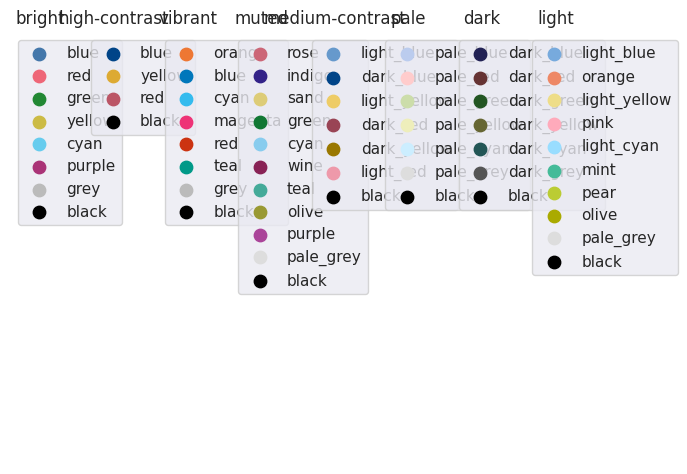

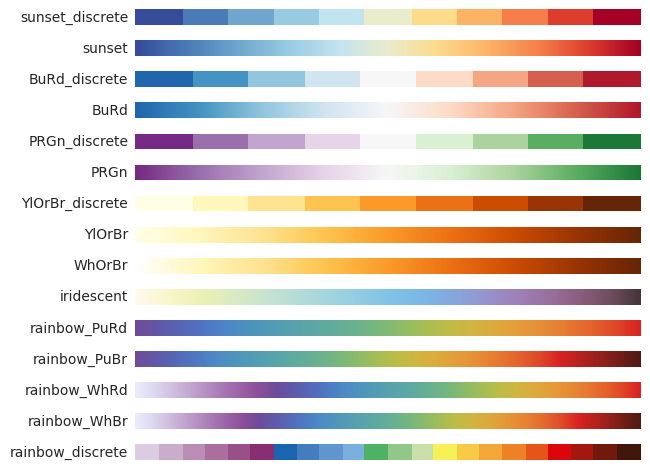

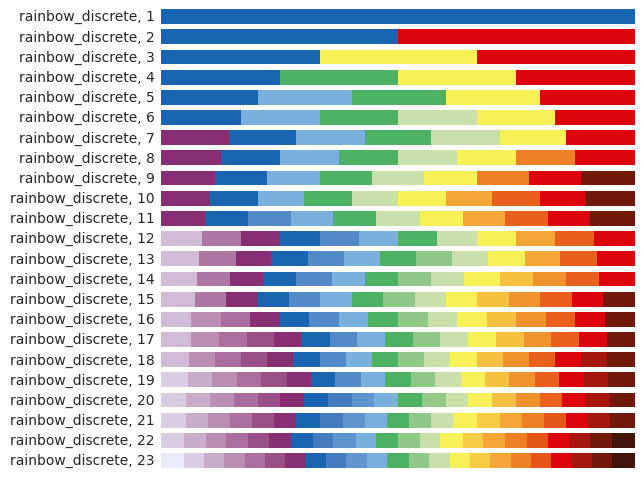

In [8]:
import tol_colors as tc
tc.main()

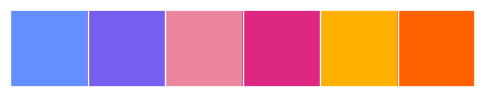

In [9]:
# set palettes
ibm_01 = ["#648FFF", "#785EF0", "#EC869F", "#DC267F", "#FFB000", "#FE6100"]
sns.set_palette(ibm_01)
sns.palplot(sns.color_palette())

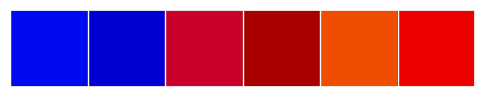

In [10]:
# set palettes
ibm_02 = ["#000aef", "#0000d0", "#c8002b", "#a80000", "#ef4e00", "#ed0000"]
sns.set_palette(ibm_02)
sns.palplot(sns.color_palette())

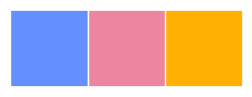

In [11]:
ibm_01_l = ["#648FFF", "#EC869F", "#FFB000"]
sns.set_palette(ibm_01_l)
sns.palplot(sns.color_palette())

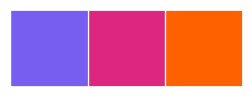

In [12]:
# set palettes
ibm_01_d = [ "#785EF0", "#DC267F", "#FE6100"]
sns.set_palette(ibm_01_d)
sns.palplot(sns.color_palette())

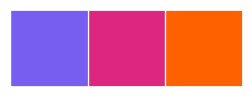

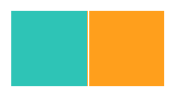

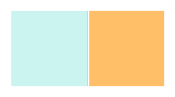

In [13]:
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]
sns.set_palette(palette_scenarios)
sns.palplot(sns.color_palette())
sns.set_palette(palette_treatments_sat)
sns.palplot(sns.color_palette())
sns.set_palette(palette_treatments_pale)
sns.palplot(sns.color_palette())

## Getting sessions information

In [14]:
# highlight sessions and subtasks
def get_session_data(row, i):
    x_start = row.zeroStart#row.Start
    x_end = row["zeroBlackScreen"]#row["Black Screen"]
    label = "{} {}".format(row.Scenario, row.Configuration)
    x_start_walk = row["zeroStartedWalking"]#row["Started Walking"]
    x_to_curb = row["zeroReachedCurb"]#row["Reached Curb"]
    x_start_cross = row["zeroStartedCrossing"] #row["Started Crossing"]
    return label, x_start,x_start_walk, x_to_curb, x_start_cross, x_end

def group_by_session_type(timeseries_folder, timeseries_HR_raw_folder, subtasks_timestamps):
    
    # timeseries_folder = "../processed_data/timeseries_1s_v2_interp1d_lin/"
    participants_timeseries = os.listdir(timeseries_folder) # cleaned and resampled timeseries
    participants_HR_raw = os.listdir(timeseries_HR_raw_folder) # raw HR data

    # subtasks_timestamps = pd.read_csv("../processed_data/timestamps_unix.csv") # data for subtasks and sessions
    
    summary_all_participants_sessions = pd.DataFrame()
    # iterate through individual participants timeseries
    for i in range(len(participants_timeseries)):
        individual_timeseries_file = participants_timeseries[i]
        individual_timeseries_HR_raw_file = participants_HR_raw[i]

        file = timeseries_folder + individual_timeseries_file
    #     print(file)
        participantID = int(file.split("_")[-1].split(".")[0])
        # print("ID ", participantID)
        data_participant_timeseries = pd.read_csv(file) # whole participant record timeseries
        
        file_HR_raw = timeseries_HR_raw_folder + individual_timeseries_HR_raw_file
        data_participant_timeseries_HR_raw = pd.read_csv(file_HR_raw) # whole participant record timeseries HR raw
        
        # display(data_participant_timeseries)
        #zeroing participant timeseries
        participant_zero = data_participant_timeseries.iloc[0].Timestamp
        # print("Participant", i+1)
        # print("zero", participant_zero)
        data_participant_timeseries["zeroTimestamp"] = data_participant_timeseries.Timestamp - participant_zero
        # display(data_participant_timeseries.head(5))
        data_participant_timeseries_HR_raw["zeroTimestamp"] = data_participant_timeseries_HR_raw.timestamp - participant_zero
        # display(data_participant_timeseries_HR_raw.head(5))

        # taking row for participant with observed timestamps for subtasks
        # zeroing subtasks timestamps and matching zeroed participant timeseries
        participant_subtasks_times = subtasks_timestamps[subtasks_timestamps["Participant ID"]==participantID].reset_index(names="old_index_01") # taking only one participant
        # display(participant_subtasks_times)
        
        # print("participants_subtasks_times_START:", participant_subtasks_times["Start"])
        # print("participant zero:", participant_zero)
        participant_subtasks_times.loc[:,"zeroStart"] = participant_subtasks_times["Start"] - participant_zero
        participant_subtasks_times.loc[:,"zeroStartedWalking"] = participant_subtasks_times["Started Walking"] - participant_zero
        participant_subtasks_times.loc[:,"zeroReachedCurb"] = participant_subtasks_times["Reached Curb"] - participant_zero
        participant_subtasks_times.loc[:,"zeroStartedCrossing"] = participant_subtasks_times["Started Crossing"] - participant_zero
        participant_subtasks_times.loc[:,"zeroBlackScreen"] = participant_subtasks_times["Black Screen"] - participant_zero
        
        # create new pandas dataframe to summarize all data from timeseries. Based on subtasks times
        summary_participant_sessions = participant_subtasks_times.copy(deep=True)

        # create new fields for duration of subtasks
        summary_participant_sessions.loc[:,"duration_sub1"] =  summary_participant_sessions["Started Walking"] - summary_participant_sessions["Start"]
        summary_participant_sessions.loc[:,"duration_sub2"] =  summary_participant_sessions["Reached Curb"] - summary_participant_sessions["Started Walking"]
        summary_participant_sessions.loc[:,"duration_sub3"] =  summary_participant_sessions["Started Crossing"] - summary_participant_sessions["Reached Curb"]
        summary_participant_sessions.loc[:,"duration_sub4"] =  summary_participant_sessions["Black Screen"] - summary_participant_sessions["Started Crossing"]
        # display(summary_participant_sessions)
        
        ############ creating baseline for HR
        # display(summary_participant_sessions)
        zero_start_experiment = summary_participant_sessions.loc[0, "zeroStart"]
        baseline_data_participant_timeseries_session =  data_participant_timeseries[data_participant_timeseries.zeroTimestamp<zero_start_experiment]#.iloc[-250:] # we can decide to cut the data or to use the whole period
        baseline_data_participant_timeseries_session_HR_raw =  data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp<zero_start_experiment) & (data_participant_timeseries_HR_raw.zeroTimestamp>(zero_start_experiment))]#.iloc[-250:] -2550000
        
        if len(baseline_data_participant_timeseries_session)==0:
            baseline_data_participant_timeseries_session = data_participant_timeseries.iloc[0:250]
            baseline_data_participant_timeseries_session_HR_raw = data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp>zero_start_experiment) & (data_participant_timeseries_HR_raw.zeroTimestamp<zero_start_experiment+250000)]
        baseline_data_participant_timeseries_session = baseline_data_participant_timeseries_session["Heart Rate"].dropna()
        # print(len(baseline_data_participant_timeseries_session))
        
        # display(baseline_data_participant_timeseries_session)
        
        baseline_HR_mean = baseline_data_participant_timeseries_session.mean()
        baseline_HR_std = baseline_data_participant_timeseries_session.std()
        baseline_HR_len = len(baseline_data_participant_timeseries_session)
        # print(zero_start_experiment, len(list(baseline_data_participant_timeseries_session["Heart Rate"])))
        summary_participant_sessions.loc[:,"baseline_heart_rate_timeseries"] = np.nan
        summary_participant_sessions.loc[:,"baseline_heart_rate_mean"] = np.nan
        summary_participant_sessions.loc[:,"baseline_heart_rate_std"] = np.nan
        summary_participant_sessions = summary_participant_sessions.astype({"baseline_heart_rate_timeseries": object})
        #HR raw
        summary_participant_sessions.loc[:,"baseline_HR_raw_timeseries"] = np.nan
        summary_participant_sessions.loc[:,"baseline_HR_raw_RRintervals"] = np.nan
        summary_participant_sessions.loc[:,"baseline_HR_raw_zeroTimestamps"] = np.nan
        summary_participant_sessions = summary_participant_sessions.astype({"baseline_HR_raw_timeseries": object,
                                                                            "baseline_HR_raw_RRintervals": object,
                                                                           "baseline_HR_raw_zeroTimestamps": object})
        
        # subtasks
        subtasks_list = ["whole", "sub1", "sub2", "sub3", "sub4"]
        
        for period in subtasks_list:
            
        
            # create new fields in the summary
            summary_participant_sessions.loc[:,"{}_HR_raw_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_HR_raw_RRintervals".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_HR_raw_zeroTimestamps".format(period)] = np.nan
            
            summary_participant_sessions.loc[:,"{}_heart_rate_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_heart_rate_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_heart_rate_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_HR_delta_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_HR_delta_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_HR_delta_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_displacement_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_displacement_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_displacement_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_distance_walked".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_angle_change_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_angle_change_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_angle_change_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_a_change_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_a_change_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_a_change_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_b_change_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_b_change_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_b_change_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_c_change_timeseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_c_change_mean".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_c_change_std".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_car_dist_1_timerseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_car_dist_2_timerseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_car_dist_3_timerseries".format(period)] = np.nan
            summary_participant_sessions.loc[:,"{}_car_dist_4_timerseries".format(period)] = np.nan

            summary_participant_sessions = summary_participant_sessions.astype({"{}_HR_raw_timeseries".format(period): object,
                                                                                "{}_HR_raw_RRintervals".format(period): object,
                                                                                "{}_HR_raw_zeroTimestamps".format(period): object,
                                                                                "{}_heart_rate_timeseries".format(period): object,
                                                                                "{}_HR_delta_timeseries".format(period): object,
                                                                                "{}_displacement_timeseries".format(period): object,
                                                                                "{}_angle_change_timeseries".format(period): object,
                                                                                "{}_a_change_timeseries".format(period): object,
                                                                                "{}_b_change_timeseries".format(period): object,
                                                                                "{}_c_change_timeseries".format(period): object,
                                                                                "{}_car_dist_1_timerseries".format(period): object,
                                                                                "{}_car_dist_2_timerseries".format(period): object,
                                                                                "{}_car_dist_3_timerseries".format(period): object,
                                                                                "{}_car_dist_4_timerseries".format(period): object})

        # divide individual participants timeseries per session
        # and populate new fields with sessions cropped data from the entire timeseries
        
        for index, row in participant_subtasks_times.iterrows(): #one row for session
            # print("j: ", index)

            label, x_start, x_start_walk, x_to_curb, x_start_cross, x_end = get_session_data(row, index) # participant_subtasks_times.apply(lambda row: get_session_data(row, i), axis=1)
            
            ### saving baseline HR data
            # HR raw
            summary_participant_sessions.at[index, "baseline_HR_raw_timeseries"] = list(baseline_data_participant_timeseries_session_HR_raw["heart_rate"].values)
            summary_participant_sessions.at[index, "baseline_HR_raw_RRintervals"] = list(baseline_data_participant_timeseries_session_HR_raw["RR_intervals"].values)
            summary_participant_sessions.at[index, "baseline_HR_raw_zeroTimestamps"] = list(baseline_data_participant_timeseries_session_HR_raw["zeroTimestamp"].values)
            
            # resampled HR
            summary_participant_sessions.at[index, "baseline_heart_rate_timeseries"] = baseline_data_participant_timeseries_session
            summary_participant_sessions.at[index, "baseline_heart_rate_mean"] = baseline_HR_mean
            summary_participant_sessions.at[index, "baseline_heart_rate_std"] = baseline_HR_std
            summary_participant_sessions.at[index, "baseline_heart_rate_len"] = baseline_HR_len
    
            data_participant_timeseries["HR_delta"] = data_participant_timeseries["Heart Rate"] - baseline_HR_mean
            # print(i, baseline_HR_mean)
            # display(data_participant_timeseries["HR_corrected"])
            # display(data_participant_timeseries["Heart Rate"])
            
            for period in subtasks_list:
                # correction factor for durations=0
                if ((period!="whole") and (summary_participant_sessions.at[index,"duration_{}".format(period)] < 1999)): 
                    shift = 10000 #10 secs
                    # display(row)
                else: shift = 0 # no shift
                
                # crop whole individual participant timeseries for the session depending on the period considered
                if period == "whole":
                    data_participant_timeseries_session_HR_raw =  data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp>x_start) & (data_participant_timeseries_HR_raw.zeroTimestamp<x_end)]
                    # display(data_participant_timeseries_session_HR_raw.iloc[-1].zeroTimestamp)
                    # print("len raw:", len(data_participant_timeseries_session_HR_raw))
                    data_participant_timeseries_session =  data_participant_timeseries[(data_participant_timeseries.zeroTimestamp>x_start) & (data_participant_timeseries.zeroTimestamp<x_end)]
                    # display(data_participant_timeseries_session.iloc[-1].zeroTimestamp)
                    # print("len resampled:", len(data_participant_timeseries_session))
                elif period == "sub1":
                    data_participant_timeseries_session_HR_raw =  data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp>(x_start-shift)) & (data_participant_timeseries_HR_raw.zeroTimestamp<(x_start_walk+shift))]
                    data_participant_timeseries_session =  data_participant_timeseries[(data_participant_timeseries.zeroTimestamp>(x_start-shift)) & (data_participant_timeseries.zeroTimestamp<(x_start_walk+shift))]
                    # print("from:", x_start, ">", x_start-shift, "TO", x_start_walk, ">", x_start_walk+shift)
                elif period == "sub2":
                    data_participant_timeseries_session_HR_raw =  data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp>(x_start_walk-shift)) & (data_participant_timeseries_HR_raw.zeroTimestamp<(x_to_curb+shift))]
                    data_participant_timeseries_session =  data_participant_timeseries[(data_participant_timeseries.zeroTimestamp>(x_start_walk-shift)) & (data_participant_timeseries.zeroTimestamp<(x_to_curb+shift))]
                elif period == "sub3":
                    data_participant_timeseries_session_HR_raw =  data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp>(x_to_curb-shift)) & (data_participant_timeseries_HR_raw.zeroTimestamp<(x_start_cross+shift))]
                    data_participant_timeseries_session =  data_participant_timeseries[(data_participant_timeseries.zeroTimestamp>(x_to_curb-shift)) & (data_participant_timeseries.zeroTimestamp<(x_start_cross+shift))]
                elif period == "sub4":
                    data_participant_timeseries_session_HR_raw =  data_participant_timeseries_HR_raw[(data_participant_timeseries_HR_raw.zeroTimestamp>(x_start_cross-shift)) & (data_participant_timeseries_HR_raw.zeroTimestamp<(x_end+shift))]
                    data_participant_timeseries_session =  data_participant_timeseries[(data_participant_timeseries.zeroTimestamp>(x_start_cross-shift)) & (data_participant_timeseries.zeroTimestamp<(x_end+shift))]
                
                # if ((period!="whole") and (summary_participant_sessions.at[index,"duration_{}".format(period)] == 0)):
                    # print("apply shift:", shift)
                    # print(list(data_participant_timeseries.zeroTimestamp)[0], "to", list(data_participant_timeseries.zeroTimestamp)[-1])
                    # print(label, x_start, x_start_walk, x_to_curb, x_start_cross, x_end)
                    # print("duration:", summary_participant_sessions.at[index,"duration_{}".format(period)], "\n", list(data_participant_timeseries_session.zeroTimestamp))
                if len(list(data_participant_timeseries_session.zeroTimestamp))<1:
                    print(participantID, label, "\n", list(data_participant_timeseries_session.zeroTimestamp))
                
                # display(summary_participant_sessions)
                summary_participant_sessions.at[index, "{}_displacement_timeseries".format(period)] = data_participant_timeseries_session.Distance.values
                summary_participant_sessions.at[index, "{}_displacement_mean".format(period)] = data_participant_timeseries_session.Distance.mean()
                summary_participant_sessions.at[index, "{}_displacement_std".format(period)] = data_participant_timeseries_session.Distance.std()
                summary_participant_sessions.at[index, "{}_distance_walked".format(period)] = data_participant_timeseries_session.Distance.sum()
                
                # HR raw
                summary_participant_sessions.at[index, "{}_HR_raw_timeseries".format(period)] = list(data_participant_timeseries_session_HR_raw["heart_rate"].values)
                summary_participant_sessions.at[index, "{}_HR_raw_RRintervals".format(period)] = list(data_participant_timeseries_session_HR_raw["RR_intervals"].values)
                summary_participant_sessions.at[index, "{}_HR_raw_zeroTimestamps".format(period)] = list(data_participant_timeseries_session_HR_raw["zeroTimestamp"].values)
                
                
                # resampled HR
                summary_participant_sessions.at[index, "{}_heart_rate_timeseries".format(period)] = list(data_participant_timeseries_session["Heart Rate"].values)
                summary_participant_sessions.at[index, "{}_heart_rate_mean".format(period)] = data_participant_timeseries_session["Heart Rate"].mean()
                summary_participant_sessions.at[index, "{}_heart_rate_std".format(period)] = data_participant_timeseries_session["Heart Rate"].std()
                
                summary_participant_sessions.at[index, "{}_HR_delta_timeseries".format(period)] = list(data_participant_timeseries_session["HR_delta"].values)
                summary_participant_sessions.at[index, "{}_HR_delta_mean".format(period)] = data_participant_timeseries_session["HR_delta"].mean()
                summary_participant_sessions.at[index, "{}_HR_delta_std".format(period)] = data_participant_timeseries_session["HR_delta"].std()

                summary_participant_sessions.at[index, "{}_car_dist_1_timerseries".format(period)] = data_participant_timeseries_session["Car Dist 1"].values
                summary_participant_sessions.at[index, "{}_car_dist_2_timerseries".format(period)] = data_participant_timeseries_session["Car Dist 2"].values
                summary_participant_sessions.at[index, "{}_car_dist_3_timerseries".format(period)] = data_participant_timeseries_session["Car Dist 3"].values
                summary_participant_sessions.at[index, "{}_car_dist_4_timerseries".format(period)] = data_participant_timeseries_session["Car Dist 4"].values

                summary_participant_sessions.at[index, "{}_angle_change_timeseries".format(period)] = data_participant_timeseries_session["Angle Change"].values
                summary_participant_sessions.at[index, "{}_angle_change_mean".format(period)] = data_participant_timeseries_session["Angle Change"].mean()
                summary_participant_sessions.at[index, "{}_angle_change_std".format(period)] = data_participant_timeseries_session["Angle Change"].std()
                summary_participant_sessions.at[index, "{}_a_change_timeseries".format(period)] = data_participant_timeseries_session["a Change"].values
                summary_participant_sessions.at[index, "{}_a_change_mean".format(period)] = data_participant_timeseries_session["a Change"].mean()
                summary_participant_sessions.at[index, "{}_a_change_std".format(period)] = data_participant_timeseries_session["a Change"].std()
                summary_participant_sessions.at[index, "{}_b_change_timeseries".format(period)] = data_participant_timeseries_session["b Change"].values
                summary_participant_sessions.at[index, "{}_b_change_mean".format(period)] = data_participant_timeseries_session["b Change"].mean()
                summary_participant_sessions.at[index, "{}_b_change_std".format(period)] = data_participant_timeseries_session["b Change"].std()
                summary_participant_sessions.at[index, "{}_c_change_timeseries".format(period)] = data_participant_timeseries_session["c Change"].values
                summary_participant_sessions.at[index, "{}_c_change_mean".format(period)] = data_participant_timeseries_session["c Change"].mean()
                summary_participant_sessions.at[index, "{}_c_change_std".format(period)] = data_participant_timeseries_session["c Change"].std()
            # print("rows: ", len(summary_participant_sessions))
        # if participantID<10: display(summary_participant_sessions)
        summary_all_participants_sessions = pd.concat([summary_all_participants_sessions, summary_participant_sessions])     
        # display(summary_all_participants_sessions)
        
    return summary_all_participants_sessions.reset_index(names="old_index_02")#, data_participant_timeseries

In [15]:
timeseries_folder = "../processed_data/timeseries_1s_v2_interp1d_lin/"
timeseries_HR_raw_folder = "../processed_data/timeseries_HR_raw/"
subtasks_timestamps = pd.read_csv("../processed_data/timestamps_unix.csv")
summary_all_participants_sessions = group_by_session_type(timeseries_folder, timeseries_HR_raw_folder, subtasks_timestamps)

6 A RH 
 []
6 A RH 
 []
6 A RH 
 []


In [16]:
# timeseries

In [17]:
# summary_all_participants_sessions

In [18]:
# timeseries[(timeseries.zeroTimestamp>(531799.0-10000)) & (timeseries.zeroTimestamp<(531799.0+10000))]

### (testing and debugging)

In [19]:
# summary_all_participants_sessions.dtypes
# summary_all_participants_sessions[(summary_all_participants_sessions["Participant ID"]==2)]
# print failed sessions for debugging
len(summary_all_participants_sessions[(summary_all_participants_sessions["Successful?"]==False)])

13

In [20]:
summary_all_participants_sessions[summary_all_participants_sessions["whole_heart_rate_mean"]<50]#[["index", "Participant ID", "Day", "Session Nr", "Scenario", "Configuration", "Successful?", "Start", "Started Walking", "Reached Curb", "Started Crossing", "Black Screen", "duration_subtask1", "duration_subtask2", "duration_subtask3", "duration_subtask4"]]

,old_index_02,old_index_01,Participant ID,Day,Session Nr,Scenario,Configuration,Successful?,Start,Started Walking,Reached Curb,Started Crossing,Black Screen,zeroStart,zeroStartedWalking,zeroReachedCurb,zeroStartedCrossing,zeroBlackScreen,duration_sub1,duration_sub2,duration_sub3,duration_sub4,baseline_heart_rate_timeseries,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_HR_raw_timeseries,baseline_HR_raw_RRintervals,baseline_HR_raw_zeroTimestamps,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps,whole_heart_rate_timeseries,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_timeseries,whole_HR_delta_mean,whole_HR_delta_std,whole_displacement_timeseries,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_timeseries,whole_angle_change_mean,whole_angle_change_std,whole_a_change_timeseries,whole_a_change_mean,whole_a_change_std,whole_b_change_timeseries,whole_b_change_mean,whole_b_change_std,whole_c_change_timeseries,whole_c_change_mean,whole_c_change_std,whole_car_dist_1_timerseries,whole_car_dist_2_timerseries,whole_car_dist_3_timerseries,whole_car_dist_4_timerseries,sub1_HR_raw_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_zeroTimestamps,sub1_heart_rate_timeseries,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_timeseries,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_displacement_timeseries,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_timeseries,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_timeseries,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_timeseries,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_timeseries,sub1_c_change_mean,sub1_c_change_std,sub1_car_dist_1_timerseries,sub1_car_dist_2_timerseries,sub1_car_dist_3_timerseries,sub1_car_dist_4_timerseries,sub2_HR_raw_timeseries,sub2_HR_raw_RRintervals,sub2_HR_raw_zeroTimestamps,sub2_heart_rate_timeseries,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_timeseries,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_displacement_timeseries,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_timeseries,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_timeseries,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_timeseries,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_timeseries,sub2_c_change_mean,sub2_c_change_std,sub2_car_dist_1_timerseries,sub2_car_dist_2_timerseries,sub2_car_dist_3_timerseries,sub2_car_dist_4_timerseries,sub3_HR_raw_timeseries,sub3_HR_raw_RRintervals,sub3_HR_raw_zeroTimestamps,sub3_heart_rate_timeseries,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_timeseries,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_displacement_timeseries,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_timeseries,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_timeseries,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_timeseries,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_timeseries,sub3_c_change_mean,sub3_c_change_std,sub3_car_dist_1_timerseries,sub3_car_dist_2_timerseries,sub3_car_dist_3_timerseries,sub3_car_dist_4_timerseries,sub4_HR_raw_timeseries,sub4_HR_raw_RRintervals,sub4_HR_raw_zeroTimestamps,sub4_heart_rate_timeseries,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_timeseries,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_displacement_timeseries,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_timeseries,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_timeseries,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_timeseries,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_timeseries,sub4_c_change_mean,sub4_c_change_std,sub4_car_dist_1_timerseries,sub4_car_dist_2_timerseries,sub4_car_dist_3_timerseries,sub4_car_dist_4_timerseries,baseline_heart_rate_len
32,0,32,6,1,7,A,RH,False,1662387374377,1662387388377,1662387388377,1662387395377,1662387407377,-29623.0,-15623.0,-15623.0,-8623.0,33

In [21]:
# summary_all_participants_sessions[summary_all_participants_sessions["Successful?"]==False]
summary_all_participants_sessions[(summary_all_participants_sessions["Participant ID"]==2) & (summary_all_participants_sessions["Scenario"]=="A") & (summary_all_participants_sessions["Configuration"]=="EV")]

,old_index_02,old_index_01,Participant ID,Day,Session Nr,Scenario,Configuration,Successful?,Start,Started Walking,Reached Curb,Started Crossing,Black Screen,zeroStart,zeroStartedWalking,zeroReachedCurb,zeroStartedCrossing,zeroBlackScreen,duration_sub1,duration_sub2,duration_sub3,duration_sub4,baseline_heart_rate_timeseries,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_HR_raw_timeseries,baseline_HR_raw_RRintervals,baseline_HR_raw_zeroTimestamps,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps,whole_heart_rate_timeseries,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_timeseries,whole_HR_delta_mean,whole_HR_delta_std,whole_displacement_timeseries,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_timeseries,whole_angle_change_mean,whole_angle_change_std,whole_a_change_timeseries,whole_a_change_mean,whole_a_change_std,whole_b_change_timeseries,whole_b_change_mean,whole_b_change_std,whole_c_change_timeseries,whole_c_change_mean,whole_c_change_std,whole_car_dist_1_timerseries,whole_car_dist_2_timerseries,whole_car_dist_3_timerseries,whole_car_dist_4_timerseries,sub1_HR_raw_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_zeroTimestamps,sub1_heart_rate_timeseries,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_timeseries,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_displacement_timeseries,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_timeseries,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_timeseries,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_timeseries,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_timeseries,sub1_c_change_mean,sub1_c_change_std,sub1_car_dist_1_timerseries,sub1_car_dist_2_timerseries,sub1_car_dist_3_timerseries,sub1_car_dist_4_timerseries,sub2_HR_raw_timeseries,sub2_HR_raw_RRintervals,sub2_HR_raw_zeroTimestamps,sub2_heart_rate_timeseries,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_timeseries,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_displacement_timeseries,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_timeseries,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_timeseries,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_timeseries,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_timeseries,sub2_c_change_mean,sub2_c_change_std,sub2_car_dist_1_timerseries,sub2_car_dist_2_timerseries,sub2_car_dist_3_timerseries,sub2_car_dist_4_timerseries,sub3_HR_raw_timeseries,sub3_HR_raw_RRintervals,sub3_HR_raw_zeroTimestamps,sub3_heart_rate_timeseries,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_timeseries,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_displacement_timeseries,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_timeseries,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_timeseries,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_timeseries,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_timeseries,sub3_c_change_mean,sub3_c_change_std,sub3_car_dist_1_timerseries,sub3_car_dist_2_timerseries,sub3_car_dist_3_timerseries,sub3_car_dist_4_timerseries,sub4_HR_raw_timeseries,sub4_HR_raw_RRintervals,sub4_HR_raw_zeroTimestamps,sub4_heart_rate_timeseries,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_timeseries,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_displacement_timeseries,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_timeseries,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_timeseries,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_timeseries,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_timeseries,sub4_c_change_mean,sub4_c_change_std,sub4_car_dist_1_timerseries,sub4_car_dist_2_timerseries,sub4_car_dist_3_timerseries,sub4_car_dist_4_timerseries,baseline_heart_rate_len
8,2,8,2,1,2,A,EV,True,1662371739654,1662371740654,1662371750654,1662371754654,1662371771654,495654.0,496654.0,506654.0,510654.0,5276

In [22]:
# Drop scenario RH A for participant 6 (1st scenario). Missing heart rate records, abnormally low values of heart rate and unsuccesful crossing.
summary_all_participants_sessions = summary_all_participants_sessions[summary_all_participants_sessions["whole_heart_rate_mean"]>50].reset_index(drop=True)

### grouping

In [23]:
print(len(summary_all_participants_sessions))
summary_all_participants_sessions[summary_all_participants_sessions["Participant ID"]==2][["Scenario","Configuration",  "whole_heart_rate_mean"]]

266


,Scenario,Configuration,whole_heart_rate_mean
6,A,RH,85.086961
7,A,RH,83.715558
8,A,EV,83.012425
9,B,RH,84.530868
10,B,EV,87.684952
11,C,RH,86.772299
12,C,EV,83.918851


In [24]:
data_single = summary_all_participants_sessions.groupby(["Participant ID", "Scenario", "Configuration"],as_index=False).mean()
print(len(data_single))
data_single[data_single["Participant ID"]==2][["Scenario","Configuration","whole_heart_rate_mean"]]

255


,Scenario,Configuration,whole_heart_rate_mean
6,A,EV,83.012425
7,A,RH,84.401259
8,B,EV,87.684952
9,B,RH,84.530868
10,C,EV,83.918851
11,C,RH,86.772299


In [25]:
# summary_all_participants_sessions.groupby(["Participant ID", "Scenario", "Configuration"]).mean()

## open Qualtrics participants' sessions info

In [26]:
qualtrics_sessions_info = pd.read_csv("../Qualtrics/Qualtrics_clean_ordered_v0.02.csv")

In [27]:
qualtrics_sessions_info.head(3)

,Participant ID,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_success,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_success,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_success,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,EndDate,ResponseId,StartDate,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_success,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_success,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_success,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,city_live,city_raised,country_live,country_raised,driving_license,duration,experience_vr,experiments,fav,fav_duration,gender,km_drive,m_walk,neighborhood,own_car,pref_transport,study,treatment,treatment_group,treatment_scenario_order,txt_advantage,txt_advantage_duration,txt_change,txt_change_duration,txt_diff,txt_diff_duration,yob,fav_recoded
0,1,7.0,3.0,1.0,1.0,2.0,3.0,75.077,2.0,2.0,2.0,1.0,4.0,23.161,5.0,6.0,25.867,7.0,1.0,1.0,2.0,2.0,2.0,30.960,1.0,2.0,3.0,1.0,yes,10.0,10.0,13.648,2.0,6.595,6.0,4.0,18.817,7.0,4.0,2.0,3.0,1.0,3.0,32.432,1.0,2.0,3.0,1.0,yes,7.0,6.0,18.624,2.0,9.733,5.0,4.0,12.379,8.0,4.0,2.0,3.0,3.0,2.0,35.996,1.0,2.0,2.0,1.0,yes,7.0,4.0,10.639,2022-09-05 02:42:20,R_3hDBemXpdgDxd1h,2022-09-05 01:19:25,4.0,23.161,5.0,6.0,25.867,7.0,0.0,1.0,-2.0,1.0,0.0,2.0,1.0,2.0,0.0,2.0,-1.0,30.960,1.0,-1.0,2.0,0.0,3.0,1.0,1.0,0.0,yes,10.0,10.0,13.648,2.0,6.595,6.0,4.0,18.817,7.0,0.0,4.0,1.0,2.0,1.0,3.0,2.0,1.0,-1.0,3.0,0.0,32.432,1.0,-1.0,2.0,0.0,3.0,1.0,1.0,0.0,yes,7.0,6.0,18.624,2.0,9.733,5.0,4.0,12.379,8.0,1.0,4.0,1.0,2.0,1.0,3.0,2.0,3.0,1.0,2.0,-1.0,35.996,1.0,-1.0,2.0,0.0,2.0,0.0,1.0,0.0,yes,7.0,4.0,10.639,Winterthur,G

In [28]:
set(qualtrics_sessions_info.country_live)

{'Italy', 'Switzerland', 'Turkey'}

## merge both sensors data + Qualtrics surveys data

In [29]:
data = pd.merge(summary_all_participants_sessions, qualtrics_sessions_info, on='Participant ID')

In [30]:
data.head(3)
# data.a_sss_active_delta.values

,old_index_02,old_index_01,Participant ID,Day,Session Nr,Scenario,Configuration,Successful?,Start,Started Walking,Reached Curb,Started Crossing,Black Screen,zeroStart,zeroStartedWalking,zeroReachedCurb,zeroStartedCrossing,zeroBlackScreen,duration_sub1,duration_sub2,duration_sub3,duration_sub4,baseline_heart_rate_timeseries,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_HR_raw_timeseries,baseline_HR_raw_RRintervals,baseline_HR_raw_zeroTimestamps,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps,whole_heart_rate_timeseries,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_timeseries,whole_HR_delta_mean,whole_HR_delta_std,whole_displacement_timeseries,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_timeseries,whole_angle_change_mean,whole_angle_change_std,whole_a_change_timeseries,whole_a_change_mean,whole_a_change_std,whole_b_change_timeseries,whole_b_change_mean,whole_b_change_std,whole_c_change_timeseries,whole_c_change_mean,whole_c_change_std,whole_car_dist_1_timerseries,whole_car_dist_2_timerseries,whole_car_dist_3_timerseries,whole_car_dist_4_timerseries,sub1_HR_raw_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_zeroTimestamps,sub1_heart_rate_timeseries,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_timeseries,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_displacement_timeseries,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_timeseries,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_timeseries,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_timeseries,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_timeseries,sub1_c_change_mean,sub1_c_change_std,sub1_car_dist_1_timerseries,sub1_car_dist_2_timerseries,sub1_car_dist_3_timerseries,sub1_car_dist_4_timerseries,sub2_HR_raw_timeseries,sub2_HR_raw_RRintervals,sub2_HR_raw_zeroTimestamps,sub2_heart_rate_timeseries,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_timeseries,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_displacement_timeseries,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_timeseries,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_timeseries,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_timeseries,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_timeseries,sub2_c_change_mean,sub2_c_change_std,sub2_car_dist_1_timerseries,sub2_car_dist_2_timerseries,sub2_car_dist_3_timerseries,sub2_car_dist_4_timerseries,sub3_HR_raw_timeseries,sub3_HR_raw_RRintervals,sub3_HR_raw_zeroTimestamps,sub3_heart_rate_timeseries,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_timeseries,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_displacement_timeseries,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_timeseries,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_timeseries,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_timeseries,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_timeseries,sub3_c_change_mean,sub3_c_change_std,sub3_car_dist_1_timerseries,sub3_car_dist_2_timerseries,sub3_car_dist_3_timerseries,sub3_car_dist_4_timerseries,sub4_HR_raw_timeseries,sub4_HR_raw_RRintervals,sub4_HR_raw_zeroTimestamps,sub4_heart_rate_timeseries,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_timeseries,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_displacement_timeseries,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_timeseries,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_timeseries,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_timeseries,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_timeseries,sub4_c_change_mean,sub4_c_change_std,sub4_car_dist_1_timerseries,sub4_car_dist_2_timerseries,sub4_car_dist_3_timerseries,sub4_car_dist_4_timerseries,baseline_heart_rate_len,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_imp

In [31]:
len(data[data["Successful?"]==False])

12

In [32]:
len(data)

266

In [33]:
len(data.dropna(subset = dv_repeated_HR_num))

NameError: name 'dv_repeated_HR_num' is not defined

In [35]:
data.loc[data[dv_repeated_HR_num].isnull().any(axis=1)][iv_grouping + iv_treatments + dv_repeated_HR_num]

NameError: name 'dv_repeated_HR_num' is not defined

In [ ]:
data = data.dropna(subset = dv_repeated_HR_num)

## adding columns for extended and combined metrics

### creating new temporal indexes for repeated mesures within subjects

#### order with all possibilities clean
It leaves empty indexes for second chances. Scattered data.

In [36]:
# set(data["scenario+config_recoded"].values)
# # remap real order

# def map_real_order_clean(row):
#     scenario = row["Scenario"]

# for participant_id in set(data["Participant ID"].values):
#     data_temp = data[(data["Participant ID"]==participant_id)]
#     num_sessions = len(data_temp)
#     print(participant_id, num_sessions)
    # data_temp = data_temp.apply(lambda row: map_real_order_clean(row), axis=1)
data['real_order_clean'] = 0#np.nan
previous_scenario = None # reset scenario
previous_id = None
previous_configuration = None
for index, row in data.iterrows():
    _id = row["Participant ID"]
    scenario = row["Scenario"].lower()
    if scenario != previous_scenario or previous_scenario ==  None or _id != previous_id or previous_id==None: i=0 #reset i based on ids and scenarios scenarios
    tenth = row["treatment_scenario_order"].rfind(scenario)*10
    configuration = row["Configuration"]
    if previous_configuration == None: config=0 #first iteration
    elif (previous_id==_id and previous_scenario==scenario and previous_configuration!=configuration and (i==1 or i==3)): config=1 #succesful
    elif (previous_id==_id and previous_scenario==scenario and previous_configuration==configuration and (i==1 or i==3)): config=0 #unsuccesful
    elif (previous_id==_id and previous_scenario!=scenario and i==0): config=0 #change scenario
    elif (previous_id==_id and previous_scenario!=scenario and (i==1 or i==3)): config=0 #change scenario
    elif (previous_id!=_id and previous_scenario!=scenario and i==0): config=0 #change id
    elif (previous_id!=_id and previous_scenario!=scenario and (i==1 or i==3)): config=0 #change id
    elif (previous_id!=_id and i==0): config=0 #change id
    elif (previous_id!=_id and (i==1 or i==3)): config=0 #change id
    # if (configuration == previous_configuration or 
    #     previous_configuration==None) and (scenario == previous_scenario or previous_scenario==None) and (previous_id==_id or [previous_id==None]) and (i==0 or i==2): config=0
    # elif (configuration != previous_configuration) and (scenario == previous_scenario) and (previous_id==_id) and (i==0 or i==2): config = 2
    # elif (configuration != previous_configuration) and (scenario == previous_scenario) and (previous_id==_id) and (i==1 or i==3): config = 0
    # else: config=0
    data.loc[index, "real_order_clean"] = tenth+i+config
    # print(row["real_order_clean"])
    # print(_id, row["treatment_scenario_order"], scenario.upper(), row["Configuration"], row["old_index_02"],tenth+i+config , "config:", config)
    previous_id = _id # keep tracking of id
    previous_scenario = scenario # keep tracking of scenario
    previous_configuration = configuration # keep tracking of configuration
    i+=1
data = data.astype({"real_order_clean": int})

#### Raw order
Without leaving gaps in between measurements

In [37]:
data["real_order_raw"] = np.nan
previous_id = None
previous_index = -1
for index, row in data.iterrows():
    _id = row["Participant ID"]
    if _id != previous_id or previous_id==None: 
        i=0 #init / reset count
        previous_id = _id
    elif _id == previous_id and row["old_index_02"]>previous_index:
        previous_index = row["old_index_02"]
    data.loc[index, "real_order_raw"] = i
    # print(row["Participant ID"], row["old_index_02"], row["real_order_clean"], i)
    i+=1
data = data.astype({"real_order_raw": int})

### remapping columns values

In [38]:
set(data.neighborhood.values)

{'city center/downtown',
 'compact walkable neighborhood',
 'low density suburb',
 'rural area/village'}

In [39]:
def map_hood(row):
    if row["neighborhood"]=="compact walkable neighborhood" or row["neighborhood"]=="city center/downtonw": row["neighborhood_recoded"] = "dense"
    else: row["neighborhood_recoded"] = "sparse"
    return row

def map_km_drive(row):
    if (row["km_drive"]=="10–50" or row["km_drive"]=="50–100" or row["km_drive"]==">100"): row["km_drive_recoded"] = ">10"
    else: row["km_drive_recoded"] = row["km_drive"]
    return row

def map_km_drive_num(row):
    if (row["km_drive"]=="10–50" or row["km_drive"]=="50–100" or row["km_drive"]==">100"): row["km_drive_recoded_num"] = 50
    elif row["km_drive"]=="<10": row["km_drive_recoded_num"] = 5
    else: row["km_drive_recoded_num"] = 0
    return row

# this created a new column with the standard order of complexity
def map_configuration(row):
    if (row["Configuration"]=="RH"): row["Config_recoded"] = "aRH"
    else: row["Config_recoded"] = "pEV"
    return row

def map_experience_vr(row):
    if (row["experience_vr"]=="not"): row["experience_vr_recoded"] = 0
    elif (row["experience_vr"]=="yes"): row["experience_vr_recoded"] = 1
    else: row["experience_vr_recoded"] = row["experience_vr"]
    return row

def map_experiments(row):
    if (row["experiments "]=="0"): row["experiments_recoded"] = 0
    elif (row["experiments "]=="1–3"): row["experiments_recoded"] = 2
    else: row["experiments_recoded"] = 5
    return row

def map_clean_scenario_based_answers(row):
    for (colname,colval) in row.iteritems():
        if colname.startswith("a_") or colname.startswith("b_") or colname.startswith("c_"):
            if row["Scenario"].lower() != colname[0]:
                row[colname] = np.nan
    return row

def map_country_raised_CH(row):
    if (row["country_raised"]!="Switzerland"): row["country_raised_CH"] = 0
    else: row["country_raised_CH"] = 1
    return row

# def map_real_order_clean(row):
#     order = row["treatment_scenario_order"]
    
#     for letter in order:
        
#     set(data["treatment_scenario_order"].values)
#     if row["Scenario"] == "A":
#         if row[""]

data = data.apply(lambda row: map_hood(row), axis=1)
data = data.apply(lambda row: map_km_drive(row), axis=1)
data = data.apply(lambda row: map_km_drive_num(row), axis=1)
data = data.apply(lambda row: map_configuration(row), axis=1)
data = data.apply(lambda row: map_experience_vr(row), axis=1)
data = data.apply(lambda row: map_experiments(row), axis=1)
data = data.apply(lambda row: map_country_raised_CH(row), axis=1)
# data = data.apply(lambda row: map_clean_scenario_based_answers(row), axis=1)

In [40]:
# new name for ID
data["Participant_ID"] = data["Participant ID"]
# Create id for participant + scenario  to leave only unique survey answers
data["unique_ID_Scenario"] = data["Participant ID"].astype(str) + data["Scenario"]
# Create id for participant + scenario  to leave only unique survey answers
data["unique_ID_Config"] = data["Participant ID"].astype(str) + data["Configuration"]
# lets create another column that combines treatment_group with Scenario
data["treatment__scenario"] = data["treatment_group"] + data["Scenario"]
data["scenario__treatment"] = data["Scenario"] + data["treatment_group"]
# column treatment information + gender
data["treatment__gender"] = data["treatment_group"] + data["gender"]
# convert fav field
data["fav_cat"] = data['fav_recoded'].astype('category').cat.codes
# computing age
data["age"] = 2022 - data["yob"]
# and scenario w/ configuration
data["scenario__config"] = data["Scenario"] + data["Configuration"]
# adding field for total duration of all subtasks
data["duration_whole"] = data["duration_sub1"] +  data["duration_sub2"] + data["duration_sub3"] + data["duration_sub4"]
# from the SSS survey, inverting value of {}_sss_active_delta (it is the only positive metric of the survey).
data["a_sss_active_delta_neg"] = -data["a_sss_active_delta"]
data["b_sss_active_delta_neg"] = -data["b_sss_active_delta"]
data["c_sss_active_delta_neg"] = -data["c_sss_active_delta"]
# creating common metric for entire SSS to easy analysis
data["a_sss_avg_delta"] = data[["a_sss_active_delta_neg", "a_sss_alert_delta", "a_sss_angry_delta", "a_sss_annoyed_delta", "a_sss_depressed_delta", "a_sss_disatisfied_delta", "a_sss_grouchy_delta", "a_sss_impatient_delta", "a_sss_irritated_delta", "a_sss_sad_delta"]].mean(axis=1)
data["b_sss_avg_delta"] = data[["b_sss_active_delta_neg", "b_sss_alert_delta", "b_sss_angry_delta", "b_sss_annoyed_delta", "b_sss_depressed_delta", "b_sss_disatisfied_delta", "b_sss_grouchy_delta", "b_sss_impatient_delta", "b_sss_irritated_delta", "b_sss_sad_delta"]].mean(axis=1)
data["c_sss_avg_delta"] = data[["c_sss_active_delta_neg", "c_sss_alert_delta", "c_sss_angry_delta", "c_sss_annoyed_delta", "c_sss_depressed_delta", "c_sss_disatisfied_delta", "c_sss_grouchy_delta", "c_sss_impatient_delta", "c_sss_irritated_delta", "c_sss_sad_delta"]].mean(axis=1)
data["a_sss_std_delta"] = data[["a_sss_active_delta_neg", "a_sss_alert_delta", "a_sss_angry_delta", "a_sss_annoyed_delta", "a_sss_depressed_delta", "a_sss_disatisfied_delta", "a_sss_grouchy_delta", "a_sss_impatient_delta", "a_sss_irritated_delta", "a_sss_sad_delta"]].std(axis=1)
data["b_sss_std_delta"] = data[["b_sss_active_delta_neg", "b_sss_alert_delta", "b_sss_angry_delta", "b_sss_annoyed_delta", "b_sss_depressed_delta", "b_sss_disatisfied_delta", "b_sss_grouchy_delta", "b_sss_impatient_delta", "b_sss_irritated_delta", "b_sss_sad_delta"]].std(axis=1)
data["c_sss_std_delta"] = data[["c_sss_active_delta_neg", "c_sss_alert_delta", "c_sss_angry_delta", "c_sss_annoyed_delta", "c_sss_depressed_delta", "c_sss_disatisfied_delta", "c_sss_grouchy_delta", "c_sss_impatient_delta", "c_sss_irritated_delta", "c_sss_sad_delta"]].std(axis=1)
# data[data["Participant ID"]==2]#.head(10)

# adding more groups for 2-WAY ANOVA
data["treatment__hood"] = data["treatment_group"] + data["neighborhood_recoded"]
data["treatment__km_drive"] = data["treatment_group"] + data["km_drive_recoded"]
data["scenario__config_recoded"] = data["Scenario"] + data["Config_recoded"]

In [41]:
set(data["treatment_scenario_order"])

{'abc', 'acb', 'bac', 'bca', 'cab', 'cba'}

In [42]:
# print(set(data.experience_vr.values))
# print(set(data["experiments "].values))
# data[["experience_vr", "experience_vr_recoded", "experiments ", "experiments_recoded"]]

### HRV (Heart Rate Variability)

In [72]:
# if NaN need to be removed, run 1.8.5 for inputing data

In [73]:
def compute_HRV(row):
    # if (row["country_raised"]!="Switzerland"): row["country_raised_CH"] = 0
    # else: row["country_raised_CH"] = 1
    
    periods = ["baseline", "whole", "sub1", "sub2", "sub3", "sub4" ]
    for period in periods:
        HR_timeseries = row["{}_heart_rate_timeseries".format(period)]
        if (len(HR_timeseries)<2):
            print(row["Participant_ID"], row["Scenario"], row.Configuration, len(HR_timeseries))
        if len(HR_timeseries)>1:
            HR_mean = statistics.mean(HR_timeseries)
            squared_diff_list = []
            for value in HR_timeseries:
                squared_diff_list.append((value-HR_mean)**2)
            mean_sum_sq_diffs = sum(squared_diff_list)/(len(HR_timeseries)-1)
            # print(mean_sum_sq_diffs)
            try:
                result = math.sqrt(mean_sum_sq_diffs)
            except:
                result = 0
            row["{}_HRV".format(period)] = result
            if period != "baseline":
                row["{}_HRV_delta".format(period)] = row["{}_HRV".format(period)] -  row["baseline_HRV"]
    return row


data = data.apply(lambda row: compute_HRV(row), axis=1)

In [74]:
data[["whole_heart_rate_timeseries","whole_HRV", "whole_HRV_delta", "sub1_HRV", "sub1_HRV_delta", "sub2_HRV", "sub2_HRV_delta", "sub3_HRV", "sub3_HRV_delta", "sub4_HRV", "sub4_HRV_delta"]]

,whole_heart_rate_timeseries,whole_HRV,whole_HRV_delta,sub1_HRV,sub1_HRV_delta,sub2_HRV,sub2_HRV_delta,sub3_HRV,sub3_HRV_delta,sub4_HRV,sub4_HRV_delta
0,"[84.07194281334176, 84.0, 83.94966173222761, 8...",4.057934,-0.052309,4.023906,-0.086337,3.604093,-0.506150,2.523333,-1.586910,4.655785,0.545542
1,"[90.1606085572717, 89.32448552490898, 87.66453...",2.722837,-1.387406,2.275187,-1.835056,3.786728,-0.323514,3.203383,-0.906860,2.224400,-1.885843
2,"[77.52587130229857, 77.77647650573256, 78.0853...",6.747817,2.637574,8.014462,3.904219,4.891029,0.780786,3.625080,-0.485163,1.907854,-2.202389
3,"[79.54889941989036, 80.0, 80.68749195056465, 8...",2.738299,-1.371944,2.565458,-1.544784,2.327812,-1.782430,2.519110,-1.591133,2.737450,-1.372793
4,"[92.0, 94.64999021082622, 97.0, 99.02409779138...",9.160112,5.049869,8.371136,4.260894,0.873239,-3.237003,3.854007,-0.256235,1.838269,-2.271973
5,"[83.84010090103631, 84.4836586906729, 84.94174...",5.760787,1.650544,0.615436,-3.494807,0.577537,-3.532705,3.356486,-0.753757,4.533063,0.422820
6,"[88.21580196239165, 86.59138095195577, 85.0, 8...",5.189758,-0.653982,3.967381,-1.876359,5.873886,0.030146,5.539248,-0.304492,5.851585,0.007845
7,"[92.75187221590888, 91.2117123918662, 88.0, 84...",4.114812,-1.728928,2.424441,-3.419299,1.770063,-4.073677,1.054737,-4.789004,3.806889,-2.036851
8,"[86.10681632777113, 85.16031238712219, 84.2508...",2.597361,-3.246380,2.166500,-3.677240,1.228448,-4.615293,1.598867,-4.244873,2.546901,-3.296839
9,"[77.766194881523, 80.0, 82.35850437777167, 84....",5.087168,-0.756572,3.047363,-2.796377,0.655955,-5.187785,4.682800,-1.160940,4.731514,-1.112226


### Wavelet and frequency domain analysis for HR

In [77]:
from scipy.integrate import trapz

print(data.iloc[2].Participant_ID, data.iloc[2].Scenario, data.iloc[3].Scenario)
test_HT_timeseries = data.iloc[2].whole_heart_rate_timeseries# + data.iloc[3].whole_heart_rate_timeseries
print(test_HT_timeseries)
# lf_range = (0.04, 0.15)
# hf_range = (0.15, 0.4)
# freqs, psd = signal.welch(test_HT_timeseries, fs=1, nperseg=len(test_HT_timeseries))
# lf_power = np.trapz(psd[(freqs >= lf_range[0]) & (freqs <= lf_range[1])], freqs[(freqs >= lf_range[0]) & (freqs <= lf_range[1])])
# hf_power = np.trapz(psd[(freqs >= hf_range[0]) & (freqs <= hf_range[1])], freqs[(freqs >= hf_range[0]) & (freqs <= hf_range[1])])
# print(lf_power, hf_power)
# lf_hf_ratio = lf_power / hf_power
# print(lf_hf_ratio)

# cond_vlf = (freqs >= 0) & (freqs < 0.04)
# cond_lf = (freqs >= 0.04) & (freqs < 0.15)
# cond_hf = (freqs >= 0.15) & (freqs < 0.4)
    
# # calculate power in each band by integrating the spectral density 
# vlf = trapz(psd[cond_vlf], freqs[cond_vlf])
# lf = trapz(psd[cond_lf], freqs[cond_lf])
# hf = trapz(psd[cond_hf], freqs[cond_hf])
    
# # sum these up to get total power
# total_power = vlf + lf + hf

# # # find which frequency has the most power in each band
# # peak_vlf = fxx[cond_vlf][np.argmax(pxx[cond_vlf])]
# # peak_lf = fxx[cond_lf][np.argmax(pxx[cond_lf])]
# # peak_hf = fxx[cond_hf][np.argmax(pxx[cond_hf])]

# print(lf/hf)

import pyhrv.frequency_domain as fd
import numpy as np

# generate sample heart rate time series


# compute power spectral density
result = fd.welch_psd(test_HT_timeseries, show=False, show_param=False)
plt.close()
result["fft_ratio"]
# Compute LF/HF ratio
# lf, hf = fd.welch_psd(test_HT_timeseries, fs=1, lfhf_ratio=True)

# print("LF/HF ratio:", lf/hf)

# # compute LF/HF ratio
# lf, hf = fd.welch_psd_band_power(freqs, psd, lf=(0.04, 0.15), hf=(0.15, 0.4))
# lf_hf_ratio = lf/hf

# print('LF/HF ratio:', lf_hf_ratio)

import hrv.analysis as hrv_analysis

# # Assuming 'hr' is a list of heart rate values
lf, hf = hrv_analysis.frequency_domain.nni_psd(
    test_HT_timeseries,
    method="welch",
    interp_method="cubic",
    detrend="linear",
    tapers=[1, 1],
    show=False,
    lf_band=(0.04, 0.15),
    hf_band=(0.15, 0.4),
)

lf_hf_ratio = lf / hf
print(lf_hf_ratio)

1 B B
[77.52587130229857, 77.77647650573256, 78.08537241823852, 78.45736588186735, 78.89726373866993, 79.40987283069718, 80.0, 80.71019891680983, 81.73401056408045, 83.30272275294614, 85.64762329454122, 89.0, 93.0, 95.61644934857055, 97.0, 97.8605098016455, 98.37169359242392, 98.57323045914194, 98.50479948860637, 98.20607976762388, 97.71675038300124, 97.07649042154524, 96.32497897006256, 95.50189511535994, 94.64691794424417, 93.79972654352191, 93.0, 92.2716509689854, 91.57552637978644, 90.85670673021164, 90.0602725180696, 89.13130424116883, 88.01488239731793, 86.65608748432545, 85.0, 83.04466677857705, 81.0, 79.16710570103106, 78.0, 77.85289003641462, 78.52783695292723, 79.6888653929762, 81.0, 82.18268274582799, 83.18802491585349, 84.02455512386072, 84.70080198363404, 85.22529410895763, 85.6065601136158, 85.8531286113928, 85.97352821607296, 85.97628754144048, 85.86993520127967, 85.6629998093748, 85.36400997951013, 84.98149432546992, 84.52398146103846]


ModuleNotFoundError: No module named 'hrv'

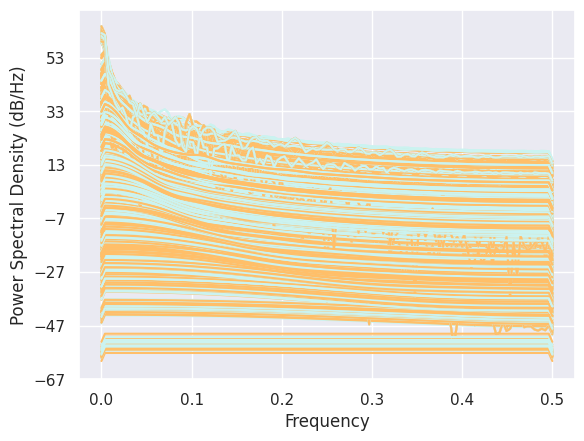

In [78]:
import pywt
from scipy import signal

def compute_wavelet(row):
    periods = ["whole"]#["baseline", "whole", "sub1", "sub2", "sub3", "sub4" ]
    for period in periods:   
        # Perform Wavelet analysis on each scenario's time series
        wavelet = "db4"
        scales = np.arange(1, 128)
        coeffs = pywt.wavedec(row["{}_heart_rate_timeseries".format(period)], "db4", level=6)
        # Calculate the power spectra for each scenario's time series
        power = np.abs(coeffs) ** 2
        # Calculate the average power for each scenario's time series
        avg_power = np.mean(power)
        row["{}_HR_wavelet_avg_pw".format(period)] = list(avg_power)
    return row

def HF_LF_ratio(row):
    # Define the frequency range for LF and HF components
    lf_range = (0.04, 0.15)
    hf_range = (0.15, 0.4)
    periods = ["whole", "baseline", "whole", "sub1", "sub2", "sub3", "sub4" ]
    for period in periods:
        # Calculate the power spectral density (PSD) for each scenario
        
        HR_timeseries = row["{}_heart_rate_timeseries".format(period)]
        coeffs = pywt.wavedec(HR_timeseries, "db4", level=6)
        psd, freqs = plt.psd(HR_timeseries, Fs=1)
        # freqs, psd = signal.welch(HR_timeseries, fs=1, nperseg=len(HR_timeseries))
        lf_power = np.trapz(psd[(freqs >= lf_range[0]) & (freqs <= lf_range[1])], freqs[(freqs >= lf_range[0]) & (freqs <= lf_range[1])])
        hf_power = np.trapz(psd[(freqs >= hf_range[0]) & (freqs <= hf_range[1])], freqs[(freqs >= hf_range[0]) & (freqs <= hf_range[1])])
        lf_hf_ratio = lf_power / hf_power
        # # print(lf_hf_ratio)
        # result = fd.welch_psd(HR_timeseries, show=False, show_param=False)
        # plt.close()
        
        row["{}_HR_LF_HF_ratio".format(period)] = lf_hf_ratio
    return row

# data = data.apply(lambda row: compute_wavelet(row), axis=1)
data = data.apply(lambda row: HF_LF_ratio(row), axis=1)

In [48]:
data[["Participant_ID", "Scenario", "whole_HR_LF_HF_ratio", "baseline_HR_LF_HF_ratio"]]

,Participant_ID,Scenario,whole_HR_LF_HF_ratio,baseline_HR_LF_HF_ratio
0,1,A,3.806735,51.008346
1,1,A,3.322979,51.008346
2,1,B,3.506988,51.008346
3,1,B,3.514271,51.008346
4,1,C,3.335596,51.008346
5,1,C,3.232695,51.008346
6,2,A,3.379375,127.178204
7,2,A,3.216045,127.178204
8,2,A,3.448339,127.178204
9,2,B,3.763078,127.178204


## Classifying variables names

In [79]:
## Independent Variables (IV) - PREDICTORS
iv_treatments = [
    "treatment_group",
    "Scenario",
    "Configuration",
    "Config_recoded"
]

iv_grouping = [
    "Participant_ID",
    "old_index_02",
    "real_order_clean",
    "real_order_raw"
]

iv_covar_cat = [
    "neighborhood_recoded",
    "gender",
    "own_car",
    "driving_license",
    "experience_vr_recoded",
    # "country_raised",
    "country_raised_CH",
    "m_walk",
    # "km_drive_recoded_num",
    # "experiments_recoded"
]

iv_covar_num = [
    "age",
    "km_drive_recoded_num",
    "experiments_recoded"
]

## Dependent Variables (DV) - RESPONSES
dv_unique_cat = [
    "fav_recoded"
]

scenarios_list = ["a", "b", "c"]
dv_unique_num = []
for scenario in scenarios_list:
    dv_unique_num_gen = [
        "{}_sss_active_delta".format(scenario), 
        "{}_sss_alert_delta".format(scenario), 
        "{}_sss_angry_delta".format(scenario), 
        "{}_sss_annoyed_delta".format(scenario), 
        "{}_sss_depressed_delta".format(scenario), 
        "{}_sss_disatisfied_delta".format(scenario), 
        "{}_sss_grouchy_delta".format(scenario), 
        "{}_sss_impatient_delta".format(scenario), 
        "{}_sss_irritated_delta".format(scenario), 
        "{}_sss_sad_delta".format(scenario),
        "{}_sss_avg_delta".format(scenario),
        "{}_sss_std_delta".format(scenario),
        "{}_will_Cross_night".format(scenario),
        "{}_will_cross_with_kid".format(scenario),
        "{}_attractiveness".format(scenario),
        "{}_safe_to_cars".format(scenario),
        "{}_safe_to_pedestrians".format(scenario)
    ]
    for metric in dv_unique_num_gen:
        dv_unique_num.append(metric)

dv_repeated_cat = [
        "Successful?"
]
        
subtasks_list = ["whole", "sub1", "sub2", "sub3", "sub4"] #we drop the subtasks because of incompletness of data
dv_repeated_num = []
for period in subtasks_list:
    dv_repeated_num_gen = [
    "duration_{}".format(period),
    "{}_heart_rate_mean".format(period),
    "{}_heart_rate_std".format(period),
    "{}_HR_delta_mean".format(period),
    "{}_HR_delta_std".format(period),
    "{}_HRV".format(period),
    "{}_HRV_delta".format(period),
    "{}_displacement_mean".format(period),
    "{}_displacement_std".format(period),
    "{}_distance_walked".format(period),
    "{}_angle_change_mean".format(period),
    "{}_angle_change_std".format(period),
    "{}_a_change_mean".format(period),
    "{}_a_change_std".format(period), 
    "{}_b_change_mean".format(period),      
    "{}_b_change_std".format(period), 
    "{}_c_change_mean".format(period), 
    "{}_c_change_std".format(period)
    ]
    for metric in dv_repeated_num_gen:
        # print(metric)
        dv_repeated_num.append(metric)
        
subtasks_list = ["whole", "sub1", "sub2", "sub3", "sub4"] #we drop the subtasks because of incompletness of data
dv_repeated_HR_num = []
for period in subtasks_list:
    dv_repeated_HR_num_gen = [
    "{}_heart_rate_mean".format(period),
    "{}_heart_rate_std".format(period),
    "{}_HR_delta_mean".format(period),
    "{}_HR_delta_std".format(period),
    "{}_HRV".format(period),
    "{}_HRV_delta".format(period)
    ]
    for metric in dv_repeated_HR_num_gen:
        # print(metric)
        dv_repeated_HR_num.append(metric)
        
subtasks_list = ["baseline", "whole", "sub1", "sub2", "sub3", "sub4"] #we drop the subtasks because of incompletness of data
dv_HR_raw = []
for period in subtasks_list:
    dv_HR_raw_gen = [
    "{}_HR_raw_timeseries".format(period),
    "{}_HR_raw_RRintervals".format(period),
    "{}_HR_raw_zeroTimestamps".format(period),
    ]
    for metric in dv_HR_raw_gen:
        # print(metric)
        dv_HR_raw.append(metric)
        
subtasks_list = ["whole", "sub1", "sub2", "sub3", "sub4"] #we drop the subtasks because of incompletness of data
dv_HR_adv = []
for period in subtasks_list:
    dv_HR_adv_gen = [
    # "{}_HR_wavelet_avg_pw".format(period),
    "{}_HR_LF_HF_ratio".format(period)
    ]
    for metric in dv_HR_adv_gen:
        # print(metric)
        dv_HR_adv.append(metric)
        
cols_of_interest = iv_treatments + iv_grouping + iv_covar_cat + iv_covar_num + dv_unique_cat + dv_unique_num + dv_repeated_cat + dv_repeated_num

In [50]:
# alternative coding
iv_socdem_cat = iv_covar_cat
iv_socdem_num = iv_covar_num

scenarios_list = ["a", "b", "c"]
dv_sss = []
for scenario in scenarios_list:
    dv_sss_gen = [
        "{}_sss_avg_delta".format(scenario),
        "{}_sss_std_delta".format(scenario),
        "{}_sss_active_delta".format(scenario), 
        "{}_sss_alert_delta".format(scenario), 
        "{}_sss_angry_delta".format(scenario), 
        "{}_sss_annoyed_delta".format(scenario), 
        "{}_sss_depressed_delta".format(scenario), 
        "{}_sss_disatisfied_delta".format(scenario), 
        "{}_sss_grouchy_delta".format(scenario), 
        "{}_sss_impatient_delta".format(scenario), 
        "{}_sss_irritated_delta".format(scenario), 
        "{}_sss_sad_delta".format(scenario),
        "{}_sss_avg_delta".format(scenario),
        "{}_sss_std_delta".format(scenario)
    ]
    for metric in dv_sss_gen:
        dv_sss.append(metric)

dv_will_cross = []
for scenario in scenarios_list:
    dv_will_cross_gen = [
        "{}_will_Cross_night".format(scenario),
        "{}_will_cross_with_kid".format(scenario)
    ]
    for metric in dv_will_cross_gen:
        dv_will_cross.append(metric)
        
dv_safe = []
for scenario in scenarios_list:
    dv_safe_gen = [
        "{}_attractiveness".format(scenario),
        "{}_safe_to_cars".format(scenario),
        "{}_safe_to_pedestrians".format(scenario)
    ]
    for metric in dv_safe_gen:
        dv_safe.append(metric)

subtasks_list = ["whole"] #we drop the subtasks because of incompletness of data
dv_repeated_num_w = []
for period in subtasks_list:
    dv_repeated_num_gen = [
    "duration_{}".format(period),
    "{}_heart_rate_mean".format(period),
    "{}_heart_rate_std".format(period),
    "{}_HR_delta_mean".format(period),
    "{}_HR_delta_std".format(period),
    "{}_HRV".format(period),
    "{}_HRV_delta".format(period),
    "{}_displacement_mean".format(period),
    "{}_displacement_std".format(period),
    "{}_distance_walked".format(period),
    "{}_angle_change_mean".format(period),
    "{}_angle_change_std".format(period),
    "{}_a_change_mean".format(period),
    "{}_a_change_std".format(period), 
    "{}_b_change_mean".format(period),      
    "{}_b_change_std".format(period), 
    "{}_c_change_mean".format(period), 
    "{}_c_change_std".format(period)
    ]
    for metric in dv_repeated_num_gen:
        # print(metric)
        dv_repeated_num_w.append(metric)

In [80]:
timeseries_cols = []
for col in data.columns:
    if col.endswith("timeseries"):
        # print(col)
        timeseries_cols.append(col)

In [81]:
data.head(2)

,old_index_02,old_index_01,Participant ID,Day,Session Nr,Scenario,Configuration,Successful?,Start,Started Walking,Reached Curb,Started Crossing,Black Screen,zeroStart,zeroStartedWalking,zeroReachedCurb,zeroStartedCrossing,zeroBlackScreen,duration_sub1,duration_sub2,duration_sub3,duration_sub4,baseline_heart_rate_timeseries,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_HR_raw_timeseries,baseline_HR_raw_RRintervals,baseline_HR_raw_zeroTimestamps,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps,whole_heart_rate_timeseries,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_timeseries,whole_HR_delta_mean,whole_HR_delta_std,whole_displacement_timeseries,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_timeseries,whole_angle_change_mean,whole_angle_change_std,whole_a_change_timeseries,whole_a_change_mean,whole_a_change_std,whole_b_change_timeseries,whole_b_change_mean,whole_b_change_std,whole_c_change_timeseries,whole_c_change_mean,whole_c_change_std,whole_car_dist_1_timerseries,whole_car_dist_2_timerseries,whole_car_dist_3_timerseries,whole_car_dist_4_timerseries,sub1_HR_raw_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_zeroTimestamps,sub1_heart_rate_timeseries,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_timeseries,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_displacement_timeseries,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_timeseries,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_timeseries,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_timeseries,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_timeseries,sub1_c_change_mean,sub1_c_change_std,sub1_car_dist_1_timerseries,sub1_car_dist_2_timerseries,sub1_car_dist_3_timerseries,sub1_car_dist_4_timerseries,sub2_HR_raw_timeseries,sub2_HR_raw_RRintervals,sub2_HR_raw_zeroTimestamps,sub2_heart_rate_timeseries,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_timeseries,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_displacement_timeseries,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_timeseries,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_timeseries,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_timeseries,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_timeseries,sub2_c_change_mean,sub2_c_change_std,sub2_car_dist_1_timerseries,sub2_car_dist_2_timerseries,sub2_car_dist_3_timerseries,sub2_car_dist_4_timerseries,sub3_HR_raw_timeseries,sub3_HR_raw_RRintervals,sub3_HR_raw_zeroTimestamps,sub3_heart_rate_timeseries,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_timeseries,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_displacement_timeseries,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_timeseries,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_timeseries,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_timeseries,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_timeseries,sub3_c_change_mean,sub3_c_change_std,sub3_car_dist_1_timerseries,sub3_car_dist_2_timerseries,sub3_car_dist_3_timerseries,sub3_car_dist_4_timerseries,sub4_HR_raw_timeseries,sub4_HR_raw_RRintervals,sub4_HR_raw_zeroTimestamps,sub4_heart_rate_timeseries,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_timeseries,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_displacement_timeseries,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_timeseries,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_timeseries,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_timeseries,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_timeseries,sub4_c_change_mean,sub4_c_change_std,sub4_car_dist_1_timerseries,sub4_car_dist_2_timerseries,sub4_car_dist_3_timerseries,sub4_car_dist_4_timerseries,baseline_heart_rate_len,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_imp

In [ ]:
# # create dictionary for aggregation method
# dict_meth = dict()

# for metric in cols_of_interest:
#     if metric in iv_covar_num or metric in dv_repeated_num:
#         dict_meth[metric]="mean"
#     else:
#         dict_meth[metric]="first" 

# data_IdSingle = data.groupby(["Participant_ID"], as_index=False).agg(dict_meth)
# data_IdSingle.head(10)

### saving data without aggregation with selected columns

In [ ]:
cols_of_interest = iv_treatments + iv_grouping + iv_covar_cat + iv_covar_num + dv_unique_cat + dv_unique_num + dv_repeated_cat + dv_repeated_num

# entire
summary_clean = data[cols_of_interest]
summary_clean.to_csv("../processed_data/short_summary_data.csv", sep=";")

# single measures
data_unique = data.drop_duplicates(subset=["Participant ID"])[iv_grouping+iv_covar_num+iv_treatments+iv_covar_cat+dv_unique_num+dv_unique_cat]
data_unique.to_csv("../processed_data/short_summary_data_unique_measures.csv", sep=";")

# repeated measures
data_repeated = data[iv_grouping+iv_treatments+dv_repeated_num+dv_repeated_cat]
data_repeated.to_csv("../processed_data/short_summary_data_repeated_measures.csv", sep=";")

## Data aggregations
The design of the experiment includes many measurements that can be considered repeated measures over the participants, as in the case of biometrics (e.g. heart rate), or even the surveys. It means, the same participant is asked or measures on the same topics repeated times for different scenarios situations, which turns into a within subject factor. Consequently, we can summarize, group and aggregate the data preserving different levels of granurality.

In [82]:
# create dictionary for aggregation method

cols_of_interest = iv_treatments + iv_grouping + iv_covar_cat + iv_covar_num + dv_unique_cat + dv_unique_num + dv_repeated_cat + dv_repeated_num

dict_meth = dict()

for metric in cols_of_interest:
    if metric in iv_covar_num or metric in dv_repeated_num:
        dict_meth[metric]="mean"
    else:
        dict_meth[metric]="first" 

### data aggregated by ID+SCENARIO+CONFIGURATION (with mean)
- This is the least summarized method. Keeps as much data as possible.
- To remove Nan and avoid missing data.
- We consolidate data at the level of each scenario+configuration.
- When 2 attempts are registered, the average is computed. i.e. we averaged out the repetition due to a failure.
- That way all the participant have at the most 6 data points

In [83]:
data_IdScCon = data.groupby(["Participant ID", "Scenario", "Config_recoded"],as_index=False).agg(dict_meth)
# to compare
# print(len(data))
# data[data.Participant_ID==2][["Participant_ID","Scenario","Config_recoded", "sub3_heart_rate_mean"]]
# print(len(data_IdScCon))
# data_single[data_IdScCon.Participant_ID==2][["Participant_ID","Scenario", "Config_recoded", "sub3_heart_rate_mean"]]

In [84]:
data_IdScCon.head(8)

,Participant ID,treatment_group,Scenario,Configuration,Config_recoded,Participant_ID,old_index_02,real_order_clean,real_order_raw,neighborhood_recoded,gender,own_car,driving_license,experience_vr_recoded,country_raised_CH,m_walk,age,km_drive_recoded_num,experiments_recoded,fav_recoded,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,Successful?,duration_whole,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_mean,whole_HR_delta_std,whole_HRV,whole_HRV_delta,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_mean,whole_angle_change_std,whole_a_change_mean,whole_a_change_std,whole_b_change_mean,whole_b_change_std,whole_c_change_mean,whole_c_change_std,duration_sub1,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HRV,sub1_HRV_delta,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_mean,sub1_c_change_std,duration_sub2,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_HRV,sub2_HRV_delta,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_mean,sub2_c_change_std,duration_sub3,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_HRV,sub3_HRV_delta,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_mean,sub3_c_change_std,duration_sub4,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_HRV,sub4_HRV_delta,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_mean,sub4_c_change_std
0,1,information,A,RH,aRH,1,0,0,0,dense,Male,yes,yes,NaN,1,yes,36.0,50.0,2.0,c,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,True,96977.0,86.792230,4.057934,0.760731,4.057934,4.057934,-0.052309,0.542632,0.726901,52.635326,39.883587,51.183744,16.520043,36.623347,23.363544,38.277309,56.411078,55.642827,23978.0,88.797355,4.023906,2.765857,4.023906,4.023906,-0.086337,0.050178,0.043687,1.204276,51.413815,60.911111,18.107567,36.504758,33.306248,46.897697,80.843391,57.357798,41993.0,86.309512,3.604093,0.278013,3.604093,3.604093,-0.506150,0.826014,0.867681,34.692573,43.523683,53.893206,17.665413,39.652893,25.858270,44.160469,51.605492,55.218599,17001.0,83.826616,2.523333,-2.204882,2.523333,2.523333,-1.586910,0.095454,0.138629,1.622721,34.916415,45.670698,20.525947,44.288199,14.390468,13.608858,26.507863,36.347761,14005.0,88.

#### saving data aggregates by ID+SCENARIO+CONFIGURATION (with mean)

In [85]:
# entire
data_IdScCon.to_csv("../processed_data/short_summary_data_IdScCon_v5.csv", sep=";")

data_IdScCon_unique = data.drop_duplicates(subset=["Participant ID"])[iv_grouping+iv_covar_num+iv_treatments+iv_covar_cat+dv_unique_num+dv_unique_cat]
data_IdScCon_unique.to_csv("../processed_data/short_summary_data_IdScCon_unique_measures_v5.csv", sep=";")
# repeated measures
data_IdScCon_repeated = data_IdScCon[iv_grouping+iv_treatments+dv_repeated_num+dv_repeated_cat]
data_IdScCon_repeated.to_csv("../processed_data/short_summary_data_IdScCon_repeated_measures_v5.csv", sep=";")

### data aggregated by ID+SCENARIO+CONFIGURATION (first measure)
- This is the least summarized method. Keeps as much data as possible.
- To remove Nan and avoid missing data.
- We consolidate data at the level of each scenario+configuration.
- When 2 attempts are registered, only the first one (the failed one) is kept. i.e. the second attempt is removed
- That way all the participant have at the most 6 data points >> more homogeneous data

In [86]:
iv_covar_num

['age', 'km_drive_recoded_num', 'experiments_recoded']

In [87]:
# create dictionary for aggregation method

cols_of_interest = iv_treatments + iv_grouping + iv_covar_cat + iv_covar_num + dv_unique_cat + dv_unique_num + dv_repeated_cat + dv_repeated_num

dict_meth_1st = dict()

for metric in cols_of_interest:
    # if metric in iv_covar_num or metric in dv_repeated_num:
    #     dict_meth[metric]="mean"
    # else:
    dict_meth_1st[metric]="first"

data_IdScCon_1st = data.groupby(["Participant ID", "Scenario", "Config_recoded"],as_index=False).agg(dict_meth_1st)

In [88]:
data_IdScCon_1st.head(8)

,Participant ID,treatment_group,Scenario,Configuration,Config_recoded,Participant_ID,old_index_02,real_order_clean,real_order_raw,neighborhood_recoded,gender,own_car,driving_license,experience_vr_recoded,country_raised_CH,m_walk,age,km_drive_recoded_num,experiments_recoded,fav_recoded,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,Successful?,duration_whole,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_mean,whole_HR_delta_std,whole_HRV,whole_HRV_delta,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_mean,whole_angle_change_std,whole_a_change_mean,whole_a_change_std,whole_b_change_mean,whole_b_change_std,whole_c_change_mean,whole_c_change_std,duration_sub1,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HRV,sub1_HRV_delta,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_mean,sub1_c_change_std,duration_sub2,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_HRV,sub2_HRV_delta,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_mean,sub2_c_change_std,duration_sub3,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_HRV,sub3_HRV_delta,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_mean,sub3_c_change_std,duration_sub4,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_HRV,sub4_HRV_delta,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_mean,sub4_c_change_std
0,1,information,A,RH,aRH,1,0,0,0,dense,Male,yes,yes,NaN,1,yes,36.0,50,2,c,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,True,96977,86.792230,4.057934,0.760731,4.057934,4.057934,-0.052309,0.542632,0.726901,52.635326,39.883587,51.183744,16.520043,36.623347,23.363544,38.277309,56.411078,55.642827,23978,88.797355,4.023906,2.765857,4.023906,4.023906,-0.086337,0.050178,0.043687,1.204276,51.413815,60.911111,18.107567,36.504758,33.306248,46.897697,80.843391,57.357798,41993,86.309512,3.604093,0.278013,3.604093,3.604093,-0.506150,0.826014,0.867681,34.692573,43.523683,53.893206,17.665413,39.652893,25.858270,44.160469,51.605492,55.218599,17001,83.826616,2.523333,-2.204882,2.523333,2.523333,-1.586910,0.095454,0.138629,1.622721,34.916415,45.670698,20.525947,44.288199,14.390468,13.608858,26.507863,36.347761,14005,88.404127,4.65578

### data aggregated by ID+SCENARIO
- For performing comparison based on Scenario
- Averaging results for consolidating Qualtrics answers.
- We preserve the averages for the repeated measures, but we are not interested in the in within scenario granular values.
- The differences between configurations are dropped and averaged.

In [89]:
timeseries_cols

['baseline_heart_rate_timeseries',
 'baseline_HR_raw_timeseries',
 'whole_HR_raw_timeseries',
 'whole_heart_rate_timeseries',
 'whole_HR_delta_timeseries',
 'whole_displacement_timeseries',
 'whole_angle_change_timeseries',
 'whole_a_change_timeseries',
 'whole_b_change_timeseries',
 'whole_c_change_timeseries',
 'sub1_HR_raw_timeseries',
 'sub1_heart_rate_timeseries',
 'sub1_HR_delta_timeseries',
 'sub1_displacement_timeseries',
 'sub1_angle_change_timeseries',
 'sub1_a_change_timeseries',
 'sub1_b_change_timeseries',
 'sub1_c_change_timeseries',
 'sub2_HR_raw_timeseries',
 'sub2_heart_rate_timeseries',
 'sub2_HR_delta_timeseries',
 'sub2_displacement_timeseries',
 'sub2_angle_change_timeseries',
 'sub2_a_change_timeseries',
 'sub2_b_change_timeseries',
 'sub2_c_change_timeseries',
 'sub3_HR_raw_timeseries',
 'sub3_heart_rate_timeseries',
 'sub3_HR_delta_timeseries',
 'sub3_displacement_timeseries',
 'sub3_angle_change_timeseries',
 'sub3_a_change_timeseries',
 'sub3_b_change_timeseri

In [90]:
# create dictionary for aggregation method

cols_of_interest = iv_treatments + iv_grouping + iv_covar_cat + iv_covar_num + dv_unique_cat + dv_unique_num + dv_repeated_cat + dv_repeated_num + timeseries_cols

dict_meth = dict()

for metric in cols_of_interest:
    if metric in iv_covar_num or metric in dv_repeated_num:
        dict_meth[metric]="mean"
    elif metric=="whole_heart_rate_timeseries":
        dict_meth[metric]="sum"
    else:
        dict_meth[metric]="first" 

In [91]:
data_IdSc = data.groupby(["Participant ID", "Scenario"],as_index=False).agg(dict_meth)

In [92]:
data_IdSc.head(5)

,Participant ID,treatment_group,Scenario,Configuration,Config_recoded,Participant_ID,old_index_02,real_order_clean,real_order_raw,neighborhood_recoded,gender,own_car,driving_license,experience_vr_recoded,country_raised_CH,m_walk,age,km_drive_recoded_num,experiments_recoded,fav_recoded,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,Successful?,duration_whole,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_mean,whole_HR_delta_std,whole_HRV,whole_HRV_delta,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_mean,whole_angle_change_std,whole_a_change_mean,whole_a_change_std,whole_b_change_mean,whole_b_change_std,whole_c_change_mean,whole_c_change_std,duration_sub1,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HRV,sub1_HRV_delta,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_mean,sub1_c_change_std,duration_sub2,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_HRV,sub2_HRV_delta,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_mean,sub2_c_change_std,duration_sub3,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_HRV,sub3_HRV_delta,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_mean,sub3_c_change_std,duration_sub4,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_HRV,sub4_HRV_delta,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_mean,sub4_c_change_std,baseline_heart_rate_timeseries,baseline_HR_raw_timeseries,whole_HR_raw_timeseries,whole_heart_rate_timeseries,whole_HR_delta_timeseries,whole_displacement_timeseries,whole_angle_change_timeseries,whole_a_change_timeseries,whole_b_change_timeseries,whole_c_change_timeseries,sub1_HR_raw_timeseries,sub1_heart_rate_timeseries,sub1_HR_delta_timeseries,sub1_displacement_timeseries,sub1_angle_change_timeseries,sub1_a_change_timeseries,sub1_b_change_timeseries,sub1_c_change_timeseries,sub2_HR_raw_timeseries,sub2_heart_rate_timeseries,sub2_HR_delta_timeseries,sub2_displacement_timeseries,sub2_angle_change_timeseries,sub2_a_change_timeseries,sub2_b_change_timeseries,sub2_c_change_timeseries,sub3_HR_raw_timeseries,sub3_heart_rate_timeseries,sub3_HR_delta_timeseries,sub3_displacement_timeseries,sub3_angle_change_timeseries,sub3_a_change_timeseries,sub3_b_change_timeseries,sub3_c_change_timeseries,sub4_HR_raw_timeseries,sub4_heart_rate_timeseries,sub4_HR_delta_timeseries,sub4_displacement_timeseries,sub4_ang

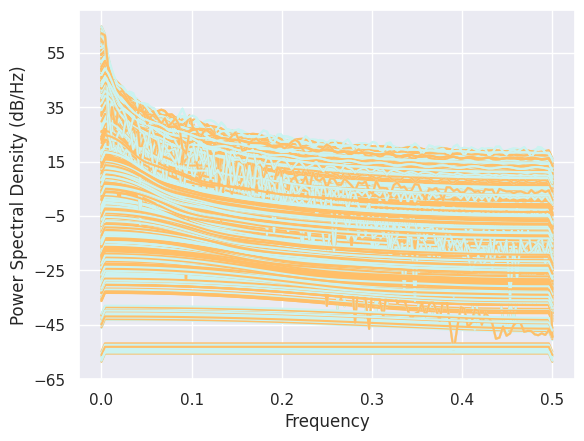

In [64]:
# data_IdSc = data_IdSc.apply(lambda row: compute_wavelet(row), axis=1)
data_IdSc = data_IdSc.apply(lambda row: HF_LF_ratio(row), axis=1)

In [65]:
data_IdSc[["Participant_ID", "treatment_group", "Scenario", "whole_HR_LF_HF_ratio"]]

,Participant_ID,treatment_group,Scenario,whole_HR_LF_HF_ratio
0,1,information,A,3.321945
1,1,information,B,3.469488
2,1,information,C,3.337040
3,2,efficiency,A,3.885701
4,2,efficiency,B,3.827579
5,2,efficiency,C,3.394137
6,3,efficiency,A,3.525997
7,3,efficiency,B,4.017517
8,3,efficiency,C,3.610863
9,4,efficiency,A,5.400825


#### saving data aggregates by ID+SCENARIO

In [1346]:
# entire
data_IdSc.to_csv("../processed_data/short_summary_data_IdSc_v6.csv", sep=";")

### mod data aggregated by ID+SCENARIO to have reordered willingness, SSS and safe answers aligned with the scenarios
The survey answers regarding stress (SSS), willingness to cross and safety perception can in fact be considered repeated measures. We reorganize the columns to reflect these answers.
- No independent columns for each scenario. (a_metric, b_metric, c_metric --> metric)
- Aligned each column (a_metric --> A, metric)

In [66]:
data_IdSc[["Participant_ID", "Scenario", "real_order_clean"] + dv_unique_num].head(10)
# dv_unique_num

,Participant_ID,Scenario,real_order_clean,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians
0,1,A,0,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0
1,1,B,10,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0
2,1,C,20,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0
3,2,A,0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0
4,2,B,10,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0
5,2,C,20,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0
6,3,A,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.737865,7.0,7.0,3.0,5.0,5.0
7,3,B,10,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.737865,7.0,7.0,3.0,5.0,5.0
8,3,C,20,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.737865,7.0,7.0,3.0,5.0,5.0
9,4,A,0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-5.0,-1.0,-1.0,-1.2,1.398412,6.0,6.0,3.0,7.0,7.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,3.0,-1.0,-1.0,-0.4,1.349897,6.0,6.0,3.0,5.0,7.0,0.0,1.0,-1.0,6.0,-1.0,0.0,-1.0,2.0,-1.0,-1.0,0.4,2.221111,1.0,1.0,3.0,2.0,6.0


In [93]:
def simplify_survey_cols(row):
    for metric in dv_unique_num:
        new_col_name = metric[2:]
        scenario_letter = metric[0].upper()
        if scenario_letter == row["Scenario"]:
            row[new_col_name] = row[metric]
    return row

cols_sss_willing_safe = [name[2:] for name in dv_unique_num_gen]

data_IdSc_02 = data_IdSc.apply(lambda row: simplify_survey_cols(row), axis=1)

data_IdSc_02["treatment__scenario"] = data_IdSc_02["treatment_group"] + data_IdSc_02["Scenario"]

data_IdSc_02["scenario__treatment"] = data_IdSc_02["Scenario"] + data_IdSc_02["treatment_group"]

data_IdSc_02[["Participant_ID", "Scenario", "real_order_clean"] + dv_unique_num + cols_sss_willing_safe].head(10)

,Participant_ID,Scenario,real_order_clean,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,sss_active_delta,sss_alert_delta,sss_angry_delta,sss_annoyed_delta,sss_depressed_delta,sss_disatisfied_delta,sss_grouchy_delta,sss_impatient_delta,sss_irritated_delta,sss_sad_delta,sss_avg_delta,sss_std_delta,will_Cross_night,will_cross_with_kid,attractiveness,safe_to_cars,safe_to_pedestrians
0,1,A,0,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0
1,1,B,10,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0
2,1,C,20,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0
3,2,A,0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0
4,2,B,10,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0
5,2,C,20,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,1.032796,4.0,4.0,2.0,3.0,3.0
6,3,A,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.737865,7.0,7.0,3.0,5.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0
7,3,B,10,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.737865,7.0,7.0,3.0,5.0,5.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0
8,3,C,20,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.316228,10.0,10.0,5.0,7.0,7.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.2,0.421637,8.0,7.0,3.0,6.0,6.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.737865

### data aggregated by ID
- Only for HR freq domain analysis

In [1447]:
timeseries_cols

['baseline_HR_raw_timeseries',
 'baseline_heart_rate_timeseries',
 'sub1_HR_delta_timeseries',
 'sub1_HR_raw_timeseries',
 'sub1_a_change_timeseries',
 'sub1_angle_change_timeseries',
 'sub1_b_change_timeseries',
 'sub1_c_change_timeseries',
 'sub1_displacement_timeseries',
 'sub1_heart_rate_timeseries',
 'sub2_HR_delta_timeseries',
 'sub2_HR_raw_timeseries',
 'sub2_a_change_timeseries',
 'sub2_angle_change_timeseries',
 'sub2_b_change_timeseries',
 'sub2_c_change_timeseries',
 'sub2_displacement_timeseries',
 'sub2_heart_rate_timeseries',
 'sub3_HR_delta_timeseries',
 'sub3_HR_raw_timeseries',
 'sub3_a_change_timeseries',
 'sub3_angle_change_timeseries',
 'sub3_b_change_timeseries',
 'sub3_c_change_timeseries',
 'sub3_displacement_timeseries',
 'sub3_heart_rate_timeseries',
 'sub4_HR_delta_timeseries',
 'sub4_HR_raw_timeseries',
 'sub4_a_change_timeseries',
 'sub4_angle_change_timeseries',
 'sub4_b_change_timeseries',
 'sub4_c_change_timeseries',
 'sub4_displacement_timeseries',
 'sub

In [94]:
# create dictionary for aggregation method

cols_of_interest = iv_treatments + iv_grouping + iv_covar_cat + iv_covar_num + dv_unique_cat + dv_unique_num + dv_repeated_cat + dv_repeated_num + timeseries_cols

dict_meth = dict()

for metric in cols_of_interest:
    if metric in iv_covar_num or metric in dv_repeated_num:
        dict_meth[metric]="mean"
    elif metric=="whole_heart_rate_timeseries":
        dict_meth[metric]="sum"
    else:
        dict_meth[metric]="first" 

In [95]:
data_Id = data.groupby(["Participant ID"],as_index=False).agg(dict_meth)

In [96]:
data_Id = data_Id.apply(lambda row: compute_wavelet(row), axis=1)
data_Id = data_Id.apply(lambda row: HF_LF_ratio(row), axis=1)

ValueError: operands could not be broadcast together with shapes (11,) (15,) 

In [97]:
data_Id[["Participant_ID", "treatment_group", "whole_HR_wavelet_avg_pw", "whole_HR_LF_HF_ratio"]]

KeyError: "['whole_HR_wavelet_avg_pw', 'whole_HR_LF_HF_ratio'] not in index"

### imputing missing data from sessions

In [1349]:
data.head(10)

,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_success,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_success,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_success,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,Black Screen,Config_recoded,Configuration,Day,EndDate,Participant ID,Participant_ID,Reached Curb,ResponseId,Scenario,Session Nr,Start,StartDate,Started Crossing,Started Walking,Successful?,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_active_delta_neg,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_avg_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_sss_std_delta,a_success,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,age,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_active_delta_neg,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_avg_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_sss_std_delta,b_success,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,baseline_HRV,baseline_HR_raw_RRintervals,baseline_HR_raw_timeseries,baseline_HR_raw_zeroTimestamps,baseline_heart_rate_len,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_heart_rate_timeseries,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_active_delta_neg,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_avg_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_sss_std_delta,c_success,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,city_live,city_raised,country_live,country_raised,country_raised_CH,driving_license,duration,duration_sub1,duration_sub2,duration_sub3,duration_sub4,duration_whole,experience_vr,experience_vr_recoded,experiments,experiments_recoded,fav,fav_cat,fav_duration,fav_recoded,gender,km_drive,km_drive_recoded,km_drive_recoded_num,m_walk,neighborhood,neighborhood_recoded,old_index_01,old_index_02,own_car,pref_transport,real_order_clean,real_order_raw,scenario__config,scenario__config_recoded,study,sub1_HRV,sub1_HRV_delta,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HR_delta_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_timeseries,su

In [1157]:
# durations == 0
# data_IdSc_02[(data_IdSc_02["duration_sub1"]==0) | (data_IdSc_02["duration_sub2"]==0) | (data_IdSc_02["duration_sub3"]==0) | (data_IdSc_02["duration_sub4"]==0)]#[dv_repeated_num]
data[(data["Participant_ID"]==25)][iv_treatments + iv_grouping + ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"]]#[iv_treatments + iv_grouping + dv_repeated_num]

,treatment_group,Scenario,Configuration,Config_recoded,Participant_ID,old_index_02,real_order_clean,real_order_raw,duration_sub1,duration_sub2,duration_sub3,duration_sub4
151,information,C,RH,aRH,25,0,0,0,11000,37000,29000,21000
152,information,C,EV,pEV,25,1,2,1,3000,8000,6000,19000
153,information,A,RH,aRH,25,2,10,2,3000,11000,4000,17000
154,information,A,EV,pEV,25,3,12,3,2000,10000,53000,18000
155,information,B,RH,aRH,25,4,20,4,0,0,81000,20000
156,information,B,EV,pEV,25,5,22,5,4000,44000,69000,19000


In [1081]:
import statistics
def imput_dur0_subtasks(row):
    substasks = ["sub1", "sub2", "sub3", "sub4"]
    for i in range(1,5):
        # check if duration of subtask is 0
        if row["duration_sub{}".format(i)] == 0:
            # print(row["Participant_ID"])
            # print(row["Scenario"])
            # print("i",i)
            # input heart rate mean from previous subtask last value and following subtask first value (mean of last and first 10 seconds)
            if i>1 and i<4:
                j = i-1
                # print("previous HR timeseries:")
                if row["duration_sub{}".format(j)] > 0:
                    # display(row["sub{}_heart_rate_timeseries".format(i-1)][-10:])
                    # prev_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i-1)][-10:] # getting the 10 last second from previous
                    prev_HR_val_mean = statistics.mean(row["sub{}_heart_rate_timeseries".format(i-1)][-10:])
                    prev_HR_val_std = statistics.stdev(row["sub{}_heart_rate_timeseries".format(i-1)][-10:])
                elif j-1>0  and row["duration_sub{}".format(j-1)] > 0:
                    # display(row["sub{}_heart_rate_timeseries".format(j-1)][:10])
                    # prev_HR_timeseries = row["sub{}_heart_rate_timeseries".format(j-1)][-10:] # getting the 10 last second from previous
                    prev_HR_val_mean = statistics.mean(row["sub{}_heart_rate_timeseries".format(j-1)][:10])
                    prev_HR_val_std = statistics.stdev(row["sub{}_heart_rate_timeseries".format(j-1)][:10])
                else:
                    # prev_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i+1)][:10] # getting the 10 last second from previous
                    prev_HR_val_mean = statistics.mean(row["sub{}_heart_rate_timeseries".format(i+1)][:10])
                    prev_HR_val_std = statistics.stdev(row["sub{}_heart_rate_timeseries".format(i+1)][:10])

                j = i+1
                # print("later HR timeseries:")
                if row["duration_sub{}".format(j)] > 0:
                    # display(row["sub{}_heart_rate_timeseries".format(i+1)][:10])
                    # post_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i+1)][:10]
                    post_HR_val_mean = statistics.mean(row["sub{}_heart_rate_timeseries".format(i+1)][:10])
                    post_HR_val_std = statistics.stdev(row["sub{}_heart_rate_timeseries".format(i+1)][:10])
                elif j+1<5 and row["duration_sub{}".format(j+1)] > 0:
                    # display(row["sub{}_heart_rate_timeseries".format(j+1)][:10])
                    # post_HR_timeseries = row["sub{}_heart_rate_timeseries".format(j+1)][:10]
                    post_HR_val_mean = statistics.mean(row["sub{}_heart_rate_timeseries".format(j+1)][:10])
                    post_HR_val_std = statistics.stdev(row["sub{}_heart_rate_timeseries".format(j+1)][:10])
                else:
                    # post_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i-1)][:10]
                    post_HR_val_mean = statistics.mean(row["sub{}_heart_rate_timeseries".format(i-1)][:10])
                    post_HR_val_std = statistics.stdev(row["sub{}_heart_rate_timeseries".format(i-1)][:10])
            # if it is subtask 1, just input first value of timeseries in subtask 2
            if i==1:
                if row["duration_sub{}".format(i+1)] > 0:
                    # HR_timeseries =  row["sub{}_heart_rate_timeseries".format(i+1)][:10] # first 10 secs
                    HR_val_mean = row["sub{}_heart_rate_timeseries".format(i+1)][0] 
                else:
                    # HR_timeseries =  row["sub{}_heart_rate_timeseries".format(i+2)][:10] # first 10 secs
                    HR_val_mean = row["sub{}_heart_rate_timeseries".format(i+2)][0]
                HR_val_std = 0
            # if it is subtask 4, just input last value of timeseries in subtask 3
            elif i==4:
                # HR_timeseries = row["sub{}_heart_rate_timeseries".format(i-1)][-10:] #last 10 secs of previous subtask
                HR_val_mean = row["sub{}_heart_rate_timeseries".format(i-1)][-1]
                HR_val_std = 0
            # print("mean pre:", prev_HR_val_mean)
            # print("mean:", HR_val_std)
            # else: average
            else:
                # HR_timeseries = prev_HR_timeseries + post_HR_timeseries
                HR_val_mean = statistics.mean([prev_HR_val_mean, post_HR_val_mean])
                HR_val_std = statistics.mean([prev_HR_val_std, post_HR_val_std])
            # row["sub{}_heart_rate_timeseries".format(i)] = HR_timeseries
            row["sub{}_heart_rate_mean".format(i)] = HR_val_mean
            row["sub{}_heart_rate_std".format(i)] = HR_val_std
    
        # for the timeseries
        if row["duration_sub{}".format(i)] < 2000:
                # print(row["Participant_ID"])
                # print(row["Scenario"])
                # print("i",i)
                # input heart rate mean from previous subtask last value and following subtask first value (mean of last and first 10 seconds)
                if i>1 and i<4:
                    j = i-1
                    # print("previous HR timeseries:")
                    if row["duration_sub{}".format(j)] > 0:
                        # display(row["sub{}_heart_rate_timeseries".format(i-1)][-10:])
                        prev_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i-1)][-10:] # getting the 10 last second from previous
                    elif j-1>0  and row["duration_sub{}".format(j-1)] > 0:
                        # display(row["sub{}_heart_rate_timeseries".format(j-1)][:10])
                        prev_HR_timeseries = row["sub{}_heart_rate_timeseries".format(j-1)][-10:] # getting the 10 last second from previous
                    else:
                        prev_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i+1)][:10] # getting the 10 last second from previous

                    j = i+1
                    # print("later HR timeseries:")
                    if row["duration_sub{}".format(j)] > 0:
                        # display(row["sub{}_heart_rate_timeseries".format(i+1)][:10])
                        post_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i+1)][:10]
                    elif j+1<5 and row["duration_sub{}".format(j+1)] > 0:
                        # display(row["sub{}_heart_rate_timeseries".format(j+1)][:10])
                        post_HR_timeseries = row["sub{}_heart_rate_timeseries".format(j+1)][:10]
                    else:
                        post_HR_timeseries = row["sub{}_heart_rate_timeseries".format(i-1)][:10]
                # if it is subtask 1, just input first value of timeseries in subtask 2
                if i==1:
                    if row["duration_sub{}".format(i+1)] > 0:
                        HR_timeseries =  row["sub{}_heart_rate_timeseries".format(i+1)][:10] # first 10 secs
                    else:
                        HR_timeseries =  row["sub{}_heart_rate_timeseries".format(i+2)][:10] # first 10 secs
                    if row["duration_sub{}".format(i)]>999: HR_timeseries = row["sub{}_heart_rate_timeseries".format(i)] + HR_timeseries
                    # display(HR_timeseries)
                # if it is subtask 4, just input last value of timeseries in subtask 3
                elif i==4:
                    HR_timeseries = row["sub{}_heart_rate_timeseries".format(i-1)][-10:] #last 10 secs of previous subtask
                    if row["duration_sub{}".format(i)] > 999: HR_timeseries = HR_timeseries + row["sub{}_heart_rate_timeseries".format(i)] 
                # print("mean pre:", prev_HR_val_mean)
                # print("mean:", HR_val_std)
                # else: average
                else:
                    HR_timeseries = prev_HR_timeseries + row["sub{}_heart_rate_timeseries".format(i)] + post_HR_timeseries
                # print(row["sub{}_heart_rate_timeseries".format(i)])
                row["sub{}_heart_rate_timeseries".format(i)] = HR_timeseries
                # print(HR_timeseries)
#             
    return row
            

In [1082]:
# for col in data_IdSc_02.columns
# data_IdSc_02["sub2_heart_rate_timeseries"]
[1, 2, "a"] + ["b", "c"]

[1, 2, 'a', 'b', 'c']

In [1104]:
data_filled = data.apply(lambda row: imput_dur0_subtasks(row), axis=1)
data_filled[(data_filled["duration_sub1"]==0) | (data_filled["duration_sub2"]==0) | (data_filled["duration_sub3"]==0) | (data_filled["duration_sub4"]==0)][["sub1_heart_rate_timeseries"] + dv_repeated_HR_num]

,sub1_heart_rate_timeseries,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_mean,whole_HR_delta_std,whole_HRV,whole_HRV_delta,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HRV,sub1_HRV_delta,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_HRV,sub2_HRV_delta,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_HRV,sub3_HRV_delta,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_HRV,sub4_HRV_delta
1,"[90.1606085572717, 89.32448552490898, 87.66453...",88.060442,2.722837,2.028944,2.722837,2.722837,-1.387406,88.037408,2.275187,2.005909,2.275187,2.275187,-1.835056,87.794424,3.786728,1.762926,3.786728,3.786728,-0.323514,88.292886,3.194523,NaN,NaN,NaN,NaN,88.213349,2.224400,2.181850,2.224400,2.224400,-1.885843
4,"[92.0, 94.64999021082622, 97.0, 99.02409779138...",80.590329,9.160112,-5.441169,9.160112,9.160112,5.049869,86.578397,8.371136,0.546898,8.371136,8.371136,4.260894,76.382527,0.873239,-9.648972,0.873239,0.873239,-3.237003,74.257197,1.060147,NaN,NaN,NaN,NaN,72.983862,1.838269,-13.047637,1.838269,1.838269,-2.271973
5,"[83.84010090103631, 84.4836586906729, 84.94174...",78.583080,5.760787,-7.448419,5.760787,5.760787,1.650544,84.767331,0.615436,-1.264167,0.615436,0.615436,-3.494807,84.718282,0.577537,-1.313217,0.577537,0.577537,-3.532705,82.059937,1.668743,NaN,NaN,NaN,NaN,75.503216,4.533063,-10.528282,4.533063,4.533063,0.422820
9,"[77.766194881523, 80.0, 82.35850437777167, 84....",84.530868,5.087168,-1.539140,5.087168,5.087168,-0.756572,81.343129,3.047363,-4.726879,3.047363,3.047363,-2.796377,80.667351,0.655955,-5.402657,0.655955,0.655955,-5.187785,85.191147,2.022847,NaN,NaN,NaN,NaN,87.847327,4.731514,1.777319,4.731514,4.731514,-1.112226
11,"[76.58306633290546, 73.0, 72.19766299772161, 7...",86.772299,7.529319,0.702291,7.529319,7.529319,1.685579,73.840829,1.914292,-12.229180,1.914292,1.914292,-3.929448,82.828901,4.554736,-3.241108,4.554736,4.554736,-1.289004,89.613755,2.281307,NaN,NaN,NaN,NaN,93.438113,2.701072,7.368104,2.701072,2.701072,-3.142669
14,"[83.88021833201917, 86.23897515074708, 87.4576...",84.438161,5.272076,-9.884010,5.272076,5.272076,-2.790907,86.123582,1.576493,-8.198588,1.576493,1.576493,-6.486490,82.545960,2.343347,-11.776210,2.343347,2.343347,-5.719636,85.477845,3.954545,NaN,NaN,NaN,NaN,84.484111,6.160679,-9.838059,6.160679,6.160679,-1.902304
15,"[90.0, 90.0, 93.0, 97.0]",87.986037,4.317270,-6.336134,4.317270,4.317270,-3.745713,92.500000,3.316625,-1.822170,3.316625,3.316625,-4.746358,87.521946,4.697672,-6.800224,4.697672,4.697672,-3.365311,85.541870,3.674230,NaN,NaN,NaN,NaN,87.333419,3.694847,-6.988751,3.694847,3.694847,-4.368136
16,"[83.28330147401981, 82.0]",85.507843,5.425003,-8.814327,5.425003,5.425003,-2.637980,82.641651,0.907431,-11.680519,0.907431,0.907431,-7.155552,83.554241,3.277500,-10.767929,3.277500,3.277500,-4.785484,87.820490,3.647721,NaN,NaN,NaN,NaN,88.431825,6.657348,-5.890345,6.657348,6.657348,-1.405635
17,"[92.19375848920389, 89.56304844637917, 87.0, 8...",84.142472,4.933158,-10.179698,4.933158,4.933158,-3.129825,92.193758,NaN,-2.128412,NaN,NaN,NaN,84.309768,3.558084,-10.012402,3.558084,3.558084,-4.504899,81.864077,2.653811,NaN,NaN,NaN,NaN,83.711279,5.122880,-10.610891,5.122880,5.122880,-2.940103
28,"[113.49358972328872, 113.79671040365784, 113.0...",107.670125,4.998133,-2.703797,4.998133,4.998133,-0.511285,109.834698,3.390231,-0.539223,3.390231,3.390231,-2.119187,112.666753,2.754933,NaN,NaN,NaN,NaN,115.498808,2.119635,5.124887,2.119635,2.119635,-3.389783,106.142362,4.812453,-4.231559,4.812453,4.812453,-0.696965


In [1084]:
data_filled = data_filled.apply(lambda row: compute_HRV(row), axis=1)

In [1085]:
data_filled[["duration_sub1","sub1_heart_rate_timeseries","sub1_HRV", "duration_sub2","sub2_heart_rate_timeseries","sub2_HRV"]]

,duration_sub1,sub1_heart_rate_timeseries,sub1_HRV,duration_sub2,sub2_heart_rate_timeseries,sub2_HRV
0,23978,"[84.07194281334176, 84.0, 83.94966173222761, 8...",4.023906,41993,"[86.66039226058105, 85.53059025308931, 84.6185...",3.604093
1,4023,"[90.1606085572717, 89.32448552490898, 87.66453...",2.275187,9989,"[82.0, 82.0, 85.0, 86.78523843897023, 88.0, 90...",3.786728
2,28987,"[77.52587130229857, 77.77647650573256, 78.0853...",8.014462,10989,"[90.85670673021164, 90.0602725180696, 89.13130...",4.891029
3,1004,"[79.54889941989036, 80.0, 80.68749195056465, 8...",2.429295,5969,"[80.0, 80.68749195056465, 81.66679807350813, 8...",2.327812
4,22990,"[92.0, 94.64999021082622, 97.0, 99.02409779138...",8.371136,2006,"[77.0, 75.76505300770624]",0.873239
5,4997,"[83.84010090103631, 84.4836586906729, 84.94174...",0.615436,5001,"[85.31379997396596, 85.14064813566192, 84.8373...",0.577537
6,33000,"[88.21580196239165, 86.59138095195577, 85.0, 8...",3.967381,11000,"[86.2680916309926, 89.0, 92.0, 92.628993193231...",5.873886
7,3000,"[92.75187221590888, 91.2117123918662, 88.0]",2.424441,4000,"[84.60673508727464, 82.0, 80.8167546658383, 80...",1.770063
8,1000,"[86.10681632777113, 85.16031238712219, 84.2508...",1.271433,10000,"[85.16031238712219, 84.2508209621361, 83.50389...",1.228448
9,17000,"[77.766194881523, 80.0, 82.35850437777167, 84....",3.047363,4000,"[80.36043604629585, 80.13026727145672, 80.5639...",0.655955


### data aggregated by ID collapsing all the repeated measures
- The most summarized representation of the data
- We encapsulate all the repeated measures in one single mean.
- Adding difference (delta) value between AB, AC, and BC (transition effects), following discussions with Carina.
- We take away the within-factors due to repetitions and we transform the data to more independent measurements.
- Recoding for removing the repeated measures effect.
- This analysis would be only useful for comparing treatments of information.

In [1350]:
def create_agg_methods(data_df):
    names_cols = list(data_df.columns)
# create dictionary for aggregation method
    dict_meth = dict()

    for metric in names_cols:
        if metric in iv_covar_num or metric in dv_repeated_num:
            dict_meth[metric]="mean"
        else:
            dict_meth[metric]="first"
    # print(dict_meth)
    return dict_meth

# data.head(10)
dv_repeated_whole = ["duration_whole", "whole_displacement_mean", "whole_displacement_std",
                    "whole_heart_rate_mean", "whole_heart_rate_std",
                    "whole_angle_change_mean","whole_angle_change_std" ,
                    "whole_a_change_mean", "whole_a_change_std",
                    "whole_b_change_mean", "whole_b_change_std",
                    "whole_c_change_mean", "whole_c_change_std"]


data_temp = data[iv_treatments+iv_grouping+iv_covar_cat+iv_covar_num+dv_repeated_whole+dv_repeated_cat]
# display(data_HR.head(10))
data_temp_01 = data_temp.groupby(["Participant_ID", "Scenario"], as_index=False).agg(create_agg_methods(data_temp))
# display(data_HR_01.head(10))
data_temp_02 = data_temp_01.pivot(index ="Participant_ID", columns="Scenario", values=dv_repeated_whole)
# data_HR_02["deltaA>B"] = data_HR_02["B"] - data_HR_02["A"]
# data_HR_02["deltaA>C"] = data_HR_02["C"] - data_HR_02["A"] 
# display(data_HR_02)

# display(data_unique.head(10))

data_repeated_collapsed = pd.merge(data_unique ,data_temp_02, on="Participant_ID")

#created deltas
for metric in dv_repeated_whole:
    data_repeated_collapsed["{}_delta_A>B".format(metric)] = data_repeated_collapsed[(metric, "B")] - data_repeated_collapsed[(metric, "A")]
    if not (metric.startswith("whole_angle_") or metric.startswith("whole_a_") or metric.startswith("whole_b_") or metric.startswith("whole_c_")):
        data_repeated_collapsed["{}_delta_A>C".format(metric)] = data_repeated_collapsed[(metric, "C")] - data_repeated_collapsed[(metric, "A")]

data_repeated_collapsed.head(5)

,Participant_ID,old_index_02,real_order_clean,real_order_raw,age,km_drive_recoded_num,experiments_recoded,treatment_group,Scenario,Configuration,Config_recoded,neighborhood_recoded,gender,own_car,driving_license,experience_vr_recoded,country_raised_CH,m_walk,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,fav_recoded,"(duration_whole, A)","(duration_whole, B)","(duration_whole, C)","(whole_displacement_mean, A)","(whole_displacement_mean, B)","(whole_displacement_mean, C)","(whole_displacement_std, A)","(whole_displacement_std, B)","(whole_displacement_std, C)","(whole_heart_rate_mean, A)","(whole_heart_rate_mean, B)","(whole_heart_rate_mean, C)","(whole_heart_rate_std, A)","(whole_heart_rate_std, B)","(whole_heart_rate_std, C)","(whole_angle_change_mean, A)","(whole_angle_change_mean, B)","(whole_angle_change_mean, C)","(whole_angle_change_std, A)","(whole_angle_change_std, B)","(whole_angle_change_std, C)","(whole_a_change_mean, A)","(whole_a_change_mean, B)","(whole_a_change_mean, C)","(whole_a_change_std, A)","(whole_a_change_std, B)","(whole_a_change_std, C)","(whole_b_change_mean, A)","(whole_b_change_mean, B)","(whole_b_change_mean, C)","(whole_b_change_std, A)","(whole_b_change_std, B)","(whole_b_change_std, C)","(whole_c_change_mean, A)","(whole_c_change_mean, B)","(whole_c_change_mean, C)","(whole_c_change_std, A)","(whole_c_change_std, B)","(whole_c_change_std, C)",duration_whole_delta_A>B,duration_whole_delta_A>C,whole_displacement_mean_delta_A>B,whole_displacement_mean_delta_A>C,whole_displacement_std_delta_A>B,whole_displacement_std_delta_A>C,whole_heart_rate_mean_delta_A>B,whole_heart_rate_mean_delta_A>C,whole_heart_rate_std_delta_A>B,whole_heart_rate_std_delta_A>C,whole_angle_change_mean_delta_A>B,whole_angle_change_std_delta_A>B,whole_a_change_mean_delta_A>B,whole_a_change_std_delta_A>B,whole_b_change_mean_delta_A>B,whole_b_change_std_delta_A>B,whole_c_change_mean_delta_A>B,whole_c_change_std_delta_A>B
0,1,0,0,0,36.0,50,2,information,A,RH,aRH,dense,Male,yes,yes,NaN,1,yes,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,c,64496.000000,40973.500000,35994.0,0.759568,0.917780,0.822066,0.887281,1.112266,1.289504,87.426336,84.451434,79.586705,3.390385,4.743058,7.460449,44.173780,43.710674,0.000000,52.856283,50.243146,0.000000,17.161963,6.443014,0.000000,35.959351,12.895152,0.000000,27.011818,37.267660,0.000000,41.252546,46.784716,0.000000,53.004778,58.848288,0.000000,50.548146,50.465010,0.000000,-23522.500000,-28502.000000,0.158212,0.062498,0.224985,0.402223,-2.974902,-7.839631,1.352672,4.070064,-0.463106,-2.613138,-10.718949,-23.064199,10.255843,5.532170,5.843510,-0.083136
1,2,0,0,0,22.0,0,2,efficiency,A,RH,aRH,dense,Male,no,no,0.0,0,yes,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,6.0,5.0,4.0,2.0,6.0,-2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.674949,3.0,3.0,1.0,5.0,3.0,-1.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

### saving entire dataframe

In [1351]:
data.to_csv("../processed_data/whole_summary_data.csv", sep=";")

In [1352]:
data_test = pd.read_csv("../processed_data/whole_summary_data.csv", sep=";")
data_test.head(3)

,Unnamed: 0,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_success,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_success,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_success,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,Black Screen,Config_recoded,Configuration,Day,EndDate,Participant ID,Participant_ID,Reached Curb,ResponseId,Scenario,Session Nr,Start,StartDate,Started Crossing,Started Walking,Successful?,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_active_delta_neg,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_avg_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_sss_std_delta,a_success,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,age,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_active_delta_neg,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_avg_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_sss_std_delta,b_success,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,baseline_HRV,baseline_HR_raw_RRintervals,baseline_HR_raw_timeseries,baseline_HR_raw_zeroTimestamps,baseline_heart_rate_len,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_heart_rate_timeseries,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_active_delta_neg,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_avg_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_sss_std_delta,c_success,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,city_live,city_raised,country_live,country_raised,country_raised_CH,driving_license,duration,duration_sub1,duration_sub2,duration_sub3,duration_sub4,duration_whole,experience_vr,experience_vr_recoded,experiments,experiments_recoded,fav,fav_cat,fav_duration,fav_recoded,gender,km_drive,km_drive_recoded,km_drive_recoded_num,m_walk,neighborhood,neighborhood_recoded,old_index_01,old_index_02,own_car,pref_transport,real_order_clean,real_order_raw,scenario__config,scenario__config_recoded,study,sub1_HRV,sub1_HRV_delta,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HR_delta_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_ti

### Counting samples
Each participant goes through a number of repeated sessions under 3 different scenarios and 2 different configuration, so the numbr of sessions is larger than the number of participants.

In [1353]:
# data.columns
print("Number of sessions (repeated measured on several Participants):", len(data))

Number of sessions (repeated measured on several Participants): 266


In [1354]:
print("Number of participants (and personal surveys):", len(data.drop_duplicates(subset=["Participant ID"])))

Number of participants (and personal surveys): 43


In [1355]:
data[(data["duration_sub1"]<1999) | (data["duration_sub2"]<1999) | (data["duration_sub3"]<1999) | (data["duration_sub4"]<1999)][iv_grouping + iv_treatments + dv_repeated_HR_num].head(20)

,Participant_ID,old_index_02,real_order_clean,real_order_raw,treatment_group,Scenario,Configuration,Config_recoded,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_mean,whole_HR_delta_std,whole_HRV,whole_HRV_delta,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HRV,sub1_HRV_delta,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_HRV,sub2_HRV_delta,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_HRV,sub3_HRV_delta,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_HRV,sub4_HRV_delta
1,1,1,2,1,information,A,EV,pEV,88.060442,2.722837,2.028944,2.722837,2.722837,-1.387406,88.037408,2.275187,2.005909,2.275187,2.275187,-1.835056,87.794424,3.786728,1.762926,3.786728,3.786728,-0.323514,88.292886,3.203383,2.261388,3.203383,3.203383,-0.906860,88.213349,2.224400,2.181850,2.224400,2.224400,-1.885843
2,1,2,10,2,information,B,RH,aRH,86.960129,6.747817,0.928631,6.747817,6.747817,2.637574,89.641154,8.014462,3.609656,8.014462,8.014462,3.904219,84.434901,4.891029,-1.596597,4.891029,4.891029,0.780786,83.518976,3.625080,-2.512523,3.625080,3.625080,-0.485163,84.363884,1.907854,-1.667614,1.907854,1.907854,-2.202389
3,1,3,12,3,information,B,EV,pEV,81.942738,2.738299,-4.088761,2.738299,2.738299,-1.371944,82.097120,2.565458,-3.934378,2.565458,2.565458,-1.544784,82.663570,2.327812,-3.367929,2.327812,2.327812,-1.782430,82.241549,2.519110,-3.789950,2.519110,2.519110,-1.591133,81.555910,2.737450,-4.475588,2.737450,2.737450,-1.372793
4,1,4,20,4,information,C,RH,aRH,80.590329,9.160112,-5.441169,9.160112,9.160112,5.049869,86.578397,8.371136,0.546898,8.371136,8.371136,4.260894,76.382527,0.873239,-9.648972,0.873239,0.873239,-3.237003,75.608453,3.854007,-10.423045,3.854007,3.854007,-0.256235,72.983862,1.838269,-13.047637,1.838269,1.838269,-2.271973
5,1,5,22,5,information,C,EV,pEV,78.583080,5.760787,-7.448419,5.760787,5.760787,1.650544,84.767331,0.615436,-1.264167,0.615436,0.615436,-3.494807,84.718282,0.577537,-1.313217,0.577537,0.577537,-3.532705,82.072200,3.356486,-3.959299,3.356486,3.356486,-0.753757,75.503216,4.533063,-10.528282,4.533063,4.533063,0.422820
8,2,2,2,2,efficiency,A,EV,pEV,83.012425,2.597361,-3.057583,2.597361,2.597361,-3.246380,84.810405,2.166500,-1.259603,2.166500,2.166500,-3.677240,84.420984,1.228448,-1.649024,1.228448,1.228448,-4.615293,85.061724,1.598867,-1.008284,1.598867,1.598867,-4.244873,81.519650,2.546901,-4.550359,2.546901,2.546901,-3.296839
9,2,3,10,3,efficiency,B,RH,aRH,84.530868,5.087168,-1.539140,5.087168,5.087168,-0.756572,81.343129,3.047363,-4.726879,3.047363,3.047363,-2.796377,80.667351,0.655955,-5.402657,0.655955,0.655955,-5.187785,86.021302,4.682800,-0.048706,4.682800,4.682800,-1.160940,87.847327,4.731514,1.777319,4.731514,4.731514,-1.112226
11,2,5,20,5,efficiency,C,RH,aRH,86.772299,7.529319,0.702291,7.529319,7.529319,1.685579,73.840829,1.914292,-12.229180,1.914292,1.914292,-3.929448,82.828901,4.554736,-3.241108,4.554736,4.554736,-1.289004,89.613755,3.686519,3.543747,3.686519,3.686519,-2.157221,93.438113,2.701072,7.368104,2.701072,2.701072,-3.142669
14,3,1,2,1,efficiency,A,EV,pEV,84.438161,5.272076,-9.884010,5.272076,5.272076,-2.790907,86.123582,1.576493,-8.198588,1.576493,1.576493,-6.486490,82.545960,2.343347,-11.776210,2.343347,2.343347,-5.719636,85.904936,5.090392,-8.417235,5.090392,5.090392,-2.972591,84.484111,6.160679,-9.838059,6.160679,6.160679,-1.902304
15,3,2,10,2,efficiency,B,RH,aRH,87.986037,4.317270,-6.336134,4.317270,4.317270,-3.745713,92.500000,3.316625,-1.822170,3.316625,3.316625,-4.746358,87.521946,4.697672,-6.800224,4.697672,4.697672,-3.365311,85.541870,3.633583,-8.780300,3.633583,3.633583,-4.429400,87.333419,3.694847,-6.988751,3.694847,3.694847,-4.368136


# Stats. analysis

## Did the information **treatment** affect the phisiological responses? (**$Y_{delta\ sensors\ refA}$ ~ $G$**)

Using aggregation in **data aggregated by ID collapsing all the repeated measures**

We test for the differences on the treatment of information $G$

### Plotting distributions per treatment_group

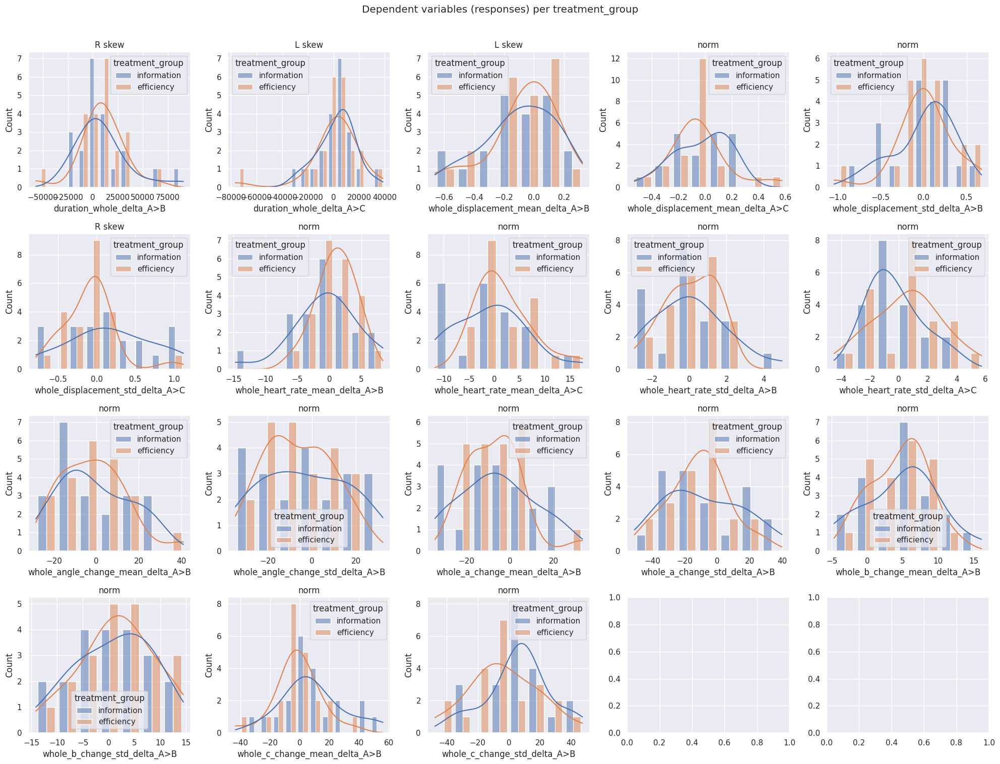

In [757]:
cols_of_interest = []
for metric in data_repeated_collapsed.columns:
    if isinstance(metric, str) and (metric.endswith("delta_A>B") or metric.endswith("delta_A>C")):
        cols_of_interest.append(metric)

# print(cols_of_interest)        
#dv_unique_cat + dv_unique_num 

# print(cols_of_interest)

fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 15), sharey=False)
ax = ax.flatten()
plt.suptitle("Dependent variables (responses) per treatment_group", y=1.01)

for i in range(len(cols_of_interest)):
    
    metric = cols_of_interest[i]
    # print(metric)
    
    # selecting the right dataset
    chosen_df = data_repeated_collapsed
    
    ax[i].yaxis.grid(True)
    
    #check normality
    txt = label_normality(chosen_df, metric) 
        
    # dropping scenario C for angles changes
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    ax[i].title.set_text(txt)
    sns.histplot(data=temp_chosen_df, x=metric, ax=ax[i], hue="treatment_group", stat="count", common_norm=False, kde=True, multiple="dodge", shrink=.8)
    
plt.tight_layout()
plt.show()

### Create data frames with normalization

We can try to normalize the derived metrics, and plotting them. for the normalization we use the R implementation of Best Normalize which tries different transform methods to get as close as possible to a normal distribution.

In [758]:
numeric_cols =  cols_of_interest

for i in range(len(numeric_cols)):   
    metric = numeric_cols[i]
    #check and transform if needed for skewness
    metric, txt = best_normalize_from_R(data_repeated_collapsed, metric)

['duration_whole_delta_A>B', 'duration_whole_delta_A>C', 'whole_displacement_mean_delta_A>B', 'whole_displacement_mean_delta_A>C', 'whole_displacement_std_delta_A>B', 'whole_displacement_std_delta_A>C', 'whole_heart_rate_mean_delta_A>B', 'whole_heart_rate_mean_delta_A>C', 'whole_heart_rate_std_delta_A>B', 'whole_heart_rate_std_delta_A>C', 'whole_angle_change_mean_delta_A>B', 'whole_angle_change_std_delta_A>B', 'whole_a_change_mean_delta_A>B', 'whole_a_change_std_delta_A>B', 'whole_b_change_mean_delta_A>B', 'whole_b_change_std_delta_A>B', 'whole_c_change_mean_delta_A>B', 'whole_c_change_std_delta_A>B']


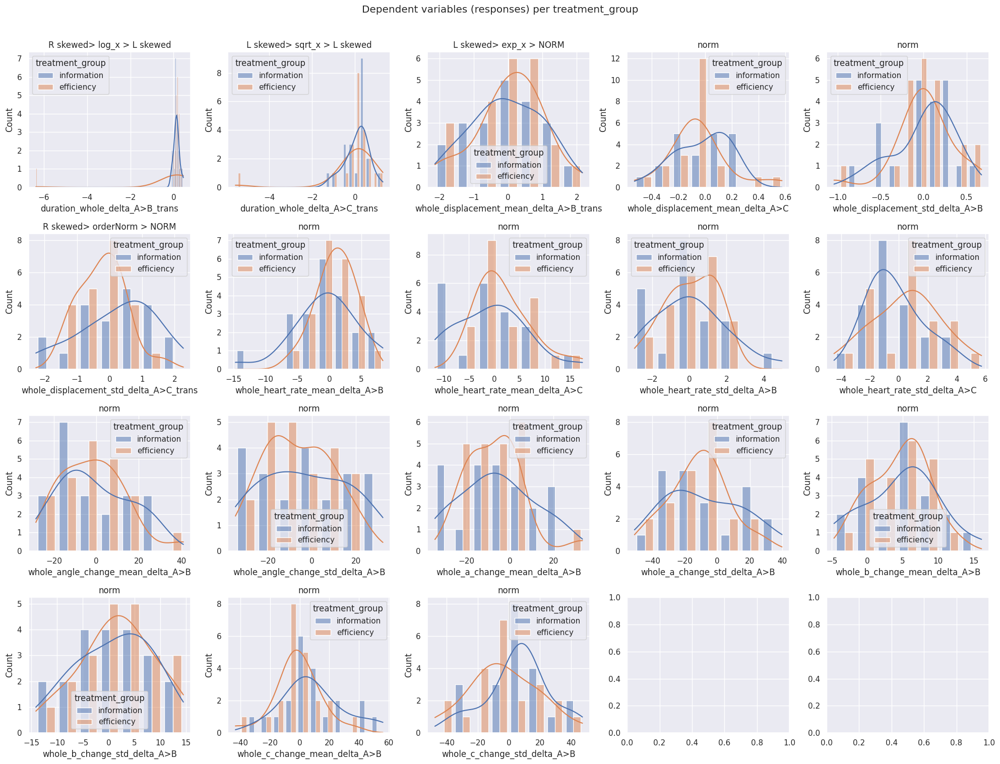

In [759]:
cols_of_interest = []
for metric in data_repeated_collapsed.columns:
    if isinstance(metric, str) and (metric.endswith("delta_A>B") or metric.endswith("delta_A>C")):
        cols_of_interest.append(metric)

print(cols_of_interest)        
#dv_unique_cat + dv_unique_num 

# print(cols_of_interest)

fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 15), sharey=False)
ax = ax.flatten()
plt.suptitle("Dependent variables (responses) per treatment_group", y=1.01)

for i in range(len(cols_of_interest)):
    
    metric = cols_of_interest[i]
    # print(metric)
    
    # selecting the right dataset
    chosen_df = data_repeated_collapsed
    
    ax[i].yaxis.grid(True)
    
    # #check normality
    # txt = label_normality(chosen_df, metric)
    #check and transform if needed for skewness
    metric, txt = best_normalize_from_R(chosen_df, metric)
        
    # dropping scenario C for angles changes
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    ax[i].title.set_text(txt)
    sns.histplot(data=temp_chosen_df, x=metric, ax=ax[i], hue="treatment_group", stat="count", common_norm=False, kde=True, multiple="dodge", shrink=.8)
    
plt.tight_layout()
plt.show()

In fact they are already normally distributed, so transformation is not in principle needed.Maybe only duration fields may require transformation and displacement

### Statistical tests

Parametric and non-parametric
For testing the independence of $Y_{delta\ sensors\ refA}$ w.r.t. $G$ we deploy statistical test for two samples as $G$ (treatment) has only two groups 
Depending on the characteristics of the samples we perform a t-test, or an alternative non-parametric Wilcoxon Sum-Rank for the numeric data, (and a Chi2-test or Fisher's exact count test for the counts in the case of categorical data.)
1. We check for the **normality** of the samples treatment groups with a **Shapiro-Wilk test**.
2. We check as well for **equal variance** between both treatment groups with the **Levene test**.
3. If both normality and equal variance assumption are fullfilled, then we run a **t-test** for two samples.
4. If only the equal variance assumption is violated, we corrected for the lack of homogeneity and we perform a **Welch's t-test**.
5. If both assumptions are violated, we perform a non-parametric **Wilcoxon sum-rank** test for two samples.
6. For the categorical data we run a **Chi2 test** and additionally a **Fisher's test** for robustness in the case of small number of counts in some categories.

The classification of $Y_{km_drive_recoded_num}$ and $Y_{esperiments_Recoded}$ can be numeric or categorical.

#### helpers

In [70]:
# Chi-square
def chi2_cont_test(data, group_01, group_02):
    favs_count_mat = pd.DataFrame()
    for cat_01 in sorted(list(set(data[group_01].dropna().values))):
        for cat_02 in sorted(list(set(data[group_02].dropna().values))):
            # print(treatment, favorite)
            favs_count_mat.loc[str(cat_01), str(cat_02)] = len(data[(data[group_01]==cat_01) & (data[group_02]==cat_02)])
    
    # display(favs_count_mat)
    result = dict()

    result["chi2_stat"], result["chi2_pval"], *_ = stats.chi2_contingency(favs_count_mat)
    # print("Chi2 p-val for {} vs {}:".format(group_01, group_02))
    # print(result["chi2_pval"], "\n")
    
    p_val = result["chi2_pval"]
    if p_val<0.05 and p_val>=0.01: sign = "*"
    elif p_val<0.01 and p_val>=0.001: sign = "**"
    elif p_val<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign    
    return result

# Fisher test (Chi2 not recommended for low number of samples)
def fisher_test(data, group_01, group_02):
    result = dict()
    pandas2ri.activate()
    fisher_test_result = statspackage.fisher_test(data[group_01], data[group_02])
    fisher_test_result_py = dict(zip(fisher_test_result.names, map(list,list(fisher_test_result))))
    # print(fisher_test_result_py)
    result["fisher_test_pval"] = fisher_test_result[0][0]
    result["fisher_test_estim"] = fisher_test_result[2][0]
    
    # print("Fisher test p-val for {} vs {}:".format(group_01, group_02))
    # print(fisher_test_pvalue, "\n") 
    
    p_val = result["fisher_test_pval"]
    if p_val<0.05 and p_val>=0.01: sign = "*"
    elif p_val<0.01 and p_val>=0.001: sign = "**"
    elif p_val<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign 
    
    return result
# df_stats_test_summary.loc[metric, "fisher_test_p_val"] = fisher_test_pvalue

def f_test(x, y):
    result = dict()
    x = np.array(x)
    y = np.array(y)
    f = np.var(x, ddof=1)/np.var(y, ddof=1) #calculate F test statistic 
    dfn = x.size-1 #define degrees of freedom numerator 
    dfd = y.size-1 #define degrees of freedom denominator 
    p = 1-scipy.stats.f.cdf(f, dfn, dfd) #find p-value of F test statistic 
    result["f-test_stat"] = f
    result["f-test_pval"] = p
    
    p_val = p
    if p_val<0.05 and p_val>=0.01: sign = "*"
    elif p_val<0.01 and p_val>=0.001: sign = "**"
    elif p_val<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign 
    
    return result

def check_variance_of_groups(group_01, group_02):
    result = dict()
    result["levene_stat"], result["levene_pval"] = stats.levene(group_01, group_02)
    if result["levene_pval"]<0.05:
        result["equal_variance"] = False
    else: result["equal_variance"] = True
    
    p_val = result["levene_pval"]
    if p_val<0.05 and p_val>=0.01: sign = "*"
    elif p_val<0.01 and p_val>=0.001: sign = "**"
    elif p_val<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign 
    
    return result

def check_normality_of_groups(group_01, group_02):
    result = dict()
    result["shapiro_stat_01"], result["shapiro_pval_01"] = stats.shapiro(group_01)
    result["shapiro_stat_02"], result["shapiro_pval_02"] = stats.shapiro(group_02)
    if result["shapiro_pval_01"]<0.05 or result["shapiro_pval_02"]<0.05:
        result["normality"] = False
    else: result["normality"] = True
    
    # checking both groups
    p_val_01 = result["shapiro_pval_01"]
    p_val_02 = result["shapiro_pval_02"]
    if (p_val_01<0.05 and p_val_01>=0.01) or (p_val_02<0.05 and p_val_02>=0.01): sign = "*"
    elif (p_val_01<0.01 and p_val_01>=0.001) or (p_val_02<0.01 and p_val_02>=0.001): sign = "**"
    elif p_val_01<0.001 or p_val_02<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign 
    
    return result

def check_normality_diff_of_groups(group_01, group_02): #ref https://www.pythonfordatascience.org/independent-samples-t-test-python/
    result = dict()
    sampling_diff = group_01.values - group_02.values
    result["shapiro_stat"], result["shapiro_pval"] = stats.shapiro(sampling_diff)
    if result["shapiro_pval"]<0.05:
        result["normality"] = False
    else: result["normality"] = True
    return result

def compute_ttest(group_01, group_02, ttest_correction):
    result = dict()
    outcome = pg.ttest(group_01, group_02, correction=ttest_correction)
    
    result["t_test_stat"] = outcome.loc["T-test", "T"]
    result["t_test_pval"] = outcome.loc["T-test", "p-val"]
    
    p_val = result["t_test_pval"]
    if p_val<0.05 and p_val>=0.01: sign = "*"
    elif p_val<0.01 and p_val>=0.001: sign = "**"
    elif p_val<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign 
    
    return result


def compute_wilcoxon(group_01, group_02):
    result = dict()
    outcome = stats.ranksums(temp_chosen_df_info, temp_chosen_df_effi)
    result["wilcoxon_stat"] = outcome.statistic
    result["wilcoxon_pval"] = outcome.pvalue
    
    p_val = result["wilcoxon_pval"]
    if p_val<0.05 and p_val>=0.01: sign = "*"
    elif p_val<0.01 and p_val>=0.001: sign = "**"
    elif p_val<0.001: sign = "***"
    else: sign = " "
    result["sign"] = sign 
    
    return result

#### running tests

In [73]:
cols_of_interest = []
for metric in data_repeated_collapsed.columns:
    if isinstance(metric, str) and (metric.endswith("delta_A>B") or metric.endswith("delta_A>C")):
        cols_of_interest.append(metric)

df_stats_test_summary = pd.DataFrame(columns=[
    "shapiro_stat", "shapiro_pval", "shapiro_sign", # normality
    # "f_test_stat", "f_test_p_val", "f_test_sign", # equal variance
    "levene_stat", "levene_pval", "levene_sign", # equal variance
    "t_test_stat", "t_test_pval", "t_test_sign",
    "wilcoxon_stat", "wilcoxon_pval", "wilcoxon_sign",
    "chi2_stat", "chi2_pval", "chi2_sign",
    "fisher_estim", "fisher_pval", "fisher_sign",
])

for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    # print("\n testing {}".format(metric).upper())
    
    # selecting the right dataset

    chosen_df = data_repeated_collapsed
    
    # if metric in iv_covar_num:
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    temp_chosen_df_info = temp_chosen_df[temp_chosen_df["treatment_group"]=="information"][metric]
    temp_chosen_df_effi = temp_chosen_df[temp_chosen_df["treatment_group"]=="efficiency"][metric]

    result_normality = check_normality_of_groups(temp_chosen_df_info, temp_chosen_df_effi)
    result_variance = check_variance_of_groups(temp_chosen_df_info, temp_chosen_df_effi)
    # print(result_variance)
    # result_variance_2 = f_test(temp_chosen_df_info, temp_chosen_df_effi)
    # print(result_variance_2)

    df_stats_test_summary.loc[metric, "shapiro_stat"] = ["{:.4f}".format(result_normality["shapiro_stat_01"]), "{:.4f}".format(result_normality["shapiro_stat_02"])]
    df_stats_test_summary.loc[metric, "shapiro_pval"] = ["{:.4f}".format(result_normality["shapiro_pval_01"]), "{:.4f}".format(result_normality["shapiro_pval_02"])]
    df_stats_test_summary.loc[metric, "shapiro_sign"] = result_normality["sign"]

    df_stats_test_summary.loc[metric, "levene_stat"] = result_variance["levene_stat"]
    df_stats_test_summary.loc[metric, "levene_pval"] = result_variance["levene_pval"]
    df_stats_test_summary.loc[metric, "levene_sign"] = result_variance["sign"]

    if result_normality["normality"] == True:
        if  result_variance["equal_variance"] == True: ttest_correction = False
        else: ttest_correction = True
        results_ttest = compute_ttest(temp_chosen_df_info, temp_chosen_df_effi, ttest_correction)

        df_stats_test_summary.loc[metric, "t_test_stat"] = results_ttest["t_test_stat"]
        df_stats_test_summary.loc[metric, "t_test_pval"] = results_ttest["t_test_pval"]
        df_stats_test_summary.loc[metric, "t_test_sign"] = results_ttest["sign"]

    else:
        results_wilcoxon = compute_wilcoxon(temp_chosen_df_info, temp_chosen_df_effi)

        df_stats_test_summary.loc[metric, "wilcoxon_stat"] = results_wilcoxon["wilcoxon_stat"]
        df_stats_test_summary.loc[metric, "wilcoxon_pval"] = results_wilcoxon["wilcoxon_pval"]
        df_stats_test_summary.loc[metric, "wilcoxon_sign"] = results_wilcoxon["sign"]
#     else:
#         chi2_result = chi2_cont_test(chosen_df, metric, "treatment_group")
        
#         df_stats_test_summary.loc[metric, "chi2_stat"] = chi2_result["chi2_stat"]
#         df_stats_test_summary.loc[metric, "chi2_pval"] = chi2_result["chi2_pval"]
#         df_stats_test_summary.loc[metric, "chi2_sign"] = chi2_result["sign"]
        
#         fisher_result = fisher_test(chosen_df, metric, "treatment_group")
        
#         df_stats_test_summary.loc[metric, "fisher_estim"] = fisher_result["fisher_test_estim"]
#         df_stats_test_summary.loc[metric, "fisher_pval"] = fisher_result["fisher_test_pval"]
#         df_stats_test_summary.loc[metric, "fisher_sign"] = fisher_result["sign"]

df_stats_test_summary = df_stats_test_summary.fillna(" ")
display(df_stats_test_summary)

,shapiro_stat,shapiro_pval,shapiro_sign,levene_stat,levene_pval,levene_sign,t_test_stat,t_test_pval,t_test_sign,wilcoxon_stat,wilcoxon_pval,wilcoxon_sign,chi2_stat,chi2_pval,chi2_sign,fisher_estim,fisher_pval,fisher_sign
duration_whole_delta_A>B_trans,"[0.9649, 0.2743]","[0.6195, 0.0000]",***,0.766290,0.386467,,,,,-0.656005,0.511821,,,,,,,
duration_whole_delta_A>C_trans,"[0.9464, 0.5409]","[0.2911, 0.0000]",***,0.355024,0.554558,,,,,0.194372,0.845885,,,,,,,
whole_displacement_mean_delta_A>B_trans,"[0.9722, 0.9749]","[0.7803, 0.8215]",,0.103749,0.749013,,-0.328034,0.744556,,,,,,,,,,
whole_displacement_mean_delta_A>C,"[0.9406, 0.9018]","[0.2244, 0.0322]",*,0.189051,0.665987,,,,,0.923266,0.355869,,,,,,,
whole_displacement_std_delta_A>B,"[0.9265, 0.9014]","[0.1173, 0.0318]",*,0.143559,0.706723,,,,,0.534522,0.59298,,,,,,,
whole_displacement_std_delta_A>C_trans,"[0.9658, 0.8833]","[0.6398, 0.0140]",*,6.087603,0.017879,*,,,,1.773643,0.076122,,,,,,,
whole_heart_rate_mean_delta_A>B,"[0.9527, 0.9839]","[0.3826, 0.9656]",,2.362825,0.131939,,-1.19461,0.239105,,,,,,,,,,
whole_heart_rate_mean_delta_A>C,"[0.9561, 0.8964]","[0.4411, 0.0252]",*,0.992630,0.324945,,,,,-1.117638,0.263722,,,,,,,
whole_heart_rate_std_delta_A>B,"[0.9583, 0.9427]","[0.4833, 0.2254]",,0.984504,0.326909,,0.118481,0.906265,,,,,,,,,,
whole_heart_rate_std_delta_A>C,"[0.9540, 0.9832]","[0.4040, 0.9579]",,0.604417,0.441361,,-1.214213,0.231614,,,,,,,,,,


#### Results

**With this encoding for treating the repeated measures, no metric was significant different w.r.t. the treatment.**

One potential explanation is that the effects are relatively small, and they are eventually faded out by the averaging across the repetitions and summarizing everything to one single metric per participant.

## Did the **scenarios** affect the phisiological responses? ($Y_{delta\ sensors\ refA}$ ~ $S$)
Using aggregation in **data aggregated by ID+Scenario collapsing all the repeated measures per scenario**

We keep repeated/separated measurements for the subjects across different scenarios.

We test for the differences on the Scenario $S$

+ **This comparison implies problems as the measurements are not independent.**

## to deal with repeated measures: mixed-models (ANOVA)

As stated, the observations are not really fully independent within subjects.

Measures for each subject are taken repeately in randomize order or scenarios: {'abc', 'acb', 'bac', 'bca', 'cab', 'cba'}

We have recoded and homogenized the actual order of the sessions. Each session could be repeated another time if the task was failed. Accordingly, a new indexing is creating for taking into account all these chances. As a result, as most of the participant were succesful in performing the task, are mising indexes.
- x0, x1 are indexes reserved for the first two attemps in the Peak Hour configuration
- x3, x4 for the two attempts Evening configuration
- 0x is reserved for all the atempts in all the configuration for 1st scenario
- 1x same for second scenario
- 2x for third scenario

The mixed model ANOVA is performed firstly taking into account that real order. The lack of significant effects would show that the order is not relevant for distinguising the intervention groups.
 
Then a second mixed model ANOVA is performed taking into account the actual type of scenarios and configuration, for measuring the effect of this different environments.

The encoding *real_order_clean* cannot be used in the mixed model ANOVA because of the high amount of missing data. It needs to remove a few indexes where there are not samples in both treatment groups.

Alternatively a more (time-wise) compact encoding is used: *real_order_raw*. 

We reduce the number of variables to the whole metrics only. Subtasks metrics created methological problems because of missing data for the participants. Due to the strict listwise approach for the complete-case analysis criteria used (https://github.com/raphaelvallat/pingouin/blob/master/pingouin/parametric.py :456 or :1429), most of the data eventually is removed. None participant has gone through all the possible alternatives even in . Consequently, the analysis is not feasible anymore with those within variables.

Some alternatives: https://www.theanalysisfactor.com/when-repeated-measures-anova-not-work-for-repeated-measures-data/https://www.theanalysisfactor.com/when-repeated-measures-anova-not-work-for-repeated-measures-data/

**How to proceed with normality tests in a mixed model?**

http://dx.doi.org/10.4135/9781506326139.n436http://dx.doi.org/10.4135/9781506326139.n436

- Residuals normally distributed both in the between-subjects and within-subjects variables (could be corrected with transformations).
- Homogeneity of variances in between-subject groups (could be corrected with transformations).

- Homogeneity of the variance-covariance matrices (can be corrected with data transformations).

- Sphericity (only for within-subjects variables with three or more variables) (can be corrected with the Greenhouse-Geisser or the Huynh-Feldt corrections).

In general this approach is powerful, but limited because of not fullfilling the assumptions, and because of not being able to have enough complete case rows.

For solving this issue of lack of completeness, the data has been reformated: *data_IdScCon*.

For this reason, in fact the raw entire dataset cannot be used.

Still there is an issue with NaN generated for the angle in scenario C. For that it is needed to identify the NaN, remove them, and shifting the values to the left for having a complete dataframe with all complete columns. https://stackoverflow.com/questions/62643493/remove-nan-values-and-shift-values-from-the-next-column

**Mixed ANOVA**
- Mixed model ANOVA is limited because of the complete case wise analysis, which makes it not very robust to missing data.
- To run with data = { *data_IdSc*, *data_IdSc_02*, *data_IdScCon* and *data_Id_ScCon_1st* }
- All of them preserve **repeated measures**.
- within_time_factor = { *Scenario*, *real_order_clean* }. i.e., check the effect of the actual Scenario or of the actual followed order.
- between factor = treatment type
- it generates a writen summarized report and a table with stats

### helpers

In [119]:
cols_of_interest = dv_repeated_num# + dv_unique_num

In [120]:
# mixed model ANOVA for repeated measured based on old_index_02 (row order, not taking into account gaps and failures)

#define F-test function
def f_test(x, y):
    x = np.array(x)
    y = np.array(y)
    f = np.var(x, ddof=1)/np.var(y, ddof=1) #calculate F test statistic 
    dfn = x.size-1 #define degrees of freedom numerator 
    dfd = y.size-1 #define degrees of freedom denominator 
    p = 1-scipy.stats.f.cdf(f, dfn, dfd) #find p-value of F test statistic 
    return f, p

def compute_mixed_ANOVA(metric, data, within_time_factor, between, list_significant_metrics, report_str, large_df, plot=False):
    # ANOVA test
    # model = ols("{} ~ C(treatment_group)".format(metric), data=data).fit()
    # anova_table = sm.stats.anova_lm(model, typ=2)
    # print(metric)
    # p_val = anova_table.loc["C(treatment_group)", "PR(>F)"]
    # print(metric)
    
    # display(data.head(10))
    if (metric.endswith("_angle_change_mean") or metric.endswith("_angle_change_std") or 
        metric.endswith("_angle_change_mean_trans") or metric.endswith("_angle_change_std_trans") or
        metric.endswith("_a_change_mean") or metric.endswith("_a_change_std") or
        metric.endswith("_a_change_mean_trans") or metric.endswith("_a_change_std_trans") or
        metric.endswith("_b_change_mean") or metric.endswith("_b_change_std") or
        metric.endswith("_b_change_mean_trans") or metric.endswith("_b_change_std_trans") or
        metric.endswith("_c_change_mean") or metric.endswith("_c_change_std") or
        metric.endswith("_c_change_mean_trans") or metric.endswith("_c_change_std_trans")) and within_time_factor=="real_order_clean":
        #apply custom version of mixed anova
        table_mixed_anova = mixed_anova(dv=metric, between='treatment_group', within=within_time_factor, subject='Participant_ID', data=data)
 
    else:
        table_mixed_anova = pg.mixed_anova(dv=metric, between='treatment_group', within=within_time_factor, subject='Participant_ID', data=data)
    # display(table_mixed_anova)
    p_val_treatment_group = table_mixed_anova[table_mixed_anova["Source"]=="treatment_group"]["p-unc"].values[0]
    p_val_time = table_mixed_anova[table_mixed_anova["Source"]==within_time_factor]["p-unc"].values[0]
    p_val_inter = table_mixed_anova[table_mixed_anova["Source"]=="Interaction"]["p-unc"].values[0]
    # check for normality of residuals
    # shapiro_stat, shapiro_p_val = stats.shapiro(model.resid)
    
    if ((p_val_treatment_group<0.05) or (p_val_time<0.05) or (p_val_inter<0.05)):
        # print(metric)
        # display(table_mixed_anova)
        # append table
        # create large table for summary
        table_metric = pd.concat([table_mixed_anova], keys=[metric], names=['metric'])
        large_df = pd.concat([large_df, table_metric])
        list_significant_metrics.append(metric)
        # create report txt
        if metric.endswith("trans"): part_01 = "For {}, after transforming: ".format(metric[:-6])
        else: part_01 = "For {}: ".format(metric)
        if p_val_treatment_group<0.05: part_02 = "{} is statistcally significant (with p = {:.4f}).".format(between, p_val_treatment_group)
        else: part_02 = ""
        if p_val_time<0.05: part_03 = "{} is statistcally significant (with p = {:.4f}).".format(within_time_factor, p_val_time)
        else: part_03 = ""
        if p_val_inter<0.05: part_04 = "the interaction between {} and {} is statistically significant (with p = {:.4f}).".format(between, within_time_factor, p_val_inter)
        else: part_04 = ""
        report_str_temp = "{} {} {} {}".format(part_01, part_02, part_03, part_04)
        report_str.append(report_str_temp)
    
#     # # Q-Q plot of residuals
#     # fig = plt.figure(figsize= (5, 5))
#     # ax = fig.add_subplot(111)
#     # normality_plot, stat = stats.probplot(model.resid, plot= plt, rvalue= True)
#     # ax.set_title("Probability plot of model residual's", fontsize= 20)
#     # ax.set
#     # plt.show()
    
        
#     # if residuals are not normally distributed use Kruskal-Wallis H-test ANOVA:
#     if shapiro_p_val <0.05:
#         data_info = data[data["treatment_group"]=="information"][metric]
#         data_effi = data[data["treatment_group"]=="efficiency"][metric]
#         kruskal_results = stats.kruskal(data_info, data_effi)
#         if kruskal_results.pvalue<0.05:
#             print(metric)
#             print(kruskal_results)
#             # post_hoc_dunn = sp.posthoc_dunn([data_info, data_effi], val_vol= 'holm')
#             post_hoc_dunn = sp.posthoc_dunn(data, val_col=metric, group_col="treatment_group", p_adjust='holm')
#             display(post_hoc_dunn)
#             list.append(metric)
            
#     if p_val<0.05 and shapiro_p_val>=0.05:
#         print(metric)
#         display(anova_table)
        
        # # post-hoc test
        # res = stat()
        # res.tukey_hsd(df=data, res_var=metric, xfac_var="treatment_group", anova_model="{} ~ C(treatment_group)".format(metric))
        # print(res.tukey_summary, "\n")
        # list.append(metric)

    return list_significant_metrics, report_str, large_df

### Did the **order** of the sessions experienced by the participants affect the **phisiological responses**?
+ using data aggregation **data_IdSc**

This one has a medium level of summarization and follows the real random order experienced by the participants.

In [121]:
significant_metrics_mixed_anova_w_time_data_IdSc = []
report_str = []
summary_df = pd.DataFrame()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # selecting the right dataset
    if metric in dv_repeated_cat or metric in dv_repeated_num:
        chosen_df = data_IdSc
        # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    norm_metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, norm_metric)
    
    # print(metric)
    # if metric in data_unique:
    #     compute_simple_ANOVA(norm_metric, temp_chosen_df, significant_metrics_list_mixed_anova_02)        
    # else:
    significant_metrics_mixed_anova_w_time_data_IdSc, report_str, summary_df = compute_mixed_ANOVA(norm_metric, 
                                                                         temp_chosen_df, 
                                                                         "real_order_clean", "treatment_group", 
                                                                         significant_metrics_mixed_anova_w_time_data_IdSc, report_str, summary_df)
        # compute_mixed_ANOVA(metric, temp_data.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23"), 
        #                     significant_metrics_list_mixed_anova_02, "real_order_clean")

In [122]:
summary_df

Source           SS  DF1  DF2  \
metric                                                                   
duration_whole_trans        0   treatment_group     0.849014    1   41   
                            1  real_order_clean     7.513661    2   82   
                            2       Interaction     1.251230    2   82   
whole_heart_rate_mean_trans 0   treatment_group    15.601321    1   41   
                            1  real_order_clean     1.827183    2   82   
                            2       Interaction     0.080748    2   82   
whole_HR_delta_mean         0   treatment_group    20.347271    1   41   
                            1  real_order_clean   318.818205    2   82   
                            2       Interaction    23.894335    2   82   
whole_walked_distance_trans 0   treatment_group     2.113272    1   41   
                            1  real_order_clean     7.878366    2   82   
                            2       Interaction     0.154609    2   82   
duration_sub1_trans         0   treatment_group     0.017018    1   41   
                            1  real_order_clean    20.023321    2   82   
                            2       Interaction     0.206665    2   82   
sub1_heart_rate_mean_trans  0   treatment_group    16.966925    1   41   
                            1  real_order_clean     1.550181    2   82   
                            2       Interaction     0.210841    2   82   
sub1_heart_rate_std_trans   0   treatment_group     1.162506    1   41   
                            1  real_order_clean    13.200296    2   82   
                            2       Interaction     1.451122    2   82   
sub1_HR_delta_mean          0   treatment_group    12.460951    1   41   
                            1  real_order_clean   260.027604    2   82   
                            2       Interaction    37.733063    2   82   
sub1_HR_delta_std_trans     0   treatment_group     0.949773    1   41   
                            1  real_order_clean    12.838745    2   82   
                            2       Interaction     1.577266    2   82   
sub1_walked_distance_trans  0   treatment_group     7.956636    1   41   
                            1  real_order_clean     1.965924    2   82   
                            2       Interaction     1.162335    2   82   
sub1_c_change_mean_trans    0   treatment_group     3.125073    1   41   
                            1  real_order_clean     0.029357    1   41   
                            2       Interaction     0.046911    1   41   
duration_sub2_trans         0   treatment_group     9.012973    1   41   
                            1  real_order_clean     5.159934    2   82   
                            2       Interaction     2.318656    2   82   
sub2_heart_rate_mean        0   treatment_group  3618.113965    1   40   
                            1  real_order_clean   241.800290    2   80   
                            2       Interaction    48.749444    2   80   
sub2_HR_delta_mean          0   treatment_group    70.475783    1   40   
                            1  real_order_clean   241.800290    2   80   
                            2       Interaction    48.749444    2   80   
sub3_heart_rate_mean        0   treatment_group  3340.073382    1   30   
                            1  real_order_clean   232.025996    2   60   
                            2       Interaction   161.538813    2   60   
sub3_HR_delta_mean          0   treatment_group     1.319894    1   30   
                            1  real_order_clean   232.025996    2   60   
                            2       Interaction   161.538813    2   60   
sub3_displacement_mean      0   treatment_group     0.028325    1   30   
                            1  real_order_clean     0.084344    2   60   
                            2       Interaction     0.573190    2   60   
sub4_heart_rate_mean_trans  0   treatment_group    16.197446    1   41   
                            1  real_order_cle

In [123]:
print("RESULTS report:")
for line in report_str:
    print(line)

RESULTS report:
For duration_whole, after transforming:   real_order_clean is statistcally significant (with p = 0.0104). 
For whole_heart_rate_mean, after transforming:  treatment_group is statistcally significant (with p = 0.0169). real_order_clean is statistcally significant (with p = 0.0001). 
For whole_HR_delta_mean:   real_order_clean is statistcally significant (with p = 0.0000). 
For whole_walked_distance, after transforming:   real_order_clean is statistcally significant (with p = 0.0087). 
For duration_sub1, after transforming:   real_order_clean is statistcally significant (with p = 0.0000). 
For sub1_heart_rate_mean, after transforming:  treatment_group is statistcally significant (with p = 0.0115). real_order_clean is statistcally significant (with p = 0.0027). 
For sub1_heart_rate_std, after transforming:   real_order_clean is statistcally significant (with p = 0.0000). 
For sub1_HR_delta_mean:   real_order_clean is statistcally significant (with p = 0.0027). 
For sub1_HR

The order of the sessions only affected individually, over (i.e., and not) the treatment, in the case of the responses:
+ duration_sub1
+ sub3_heart_rate_std

As well, the interaction between treatment and order is significant for:
+ sub3_heart_rate_mean

In [124]:
print(significant_metrics_mixed_anova_w_time_data_IdSc)
print(len(significant_metrics_mixed_anova_w_time_data_IdSc))

['duration_whole_trans', 'whole_heart_rate_mean_trans', 'whole_HR_delta_mean', 'whole_walked_distance_trans', 'duration_sub1_trans', 'sub1_heart_rate_mean_trans', 'sub1_heart_rate_std_trans', 'sub1_HR_delta_mean', 'sub1_HR_delta_std_trans', 'sub1_walked_distance_trans', 'sub1_c_change_mean_trans', 'duration_sub2_trans', 'sub2_heart_rate_mean', 'sub2_HR_delta_mean', 'sub3_heart_rate_mean', 'sub3_HR_delta_mean', 'sub3_displacement_mean', 'sub4_heart_rate_mean_trans', 'sub4_HR_delta_mean']
19


IndexError: index 12 is out of bounds for axis 0 with size 12

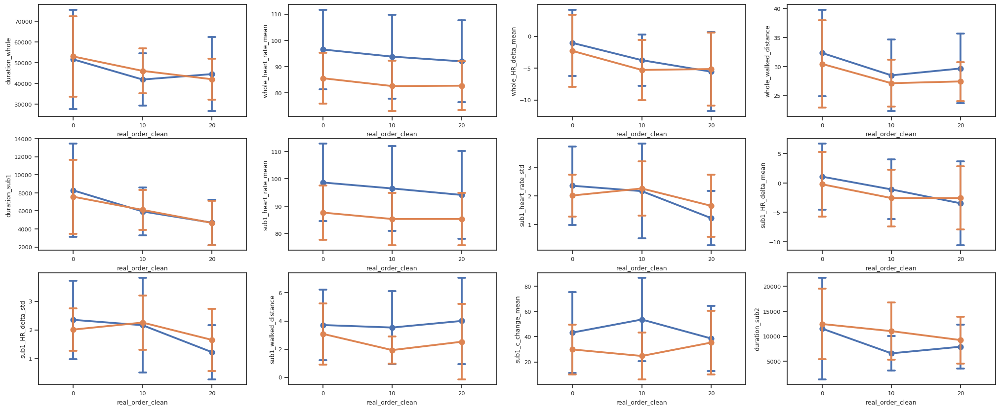

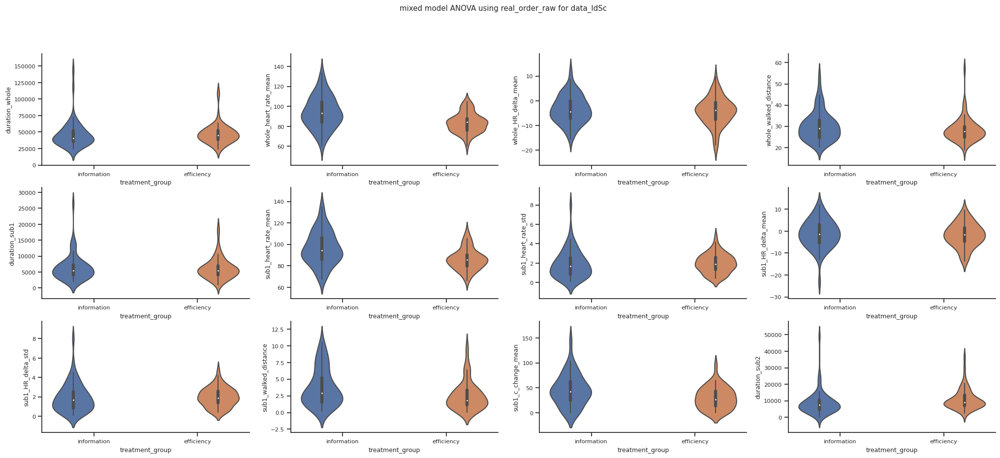

In [125]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(25, 10), sharey=False)
ax = ax.flatten()

fig_2, ax_2 = plt.subplots(nrows=3, ncols=4, figsize=(25, 10), sharey=False)
ax_2 = ax_2.flatten()

# temp_data = data[data["Scenario"]!="C"]#.drop_duplicates(subset=["Participant ID"])#.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23")
plt.suptitle("mixed model ANOVA using real_order_raw for data_IdSc")
sns.set(context='notebook', font_scale=1)


for i in range(len(significant_metrics_mixed_anova_w_time_data_IdSc)):
  
    metric = significant_metrics_mixed_anova_w_time_data_IdSc[i]
    if metric.endswith("trans"): metric = metric[:-6]
    
    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc
    #     # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     # print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    # norm_metric, txt = best_normalize_from_R(chosen_df, raw_metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    sns.violinplot(data=temp_chosen_df, x='treatment_group', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax_2[i])
    sns.despine()
    if metric in data_unique:
        # compute_simple_ANOVA(metric, temp_data.drop_duplicates(subset=["Participant ID"]), significant_metrics_list_mixed_anova)   
        sns.pointplot(data=temp_chosen_df, x='treatment_group', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax[i])
        sns.despine()
    else:
        # compute_mixed_ANOVA(metric, temp_data, significant_metrics_list_mixed_anova, "old_index_02")
        sns.pointplot(data=temp_chosen_df, x='real_order_clean', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax[i])
        sns.despine()
    ax[i].get_legend().remove()
    ax_2[i].get_legend().remove()

    
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')
plt.tight_layout()
plt.show()

In [ ]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(25, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires using mixed model ANOVA using real_order_raw for data_IdSc")

cols_of_interest = significant_metrics_mixed_anova_w_time_data_IdSc

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    
    if col_name.endswith("trans"): col_name = col_name[:-6]
    
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=5, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="real_order_clean", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"], linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="real_order_clean", y=col_name, ax=ax[i], palette=ibm_01_d, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
                
    sns.pointplot(data=temp_chosen_df, x='real_order_clean', y=col_name, hue="treatment_group", estimator=np.median,
                  dodge=0.45, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ci='sd', ax=ax[i], scale=0.5)
    sns.boxplot(data=temp_chosen_df, x="real_order_clean", y=col_name, showmeans=True,
                ax=ax[i], palette=ibm_01_d, width=0.0, meanprops=meanprops)
#     if 
#     pairs=[("A", "B"), ("B", "C"), ("A", "C")]

#     annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=cols_of_interest[i])
#     annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#     annotator.apply_and_annotate()
    
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')
sns.despine(trim=True)
plt.tight_layout()
plt.show()

### Did the **Scenario** or the information **treatment** affect the **phisiological responses**?
+ using data aggregation **data_IdSc**
 
This one has a medium level of summarization and reflects the actual scenarios.

In [ ]:
cols_of_interest = dv_repeated_num
significant_metrics_mixed_anova_w_Sc_in_data_IdSc = []
report_str = []
summary_df = pd.DataFrame()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # selecting the right dataset
    if metric in dv_repeated_cat or metric in dv_repeated_num:
        chosen_df = data_IdSc
        # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    norm_metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, norm_metric)
    
    # print(metric)
    # if metric in data_unique:
    #     compute_simple_ANOVA(norm_metric, temp_chosen_df, significant_metrics_list_mixed_anova_02)        
    # else:
    significant_metrics_mixed_anova_w_Sc_in_data_IdSc, report_str, summary_df = compute_mixed_ANOVA(norm_metric, 
                                                                         temp_chosen_df, 
                                                                         "Scenario", "treatment_group", 
                                                                         significant_metrics_mixed_anova_w_Sc_in_data_IdSc, report_str, summary_df)
        # compute_mixed_ANOVA(metric, temp_data.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23"), 
        #                     significant_metrics_list_mixed_anova_02, "real_order_clean")

In [ ]:
summary_df

In [ ]:
print("RESULTS report:")
for line in report_str:
    print(line)

In [ ]:
print(significant_metrics_mixed_anova_w_Sc_in_data_IdSc)
print(len(significant_metrics_mixed_anova_w_Sc_in_data_IdSc))

In [ ]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant phisiological responses based on Scenario")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="Scenario", y=cols_of_interest[i], ax=ax[i], cut=0, palette=tc.tol_cset('pale'), linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=cols_of_interest[i], ax=ax[i], palette=tc.tol_cset('light'), width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        pairs = [("A", "B")]
    else:
        pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=cols_of_interest[i])
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

sns.despine(trim=True)
plt.tight_layout()
plt.show()

In [ ]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant phisiological based on treatment")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=cols_of_interest[i], ax=ax[i], cut=0, palette=tc.tol_cset('pale'), linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=cols_of_interest[i], ax=ax[i], palette=tc.tol_cset('light'), width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    

    pairs=[("information", "efficiency")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=cols_of_interest[i])
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

sns.despine(trim=True)
plt.tight_layout()
plt.show()

In [ ]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant phisiological responses")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    
    if col_name.endswith("trans"): col_name = col_name[:-6]
    
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=5, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"], linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, ax=ax[i], palette=ibm_01_d, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
                
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.median,
                  dodge=0.45, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ci='sd', ax=ax[i], scale=0.5)
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=ibm_01_d, width=0.0, meanprops=meanprops)
#     if 
#     pairs=[("A", "B"), ("B", "C"), ("A", "C")]

#     annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=cols_of_interest[i])
#     annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#     annotator.apply_and_annotate()
    
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')
sns.despine(trim=True)
plt.tight_layout()
plt.show()

#### run with real_order_clean in **data_IdSc_02**
Medium level of aggregation, for taking into account the survey (SSS, willingness to cross, and safety perception) metrics as repeated measures **cols_sss_willing_safe**.
Sanity check for the order - time factor.

It is needed to dissolve the scenario data per factor.

In [ ]:
# new metrics
cols_sss_willing_safe

In [ ]:
significant_metrics_mixed_anova_w_time_in_data_IdSc_02 = []
report_str = []
summary_df = pd.DataFrame()
for i in range(len(cols_sss_willing_safe)):
  
    metric = cols_sss_willing_safe[i]
    
    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
        # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    norm_metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, norm_metric)
    
    # print(metric)
    # if metric in data_unique:
    #     compute_simple_ANOVA(norm_metric, temp_chosen_df, significant_metrics_list_mixed_anova_02)        
    # else:
    significant_metrics_mixed_anova_w_time_in_data_IdSc_02, report_str, summary_df = compute_mixed_ANOVA(norm_metric, 
                                                                         temp_chosen_df, 
                                                                         "real_order_clean", "treatment_group", 
                                                                         significant_metrics_mixed_anova_w_time_in_data_IdSc_02, report_str, summary_df)
        # compute_mixed_ANOVA(metric, temp_data.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23"), 
        #                     significant_metrics_list_mixed_anova_02, "real_order_clean")

In [ ]:
summary_df

In [ ]:
print("RESULTS report:")
for line in report_str:
    print(line)

When checked the repeated measures applied to the survey self-reported metrics using the time-order as within factor, only activity measured in the SSS is significantly different, but for the actual treatment.

**Time or order has not effect on the results.**

### Did the **Scenario** or the information **treatment** affect the structured responses in the **survey**?
(willingness to cross, safety perception, SSS -stress-)

The impact of the main intervention (information treatment, which is a between subject factor) and the secondary intervention (scenario types, which is a within subject factor) can be studied at different levels of aggregation. 

**(1)** Firsly, we can study the average effect of each of the interventions (criteria to compare):
- Responses ~ Scenarios (e.g., safeA vs safeB vs safeC) (i.e., average responses per scenario)
- Responses ~ Treatments (e.g., safeInf vs safeEffi) (i.e., average responses per treatment)

**(2)** Secondly, we can disagregate the responses per each of the subgroups resulting of combining treatments and scenarios for analysis differences across them: 

- Responses per treatment ~ Scenarios (e.g., safeAInf vs safeBInf vs safeCInf) (i.e., are the same treatment responses significantly changing based on the scenario?)
- Responses per treatment in the same Scenario (e.g., safeAInf vs SafeAEffi) (i.e., are the same scenario responses significantly changing depending on the treatment?)

For **(1)** the pair comparison across averages:
+ using data aggregation **data_IdSc_02**
+ Medium level of aggregation, for taking into account the survey (SSS, willingness to cross, and safety perception) metrics as repeated measures **cols_sss_willing_safe**.
+ Dissolving the columns divided by scenario, and aggregating all columns in one single columns with rows per scenario.


In [ ]:
# new metrics
cols_sss_willing_safe

Given that scenario is a within subject factor, we require a method able to address repeated measures. Each participant in the experiment was asked three times, one after each scenario. Consequently, initially we perform a **mixed ANOVA model for repeated measures**, with treatment as between-subjects factor, and scenario as within subject factor:

In [126]:
significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02 = []
report_str = []
summary_df = pd.DataFrame()
for i in range(len(cols_sss_willing_safe)):
  
    metric = cols_sss_willing_safe[i]
    
    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
        # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    norm_metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, norm_metric)
    
    # print(metric)
    # if metric in data_unique:
    #     compute_simple_ANOVA(norm_metric, temp_chosen_df, significant_metrics_list_mixed_anova_02)        
    # else:
    significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02, report_str, summary_df = compute_mixed_ANOVA(norm_metric, 
                                                                         temp_chosen_df, 
                                                                         "Scenario", "treatment_group", 
                                                                         significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02, report_str, summary_df)
        # compute_mixed_ANOVA(metric, temp_data.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23"), 
        #                     significant_metrics_list_mixed_anova_02, "real_order_clean")

In [127]:
summary_df

Source         SS  DF1  DF2         MS  \
metric                                                                         
sss_active_delta_trans    0  treatment_group   9.352173    1   41   9.352173   
                          1         Scenario   0.425831    2   82   0.212916   
                          2      Interaction   0.204340    2   82   0.102170   
will_Cross_night_trans    0  treatment_group   0.002201    1   41   0.002201   
                          1         Scenario  29.406357    2   82  14.703179   
                          2      Interaction   0.653803    2   82   0.326902   
will_cross_with_kid_trans 0  treatment_group   1.431405    1   41   1.431405   
                          1         Scenario  32.844857    2   82  16.422428   
                          2      Interaction   0.849602    2   82   0.424801   
attractiveness_trans      0  treatment_group   0.050486    1   41   0.050486   
                          1         Scenario  25.081907    2   82  12.540953   
                          2      Interaction   0.311978    2   82   0.155989   
safe_to_cars_trans        0  treatment_group   0.087428    1   41   0.087428   
                          1         Scenario  34.960974    2   82  17.480487   
                          2      Interaction   1.240820    2   82   0.620410   
safe_to_pedestrians_trans 0  treatment_group   0.346351    1   41   0.346351   
                          1         Scenario   5.901619    2   82   2.950809   
                          2      Interaction   1.555536    2   82   0.777768   

                                     F         p-unc       np2       eps  \
metric                                                                     
sss_active_delta_trans    0   4.568532  3.857636e-02  0.100256       NaN   
                          1   0.512189  6.010867e-01  0.012338  0.979846   
                          2   0.245780  7.826683e-01  0.005959       NaN   
will_Cross_night_trans    0   0.002150  9.632418e-01  0.000052       NaN   
                          1  33.165224  2.792063e-11  0.447180  0.871637   
                          2   0.737376  4.815124e-01  0.017667       NaN   
will_cross_with_kid_trans 0   1.888846  1.767985e-01  0.044040       NaN   
                          1  30.893568  9.996468e-11  0.429713  0.928264   
                          2   0.799128  4.531919e-01  0.019118       NaN   
attractiveness_trans      0   0.050034  8.241145e-01  0.001219       NaN   
                          1  25.958697  1.845234e-09  0.387682  0.950527   
                          2   0.322883  7.249746e-01  0.007814       NaN   
safe_to_cars_trans        0   0.147884  7.025533e-01  0.003594       NaN   
                          1  29.614711  2.086582e-10  0.419384  0.965260   
                          2   1.051073  3.542239e-01  0.024995       NaN   
safe_to_pedestrians_trans 0   0.200538  6.566440e-01  0.004867       NaN   
                          1   4.899569  9.772036e-03  0.106745  0.971446   
                          2   1.291418  2.804115e-01  0.030536       NaN   

                                p-GG-corr sphericity   W-spher   p-spher  
metric                                                                    
sss_active_delta_trans    0           NaN        NaN       NaN       NaN  
                          1           NaN        NaN       NaN       NaN  
                          2           NaN        NaN       NaN       NaN  
will_Cross_night_trans    0           NaN        NaN       NaN       NaN  
                          1  3.207673e-10      False  0.852733  0.038165  
                          2           NaN        NaN       NaN       NaN  
will_cross_with_kid_trans 0           NaN        NaN       NaN       NaN  
                          1           NaN        NaN       NaN       NaN  
                          2           NaN        NaN       NaN       NaN  
attractiveness_trans      0           NaN        NaN       NaN       NaN  
                

In [128]:
print("RESULTS report:")
for line in report_str:
    print(line)

RESULTS report:
For sss_active_delta, after transforming:  treatment_group is statistcally significant (with p = 0.0386).  
For will_Cross_night, after transforming:   Scenario is statistcally significant (with p = 0.0000). 
For will_cross_with_kid, after transforming:   Scenario is statistcally significant (with p = 0.0000). 
For attractiveness, after transforming:   Scenario is statistcally significant (with p = 0.0000). 
For safe_to_cars, after transforming:   Scenario is statistcally significant (with p = 0.0000). 
For safe_to_pedestrians, after transforming:   Scenario is statistcally significant (with p = 0.0098). 


Same results that found on http://localhost:8888/lab/tree/repos/street-crossing-analysis/scripts/jasv_generate_summary_sessions_v0.6.ipynb
without repeated measures

+ From SSS, reporting of activity levels are significantly different based on the treatment group.
+ From the rest of the survey, willingness to cross, attractivenes and safety perception are more sensitive to change in the scenarios.

In [129]:
print(significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02)
print(len(significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02))

['sss_active_delta_trans', 'will_Cross_night_trans', 'will_cross_with_kid_trans', 'attractiveness_trans', 'safe_to_cars_trans', 'safe_to_pedestrians_trans']
6


Then, we perform a post-hoc pair-wise analysis using a Wilcoxon test able to overcome violation of normality and variance in the samples, and adjusted for the multiple comparisons using Holm-Bonferroni.

A vs. B: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.803e-01 U_stat=8.255e+02
B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:8.665e-01 U_stat=9.050e+02
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:3.040e-01 U_stat=8.080e+02
A vs. B: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.165e-02 U_stat=1.144e+03
B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.698e-05 U_stat=1.420e+03
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.250e-08 U_stat=1.548e+03
A vs. B: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.646e-03 U_stat=1.284e+03
B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.718e-04 U_stat=1.344e+03
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:7.795e-10 U_stat=1.

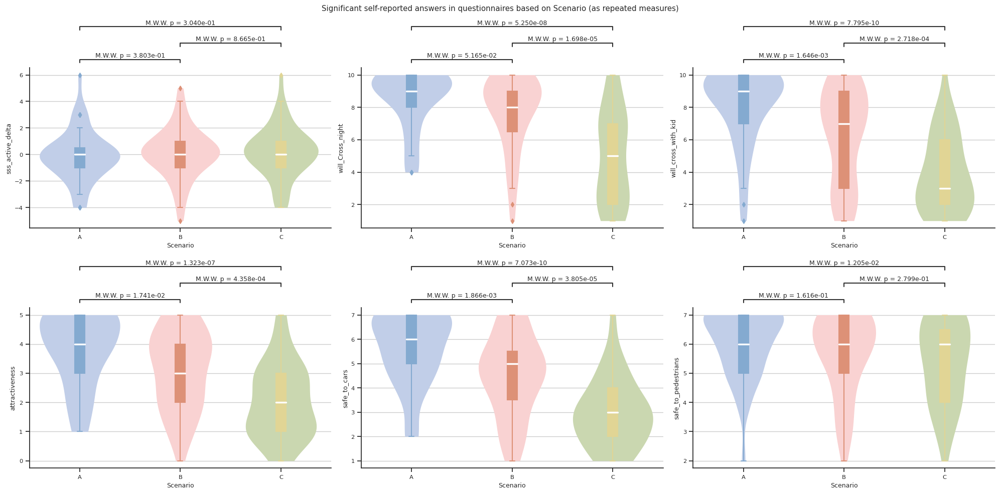

In [130]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario (as repeated measures)")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="Scenario", y=col_name, ax=ax[i], cut=0, palette=tc.tol_cset('pale'), linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, ax=ax[i], palette=tc.tol_cset('light'), width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

    sns.despine(trim=False)
plt.tight_layout()
plt.show()

All the changes in scenarios affect significantly (p < 0.05) in average the willingness to cross during the night and with a kid of the participants. As well, it affect the general attractiveness of the scenarios and the perceived safety with regards to cars. However, in the perceived safety to pedestrians, only the difference between scenarios A and C is significant. In general, scenario A is perceived as the safest, most attractive and most willing to be crossed, followed by B. Consequently, C is the one which is perceived as the least attractive and safe.

information vs. efficiency: Kruskal-Wallis independent samples (pairwise between groups) with Holm-Bonferroni correction, P_val:1.561e-03 Stat=1.001e+01


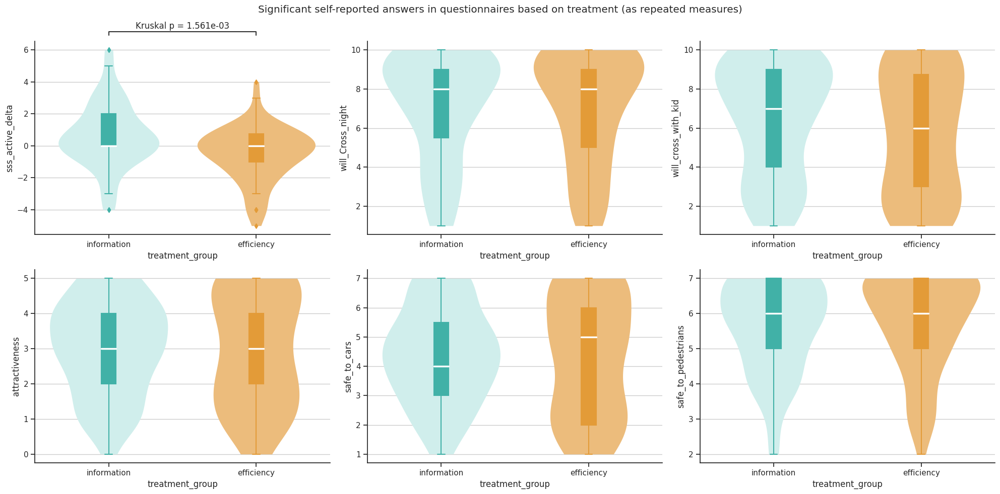

In [131]:
sns.set(font_scale=1)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on treatment (as repeated measures)")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    pairs=[("information", "efficiency")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

    sns.despine(trim=False)
plt.tight_layout()
plt.show()

In [132]:
order = sorted(list(set(data_IdSc_02.scenario__treatment)))
order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
print(order)
list(itertools.combinations(order, 2))


['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']


[('Ainformation', 'Aefficiency'),
 ('Ainformation', 'Binformation'),
 ('Ainformation', 'Befficiency'),
 ('Ainformation', 'Cinformation'),
 ('Ainformation', 'Cefficiency'),
 ('Aefficiency', 'Binformation'),
 ('Aefficiency', 'Befficiency'),
 ('Aefficiency', 'Cinformation'),
 ('Aefficiency', 'Cefficiency'),
 ('Binformation', 'Befficiency'),
 ('Binformation', 'Cinformation'),
 ('Binformation', 'Cefficiency'),
 ('Befficiency', 'Cinformation'),
 ('Befficiency', 'Cefficiency'),
 ('Cinformation', 'Cefficiency')]

In contrast, when comparing the averages responses per information treatment, only the report of activity level is significantly different (p=1.574e-03, stat=2.733e+03).
In average, information treatment has not a significant effect on the safety, attractiveness and willingness to cross by participants.

Then, a more detailed pair-wise comparison **(2)** of the differences between subgroups of the combinations of the two treatments and the three scenarios allows to identify the fine-grained effect of the treatment.

Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:9.644e-04 U_stat=3.820e+02
Binformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:6.884e-03 U_stat=3.275e+02
Aefficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.279e-04 U_stat=3.885e+02
Ainformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.562e-05 U_stat=3.905e+02
Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.196e-03 U_stat=3.720e+02
Ainformation vs. Binformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:7.083e-03 U_stat=3.260e+02
Aefficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.312e-05 U_stat=4.215e+02
Ainformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided wi

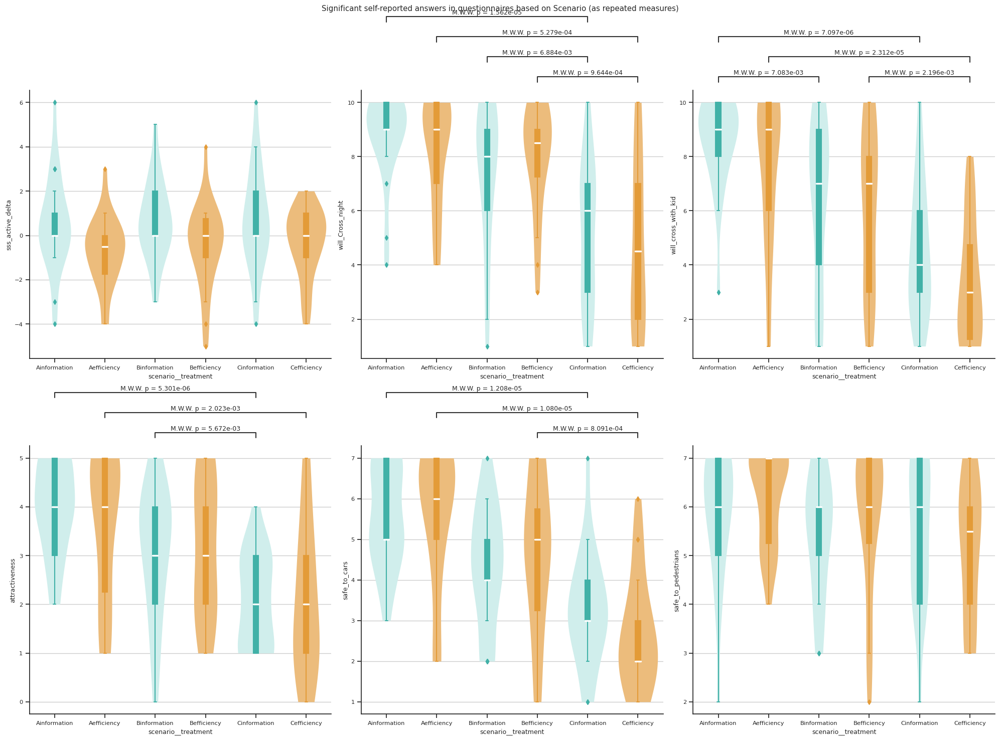

In [133]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 15), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario (as repeated measures)")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], palette=["#2ec4b6", "#ff9f1c"]*3, width=0.10, order=order)#, #tc.tol_cset('light') #ibm_02
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    
    pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

    sns.despine(trim=False)
plt.tight_layout()
plt.show()

Ainformation vs. Aefficiency: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:9.897e-01 U_stat=3.225e+02
Binformation vs. Befficiency: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:9.677e-01 U_stat=3.045e+02
Cinformation vs. Cefficiency: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:9.234e-01 U_stat=2.880e+02
Aefficiency vs. Befficiency: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:1.917e-01 U_stat=2.055e+02
Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:3.450e-01 U_stat=2.250e+02
Ainformation vs. Binformation: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:3.727e-01 U_stat=2.075e+02
Binformation vs. Cinformation: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferroni correction, P_val:5.000e-01 U_stat=2.200e+02
Aefficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test smaller with Holm-Bonferron

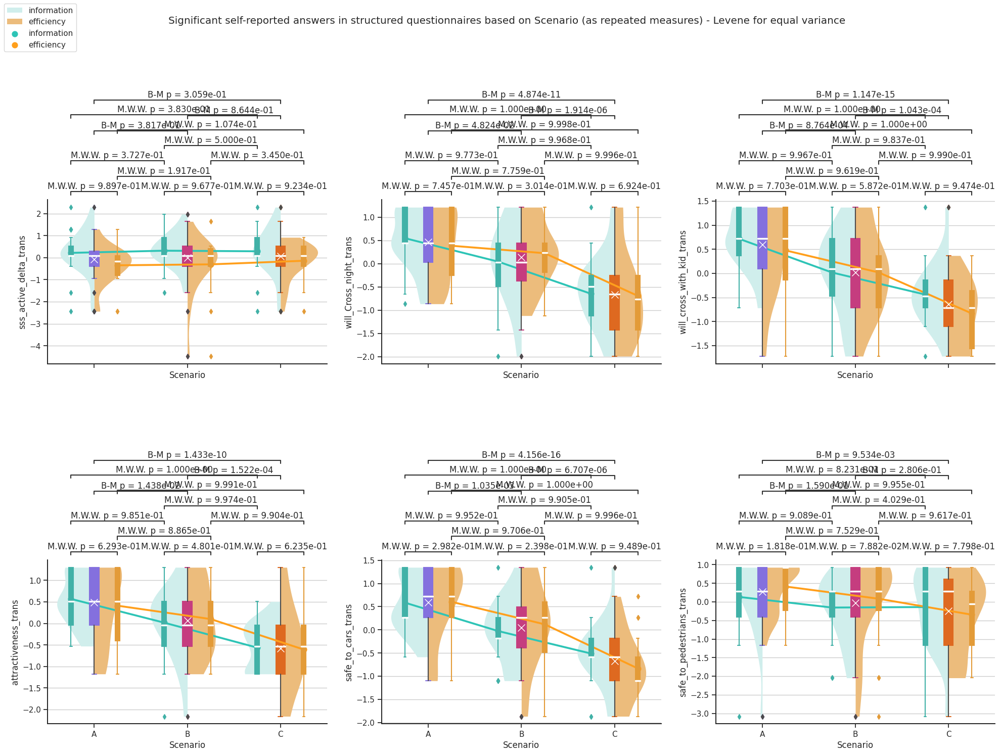

In [134]:
sns.set(font_scale=1)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 15), sharey=False, sharex=True)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in structured questionnaires based on Scenario (as repeated measures) - Levene for equal variance")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name#[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    
    pairs= [('Ainformation', 'Aefficiency'), ('Binformation', 'Befficiency'), ('Cinformation', 'Cefficiency'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=False)
    annotator.configure(test='Mann-Whitney-ls', text_format='full', loc='outside', comparisons_correction="holm")
    annotator.apply_and_annotate()

    
    pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=["A", "B", "C"], hide_non_significant=False)
    annotator.configure(test='Brunner-Munzel', text_format='full', loc='outside', comparisons_correction="holm")
    # annotator.apply_and_annotate()
    annotator.apply_test().annotate(line_offset_to_group=0.4)
    
#     if i==0:
#         pairs = [("Ainformation","Aefficiency")]
#         annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
#         annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#         annotator.apply_and_annotate()
    
#     if i==5:
#         pairs = [("Aefficiency","Cefficiency")]
#         annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
#         annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#         annotator.apply_and_annotate()

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left')
plt.tight_layout()
plt.show()

# test: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel.

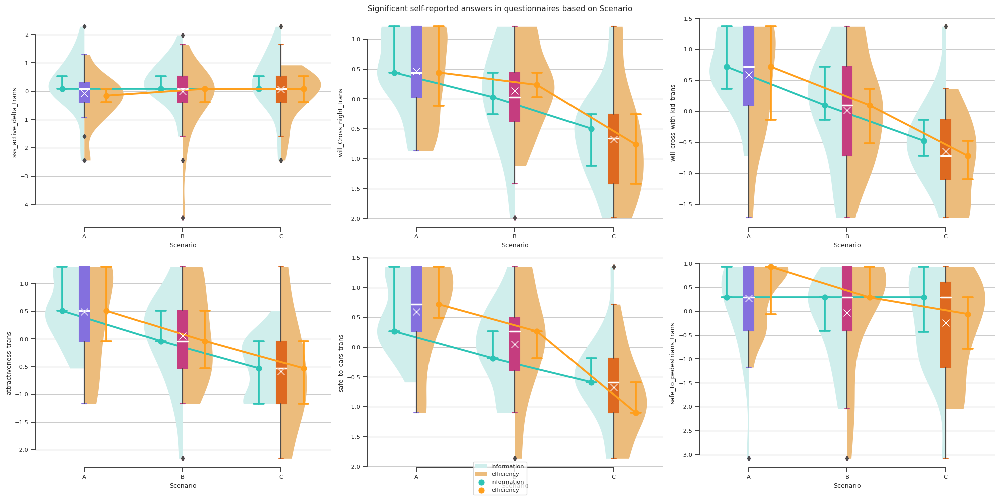

In [135]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario")

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=cols_of_interest[i], ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"], linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=cols_of_interest[i], showmeans=True,
                ax=ax[i], palette=ibm_01_d, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
                
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
                  dodge=0.45, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, errobar=("pi",0.5), ax=ax[i], lw=0.25)
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=cols_of_interest[i], showmeans=True,
                ax=ax[i], palette=ibm_01_d, width=0.0, meanprops=meanprops)
    
#     pairs=[("A", "B"), ("B", "C"), ("A", "C")]

#     annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=cols_of_interest[i])
#     annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#     annotator.apply_and_annotate()
     
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')
sns.despine(trim=True)
plt.tight_layout()
plt.show()

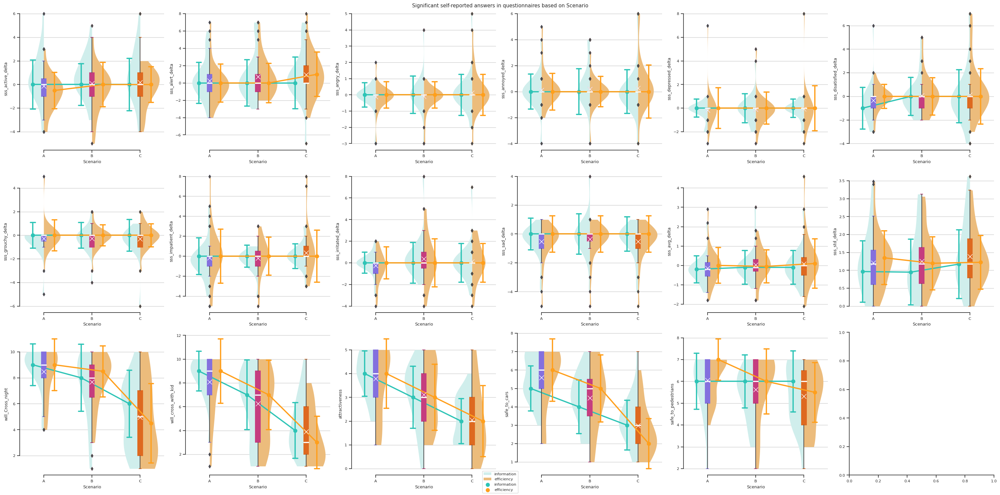

In [136]:
## all
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=6, figsize=(30, 15), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario")

cols_of_interest = cols_sss_willing_safe

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=cols_of_interest[i], ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"], linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=cols_of_interest[i], showmeans=True,
                ax=ax[i], palette=ibm_01_d, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
                
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
                  dodge=0.45, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ci='sd', ax=ax[i], lw=0.25)
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=cols_of_interest[i], showmeans=True,
                ax=ax[i], palette=ibm_01_d, width=0.0, meanprops=meanprops)
    
    
    ###
    
    
#     pairs=[("A", "B"), ("B", "C"), ("A", "C")]

#     annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=cols_of_interest[i])
#     annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#     annotator.apply_and_annotate()
    
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')
sns.despine(trim=True)
plt.tight_layout()
plt.show()

Additionally, the slope, or jump between scenarios can be compared regarding the differences across treatments.

#### run with *real_order_clean* in **data_IdScCon**
This one has a low level of summarization and follows the real random order experienced by the participants.

This analysis entails some issues as the order of the configuration were not randomized.

In [504]:
data_IdScCon.head(4)

,Participant ID,treatment_group,Scenario,Configuration,Config_recoded,Participant_ID,old_index_02,real_order_clean,real_order_raw,neighborhood_recoded,gender,own_car,driving_license,experience_vr_recoded,country_raised_CH,m_walk,age,km_drive_recoded_num,experiments_recoded,fav_recoded,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,Successful?,duration_whole,whole_heart_rate_mean,whole_heart_rate_std,whole_displacement_mean,whole_displacement_std,whole_angle_change_mean,whole_angle_change_std,whole_a_change_mean,whole_a_change_std,whole_b_change_mean,whole_b_change_std,whole_c_change_mean,whole_c_change_std,duration_sub1,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_displacement_mean,sub1_displacement_std,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_mean,sub1_c_change_std,duration_sub2,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_displacement_mean,sub2_displacement_std,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_mean,sub2_c_change_std,duration_sub3,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_displacement_mean,sub3_displacement_std,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_mean,sub3_c_change_std,duration_sub4,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_displacement_mean,sub4_displacement_std,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_mean,sub4_c_change_std,duration_whole_trans,whole_heart_rate_mean_trans,whole_heart_rate_std_trans,whole_displacement_mean_trans,whole_displacement_std_trans,whole_angle_change_mean_trans,whole_angle_change_std_trans,whole_a_change_mean_trans,whole_a_change_std_trans,whole_b_change_mean_trans,whole_b_change_std_trans,whole_c_change_mean_trans,whole_c_change_std_trans,duration_sub1_trans,duration_sub2_trans,duration_sub3_trans,duration_sub4_trans,sub4_heart_rate_mean_trans,sub4_heart_rate_std_trans,sub4_displacement_mean_trans,sub4_displacement_std_trans,sub4_angle_change_mean_trans,sub4_angle_change_std_trans,sub4_a_change_mean_trans,sub4_a_change_std_trans,sub4_b_change_mean_trans,sub4_b_change_std_trans,sub4_c_change_mean_trans,sub4_c_change_std_trans
0,1,information,A,RH,aRH,1,0,0,0,dense,Male,yes,yes,NaN,1,yes,36.0,50.0,2.0,c,0.0,-2.0,0.0,1.0,0.0,-1.0,-1.0,0.0,1.0,0.0,-0.2,0.918937,10.0,10.0,4.0,5.0,6.0,0.0,1.0,1.0,2.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.3,0.948683,7.0,6.0,2.0,6.0,4.0,1.0,1.0,1.0,2.0,1.0,-1.0,-1.0,0.0,0.0,0.0,0.2,1.032796,7.0,4.0,2.0,5.0,4.0,True,96977.0,86.792230,4.057934,0.542632,0.726901,39.883587,51.183744,16.520043,36.623347,23.363544,38.277309,56.411078,55.642827,23978.0,88.797355,4.023906,0.050178,0.043687,51.413815,60.911111,18.107567,36.504758,33.306248,46.897697,80.843391,57.357798,41993.0,86.309512,3.604093,0.826014,0.867681,43.523683,53.893206,17.665413,39.652893,25.858270,44.160469,51.605492,55.2185

In [505]:
significant_metrics_mixed_anova_w_time_data_IdScCon = []
report_str = []
summary_df = pd.DataFrame()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # selecting the right dataset
    if metric in dv_repeated_cat or metric in dv_repeated_num:
        chosen_df = data_IdScCon
        # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    norm_metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, norm_metric)
    
    # print(metric)
    # if metric in data_unique:
    #     compute_simple_ANOVA(norm_metric, temp_chosen_df, significant_metrics_list_mixed_anova_02)        
    # else:
    significant_metrics_mixed_anova_w_time_data_IdScCon, report_str, summary_df = compute_mixed_ANOVA(norm_metric, 
                                                                         temp_chosen_df, 
                                                                         "real_order_clean", "treatment_group", 
                                                                         significant_metrics_mixed_anova_w_time_data_IdScCon, report_str, summary_df)
        # compute_mixed_ANOVA(metric, temp_data.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23"), 
        #                     significant_metrics_list_mixed_anova_02, "real_order_clean")

In [506]:
summary_df

Source           SS  DF1  DF2  \
metric                                                                     
duration_whole_trans          0   treatment_group     0.631139    1   40   
                              1  real_order_clean    68.029545    5  200   
                              2       Interaction     4.919012    5  200   
whole_heart_rate_mean_trans   0   treatment_group    24.515677    1   40   
                              1  real_order_clean     5.059993    5  200   
                              2       Interaction     0.806890    5  200   
whole_heart_rate_std_trans    0   treatment_group     0.540721    1   40   
                              1  real_order_clean    20.950242    5  200   
                              2       Interaction     0.977686    5  200   
whole_displacement_mean_trans 0   treatment_group     3.126485    1   40   
                              1  real_order_clean    81.894520    5  200   
                              2       Interaction     2.876152    5  200   
whole_displacement_std_trans  0   treatment_group     4.980863    1   40   
                              1  real_order_clean    16.076999    5  200   
                              2       Interaction     4.016568    5  200   
whole_b_change_mean_trans     0   treatment_group     0.567691    1   40   
                              1  real_order_clean     5.951495    3  120   
                              2       Interaction     0.692330    3  120   
whole_b_change_std_trans      0   treatment_group     1.055586    1   40   
                              1  real_order_clean     5.563349    3  120   
                              2       Interaction     1.850242    3  120   
duration_sub1_trans           0   treatment_group     0.383555    1   40   
                              1  real_order_clean    63.258361    5  200   
                              2       Interaction     2.492777    5  200   
sub1_heart_rate_mean          0   treatment_group  5360.006380    1   34   
                              1  real_order_clean   965.194990    5  170   
                              2       Interaction   165.061519    5  170   
sub1_heart_rate_std           0   treatment_group     1.692536    1   26   
                              1  real_order_clean    51.633277    5  130   
                              2       Interaction    14.667172    5  130   
sub1_displacement_mean        0   treatment_group     1.857053    1   34   
                              1  real_order_clean    83.242615    5  170   
                              2       Interaction     3.716945    5  170   
sub1_displacement_std         0   treatment_group     0.652343    1   26   
                              1  real_order_clean   136.602237    5  130   
                              2       Interaction     2.228967    5  130   
sub1_b_change_mean            0   treatment_group   707.301638    1   34   
                              1  real_order_clean  9334.643408    3  102   
                              2       Interaction  1415.746041    3  102   
sub1_c_change_mean            0   treatment_group  8808.180158    1   34   
                              1  real_order_clean  1065.529373    3  102   
                              2       Interaction  1100.211025    3  102   
duration_sub2_trans           0   treatment_group    11.534957    1   40   
                              1  real_order_clean    27.473898    5  200   
                              2       Interaction     4.741511    5  200   
sub2_heart_rate_mean          0   treatment_group  2273.317131    1   32   
                              1  real_order_clean   520.951675    5  160   
                              2       Interaction   147.900342    5  160   
sub2_heart_rate_std           0   treatment_group    22.431238    1   31   
                              1  real_order_clean    31.153043    5  155   
                              2       Interaction     5.939829    5  155   
sub2_displaceme

In [507]:
print("RESULTS report:")
for line in report_str:
    print(line)

RESULTS report:
For duration_whole, after transforming:   real_order_clean is statistcally significant (with p = 0.0000). 
For whole_heart_rate_mean, after transforming:  treatment_group is statistcally significant (with p = 0.0266). real_order_clean is statistcally significant (with p = 0.0000). 
For whole_heart_rate_std, after transforming:   real_order_clean is statistcally significant (with p = 0.0001). 
For whole_displacement_mean, after transforming:   real_order_clean is statistcally significant (with p = 0.0000). 
For whole_displacement_std, after transforming:   real_order_clean is statistcally significant (with p = 0.0029). 
For whole_b_change_mean, after transforming:   real_order_clean is statistcally significant (with p = 0.0002). 
For whole_b_change_std, after transforming:   real_order_clean is statistcally significant (with p = 0.0015). 
For duration_sub1, after transforming:   real_order_clean is statistcally significant (with p = 0.0000). 
For sub1_heart_rate_mean:  t

In [508]:
print(significant_metrics_mixed_anova_w_time_data_IdScCon)
print(len(significant_metrics_mixed_anova_w_time_data_IdScCon))

['duration_whole_trans', 'whole_heart_rate_mean_trans', 'whole_heart_rate_std_trans', 'whole_displacement_mean_trans', 'whole_displacement_std_trans', 'whole_b_change_mean_trans', 'whole_b_change_std_trans', 'duration_sub1_trans', 'sub1_heart_rate_mean', 'sub1_heart_rate_std', 'sub1_displacement_mean', 'sub1_displacement_std', 'sub1_b_change_mean', 'sub1_c_change_mean', 'duration_sub2_trans', 'sub2_heart_rate_mean', 'sub2_heart_rate_std', 'sub2_displacement_mean', 'sub2_angle_change_std', 'sub2_b_change_mean', 'sub2_b_change_std', 'sub2_c_change_mean', 'duration_sub3_trans', 'sub3_heart_rate_mean', 'sub3_angle_change_std', 'sub3_c_change_mean', 'duration_sub4_trans', 'sub4_heart_rate_mean_trans', 'sub4_angle_change_mean_trans', 'sub4_angle_change_std_trans', 'sub4_b_change_mean_trans', 'sub4_b_change_std_trans']
32


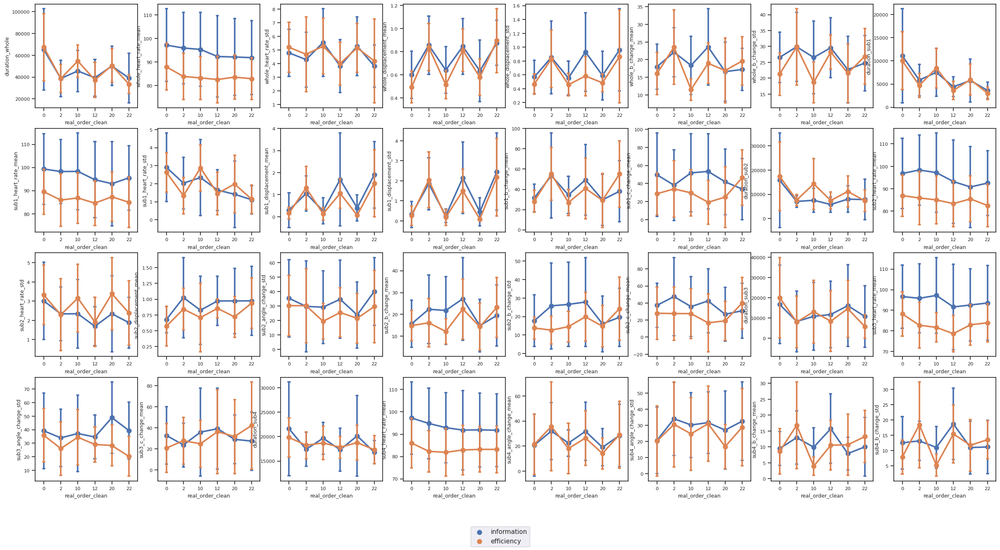

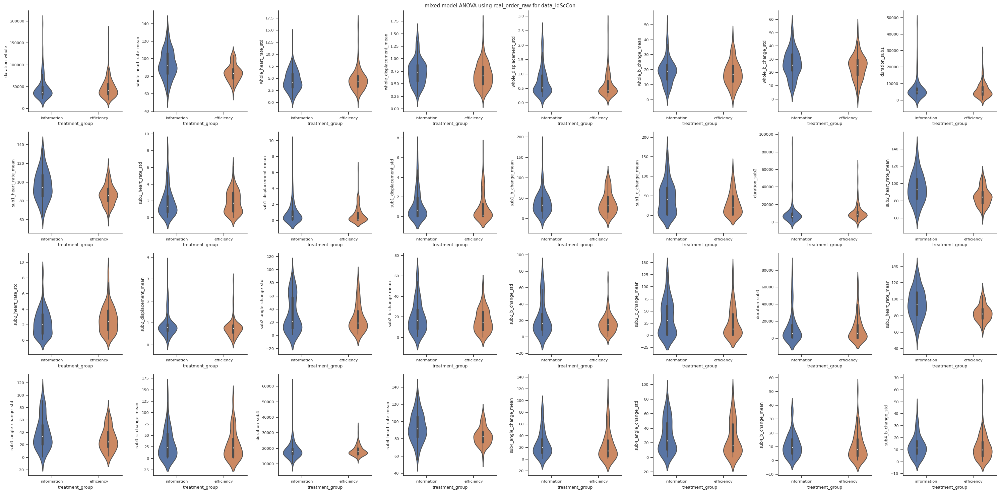

In [510]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(30, 15), sharey=False)
ax = ax.flatten()

fig_2, ax_2 = plt.subplots(nrows=4, ncols=8, figsize=(30, 15), sharey=False)
ax_2 = ax_2.flatten()

# temp_data = data[data["Scenario"]!="C"]#.drop_duplicates(subset=["Participant ID"])#.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23")
plt.suptitle("mixed model ANOVA using real_order_raw for data_IdScCon")
sns.set(context='notebook', font_scale=1)


for i in range(len(significant_metrics_mixed_anova_w_time_data_IdScCon)):
  
    metric = significant_metrics_mixed_anova_w_time_data_IdScCon[i]
    if metric.endswith("trans"): metric = metric[:-6]
    
    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdScCon
    #     # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     # print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    # norm_metric, txt = best_normalize_from_R(chosen_df, raw_metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    sns.violinplot(data=temp_chosen_df, x='treatment_group', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax_2[i])
    sns.despine()
    if metric in data_unique:
        # compute_simple_ANOVA(metric, temp_data.drop_duplicates(subset=["Participant ID"]), significant_metrics_list_mixed_anova)   
        sns.pointplot(data=temp_chosen_df, x='treatment_group', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax[i])
        sns.despine()
    else:
        # compute_mixed_ANOVA(metric, temp_data, significant_metrics_list_mixed_anova, "old_index_02")
        sns.pointplot(data=temp_chosen_df, x='real_order_clean', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax[i])
        sns.despine()
    ax[i].get_legend().remove()
    ax_2[i].get_legend().remove()

    
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')
plt.tight_layout()
plt.show()

#### run with *Scenario* in **data_IdScCon**
This one has a lower level of summarization and reflects the actual scenarios.

In [511]:
significant_metrics_mixed_anova_w_Sc_in_data_IdScCon = []
report_str = []
summary_df = pd.DataFrame()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # selecting the right dataset
    if metric in dv_repeated_cat or metric in dv_repeated_num:
        chosen_df = data_IdScCon
        # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    norm_metric, txt = best_normalize_from_R(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, norm_metric)
    
    # print(metric)
    # if metric in data_unique:
    #     compute_simple_ANOVA(norm_metric, temp_chosen_df, significant_metrics_list_mixed_anova_02)        
    # else:
    significant_metrics_mixed_anova_w_Sc_in_data_IdScCon, report_str, summary_df = compute_mixed_ANOVA(norm_metric, 
                                                                         temp_chosen_df, 
                                                                         "Scenario", "treatment_group", 
                                                                         significant_metrics_mixed_anova_w_Sc_in_data_IdScCon, report_str, summary_df)
        # compute_mixed_ANOVA(metric, temp_data.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23"), 
        #                     significant_metrics_list_mixed_anova_02, "real_order_clean")

In [512]:
summary_df

Source            SS  DF1  DF2  \
metric                                                                    
duration_whole_trans         0  treatment_group  3.474314e-01    1   41   
                             1         Scenario  7.884209e+00    2   82   
                             2      Interaction  3.546653e-01    2   82   
whole_heart_rate_mean_trans  0  treatment_group  1.535243e+01    1   41   
                             1         Scenario  4.556496e-02    2   82   
                             2      Interaction  3.099877e-01    2   82   
whole_displacement_std_trans 0  treatment_group  2.598090e+00    1   41   
                             1         Scenario  4.286443e-01    2   82   
                             2      Interaction  3.833746e+00    2   82   
whole_a_change_mean_trans    0  treatment_group  1.712550e-01    1   41   
                             1         Scenario  1.793755e+00    1   41   
                             2      Interaction  2.097654e-04    1   41   
whole_a_change_std_trans     0  treatment_group  3.175829e-01    1   41   
                             1         Scenario  1.621722e+00    1   41   
                             2      Interaction  5.613566e-03    1   41   
whole_b_change_mean_trans    0  treatment_group  4.548043e-01    1   41   
                             1         Scenario  3.547074e+00    1   41   
                             2      Interaction  2.421498e-04    1   41   
duration_sub1_trans          0  treatment_group  4.670669e-02    1   41   
                             1         Scenario  4.291481e+00    2   82   
                             2      Interaction  2.535625e+00    2   82   
sub1_heart_rate_mean         0  treatment_group  3.372997e+03    1   41   
                             1         Scenario  2.695906e+01    2   82   
                             2      Interaction  5.724038e+00    2   82   
sub1_displacement_std        0  treatment_group  2.620358e+00    1   41   
                             1         Scenario  1.858557e+00    2   82   
                             2      Interaction  6.674190e+00    2   82   
sub1_c_change_mean           0  treatment_group  5.156898e+03    1   41   
                             1         Scenario  1.786063e+02    1   41   
                             2      Interaction  6.357343e+01    1   41   
duration_sub2_trans          0  treatment_group  6.370544e+00    1   41   
                             1         Scenario  3.451155e+00    2   82   
                             2      Interaction  8.712704e-01    2   82   
sub2_heart_rate_mean         0  treatment_group  3.582237e+03    1   40   
                             1         Scenario  2.586690e+01    2   80   
                             2      Interaction  5.156655e+01    2   80   
sub2_displacement_mean       0  treatment_group  6.040023e-01    1   40   
                             1         Scenario  6.224641e-01    2   80   
                             2      Interaction  6.764511e-02    2   80   
sub2_angle_change_mean       0  treatment_group  7.806111e+02    1   40   
                             1         Scenario  1.318994e+03    1   40   
                             2      Interaction  1.114623e+02    1   40   
sub2_b_change_mean           0  treatment_group  3.380795e+02    1   40   
                             1         Scenario  9.049218e+02    1   40   
                             2      Interaction  5.709816e+01    1   40   
duration_sub3_trans          0  treatment_group  6.745674e-02    1   41   
                             1         Scenario  6.989312e+00    2   82   
                             2      Interaction  5.665325e-01    2   82   
sub3_heart_rate_mean         0  treatment_group  3.334874e+03    1   30   
                             1         Scenario  5.879043e+01    2   60   
                             2      Interaction  1.569542e+02    2   60   
sub3_angle_change_std        0  treatment_group  1.897426e+03    1

In [513]:
print("RESULTS report:")
for line in report_str:
    print(line)

RESULTS report:
For duration_whole, after transforming:   Scenario is statistcally significant (with p = 0.0001). 
For whole_heart_rate_mean, after transforming:  treatment_group is statistcally significant (with p = 0.0169).  
For whole_displacement_std, after transforming:    the interaction between treatment_group and Scenario is statistically significant (with p = 0.0106).
For whole_a_change_mean, after transforming:   Scenario is statistcally significant (with p = 0.0035). 
For whole_a_change_std, after transforming:   Scenario is statistcally significant (with p = 0.0071). 
For whole_b_change_mean, after transforming:   Scenario is statistcally significant (with p = 0.0000). 
For duration_sub1, after transforming:   Scenario is statistcally significant (with p = 0.0068). the interaction between treatment_group and Scenario is statistically significant (with p = 0.0489).
For sub1_heart_rate_mean:  treatment_group is statistcally significant (with p = 0.0101).  
For sub1_displaceme

In [514]:
print(significant_metrics_mixed_anova_w_Sc_in_data_IdScCon)
print(len(significant_metrics_mixed_anova_w_Sc_in_data_IdScCon))

['duration_whole_trans', 'whole_heart_rate_mean_trans', 'whole_displacement_std_trans', 'whole_a_change_mean_trans', 'whole_a_change_std_trans', 'whole_b_change_mean_trans', 'duration_sub1_trans', 'sub1_heart_rate_mean', 'sub1_displacement_std', 'sub1_c_change_mean', 'duration_sub2_trans', 'sub2_heart_rate_mean', 'sub2_displacement_mean', 'sub2_angle_change_mean', 'sub2_b_change_mean', 'duration_sub3_trans', 'sub3_heart_rate_mean', 'sub3_angle_change_std', 'sub3_a_change_mean', 'sub3_a_change_std', 'sub3_b_change_mean', 'sub3_b_change_std', 'sub3_c_change_mean', 'duration_sub4_trans', 'sub4_heart_rate_mean_trans', 'sub4_displacement_mean_trans', 'sub4_displacement_std_trans', 'sub4_angle_change_mean_trans', 'sub4_angle_change_std_trans', 'sub4_a_change_mean_trans', 'sub4_a_change_std_trans', 'sub4_b_change_mean_trans']
32


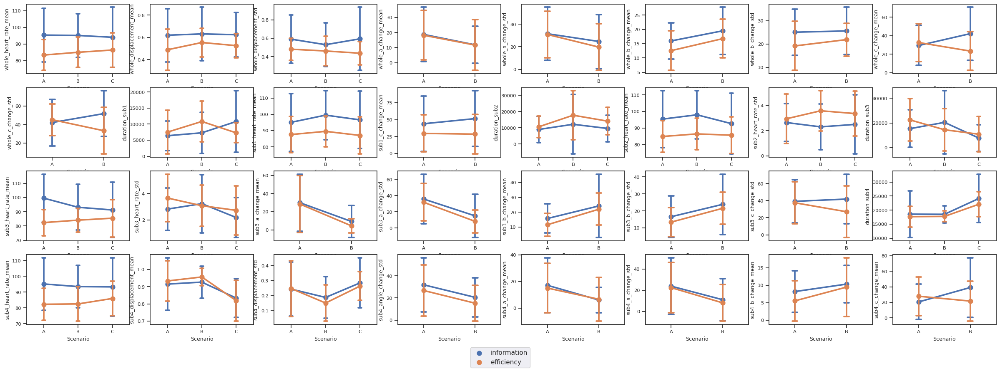

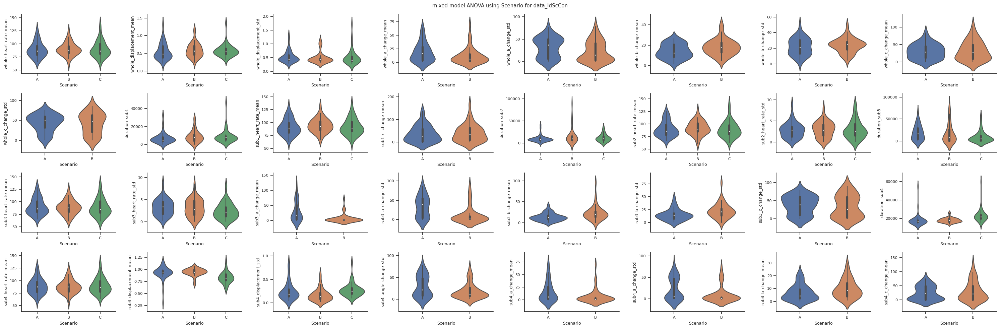

In [302]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(30, 10), sharey=False)
ax = ax.flatten()

fig_2, ax_2 = plt.subplots(nrows=4, ncols=8, figsize=(30, 10), sharey=False)
ax_2 = ax_2.flatten()

# temp_data = data[data["Scenario"]!="C"]#.drop_duplicates(subset=["Participant ID"])#.query("real_order_clean != 3 and real_order_clean != 11 and real_order_clean != 13 and real_order_clean != 23")
plt.suptitle("mixed model ANOVA using Scenario for data_IdScCon")
sns.set(context='notebook', font_scale=1)


for i in range(len(significant_metrics_mixed_anova_w_Sc_in_data_IdScCon)):
  
    metric = significant_metrics_mixed_anova_w_Sc_in_data_IdScCon[i]
    if metric.endswith("trans"): metric = metric[:-6]
    
    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdScCon
    #     # print("\trepeated dataset")
    # else:
    #     chosen_df = data_IdScCon_unique
    #     # print("\tunique dataset")
    
    # dropping scenario C for angles changes
    #check and transform if needed for skewness
    # norm_metric, txt = best_normalize_from_R(chosen_df, raw_metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    

    if metric in data_unique:
        # compute_simple_ANOVA(metric, temp_data.drop_duplicates(subset=["Participant ID"]), significant_metrics_list_mixed_anova)   
        sns.pointplot(data=temp_chosen_df, x='Scenario', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax[i])
        sns.despine()
    else:
        # compute_mixed_ANOVA(metric, temp_data, significant_metrics_list_mixed_anova, "old_index_02")
        sns.pointplot(data=temp_chosen_df, x='Scenario', y=metric, hue="treatment_group", capsize=.1, ci='sd', ax=ax[i])
        sns.despine()
    sns.violinplot(data=temp_chosen_df, x='Scenario', y=metric, capsize=.1, ci='sd', ax=ax_2[i])
    sns.despine()


    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')

plt.tight_layout()
plt.show()

## Aligned Rank Tranform Anova (ART Anova)
using R: https://stackoverflow.com/questions/43454085/accessing-a-r-user-defined-function-in-python

Contrast analysis developed in:https://arxiv.org/pdf/2102.11824.pdf

https://rcompanion.org/handbook/F_16.html

https://stats.stackexchange.com/questions/539829/does-aligned-rank-transform-anova-require-normally-distributed-data

In [1381]:
from rpy2.robjects import pandas2ri
from rpy2.robjects import numpy2ri
from rpy2.robjects.packages import STAP
# for rpy2 < 2.6.1
# from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage as STAP   

# from rpy2.ipython import html
# import rpy2.robjects as robjects
# from rpy2.robjects.packages import importr
# ARTool = importr("ARTool")
# base = importr('base')
# statspackage = importr('stats')
# from rpy2.robjects import pandas2ri
# pandas2ri.activate()
# rpy2.ipython.html.init_printing()

def art_anova_r(dv, fixed_effects, random_effects, p_adj, data):
    args = {"dv": dv,
           "fixed_effects": fixed_effects,
           "random_effects": random_effects,
           "p_adj": p_adj}
    

    r_fct_string = """    
    ART_anova <- function(data){{
      library(rcompanion)
      library(lme4)
      library(bestNormalize)
      library(ARTool)

      ##BN_obj <- bestNormalize(data${dv}, allow_lambert_s = TRUE, loo = TRUE)
      ##print(BN_obj)
      ##data${dv}_BN <- predict(BN_obj)

      data$treatment_group_f <- as.factor(data$treatment_group)
      data$age_f <- as.factor(data$age)
      data$gender_f <- as.factor(data$gender)
      data$Scenario_f <- as.factor(data$Scenario)
      data$own_car_f <- as.factor(data$own_car)
      data$driving_license_f <- as.factor(data$driving_license)
      data$m_walk_f <- as.factor(data$m_walk)
      data$experience_vr_recoded_f <- as.factor(data$experience_vr_recoded)
      
      ### Trad ANOVA
      #res_aov <- aov({dv}~{fixed_effects}, data = data)
      #print(summary(res_aov))

      ### Aligned ranks anova
      m <- art(formula = {dv}~{fixed_effects}+{random_effects}, data=data)
      #m <- art(formula = {dv}~{fixed_effects}, data=data)
      ##print(summary(m))
      m_anova <- anova(m)
      print(m_anova)
      m_anova <- as.data.frame(m_anova)
      #print("p-value")
      #print(summary(m)[[1]][["Pr(>F)"]][1])

      ### Post-hoc comparisons
      
      ## Tukey
      #print(TukeyHSD(res_aov, adjust="holm"))
      #plot(TukeyHSD(res_aov, adjust="holm"))
      

      marginal = art.con(m, formula= ~{fixed_effects}, adjust="{p_adj}") #BY #holm #BY #tukey #dunnettx
      print(marginal)

      Sum = as.data.frame(marginal)
      cldList(p.value ~ contrast, data=Sum)


      ### Partial eta-squared

      Result = anova(m)
      Result$part.eta.sq = with(Result, `F` * `Df` / (`F` * `Df` + `Df.res`))
      ##print(Result)


      ### Efron’s pseudo r-squared

      efron_r2 <- efronRSquared(actual = data$whole_heart_rate_mean, residual = m$residuals)
      ##print(efron_r2)

      MAPE <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "MAPE")

      RMSE <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "RMSE")

      CV <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "CV")

      list_results <- list("model"=m,
                           "model_anova"=m_anova,
                           "model_residuals"=m$residuals,
                           "model_anova_pval"=m_anova$"Pr(>F)",
                           "posthoc"=Sum,  
                           "eta2"=Result, 
                           "efron_r2"=efron_r2)

      return(list_results)
    }}
    """.format(**args)

    r_pkg = STAP(r_fct_string, "r_pkg")

    # convert pandas df to R df
    with robjects.default_converter + pandas2ri.converter:
        r_data = robjects.conversion.get_conversion().py2rpy(data)

    # call R function and passing arguments
    r_output = r_pkg.ART_anova(r_data)
    
    return r_output

##wrapper
def computer_art_r(metric, fixed_effects, random_effects, p_adj, data, list_significant_metrics):
    # computer ART Anova with R
    print("\n processing ART Anova for {}".format(metric))
    art_anova_r_output = art_anova_r(dv=metric,
                                        fixed_effects=fixed_effects,
                                        random_effects=random_effects,
                                        p_adj=p_adj,
                                        data=temp_chosen_df)
    # transforming the R output into Python dict
    art_anova_py_output = dict(zip(art_anova_r_output.names, list(art_anova_r_output)))
    # transform all values
    for key, value in art_anova_py_output.items():
         art_anova_py_output[key] = rpy2.robjects.conversion.rpy2py(value)
    
    anova_pval = art_anova_py_output["model_anova_pval"]
    # display(art_anova_py_output)
    # print("p_val \n {}".format(anova_pval[0]))
    alpha = 0.05
    # list_significant_metrics.append(metric)
    if (anova_pval < alpha).any():
        list_significant_metrics.append(metric)
        print("\t\t\t\t {} IS SIGNIFICANT".format(metric))
    else: print("\t\t\t\t {} not significant".format(metric))
    return art_anova_py_output
# r_output = art_anova_r(dv="whole_heart_rate_mean",
#             fixed_effects="treatment_group_f",
#             data=data)

In [749]:
from rpy2.robjects import pandas2ri
from rpy2.robjects import numpy2ri
from rpy2.robjects.packages import STAP
# for rpy2 < 2.6.1
# from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage as STAP   

# from rpy2.ipython import html
# import rpy2.robjects as robjects
# from rpy2.robjects.packages import importr
# ARTool = importr("ARTool")
# base = importr('base')
# statspackage = importr('stats')
# from rpy2.robjects import pandas2ri
# pandas2ri.activate()
# rpy2.ipython.html.init_printing()

def lmer_anova_r(dv, fixed_effects, p_adj, random_effects, data):
    args = {"dv": dv,
           "fixed_effects": fixed_effects,
           "random_effects": random_effects,
           "p_adj": p_adj}
    

    r_fct_string = """    
    ART_anova <- function(data){{
      library(rcompanion)
      library(lme4)
      library(bestNormalize)
      library(ARTool)

      ##BN_obj <- bestNormalize(data${dv}, allow_lambert_s = TRUE, loo = TRUE)
      ##print(BN_obj)
      ##data${dv}_BN <- predict(BN_obj)

      data$treatment_group_f <- as.factor(data$treatment_group)
      data$age_f <- as.factor(data$age)
      data$gender_f <- as.factor(data$gender)
      data$Scenario_f <- as.factor(data$Scenario)
      
      ### Trad ANOVA
      #res_aov <- aov({dv}~{fixed_effects}, data = data)
      #print(summary(res_aov))

      ### Aligned ranks anova
      #m <- art(formula = {dv}~{fixed_effects}+{random_effects}, data=data)
      m <- art(formula = {dv}~{fixed_effects}, data=data)
      ##print(summary(m))
      m_anova <- anova(m)
      print(m_anova)
      m_anova <- as.data.frame(m_anova)
      #print("p-value")
      #print(summary(m)[[1]][["Pr(>F)"]][1])

      ### Post-hoc comparisons
      
      ## Tukey
      #print(TukeyHSD(res_aov, adjust="holm"))
      #plot(TukeyHSD(res_aov, adjust="holm"))
      

      marginal = art.con(m, formula= ~{fixed_effects}, adjust="{p_adj}") #BY #holm #BY #tukey #dunnettx
      print(marginal)

      Sum = as.data.frame(marginal)
      cldList(p.value ~ contrast, data=Sum)


      ### Partial eta-squared

      Result = anova(m)
      Result$part.eta.sq = with(Result, `F` * `Df` / (`F` * `Df` + `Df.res`))
      ##print(Result)


      ### Efron’s pseudo r-squared

      efron_r2 <- efronRSquared(actual = data$whole_heart_rate_mean, residual = m$residuals)
      ##print(efron_r2)

      MAPE <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "MAPE")

      RMSE <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "RMSE")

      CV <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "CV")

      list_results <- list("model"=m,
                           "model_anova"=m_anova,
                           "model_residuals"=m$residuals,
                           "model_anova_pval"=m_anova$"Pr(>F)",
                           "posthoc"=Sum,  
                           "eta2"=Result, 
                           "efron_r2"=efron_r2)

      return(list_results)
    }}
    """.format(**args)

    r_pkg = STAP(r_fct_string, "r_pkg")

    # convert pandas df to R df
    with robjects.default_converter + pandas2ri.converter:
        r_data = robjects.conversion.get_conversion().py2rpy(data)

    # call R function and passing arguments
    r_output = r_pkg.ART_anova(r_data)
    
    return r_output

##wrapper
def computer_lmer(metric, fixed_effects, random_effects, p_adj, data, list_significant_metrics):
    # computer ART Anova with R
    print("\n processing ART Anova for {}".format(metric))
    art_anova_r_output = lmer_anova_r(dv=metric,
                                        fixed_effects=fixed_effects,
                                        random_effects=random_effects,
                                        p_adj=p_adj,
                                        data=temp_chosen_df)
    # transforming the R output into Python dict
    art_anova_py_output = dict(zip(art_anova_r_output.names, list(art_anova_r_output)))
    # transform all values
    for key, value in art_anova_py_output.items():
         art_anova_py_output[key] = rpy2.robjects.conversion.rpy2py(value)
    
    anova_pval = art_anova_py_output["model_anova_pval"]
    # display(art_anova_py_output)
    # print("p_val \n {}".format(anova_pval[0]))
    alpha = 0.05
    # list_significant_metrics.append(metric)
    if (anova_pval < alpha).any():
        list_significant_metrics.append(metric)
        print("\t\t\t\t {} IS SIGNIFICANT".format(metric))
    else: print("\t\t\t\t {} not significant".format(metric))
    return art_anova_py_output
# r_output = art_anova_r(dv="whole_heart_rate_mean",
#             fixed_effects="treatment_group_f",
#             data=data)

In [1580]:
from rpy2.robjects import pandas2ri
from rpy2.robjects import numpy2ri
from rpy2.robjects.packages import STAP
# for rpy2 < 2.6.1
# from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage as STAP   

# from rpy2.ipython import html
# import rpy2.robjects as robjects
# from rpy2.robjects.packages import importr
# ARTool = importr("ARTool")
# base = importr('base')
# statspackage = importr('stats')
# from rpy2.robjects import pandas2ri
# pandas2ri.activate()
# rpy2.ipython.html.init_printing()

def kw_anova_r(dv, fixed_effects, p_adj, random_effects, data):
    args = {"dv": dv,
           "fixed_effects": fixed_effects,
           "random_effects": random_effects,
           "p_adj": p_adj}
    

    r_fct_string = """    
    ART_anova <- function(data){{
      #install.packages("FSA")
      library(rcompanion)
      library(lme4)
      library(bestNormalize)
      library(ARTool)
      library(FSA)

      ##BN_obj <- bestNormalize(data${dv}, allow_lambert_s = TRUE, loo = TRUE)
      ##print(BN_obj)
      ##data${dv}_BN <- predict(BN_obj)

      data$treatment_group_f <- as.factor(data$treatment_group)
      data$age_f <- as.factor(data$age)
      data$gender_f <- as.factor(data$gender)
      data$Scenario_f <- as.factor(data$Scenario)
      data$scenario__treatment_f <- as.factor(data$scenario__treatment) # structured survey
      data$treatment__scenario_f <- as.factor(data$treatment__scenario) # physio
      
      ### Trad ANOVA
      #res_aov <- aov({dv}~{fixed_effects}, data = data)
      #print(summary(res_aov))

      ### Aligned ranks anova
      #m <- art(formula = {dv}~{fixed_effects}+{random_effects}, data=data)
      #m <- art(formula = {dv}~{fixed_effects}, data=data)
      m <- kruskal.test(formula = {dv}~{fixed_effects}, data = data)
      #print(summary(m))
      print(m)
      #m_anova <- anova(m)
      #print(m_anova)
      #m_anova <- as.data.frame(m_anova)
      #print("p-value")
      #print(summary(m)[[1]][["Pr(>F)"]][1])

      ### Post-hoc comparisons
      
      ## Tukey
      #print(TukeyHSD(res_aov, adjust="holm"))
      #plot(TukeyHSD(res_aov, adjust="holm"))
      

      #marginal = art.con(m, formula= ~{fixed_effects}, adjust="{p_adj}") #BY #holm #BY #tukey #dunnettx
      #marginal = dunnTest({dv}~{fixed_effects}, data=data, method="by") #BY #holm #BY #tukey #dunnettx
      marginal = pairwise.wilcox.test(data${dv}, data${fixed_effects}, p.adjust ="{p_adj}")
      print(marginal)

      #Sum = as.data.frame(marginal)
      #cldList(p.value ~ contrast, data=Sum)


      ### Partial eta-squared

      #Result = anova(m)
      #Result$part.eta.sq = with(Result, `F` * `Df` / (`F` * `Df` + `Df.res`))
      ##print(Result)


      ### Efron’s pseudo r-squared

      ##efron_r2 <- efronRSquared(actual = data$whole_heart_rate_mean, residual = m$residuals)
      ##print(efron_r2)

      ##MAPE <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "MAPE")

      ##RMSE <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "RMSE")

      ##CV <- efronRSquared(actual = data${dv}, residual = m$residuals, statistic= "CV")

      list_results <- list("model"=m,
                           "posthoc"=marginal)

      return(list_results)
    }}
    """.format(**args)

    r_pkg = STAP(r_fct_string, "r_pkg")

    # convert pandas df to R df
    with robjects.default_converter + pandas2ri.converter:
        r_data = robjects.conversion.get_conversion().py2rpy(data)

    # call R function and passing arguments
    r_output = r_pkg.ART_anova(r_data)
    
    return r_output

##wrapper
def computer_kw(metric, fixed_effects, random_effects, p_adj, data, list_significant_metrics):
    # computer ART Anova with R
    print("\n processing ART Anova for {}".format(metric))
    art_anova_r_output = kw_anova_r(dv=metric,
                                        fixed_effects=fixed_effects,
                                        random_effects=random_effects,
                                        p_adj=p_adj,
                                        data=temp_chosen_df)
    # transforming the R output into Python dict
    art_anova_py_output = dict(zip(art_anova_r_output.names, list(art_anova_r_output)))
    # transform all values
    for key, value in art_anova_py_output.items():
         art_anova_py_output[key] = rpy2.robjects.conversion.rpy2py(value)
    
    # anova_pval = art_anova_py_output["model_anova_pval"]
    # # display(art_anova_py_output)
    # # print("p_val \n {}".format(anova_pval[0]))
    # alpha = 0.05
    # # list_significant_metrics.append(metric)
    # if (anova_pval < alpha).any():
    #     list_significant_metrics.append(metric)
    #     print("\t\t\t\t {} IS SIGNIFICANT".format(metric))
    # else: print("\t\t\t\t {} not significant".format(metric))
    return art_anova_py_output
# r_output = art_anova_r(dv="whole_heart_rate_mean",
#             fixed_effects="treatment_group_f",
#             data=data)

In [771]:
p_adj = "BY" #BY #holm #BY #tukey #dunnettx #sidak #fdr

### running for structured survey for treatments: $Y_{SSS,\ will,\ attractiveness,\ safe}$ ~ $G + (1|id)$

- The ART ANOVA does not work with missing data, so only applying it for whole scenarios related metrics.

In [1677]:
print(cols_sss_willing_safe)

['sss_active_delta', 'sss_alert_delta', 'sss_angry_delta', 'sss_annoyed_delta', 'sss_depressed_delta', 'sss_disatisfied_delta', 'sss_grouchy_delta', 'sss_impatient_delta', 'sss_irritated_delta', 'sss_sad_delta', 'sss_avg_delta', 'sss_std_delta', 'will_Cross_night', 'will_cross_with_kid', 'attractiveness', 'safe_to_cars', 'safe_to_pedestrians']


In [1678]:
data_IdSc_02.head(4)

,Participant ID,treatment_group,Scenario,Configuration,Config_recoded,Participant_ID,old_index_02,real_order_clean,real_order_raw,neighborhood_recoded,gender,own_car,driving_license,experience_vr_recoded,country_raised_CH,m_walk,age,km_drive_recoded_num,experiments_recoded,fav_recoded,a_sss_active_delta,a_sss_alert_delta,a_sss_angry_delta,a_sss_annoyed_delta,a_sss_depressed_delta,a_sss_disatisfied_delta,a_sss_grouchy_delta,a_sss_impatient_delta,a_sss_irritated_delta,a_sss_sad_delta,a_sss_avg_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_attractiveness,a_safe_to_cars,a_safe_to_pedestrians,b_sss_active_delta,b_sss_alert_delta,b_sss_angry_delta,b_sss_annoyed_delta,b_sss_depressed_delta,b_sss_disatisfied_delta,b_sss_grouchy_delta,b_sss_impatient_delta,b_sss_irritated_delta,b_sss_sad_delta,b_sss_avg_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_attractiveness,b_safe_to_cars,b_safe_to_pedestrians,c_sss_active_delta,c_sss_alert_delta,c_sss_angry_delta,c_sss_annoyed_delta,c_sss_depressed_delta,c_sss_disatisfied_delta,c_sss_grouchy_delta,c_sss_impatient_delta,c_sss_irritated_delta,c_sss_sad_delta,c_sss_avg_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_attractiveness,c_safe_to_cars,c_safe_to_pedestrians,Successful?,duration_whole,whole_heart_rate_mean,whole_heart_rate_std,whole_HR_delta_mean,whole_HR_delta_std,whole_HRV,whole_HRV_delta,whole_displacement_mean,whole_displacement_std,whole_distance_walked,whole_angle_change_mean,whole_angle_change_std,whole_a_change_mean,whole_a_change_std,whole_b_change_mean,whole_b_change_std,whole_c_change_mean,whole_c_change_std,duration_sub1,sub1_heart_rate_mean,sub1_heart_rate_std,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HRV,sub1_HRV_delta,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_angle_change_mean,sub1_angle_change_std,sub1_a_change_mean,sub1_a_change_std,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_mean,sub1_c_change_std,duration_sub2,sub2_heart_rate_mean,sub2_heart_rate_std,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_HRV,sub2_HRV_delta,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_angle_change_mean,sub2_angle_change_std,sub2_a_change_mean,sub2_a_change_std,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_mean,sub2_c_change_std,duration_sub3,sub3_heart_rate_mean,sub3_heart_rate_std,sub3_HR_delta_mean,sub3_HR_delta_std,sub3_HRV,sub3_HRV_delta,sub3_displacement_mean,sub3_displacement_std,sub3_distance_walked,sub3_angle_change_mean,sub3_angle_change_std,sub3_a_change_mean,sub3_a_change_std,sub3_b_change_mean,sub3_b_change_std,sub3_c_change_mean,sub3_c_change_std,duration_sub4,sub4_heart_rate_mean,sub4_heart_rate_std,sub4_HR_delta_mean,sub4_HR_delta_std,sub4_HRV,sub4_HRV_delta,sub4_displacement_mean,sub4_displacement_std,sub4_distance_walked,sub4_angle_change_mean,sub4_angle_change_std,sub4_a_change_mean,sub4_a_change_std,sub4_b_change_mean,sub4_b_change_std,sub4_c_change_mean,sub4_c_change_std,baseline_HR_raw_timeseries,baseline_heart_rate_timeseries,sub1_HR_delta_timeseries,sub1_HR_raw_timeseries,sub1_a_change_timeseries,sub1_angle_change_timeseries,sub1_b_change_timeseries,sub1_c_change_timeseries,sub1_displacement_timeseries,sub1_heart_rate_timeseries,sub2_HR_delta_timeseries,sub2_HR_raw_timeseries,sub2_a_change_timeseries,sub2_angle_change_timeseries,sub2_b_change_timeseries,sub2_c_change_timeseries,sub2_displacement_timeseries,sub2_heart_rate_timeseries,sub3_HR_delta_timeseries,sub3_HR_raw_timeseries,sub3_a_change_timeseries,sub3_angle_change_timeseries,sub3_b_change_timeseries,sub3_c_change_timeseries,sub3_displacement_timeseries,sub3_heart_rate_timeseries,sub4_HR_delta_timeseries,sub4_HR_raw_timeseries,sub4_a_change_timeseries,sub4_angle_change_timeseries,sub4_b_change_timeseries,sub4_c_change_timeseries,sub4_displacement_timeseries,sub4_heart_rate_timeseries,whole_HR_delta_timeseries,whole_HR_raw_timeseries,whole_a_change_timeseries,whole_angle_change_timeseries,whole_b_change

#### $Y$~$treatment+(1|Participant\_ID)$

In [1682]:
cols_of_interest = cols_sss_willing_safe# + dv_repeated_cat

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="treatment_group_f*own_car_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for sss_active_delta
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sss_active_delta)

                                    F Df Df.res   Pr(>F)  
1 treatment_group_f           2.93971  1     39 0.094364 .
2 own_car_f                   0.22527  1     39 0.637700  
3 treatment_group_f:own_car_f 1.42465  1     39 0.239849  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate   SE df t.ratio p.value
 efficiency,no - efficiency,yes     -12.95 13.7 39  -0.946  1.0000
 efficiency,no - information,no     -27.41 10.9 39  -2.520  0.2343
 efficiency,no - information,yes     -2.12 23.3 39  -0.091  1.0000
 efficiency,yes - information,no    -14.46 13.0 39  -1.111  1.0000
 efficiency,yes - information,yes    10.83 24.4 39   0.444  1.0000
 information,no - information,yes    25.29 23.0

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(will_cross_with_kid)

                                    F Df Df.res  Pr(>F)  
1 treatment_group_f           0.74271  1     39 0.39406  
2 own_car_f                   0.90195  1     39 0.34811  
3 treatment_group_f:own_car_f 0.58001  1     39 0.45089  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



 contrast                         estimate    SE df t.ratio p.value
 efficiency,no - efficiency,yes      11.49  9.49 39   1.210  1.0000
 efficiency,no - information,no      -3.90  7.54 39  -0.517  1.0000
 efficiency,no - information,yes     -9.18 16.19 39  -0.567  1.0000
 efficiency,yes - information,no    -15.39  9.03 39  -1.705  1.0000
 efficiency,yes - information,yes   -20.67 16.93 39  -1.221  1.0000
 information,no - information,yes    -5.28 15.92 39  -0.332  1.0000

Degrees-of-freedom method: kenward-roger 
P value adjustment: BY method for 6 tests 


R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



				 will_cross_with_kid not significant

 processing ART Anova for attractiveness
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(attractiveness)

                                    F Df Df.res  Pr(>F)  
1 treatment_group_f           0.16893  1     39 0.68331  
2 own_car_f                   0.43775  1     39 0.51210  
3 treatment_group_f:own_car_f 0.29037  1     39 0.59305  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate    SE df t.ratio p.value
 efficiency,no - efficiency,yes       9.98 10.47 39   0.953  1.0000
 efficiency,no - information,no       1.59  8.32 39   0.191  1.0000
 efficiency,no - information,yes      7.23 17.86 39   0.405  1.0000
 efficiency,yes - information,no     -8.39  9.96 39  -0.843  1.0000
 efficiency,yes - information,yes    -2.75 18.67 39  -0.147  1.0000
 informa

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(safe_to_cars)

                                      F Df Df.res  Pr(>F)  
1 treatment_group_f           0.1167977  1     39 0.73437  
2 own_car_f                   0.0045486  1     39 0.94657  
3 treatment_group_f:own_car_f 2.8212922  1     39 0.10102  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



 contrast                         estimate    SE df t.ratio p.value
 efficiency,no - efficiency,yes      11.75  9.47 39   1.241  1.0000
 efficiency,no - information,no       4.47  7.53 39   0.594  1.0000
 efficiency,no - information,yes     -9.36 16.15 39  -0.579  1.0000
 efficiency,yes - information,no     -7.28  9.00 39  -0.808  1.0000
 efficiency,yes - information,yes   -21.10 16.89 39  -1.249  1.0000
 information,no - information,yes   -13.83 15.88 39  -0.871  1.0000

Degrees-of-freedom method: kenward-roger 
P value adjustment: BY method for 6 tests 


R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



				 safe_to_cars not significant

 processing ART Anova for safe_to_pedestrians
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(safe_to_pedestrians)

                                    F Df Df.res   Pr(>F)  
1 treatment_group_f           1.90493  1     39 0.175389  
2 own_car_f                   0.95318  1     39 0.334929  
3 treatment_group_f:own_car_f 5.35053  1     39 0.026079 *
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate    SE df t.ratio p.value
 efficiency,no - efficiency,yes      1.792 11.93 39   0.150  1.0000
 efficiency,no - information,no      2.430  9.48 39   0.256  1.0000
 efficiency,no - information,yes    41.417 20.35 39   2.035  0.3438
 efficiency,yes - information,no     0.638 11.35 39   0.056  1.0000
 efficiency,yes - information,yes   39.625 21.28 39   1.862  0.3438
 

##### summary

In [1680]:
pairs=[("efficiency", "information")]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{} - {}".format(pair[0], pair[1])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair
display(map_pairs)

for key in significant_metrics_art_anova_treatments:
    value = dict_results_treatments[key]
    print(key)
    display(value["model_anova"])
    display(value["posthoc"])

{'efficiency - information': ('efficiency', 'information')}

sss_active_delta


,Term,F,Df,Df.res,Pr(>F)
treatment_group_f,treatment_group_f,4.626613,1.0,41.0,0.037424


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-20.290043,9.433034,41.0,-2.150956,0.037424


##### plot

sss_active_delta


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-20.290043,9.433034,41.0,-2.150956,0.037424


pairs: [('efficiency', 'information')]
pvalues: [0.0374236034858113]
information vs. efficiency: Custom statistical test, P_val:3.742e-02
will_Cross_night


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
will_cross_with_kid


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
attractiveness


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
safe_to_cars


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
safe_to_pedestrians


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []


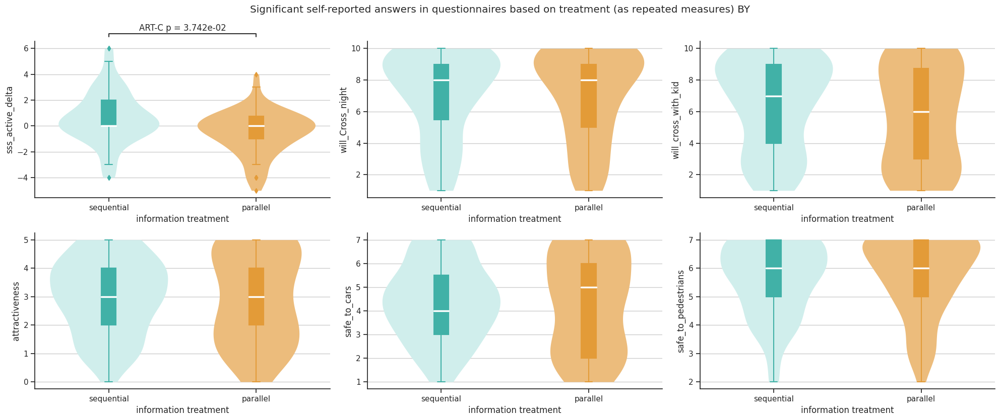

In [1681]:
sns.set(font_scale=1)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 8.5), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on treatment (as repeated measures) {}".format(p_adj))

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ####### generic one ###########
    # pairs=[("information", "efficiency")]
    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    # annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    ######### custom one ART-C ##########
    pairs=[("efficiency", "information")]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments[col_name]
    print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"], hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"])
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
        
    ###############
    
    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["sequential", "parallel"]

    ax[i].set_xticklabels(labels)
    ax[i].set_xlabel("information treatment")
    
    
    sns.despine(trim=False)
plt.tight_layout()
plt.show()

will_cross_with_kid and safe_to_cars are misspecified

alternative lmer ANOVA

In [781]:
cols_of_interest = ["will_cross_with_kid", "safe_to_cars"]
#cols_sss_willing_safe# + dv_repeated_cat

significant_metrics_art_anova_treatments_bis = []
dict_results_treatments_bis = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_kw(metric, 
                 fixed_effects="treatment_group_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_bis)
    dict_results_treatments_bis[metric] = art_result


 processing ART Anova for will_cross_with_kid

	Kruskal-Wallis rank sum test

data:  will_cross_with_kid by treatment_group_f
Kruskal-Wallis chi-squared = 1.7199, df = 1, p-value = 0.1897


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$will_cross_with_kid and data$treatment_group_f 

            efficiency
information 0.19      

P value adjustment method: BY 

 processing ART Anova for safe_to_cars

	Kruskal-Wallis rank sum test

data:  safe_to_cars by treatment_group_f
Kruskal-Wallis chi-squared = 0.029516, df = 1, p-value = 0.8636


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$safe_to_cars and data$treatment_group_f 

            efficiency
information 0.87      

P value adjustment method: BY 


#### $Y$~$Scenario+(1|Participant\_ID)$

In [1683]:
cols_of_interest = cols_sss_willing_safe# + dv_repeated_cat

significant_metrics_art_anova_scenarios = []
dict_results_scenarios = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*own_car_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios)
    dict_results_scenarios[metric] = art_result


 processing ART Anova for sss_active_delta
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sss_active_delta)

                              F Df Df.res   Pr(>F)  
1 Scenario_f           3.192788  2     82 0.046209 *
2 own_car_f            0.093067  1     41 0.761857  
3 Scenario_f:own_car_f 1.582106  2     82 0.211751  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast      estimate    SE   df t.ratio p.value
 A,no - A,yes      8.72 13.29 64.7   0.656  1.0000
 A,no - B,no      -7.00  5.19 82.0  -1.348  1.0000
 A,no - B,yes      2.32 13.29 64.7   0.174  1.0000
 A,no - C,no      -5.44  5.19 82.0  -1.047  1.0000
 A,no - C,yes     -8.48 13.29 64.7  -0.638  1.0000
 A,yes - B,no    -15.72 13.29 64.7  -1.182  1.0000
 A,yes - B,yes    -6.40  9.43 82.0  -0.678  1.0000
 A,yes - C,no    -14.15 13.29 64.7  -1.065  1.0000
 A,yes - C,yes

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(safe_to_cars)

                              F Df Df.res     Pr(>F)    
1 Scenario_f           20.03502  2     82 8.2299e-08 ***
2 own_car_f             0.32733  1     41    0.57036    
3 Scenario_f:own_car_f  0.23706  2     82    0.78949    
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



 contrast      estimate    SE  df t.ratio p.value
 A,no - A,yes     10.05 11.03 123   0.912  1.0000
 A,no - B,no      24.52  7.52  82   3.260  0.0135
 A,no - B,yes     23.25 11.03 123   2.109  0.1840
 A,no - C,no      52.89  7.52  82   7.034  <.0001
 A,no - C,yes     58.95 11.03 123   5.347  <.0001
 A,yes - B,no     14.46 11.03 123   1.312  0.8693
 A,yes - B,yes    13.20 13.66  82   0.966  1.0000
 A,yes - C,no     42.84 11.03 123   3.885  0.0028
 A,yes - C,yes    48.90 13.66  82   3.580  0.0058
 B,no - B,yes     -1.26 11.03 123  -0.114  1.0000
 B,no - C,no      28.38  7.52  82   3.774  0.0038
 B,no - C,yes     34.44 11.03 123   3.124  0.0158
 B,yes - C,no     29.64 11.03 123   2.688  0.0509
 B,yes - C,yes    35.70 13.66  82   2.613  0.0590
 C,no - C,yes      6.06 11.03 123   0.550  1.0000

Degrees-of-freedom method: kenward-roger 
P value adjustment: BY method for 15 tests 


R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



				 safe_to_cars IS SIGNIFICANT

 processing ART Anova for safe_to_pedestrians
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(safe_to_pedestrians)

                             F Df Df.res     Pr(>F)    
1 Scenario_f           8.17231  2     82 0.00058022 ***
2 own_car_f            1.15564  1     41 0.28865735    
3 Scenario_f:own_car_f 0.10743  2     82 0.89826888    
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast      estimate    SE   df t.ratio p.value
 A,no - A,yes      7.66 12.87 94.6   0.595  1.0000
 A,no - B,no      11.33  6.87 82.0   1.650  1.0000
 A,no - B,yes     17.11 12.87 94.6   1.330  1.0000
 A,no - C,no      18.59  6.87 82.0   2.707  0.4108
 A,no - C,yes     30.11 12.87 94.6   2.340  0.5321
 A,yes - B,no      3.67 12.87 94.6   0.286  1.0000
 A,yes - B,yes     9.45 12.47 82.0   0.758  1.0000
 A,yes - C,no 

##### summary

In [783]:
pairs=[("A", "B"), ("B", "C"), ("A", "C")]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{} - {}".format(pair[0], pair[1])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair
display(map_pairs)

for key in significant_metrics_art_anova_scenarios:
    value = dict_results_scenarios[key]
    print(key)
    display(value["model_anova"])
    display(value["posthoc"])

{'A - B': ('A', 'B'), 'B - C': ('B', 'C'), 'A - C': ('A', 'C')}

sss_alert_delta


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.335874,2.0,84.0,0.040356


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,-5.395349,5.137738,84.0,-1.050141,0.543886
2,A - C,-13.197674,5.137738,84.0,-2.568772,0.065855
3,B - C,-7.802326,5.137738,84.0,-1.518631,0.364679


will_Cross_night


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,33.203769,2.0,84.0,2.368137e-11


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,13.197674,5.760981,84.0,2.290873,4.487169e-02
2,A - C,45.616279,5.760981,84.0,7.918145,4.863706e-11
3,B - C,32.418605,5.760981,84.0,5.627272,6.481767e-07


will_cross_with_kid


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,34.745144,2.0,84.0,1.010025e-11


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,23.441860,6.128913,84.0,3.824799,4.595459e-04
2,A - C,51.034884,6.128913,84.0,8.326907,7.375700e-12
3,B - C,27.593023,6.128913,84.0,4.502107,5.913124e-05


attractiveness


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,26.998433,2.0,84.0,8.815007e-10


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,17.127907,5.954072,84.0,2.876671,9.337328e-03
2,A - C,43.430233,5.954072,84.0,7.294206,8.454102e-10
3,B - C,26.302326,5.954072,84.0,4.417535,8.133096e-05


safe_to_cars


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,31.841292,2.0,84.0,5.103876e-11


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,21.883721,6.538761,84.0,3.346769,2.245267e-03
2,A - C,51.965116,6.538761,84.0,7.947242,4.253948e-11
3,B - C,30.081395,6.538761,84.0,4.600473,4.064915e-05


safe_to_pedestrians


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,5.38905,2.0,84.0,0.00628


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,10.895349,5.949936,84.0,1.831171,0.194206
2,A - C,19.488372,5.949936,84.0,3.275392,0.008438
3,B - C,8.593023,5.949936,84.0,1.444221,0.279394


**safe_to_cars** i misspecified

alternative lmer ANOVA

In [785]:
cols_of_interest = ["safe_to_cars"]
#cols_sss_willing_safe# + dv_repeated_cat

significant_metrics_art_anova_scenarios_bis = []
dict_results_scenarios_bis = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_kw(metric, 
                 fixed_effects="Scenario_f",
                 random_effects="",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios_bis)
    dict_results_scenarios_bis[metric] = art_result


 processing ART Anova for safe_to_cars

	Kruskal-Wallis rank sum test

data:  safe_to_cars by Scenario_f
Kruskal-Wallis chi-squared = 42.974, df = 2, p-value = 4.66e-10


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$safe_to_cars and data$Scenario_f 

  A       B     
B 0.0034  -     
C 3.9e-09 0.0001

P value adjustment method: BY 


#### $Y$~$treatment*Scenario+(1|Participant\_ID)$

In [1684]:
cols_of_interest = cols_sss_willing_safe# + dv_repeated_cat

significant_metrics_art_anova_treatments_sce = []
dict_results_treatments_sce = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*treatment_group_f*own_car_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_sce)
    dict_results_treatments_sce[metric] = art_result


 processing ART Anova for sss_active_delta
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sss_active_delta)

                                                F Df Df.res  Pr(>F)  
1 Scenario_f                             1.100076  2     78 0.33795  
2 treatment_group_f                      2.165128  1     39 0.14920  
3 own_car_f                              0.290009  1     39 0.59328  
4 Scenario_f:treatment_group_f           0.157890  2     78 0.85422  
5 Scenario_f:own_car_f                   0.254407  2     78 0.77602  
6 treatment_group_f:own_car_f            1.618458  1     39 0.21084  
7 Scenario_f:treatment_group_f:own_car_f 0.093473  2     78 0.91086  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate    SE   df t.ratio p.value
 A,efficiency,no - A,efficiency,yes     -11.473 15

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(safe_to_cars)

                                                 F Df Df.res     Pr(>F)    
1 Scenario_f                             15.765057  2     78 1.7778e-06 ***
2 treatment_group_f                       0.015819  1     39   0.900558    
3 own_car_f                               0.867700  1     39   0.357324    
4 Scenario_f:treatment_group_f            0.659792  2     78   0.519820    
5 Scenario_f:own_car_f                    0.174459  2     78   0.840238    
6 treatment_group_f:own_car_f             3.885252  1     39   0.055838   .
7 Scenario_f:treatment_group_f:own_car_f  2.944058  2     78   0.058529   .
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



 contrast                              estimate    SE  df t.ratio p.value
 A,efficiency,no - A,efficiency,yes       6.732 13.37 117   0.504  1.0000
 A,efficiency,no - A,information,no       0.699 10.63 117   0.066  1.0000
 A,efficiency,no - A,information,yes     25.357 22.80 117   1.112  1.0000
 A,efficiency,no - B,efficiency,no       17.000 11.40  78   1.491  1.0000
 A,efficiency,no - B,efficiency,yes      28.670 13.37 117   2.144  0.4475
 A,efficiency,no - B,information,no      30.752 10.63 117   2.894  0.0953
 A,efficiency,no - B,information,yes      3.607 22.80 117   0.158  1.0000
 A,efficiency,no - C,efficiency,no       53.893 11.40  78   4.726  0.0005
 A,efficiency,no - C,efficiency,yes      70.732 13.37 117   5.290  0.0001
 A,efficiency,no - C,information,no      52.857 10.63 117   4.974  0.0001
 A,efficiency,no - C,information,yes     13.857 22.80 117   0.608  1.0000
 A,efficiency,yes - A,information,no     -6.033 12.71 117  -0.474  1.0000
 A,efficiency,yes - A,information,yes 

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



				 safe_to_cars IS SIGNIFICANT

 processing ART Anova for safe_to_pedestrians
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(safe_to_pedestrians)

                                               F Df Df.res   Pr(>F)  
1 Scenario_f                             3.04478  2     78 0.053302 .
2 treatment_group_f                      0.47754  1     39 0.493631  
3 own_car_f                              1.27741  1     39 0.265285  
4 Scenario_f:treatment_group_f           0.90557  2     78 0.408519  
5 Scenario_f:own_car_f                   0.25795  2     78 0.773288  
6 treatment_group_f:own_car_f            3.43149  1     39 0.071544 .
7 Scenario_f:treatment_group_f:own_car_f 0.93915  2     78 0.395337  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate   SE df t.ratio p.value
 A,efficiency,

##### summary

In [983]:
pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair

display(new_pairs)
    
for key in significant_metrics_art_anova_treatments_sce:
    value = dict_results_treatments_sce[key]
    print(key)
    display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    for index, row in df_contrasts.iterrows(): 
        print("Performing ART-C test:",
          map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)

['A,efficiency - A,information',
 'B,efficiency - B,information',
 'C,efficiency - C,information',
 'A,efficiency - B,efficiency',
 'B,efficiency - C,efficiency',
 'A,efficiency - C,efficiency',
 'A,information - B,information',
 'B,information - C,information',
 'A,information - C,information']

sss_active_delta


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,1.492726,2.0,82.0,0.230802
treatment_group_f,treatment_group_f,5.272061,1.0,41.0,0.026855
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.590246,2.0,82.0,0.556528


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
sss_alert_delta


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.402564,2.0,82.0,0.038055
treatment_group_f,treatment_group_f,0.129501,1.0,41.0,0.720797
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,1.276863,2.0,82.0,0.284397


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
sss_irritated_delta


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.715266,2.0,82.0,0.028540
treatment_group_f,treatment_group_f,0.011111,1.0,41.0,0.916565
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,2.184778,2.0,82.0,0.119009


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
sss_sad_delta


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.612928,2.0,82.0,0.031351
treatment_group_f,treatment_group_f,1.721451,1.0,41.0,0.196805
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,4.207388,2.0,82.0,0.018220


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
will_Cross_night


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,32.616745,2.0,82.0,3.785271e-11
treatment_group_f,treatment_group_f,0.041382,1.0,41.0,8.398086e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.684411,2.0,82.0,5.072449e-01


,contrast,estimate,SE,df,t.ratio,p.value
4,"A,efficiency - C,efficiency",41.818182,8.078694,82.0,5.176354,0.000028
7,"A,information - B,information",20.404762,8.268807,82.0,2.467679,0.086715
9,"A,information - C,information",49.595238,8.268807,82.0,5.997871,0.000003
11,"B,efficiency - C,efficiency",35.500000,8.078694,82.0,4.394275,0.000407
14,"B,information - C,information",29.190476,8.268807,82.0,3.530192,0.004865


Performing ART-C test: ('Aefficiency', 'Cefficiency') estimate=4.18e+01 p-value=2.80e-05
Performing ART-C test: ('Ainformation', 'Binformation') estimate=2.04e+01 p-value=8.67e-02
Performing ART-C test: ('Ainformation', 'Cinformation') estimate=4.96e+01 p-value=2.57e-06
Performing ART-C test: ('Befficiency', 'Cefficiency') estimate=3.55e+01 p-value=4.07e-04
Performing ART-C test: ('Binformation', 'Cinformation') estimate=2.92e+01 p-value=4.86e-03
pairs: [('Aefficiency', 'Cefficiency'), ('Ainformation', 'Binformation'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency'), ('Binformation', 'Cinformation')]
pvalues: [2.800982901116599e-05, 0.08671451995992255, 2.573785344402255e-06, 0.00040666218250436174, 0.004864800637219263]
will_cross_with_kid


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,33.564632,2.0,82.0,2.240217e-11
treatment_group_f,treatment_group_f,1.245861,1.0,41.0,2.708436e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.183807,2.0,82.0,8.324383e-01


,contrast,estimate,SE,df,t.ratio,p.value
2,"A,efficiency - B,efficiency",19.159091,8.625959,82.0,2.221097,0.144849
4,"A,efficiency - C,efficiency",52.113636,8.625959,82.0,6.041489,0.000001
7,"A,information - B,information",27.928571,8.828951,82.0,3.163295,0.013614
9,"A,information - C,information",49.904762,8.828951,82.0,5.652400,0.000004
11,"B,efficiency - C,efficiency",32.954545,8.625959,82.0,3.820392,0.002570
14,"B,information - C,information",21.976190,8.828951,82.0,2.489106,0.082011


Performing ART-C test: ('Aefficiency', 'Befficiency') estimate=1.92e+01 p-value=1.45e-01
Performing ART-C test: ('Aefficiency', 'Cefficiency') estimate=5.21e+01 p-value=1.07e-06
Performing ART-C test: ('Ainformation', 'Binformation') estimate=2.79e+01 p-value=1.36e-02
Performing ART-C test: ('Ainformation', 'Cinformation') estimate=4.99e+01 p-value=3.70e-06
Performing ART-C test: ('Befficiency', 'Cefficiency') estimate=3.30e+01 p-value=2.57e-03
Performing ART-C test: ('Binformation', 'Cinformation') estimate=2.20e+01 p-value=8.20e-02
pairs: [('Aefficiency', 'Befficiency'), ('Aefficiency', 'Cefficiency'), ('Ainformation', 'Binformation'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency'), ('Binformation', 'Cinformation')]
pvalues: [0.14484886940231625, 1.0676465425901908e-06, 0.013614186211684837, 3.7020770557913655e-06, 0.002569729738931859, 0.08201060737688398]
attractiveness


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,26.587595,2.0,82.0,1.257741e-09
treatment_group_f,treatment_group_f,0.533062,1.0,41.0,4.694738e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.319900,2.0,82.0,7.271237e-01


,contrast,estimate,SE,df,t.ratio,p.value
4,"A,efficiency - C,efficiency",38.750000,8.386758,82.0,4.620379,0.000233
7,"A,information - B,information",21.357143,8.584121,82.0,2.487983,0.082251
9,"A,information - C,information",48.333333,8.584121,82.0,5.630551,0.000012
11,"B,efficiency - C,efficiency",25.659091,8.386758,82.0,3.059477,0.024849
14,"B,information - C,information",26.976190,8.584121,82.0,3.142569,0.023205


Performing ART-C test: ('Aefficiency', 'Cefficiency') estimate=3.87e+01 p-value=2.33e-04
Performing ART-C test: ('Ainformation', 'Binformation') estimate=2.14e+01 p-value=8.23e-02
Performing ART-C test: ('Ainformation', 'Cinformation') estimate=4.83e+01 p-value=1.22e-05
Performing ART-C test: ('Befficiency', 'Cefficiency') estimate=2.57e+01 p-value=2.48e-02
Performing ART-C test: ('Binformation', 'Cinformation') estimate=2.70e+01 p-value=2.32e-02
pairs: [('Aefficiency', 'Cefficiency'), ('Ainformation', 'Binformation'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency'), ('Binformation', 'Cinformation')]
pvalues: [0.00023336669305449808, 0.0822513507947786, 1.2168899991511869e-05, 0.02484922267907564, 0.023204558490093105]
safe_to_cars


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,31.498655,2.0,82.0,7.089410e-11
treatment_group_f,treatment_group_f,0.302251,1.0,41.0,5.854574e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,1.740182,2.0,82.0,1.819061e-01


,contrast,estimate,SE,df,t.ratio,p.value
4,"A,efficiency - C,efficiency",57.568182,9.180591,82.0,6.270640,3.973191e-07
7,"A,information - B,information",25.119048,9.396634,82.0,2.673196,5.012573e-02
9,"A,information - C,information",46.095238,9.396634,82.0,4.905505,5.790103e-05
11,"B,efficiency - C,efficiency",38.772727,9.180591,82.0,4.223337,6.166022e-04
14,"B,information - C,information",20.976190,9.396634,82.0,2.232309,1.409657e-01


Performing ART-C test: ('Aefficiency', 'Cefficiency') estimate=5.76e+01 p-value=3.97e-07
Performing ART-C test: ('Ainformation', 'Binformation') estimate=2.51e+01 p-value=5.01e-02
Performing ART-C test: ('Ainformation', 'Cinformation') estimate=4.61e+01 p-value=5.79e-05
Performing ART-C test: ('Befficiency', 'Cefficiency') estimate=3.88e+01 p-value=6.17e-04
Performing ART-C test: ('Binformation', 'Cinformation') estimate=2.10e+01 p-value=1.41e-01
pairs: [('Aefficiency', 'Cefficiency'), ('Ainformation', 'Binformation'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency'), ('Binformation', 'Cinformation')]
pvalues: [3.973191458659003e-07, 0.05012573078578009, 5.7901032916623224e-05, 0.0006166022292436587, 0.14096565865529856]
safe_to_pedestrians


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,5.374164,2.0,82.0,0.006409
treatment_group_f,treatment_group_f,0.113162,1.0,41.0,0.738288
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,2.231701,2.0,82.0,0.113826


,contrast,estimate,SE,df,t.ratio,p.value
4,"A,efficiency - C,efficiency",28.454545,8.189814,82.0,3.474382,0.040851


Performing ART-C test: ('Aefficiency', 'Cefficiency') estimate=2.85e+01 p-value=4.09e-02
pairs: [('Aefficiency', 'Cefficiency')]
pvalues: [0.040851251793827356]


In [792]:
for key in set(significant_metrics_art_anova_treatments + significant_metrics_art_anova_scenarios + significant_metrics_art_anova_treatments_sce):
    print(key)
    value = dict_results_treatments[key]
    display(value["posthoc"])
    value = dict_results_scenarios[key]
    display(value["posthoc"])
    value = dict_results_treatments_sce[key]
    display(value["model_anova"])
    display(value["posthoc"])

will_Cross_night


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-0.465368,7.128449,41.0,-0.065283,0.948266


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,13.197674,5.760981,84.0,2.290873,4.487169e-02
2,A - C,45.616279,5.760981,84.0,7.918145,4.863706e-11
3,B - C,32.418605,5.760981,84.0,5.627272,6.481767e-07


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,32.616745,2.0,82.0,3.785271e-11
treatment_group_f,treatment_group_f,0.041382,1.0,41.0,8.398086e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.684411,2.0,82.0,5.072449e-01


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-7.753247,9.765293,104.311256,-0.793959,1.000000
2,"A,efficiency - B,efficiency",6.318182,8.078694,82.000000,0.782080,1.000000
3,"A,efficiency - B,information",12.651515,9.765293,104.311256,1.295559,0.895863
4,"A,efficiency - C,efficiency",41.818182,8.078694,82.000000,5.176354,0.000028
5,"A,efficiency - C,information",41.841991,9.765293,104.311256,4.284766,0.000407
6,"A,information - B,efficiency",14.071429,9.765293,104.311256,1.440963,0.759494
7,"A,information - B,information",20.404762,8.268807,82.000000,2.467679,0.086715
8,"A,information - C,efficiency",49.571429,9.765293,104.311256,5.076287,0.000028
9,"A,information - C,information",49.595238,8.268807,82.000000,5.997871,0.000003
10,"B,efficiency - B,information",6.333333,9.765293,104.311256,0.648555,1.000000


safe_to_pedestrians


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,5.491342,8.392649,41.0,0.654304,0.51657


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,10.895349,5.949936,84.0,1.831171,0.194206
2,A - C,19.488372,5.949936,84.0,3.275392,0.008438
3,B - C,8.593023,5.949936,84.0,1.444221,0.279394


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,5.374164,2.0,82.0,0.006409
treatment_group_f,treatment_group_f,0.113162,1.0,41.0,0.738288
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,2.231701,2.0,82.0,0.113826


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",9.650433,10.780379,92.151496,0.895185,1.000000
2,"A,efficiency - B,efficiency",8.022727,8.189814,82.000000,0.979598,1.000000
3,"A,efficiency - B,information",23.555195,10.780379,92.151496,2.185006,0.521372
4,"A,efficiency - C,efficiency",28.454545,8.189814,82.000000,3.474382,0.040851
5,"A,efficiency - C,information",19.745671,10.780379,92.151496,1.831630,0.837698
6,"A,information - B,efficiency",-1.627706,10.780379,92.151496,-0.150988,1.000000
7,"A,information - B,information",13.904762,8.382542,82.000000,1.658776,0.837698
8,"A,information - C,efficiency",18.804113,10.780379,92.151496,1.744290,0.837698
9,"A,information - C,information",10.095238,8.382542,82.000000,1.204317,1.000000
10,"B,efficiency - B,information",15.532468,10.780379,92.151496,1.440809,1.000000


will_cross_with_kid


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-8.578283,6.522497,41.0,-1.315184,0.195756


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,23.441860,6.128913,84.0,3.824799,4.595459e-04
2,A - C,51.034884,6.128913,84.0,8.326907,7.375700e-12
3,B - C,27.593023,6.128913,84.0,4.502107,5.913124e-05


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,33.564632,2.0,82.0,2.240217e-11
treatment_group_f,treatment_group_f,1.245861,1.0,41.0,2.708436e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.183807,2.0,82.0,8.324383e-01


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-10.765152,9.421478,118.245789,-1.142618,9.083845e-01
2,"A,efficiency - B,efficiency",19.159091,8.625959,82.000000,2.221097,1.448489e-01
3,"A,efficiency - B,information",17.163420,9.421478,118.245789,1.821733,2.945886e-01
4,"A,efficiency - C,efficiency",52.113636,8.625959,82.000000,6.041489,1.067647e-06
5,"A,efficiency - C,information",39.139610,9.421478,118.245789,4.154296,7.708708e-04
6,"A,information - B,efficiency",29.924242,9.421478,118.245789,3.176173,1.353595e-02
7,"A,information - B,information",27.928571,8.828951,82.000000,3.163295,1.361419e-02
8,"A,information - C,efficiency",62.878788,9.421478,118.245789,6.673984,4.222133e-08
9,"A,information - C,information",49.904762,8.828951,82.000000,5.652400,3.702077e-06
10,"B,efficiency - B,information",-1.995671,9.421478,118.245789,-0.211821,1.000000e+00


safe_to_cars


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-1.116883,6.52573,41.0,-0.171151,0.864947


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,21.883721,6.538761,84.0,3.346769,2.245267e-03
2,A - C,51.965116,6.538761,84.0,7.947242,4.253948e-11
3,B - C,30.081395,6.538761,84.0,4.600473,4.064915e-05


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,31.498655,2.0,82.0,7.089410e-11
treatment_group_f,treatment_group_f,0.302251,1.0,41.0,5.854574e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,1.740182,2.0,82.0,1.819061e-01


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",0.599567,9.289241,123.0,0.064544,1.000000e+00
2,"A,efficiency - B,efficiency",18.795455,9.180591,82.0,2.047303,1.983247e-01
3,"A,efficiency - B,information",25.718615,9.289241,123.0,2.768645,4.044484e-02
4,"A,efficiency - C,efficiency",57.568182,9.180591,82.0,6.270640,3.973191e-07
5,"A,efficiency - C,information",46.694805,9.289241,123.0,5.026762,2.846866e-05
6,"A,information - B,efficiency",18.195887,9.289241,123.0,1.958813,2.173337e-01
7,"A,information - B,information",25.119048,9.396634,82.0,2.673196,5.012573e-02
8,"A,information - C,efficiency",56.968615,9.289241,123.0,6.132752,3.973191e-07
9,"A,information - C,information",46.095238,9.396634,82.0,4.905505,5.790103e-05
10,"B,efficiency - B,information",6.923160,9.289241,123.0,0.745288,1.000000e+00


sss_sad_delta


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-1.411616,9.431167,41.0,-0.149676,0.881754


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,-3.593023,2.251791,84.0,-1.595629,0.601362
2,A - C,-0.802326,2.251791,84.0,-0.356305,1.000000
3,B - C,2.790698,2.251791,84.0,1.239323,0.601362


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.612928,2.0,82.0,0.031351
treatment_group_f,treatment_group_f,1.721451,1.0,41.0,0.196805
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,4.207388,2.0,82.0,0.018220


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-2.489177e-02,9.790288,47.467701,-2.542497e-03,1.0
2,"A,efficiency - B,efficiency",-2.363636e+00,3.180166,82.000000,-7.432430e-01,1.0
3,"A,efficiency - B,information",-4.905844e+00,9.790288,47.467701,-5.010929e-01,1.0
4,"A,efficiency - C,efficiency",-2.220446e-16,3.180166,82.000000,-6.982170e-17,1.0
5,"A,efficiency - C,information",-1.667749e+00,9.790288,47.467701,-1.703473e-01,1.0
6,"A,information - B,efficiency",-2.338745e+00,9.790288,47.467701,-2.388841e-01,1.0
7,"A,information - B,information",-4.880952e+00,3.255004,82.000000,-1.499523e+00,1.0
8,"A,information - C,efficiency",2.489177e-02,9.790288,47.467701,2.542497e-03,1.0
9,"A,information - C,information",-1.642857e+00,3.255004,82.000000,-5.047174e-01,1.0
10,"B,efficiency - B,information",-2.542208e+00,9.790288,47.467701,-2.596663e-01,1.0


sss_active_delta


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-20.290043,9.433034,41.0,-2.150956,0.037424


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,-6.860465,4.540924,84.0,-1.510808,0.370123
2,A - C,-8.174419,4.540924,84.0,-1.800166,0.370123
3,B - C,-1.313953,4.540924,84.0,-0.289358,1.000000


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,1.492726,2.0,82.0,0.230802
treatment_group_f,treatment_group_f,5.272061,1.0,41.0,0.026855
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.590246,2.0,82.0,0.556528


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-25.292208,10.805913,67.321031,-2.340590,0.368727
2,"A,efficiency - B,efficiency",-9.386364,6.380374,82.000000,-1.471131,0.782441
3,"A,efficiency - B,information",-29.506494,10.805913,67.321031,-2.730588,0.262103
4,"A,efficiency - C,efficiency",-12.977273,6.380374,82.000000,-2.033936,0.562330
5,"A,efficiency - C,information",-28.435065,10.805913,67.321031,-2.631436,0.262103
6,"A,information - B,efficiency",15.905844,10.805913,67.321031,1.471957,0.782441
7,"A,information - B,information",-4.214286,6.530521,82.000000,-0.645322,1.000000
8,"A,information - C,efficiency",12.314935,10.805913,67.321031,1.139648,1.000000
9,"A,information - C,information",-3.142857,6.530521,82.000000,-0.481257,1.000000
10,"B,efficiency - B,information",-20.120130,10.805913,67.321031,-1.861956,0.666712


attractiveness


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-1.50469,7.118562,41.0,-0.211376,0.833641


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,17.127907,5.954072,84.0,2.876671,9.337328e-03
2,A - C,43.430233,5.954072,84.0,7.294206,8.454102e-10
3,B - C,26.302326,5.954072,84.0,4.417535,8.133096e-05


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,26.587595,2.0,82.0,1.257741e-09
treatment_group_f,treatment_group_f,0.533062,1.0,41.0,4.694738e-01
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,0.319900,2.0,82.0,7.271237e-01


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-7.454545,9.933892,107.322334,-0.750415,1.000000
2,"A,efficiency - B,efficiency",13.090909,8.386758,82.000000,1.560902,0.553834
3,"A,efficiency - B,information",13.902597,9.933892,107.322334,1.399512,0.682491
4,"A,efficiency - C,efficiency",38.750000,8.386758,82.000000,4.620379,0.000233
5,"A,efficiency - C,information",40.878788,9.933892,107.322334,4.115083,0.000948
6,"A,information - B,efficiency",20.545455,9.933892,107.322334,2.068218,0.204187
7,"A,information - B,information",21.357143,8.584121,82.000000,2.487983,0.082251
8,"A,information - C,efficiency",46.204545,9.933892,107.322334,4.651203,0.000233
9,"A,information - C,information",48.333333,8.584121,82.000000,5.630551,0.000012
10,"B,efficiency - B,information",0.811688,9.933892,107.322334,0.081709,1.000000


sss_alert_delta


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-3.753968,9.475558,41.0,-0.396174,0.694031


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,-5.395349,5.137738,84.0,-1.050141,0.543886
2,A - C,-13.197674,5.137738,84.0,-2.568772,0.065855
3,B - C,-7.802326,5.137738,84.0,-1.518631,0.364679


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.402564,2.0,82.0,0.038055
treatment_group_f,treatment_group_f,0.129501,1.0,41.0,0.720797
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,1.276863,2.0,82.0,0.284397


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-11.136364,11.188789,73.957851,-0.995314,1.000000
2,"A,efficiency - B,efficiency",-11.090909,7.202028,82.000000,-1.539970,1.000000
3,"A,efficiency - B,information",-10.564935,11.188789,73.957851,-0.944243,1.000000
4,"A,efficiency - C,efficiency",-18.318182,7.202028,82.000000,-2.543476,0.639771
5,"A,efficiency - C,information",-18.969697,11.188789,73.957851,-1.695420,1.000000
6,"A,information - B,efficiency",0.045455,11.188789,73.957851,0.004063,1.000000
7,"A,information - B,information",0.571429,7.371511,82.000000,0.077519,1.000000
8,"A,information - C,efficiency",-7.181818,11.188789,73.957851,-0.641876,1.000000
9,"A,information - C,information",-7.833333,7.371511,82.000000,-1.062650,1.000000
10,"B,efficiency - B,information",0.525974,11.188789,73.957851,0.047009,1.000000


sss_irritated_delta


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-1.954545,9.165362,41.0,-0.213253,0.832186


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,-9.197674,4.832832,84.0,-1.903165,0.332444
2,A - C,-6.151163,4.832832,84.0,-1.272786,0.568165
3,B - C,3.046512,4.832832,84.0,0.630378,0.971957


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,3.715266,2.0,82.0,0.028540
treatment_group_f,treatment_group_f,0.011111,1.0,41.0,0.916565
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,2.184778,2.0,82.0,0.119009


,contrast,estimate,SE,df,t.ratio,p.value
1,"A,efficiency - A,information",-8.231602,10.714024,71.741021,-0.768302,1.0
2,"A,efficiency - B,efficiency",-10.704545,6.716080,82.000000,-1.593868,1.0
3,"A,efficiency - B,information",-15.850649,10.714024,71.741021,-1.479430,1.0
4,"A,efficiency - C,efficiency",-13.840909,6.716080,82.000000,-2.060861,1.0
5,"A,efficiency - C,information",-6.326840,10.714024,71.741021,-0.590519,1.0
6,"A,information - B,efficiency",-2.472944,10.714024,71.741021,-0.230814,1.0
7,"A,information - B,information",-7.619048,6.874127,82.000000,-1.108366,1.0
8,"A,information - C,efficiency",-5.609307,10.714024,71.741021,-0.523548,1.0
9,"A,information - C,information",1.904762,6.874127,82.000000,0.277091,1.0
10,"B,efficiency - B,information",-5.146104,10.714024,71.741021,-0.480315,1.0


##### plot

In [793]:
order = sorted(list(set(data_IdSc_02.scenario__treatment)))
order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
print(order)
list(itertools.combinations(order, 2))

['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']


[('Ainformation', 'Aefficiency'),
 ('Ainformation', 'Binformation'),
 ('Ainformation', 'Befficiency'),
 ('Ainformation', 'Cinformation'),
 ('Ainformation', 'Cefficiency'),
 ('Aefficiency', 'Binformation'),
 ('Aefficiency', 'Befficiency'),
 ('Aefficiency', 'Cinformation'),
 ('Aefficiency', 'Cefficiency'),
 ('Binformation', 'Befficiency'),
 ('Binformation', 'Cinformation'),
 ('Binformation', 'Cefficiency'),
 ('Befficiency', 'Cinformation'),
 ('Befficiency', 'Cefficiency'),
 ('Cinformation', 'Cefficiency')]

pairs: []
pvalues: []
pairs: []
pvalues: []
pairs: [('Aefficiency', 'Cefficiency'), ('Ainformation', 'Binformation'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency'), ('Binformation', 'Cinformation')]
pvalues: [2.800982901116599e-05, 0.08671451995992255, 2.573785344402255e-06, 0.00040666218250436174, 0.004864800637219263]
Befficiency vs. Cefficiency: Custom statistical test, P_val:4.067e-04
Binformation vs. Cinformation: Custom statistical test, P_val:4.865e-03
Aefficiency vs. Cefficiency: Custom statistical test, P_val:2.801e-05
Ainformation vs. Cinformation: Custom statistical test, P_val:2.574e-06
pairs: [('A', 'B'), ('A', 'C'), ('B', 'C')]
pvalues: [0.04487169339530004, 4.8637061154597985e-11, 6.481766713775226e-07]
A vs. B: Custom statistical test, P_val:4.487e-02
B vs. C: Custom statistical test, P_val:6.482e-07
A vs. C: Custom statistical test, P_val:4.864e-11
pairs: [('Aefficiency', 'Befficiency'), ('Aefficiency', 'Cefficiency'), ('Ainformation', 'Binformation'

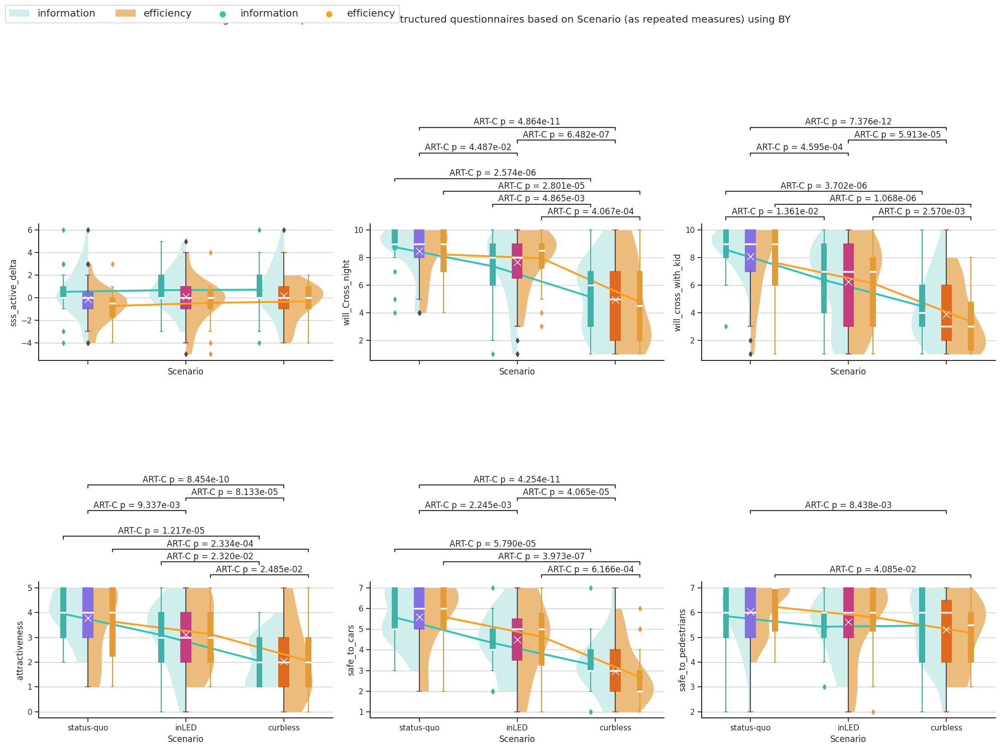

In [794]:
sns.set(font_scale=1)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 15), sharey=False, sharex=True)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in structured questionnaires based on Scenario (as repeated measures) using {}".format(p_adj))

cols_of_interest = significant_metrics_mixed_anova_w_Sc_in_data_IdSc_02

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    ####### generic one ###########
#     pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
#            ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
#            ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

#     annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
#     annotator.configure(test='Brunner-Munzel', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#     annotator.apply_and_annotate()
    ################################
    
    
    ######### custom one ART-C ##########
    
    pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments_sce[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax2, pairs=custom_pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax2, pairs=custom_pairs,
                   data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
    ######################################

    
    
    ####### generic one ###########
#     pairs=[("A", "B"), ("B", "C"), ("A", "C")]

#     annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=["A", "B", "C"], hide_non_significant=True)
#     annotator.configure(test='Brunner-Munzel', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
#     # annotator.apply_and_annotate()
#     annotator.apply_test().annotate(line_offset_to_group=0.4)
    ################################
    
    ######### custom one ART-C ##########
    
    pairs=[("A", "B"), ("B", "C"), ("A", "C")]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_scenarios[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=["A", "B", "C"], hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="Scenario", y=col_name, order=["A", "B", "C"])
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate(line_offset_to_group=0.5))
        # plt.show()
    ######################################
    

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
    
    
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["status-quo","inLED", "curbless"]
    ax[i].set_xticklabels(labels)

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', fontsize="large", ncols=4, framealpha=1)
plt.tight_layout()
plt.show()

# test: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel.

**safe_to_cars** i misspecified

alternative lmer ANOVA

In [991]:
cols_of_interest = ["safe_to_cars"]
#cols_sss_willing_safe# + dv_repeated_cat

significant_metrics_art_anova_scenarios_bis = []
dict_results_scenarios_bis = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_kw(metric, 
                 fixed_effects="scenario__treatment_f",
                 random_effects="",
                 p_adj="hommel",
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios_bis)
    dict_results_scenarios_bis[metric] = art_result


 processing ART Anova for safe_to_cars

	Kruskal-Wallis rank sum test

data:  safe_to_cars by scenario__treatment_f
Kruskal-Wallis chi-squared = 44.287, df = 5, p-value = 2.025e-08


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$safe_to_cars and data$scenario__treatment_f 

             Aefficiency Ainformation Befficiency Binformation Cefficiency
Ainformation 0.59650     -            -           -            -          
Befficiency  0.21510     0.32231      -           -            -          
Binformation 0.04470     0.07107      0.59650     -            -          
Cefficiency  0.00014     2.3e-05      0.00809     0.01181      -          
Cinformation 0.00204     0.00016      0.05848     0.12184      0.32266    

P value adjustment method: hommel 


#### (misc)

In [289]:
data_1 = data_unique[data_unique["treatment_group"]=="information"]["c_safe_to_cars"]
data_2 = data_unique[data_unique["treatment_group"]=="efficiency"]["c_safe_to_cars"]
scipy.stats.mannwhitneyu(data_1, data_2, alternative="greater", nan_policy='omit')
# scipy.stats.wilcoxon(data_1, data_2)

MannwhitneyuResult(statistic=296.0, pvalue=0.05377616667475427)

In [290]:
data_IdSc_02.head(5)
data_1 = data_IdSc_02[(data_IdSc_02["treatment_group"]=="information") & (data_IdSc_02["Scenario"]=="C")]["safe_to_cars"]
data_2 = data_IdSc_02[(data_IdSc_02["treatment_group"]=="efficiency") & (data_IdSc_02["Scenario"]=="C")]["safe_to_cars"]
scipy.stats.mannwhitneyu(data_1, data_2, alternative="greater", nan_policy='omit')

MannwhitneyuResult(statistic=296.0, pvalue=0.05377616667475427)

In [291]:
len(cols_sss_willing_safe)

17

information vs. efficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.574e-03 U_stat=2.733e+03
information vs. efficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.464e-02 U_stat=1.631e+03


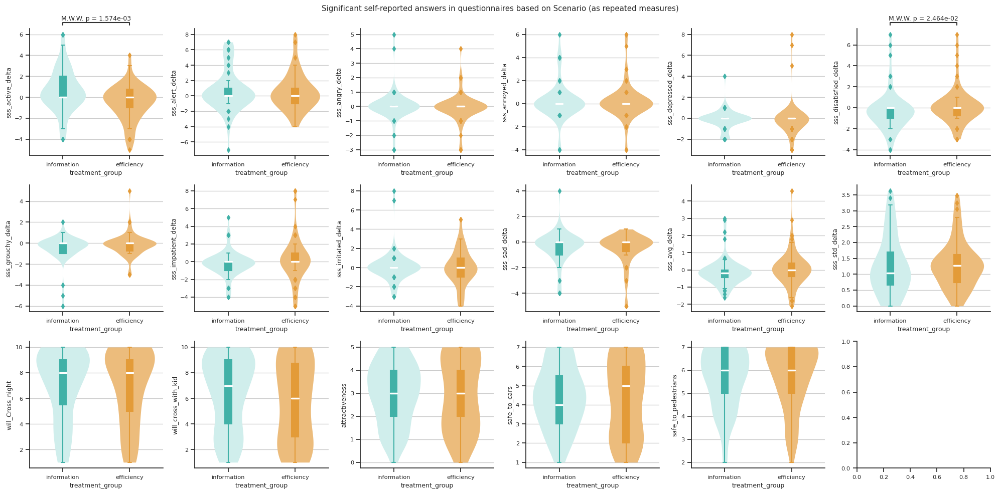

In [292]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=6, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario (as repeated measures)")

cols_of_interest = cols_sss_willing_safe

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    pairs=[("information", "efficiency")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

    sns.despine(trim=False)
plt.tight_layout()
plt.show()

B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.698e-05 U_stat=1.420e+03
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.250e-08 U_stat=1.548e+03
A vs. B: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.646e-03 U_stat=1.284e+03
B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.718e-04 U_stat=1.344e+03
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:7.795e-10 U_stat=1.632e+03
A vs. B: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.741e-02 U_stat=1.192e+03
B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:4.358e-04 U_stat=1.324e+03
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.323e-07 U_stat=1.524e+03
A vs. B: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.866e-03 U_stat=1.

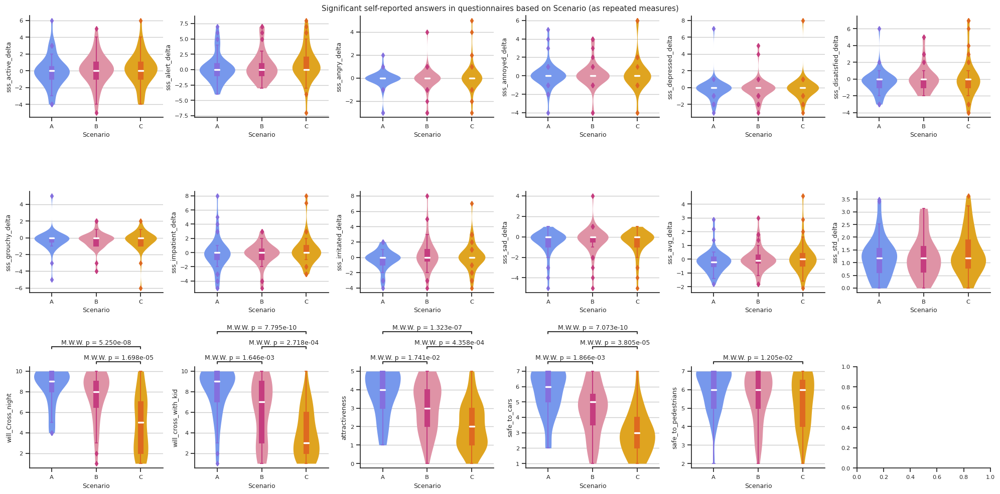

In [293]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=6, figsize=(20, 10), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario (as repeated measures)")

cols_of_interest = cols_sss_willing_safe

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    ax[i].yaxis.grid(True)
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="Scenario", y=col_name, ax=ax[i], cut=0, palette=ibm_01_l, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, ax=ax[i], palette=ibm_01_d, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, hide_non_significant=True)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

    sns.despine(trim=False)
plt.tight_layout()
plt.show()

Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:9.644e-04 U_stat=3.820e+02
Binformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:6.884e-03 U_stat=3.275e+02
Aefficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.279e-04 U_stat=3.885e+02
Ainformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.562e-05 U_stat=3.905e+02
Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.196e-03 U_stat=3.720e+02
Ainformation vs. Binformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:7.083e-03 U_stat=3.260e+02
Aefficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.312e-05 U_stat=4.215e+02
Ainformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided wi

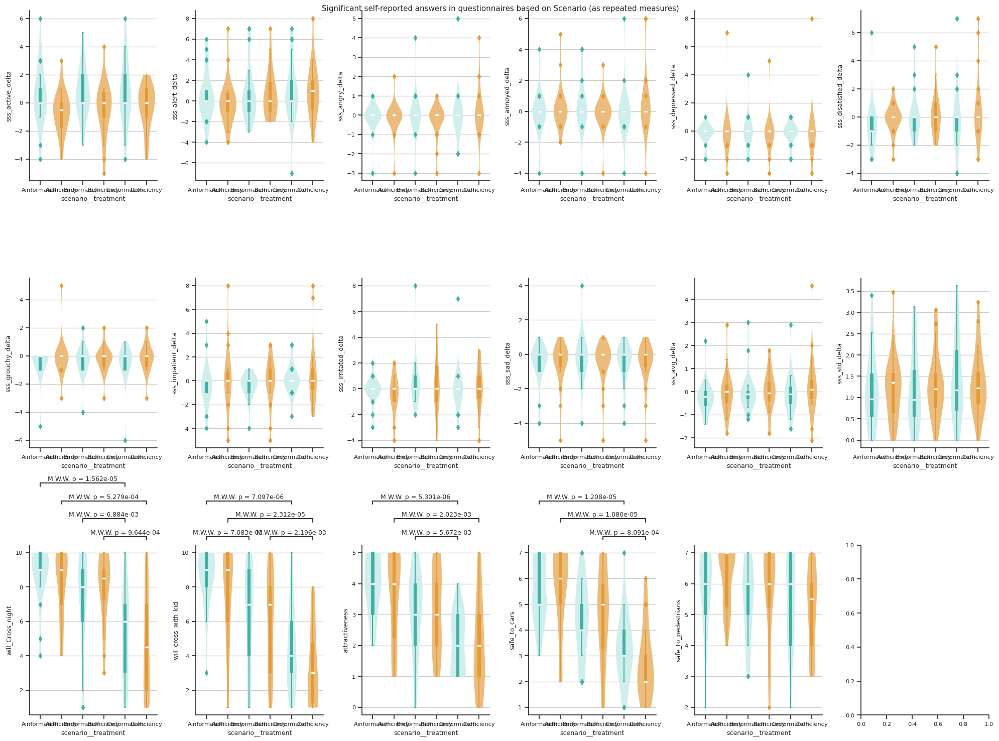

In [294]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=6, figsize=(20, 15), sharey=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario (as repeated measures)")

cols_of_interest = cols_sss_willing_safe

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], palette=["#2ec4b6", "#ff9f1c"]*3, width=0.10, order=order)#, #tc.tol_cset('light') #ibm_02
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    
    pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()
    

    sns.despine(trim=False)
plt.tight_layout()
plt.show()

Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:9.644e-04 U_stat=3.820e+02
Binformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:6.884e-03 U_stat=3.275e+02
Aefficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.279e-04 U_stat=3.885e+02
Ainformation vs. Cinformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.562e-05 U_stat=3.905e+02
B vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:1.698e-05 U_stat=1.420e+03
A vs. C: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:5.250e-08 U_stat=1.548e+03
Befficiency vs. Cefficiency: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:2.196e-03 U_stat=3.720e+02
Ainformation vs. Binformation: Mann-Whitney-Wilcoxon test two-sided with Holm-Bonferroni correction, P_val:7.083

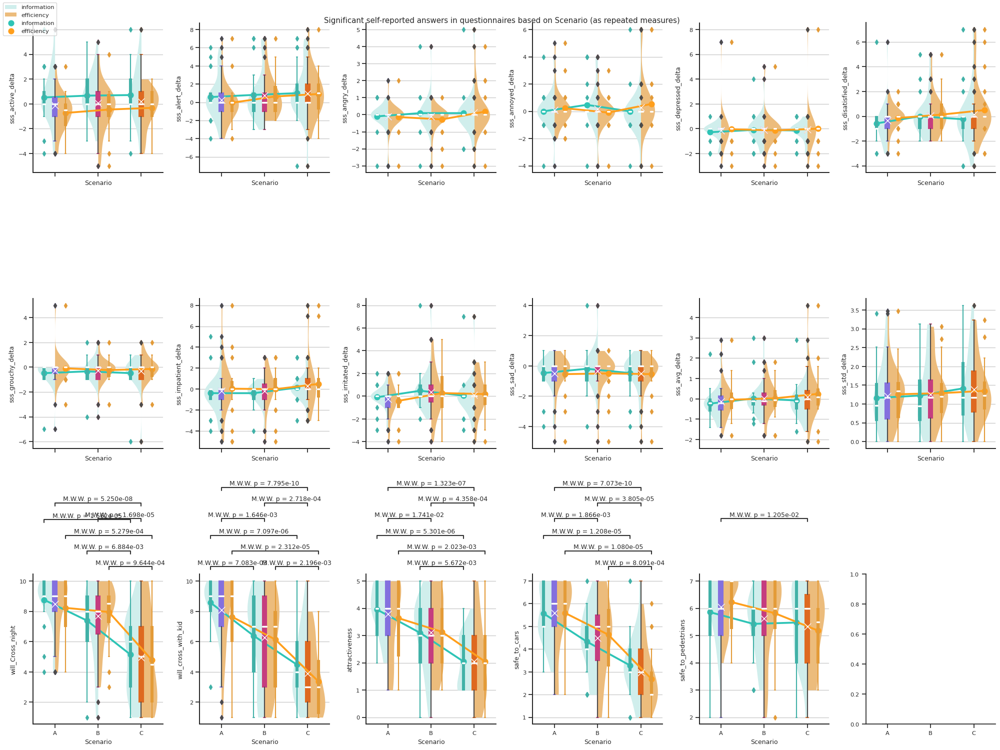

In [295]:
sns.set(font_scale=0.75)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=6, figsize=(20, 15), sharey=False, sharex=True)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in questionnaires based on Scenario (as repeated measures)")

cols_of_interest = cols_sss_willing_safe

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    
    pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    annotator.apply_and_annotate()

    
    pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=["A", "B", "C"], hide_non_significant=True)
    annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    annotator.apply_test().annotate(line_offset_to_group=0.35)
    

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left')
plt.tight_layout()
plt.show()

### running for **phisiological responses** (only *whole*, entire sessions data, and durations of subtasks): $Y_{phisiologic}$ ~ $G + (1|id)$

- The ART ANOVA does not work with missing data, so only applying it for whole scenarios related metrics.

In [1356]:
display(dv_repeated_num_w)
# display(dv_repeated_num)
display(dv_repeated_HR_num)

['duration_whole',
 'whole_heart_rate_mean',
 'whole_heart_rate_std',
 'whole_HR_delta_mean',
 'whole_HR_delta_std',
 'whole_HRV',
 'whole_HRV_delta',
 'whole_displacement_mean',
 'whole_displacement_std',
 'whole_distance_walked',
 'whole_angle_change_mean',
 'whole_angle_change_std',
 'whole_a_change_mean',
 'whole_a_change_std',
 'whole_b_change_mean',
 'whole_b_change_std',
 'whole_c_change_mean',
 'whole_c_change_std']

['whole_heart_rate_mean',
 'whole_heart_rate_std',
 'whole_HR_delta_mean',
 'whole_HR_delta_std',
 'whole_HRV',
 'whole_HRV_delta',
 'sub1_heart_rate_mean',
 'sub1_heart_rate_std',
 'sub1_HR_delta_mean',
 'sub1_HR_delta_std',
 'sub1_HRV',
 'sub1_HRV_delta',
 'sub2_heart_rate_mean',
 'sub2_heart_rate_std',
 'sub2_HR_delta_mean',
 'sub2_HR_delta_std',
 'sub2_HRV',
 'sub2_HRV_delta',
 'sub3_heart_rate_mean',
 'sub3_heart_rate_std',
 'sub3_HR_delta_mean',
 'sub3_HR_delta_std',
 'sub3_HRV',
 'sub3_HRV_delta',
 'sub4_heart_rate_mean',
 'sub4_heart_rate_std',
 'sub4_HR_delta_mean',
 'sub4_HR_delta_std',
 'sub4_HRV',
 'sub4_HRV_delta']

In [1357]:
# data.head(4)
# data[["Participant_ID","whole_HR_delta_mean"]]
# data[data["Participant_ID"]==6]
data.iloc[10:15]

,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_success,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_success,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_success,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,Black Screen,Config_recoded,Configuration,Day,EndDate,Participant ID,Participant_ID,Reached Curb,ResponseId,Scenario,Session Nr,Start,StartDate,Started Crossing,Started Walking,Successful?,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_active_delta_neg,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_avg_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_sss_std_delta,a_success,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,age,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_active_delta_neg,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_avg_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_sss_std_delta,b_success,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,baseline_HRV,baseline_HR_raw_RRintervals,baseline_HR_raw_timeseries,baseline_HR_raw_zeroTimestamps,baseline_heart_rate_len,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_heart_rate_timeseries,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_active_delta_neg,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_avg_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_sss_std_delta,c_success,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,city_live,city_raised,country_live,country_raised,country_raised_CH,driving_license,duration,duration_sub1,duration_sub2,duration_sub3,duration_sub4,duration_whole,experience_vr,experience_vr_recoded,experiments,experiments_recoded,fav,fav_cat,fav_duration,fav_recoded,gender,km_drive,km_drive_recoded,km_drive_recoded_num,m_walk,neighborhood,neighborhood_recoded,old_index_01,old_index_02,own_car,pref_transport,real_order_clean,real_order_raw,scenario__config,scenario__config_recoded,study,sub1_HRV,sub1_HRV_delta,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HR_delta_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_timeseries,su

#### $Y$~$treatment+(1|Participant\_ID)$

In [1686]:
# cols_of_interest = ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"] + dv_repeated_num_w + ["whole_HRV" , "whole_HRV_delta"]# + dv_repeated_cat
# cols_of_interest = dv_repeated_HR_num
cols_of_interest = ["whole_distance_walked"]

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="treatment_group_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for whole_distance_walked
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_distance_walked)

                         F Df Df.res  Pr(>F)  
1 treatment_group_f 1.3158  1 40.707 0.25804  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                 estimate   SE   df t.ratio p.value
 efficiency - information    -12.7 11.1 40.7  -1.147  0.2580

Degrees-of-freedom method: kenward-roger 
				 whole_distance_walked not significant


##### summary

In [1591]:
pairs=[("efficiency", "information")]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{} - {}".format(pair[0], pair[1])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair
display(map_pairs)

for key in significant_metrics_art_anova_treatments:
    value = dict_results_treatments[key]
    print(key)
    display(value["model_anova"])
    display(value["posthoc"])

{'efficiency - information': ('efficiency', 'information')}

duration_sub2


,Term,F,Df,Df.res,Pr(>F)
treatment_group_f,treatment_group_f,9.557847,1.0,40.763774,0.003583


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,35.371752,11.441331,40.763774,3.091577,0.003583


whole_heart_rate_mean


,Term,F,Df,Df.res,Pr(>F)
treatment_group_f,treatment_group_f,7.107638,1.0,40.996183,0.010933


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-55.550747,20.836619,40.996183,-2.666015,0.010933


##### plot

In [1420]:
len(dv_repeated_num_w + ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"])

22

duration_whole


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_heart_rate_mean


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-55.550747,20.836619,40.996183,-2.666015,0.010933


pairs: [('efficiency', 'information')]
pvalues: [0.010932880686525509]
information vs. efficiency: Custom statistical test, P_val:1.093e-02
whole_heart_rate_std


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_HR_delta_mean


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_HR_delta_std


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_HRV


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_HRV_delta


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_displacement_mean


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-16.011139,9.405907,40.484014,-1.702243,0.096378


pairs: [('efficiency', 'information')]
pvalues: [0.09637798621855098]
whole_displacement_std


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-20.547877,11.734095,40.767143,-1.751126,0.087446


pairs: [('efficiency', 'information')]
pvalues: [0.08744597546933466]
whole_distance_walked


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_angle_change_mean


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_angle_change_std


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_a_change_mean


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_a_change_std


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_b_change_mean


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_b_change_std


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_c_change_mean


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_c_change_std


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
duration_sub1


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
duration_sub2


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,35.371752,11.441331,40.763774,3.091577,0.003583


pairs: [('efficiency', 'information')]
pvalues: [0.003583418217987598]
information vs. efficiency: Custom statistical test, P_val:3.583e-03
duration_sub3


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
duration_sub4


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []
whole_HRV


,contrast,estimate,SE,df,t.ratio,p.value


pairs: []
pvalues: []


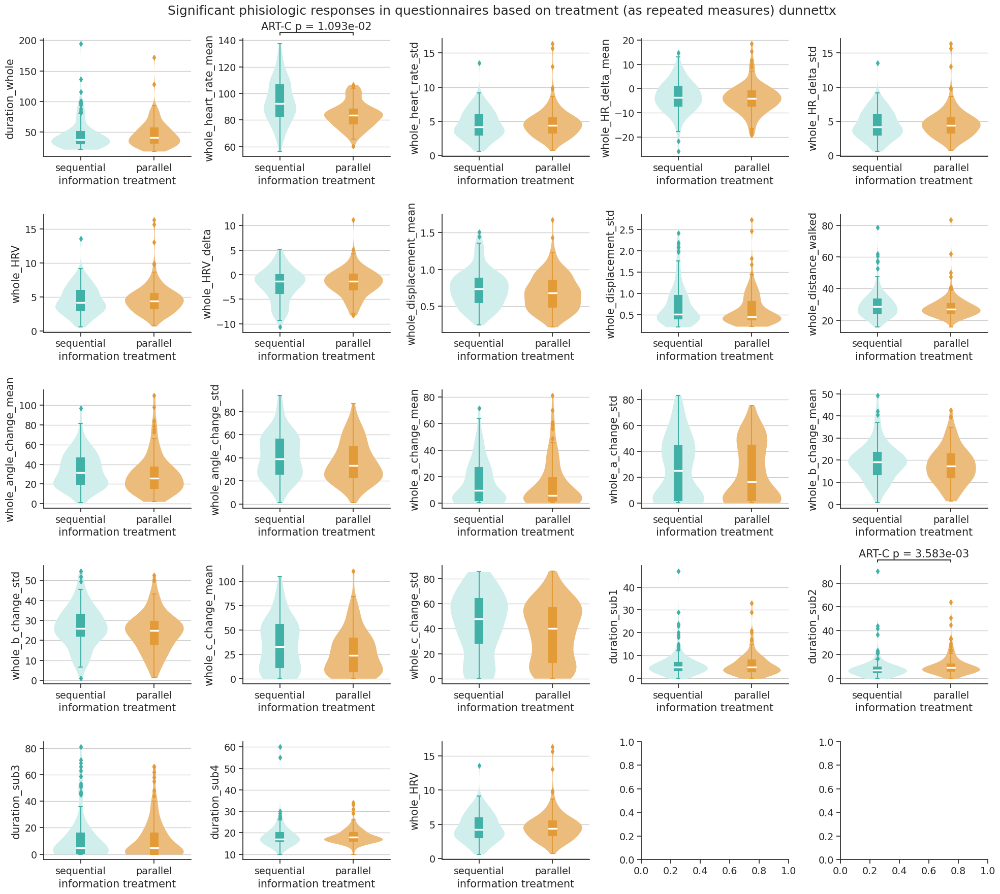

In [1421]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(20, 18), sharey=False) # figsize=(6.665, 5.75)
ax = ax.flatten()
plt.suptitle("Significant phisiologic responses in questionnaires based on treatment (as repeated measures) dunnettx")

cols_of_interest = dv_repeated_num_w + ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"] + ["whole_HRV"]
#["whole_heart_rate_mean", "whole_HR_delta_mean", "baseline_heart_rate_mean",
 #                   "whole_heart_rate_std", "whole_HR_delta_std", "baseline_heart_rate_std",
  #                  "baseline_heart_rate_len", "duration_sub2"]#significant_metrics_art_anova_treatments

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)


for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data#[data["baseline_heart_rate_len"]>150]
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ####### generic one ###########
    # pairs=[("information", "efficiency")]
    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    # annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    ######### custom one ART-C ##########
    pairs=[("efficiency", "information")]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments[col_name]
    print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"], hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"])
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
        
    ###############

    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["sequential", "parallel"]

    ax[i].set_xticklabels(labels)
    ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # ax[i].set_ylabel("information treatment")
        
    
    
    sns.despine(trim=False)
plt.tight_layout()
plt.show()

duration_sub2


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,35.371752,11.441331,40.763774,3.091577,0.003583


pairs: [('efficiency', 'information')]
pvalues: [0.003583418217987598]
information vs. efficiency: Custom statistical test, P_val:3.583e-03
whole_heart_rate_mean


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,-55.550747,20.836619,40.996183,-2.666015,0.010933


pairs: [('efficiency', 'information')]
pvalues: [0.010932880686525509]
information vs. efficiency: Custom statistical test, P_val:1.093e-02


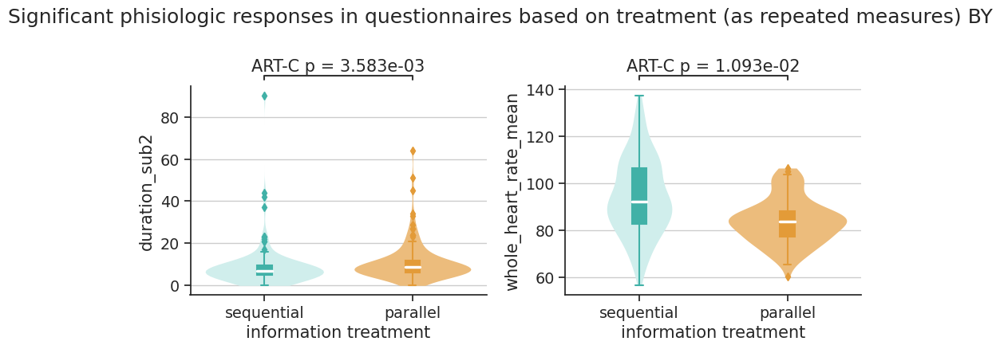

In [1428]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9.5, 4.5), sharey=False) # figsize=(6.665, 5.75)
ax = ax.flatten()
plt.suptitle("Significant phisiologic responses in questionnaires based on treatment (as repeated measures) {}".format(p_adj))

cols_of_interest = significant_metrics_art_anova_treatments
#["whole_heart_rate_mean", "whole_HR_delta_mean", "baseline_heart_rate_mean",
 #                   "whole_heart_rate_std", "whole_HR_delta_std", "baseline_heart_rate_std",
  #                  "baseline_heart_rate_len", "duration_sub2"]#significant_metrics_art_anova_treatments

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)


for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data#[data["baseline_heart_rate_len"]>150]
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ####### generic one ###########
    # pairs=[("information", "efficiency")]
    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    # annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    ######### custom one ART-C ##########
    pairs=[("efficiency", "information")]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments[col_name]
    print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"], hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"])
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
        
    ###############

    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["sequential", "parallel"]

    ax[i].set_xticklabels(labels)
    ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # ax[i].set_ylabel("information treatment")
    
    
    sns.despine(trim=False)
plt.tight_layout()
plt.show()

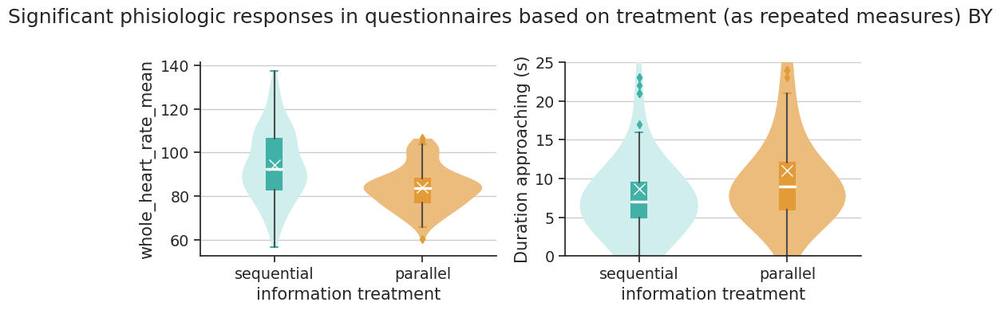

In [981]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9.5, 4), sharey=False) # figsize=(6.665, 5.75)
ax = ax.flatten()
plt.suptitle("Significant phisiologic responses in questionnaires based on treatment (as repeated measures) {}".format(p_adj))

cols_of_interest = significant_metrics_art_anova_treatments
#["whole_heart_rate_mean", "whole_HR_delta_mean", "baseline_heart_rate_mean",
 #                   "whole_heart_rate_std", "whole_HR_delta_std", "baseline_heart_rate_std",
  #                  "baseline_heart_rate_len", "duration_sub2"]#significant_metrics_art_anova_treatments

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)


for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data#[data["baseline_heart_rate_len"]>150]
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
                
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops, fliersize=0) #palette=ibm_01_d
    
    ####### generic one ###########
    # pairs=[("information", "efficiency")]
    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    # annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
#     ######### custom one ART-C ##########
#     pairs=[("efficiency", "information")]
#     new_pairs=[]
#     map_pairs = dict()
#     for pair in pairs:
#         newpair = "{} - {}".format(pair[0], pair[1])
#         new_pairs.append(newpair)
#         map_pairs[newpair] = pair
    
#     value = dict_results_treatments[col_name]
#     print(col_name)
#     # display(value["model_anova"])
#     df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
#     display(df_contrasts)
    
#     test_short_name = 'ART-C'
#     custom_pairs = []
#     custom_pvalues = []
    
#     for index, row in df_contrasts.iterrows(): 
#         # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
#         custom_pairs.append(map_pairs[row["contrast"]])
#         custom_pvalues.append(row["p.value"])
#     print("pairs:", custom_pairs)
#     print("pvalues:", custom_pvalues)
#     if len(custom_pairs)>0:
#         annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"], hide_non_significant=True)
#         annot.new_plot(ax=ax[i], pairs=custom_pairs,
#                    data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"])
#         (annot
#          .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
#          .set_pvalues(pvalues=custom_pvalues)
#          .annotate())
#         # plt.show()
        
#     ###############

    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["sequential", "parallel"]

    ax[i].set_xticklabels(labels)
    ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # ax[i].set_ylabel("information treatment")
    if col_name == "duration_sub2": 
        ax[i].set_ylim(0,25000)
    
    relabel(ax[i], col_name)
    
    sns.despine(trim=False)
plt.tight_layout()
plt.show()

In [864]:
print("median sub_2 for information: ",data[data["treatment_group"]=="information"].duration_sub2.median()/1000, "secs")
print("median sub_2 for efficiency: ",data[data["treatment_group"]=="efficiency"].duration_sub2.median()/1000, "secs")
print("median sub_2 for information: ",data[data["treatment_group"]=="information"].duration_sub2.mean()/1000, "secs")
print("median sub_2 for efficiency: ",data[data["treatment_group"]=="efficiency"].duration_sub2.mean()/1000, "secs")

median sub_2 for information:  7.0 secs
median sub_2 for efficiency:  9.0 secs
median sub_2 for information:  8.678984732824427 secs
median sub_2 for efficiency:  11.022185185185185 secs


duration_whole, whole_displacement_mean and duration_sub1 are misspecified

alternative, Kruskal-Wallis H test

In [1687]:
cols_of_interest = ["duration_whole", "whole_displacement_mean", "duration_sub1"]
#dv_repeated_num_w + ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"]# + dv_repeated_cat
cols_of_interest = ["whole_distance_walked"]

significant_metrics_art_anova_treatments_bis = []
dict_results_treatments_bis = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_kw(metric, 
                 fixed_effects="treatment_group_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_bis)
    dict_results_treatments_bis[metric] = art_result


 processing ART Anova for whole_distance_walked

	Kruskal-Wallis rank sum test

data:  whole_distance_walked by treatment_group_f
Kruskal-Wallis chi-squared = 1.7151, df = 1, p-value = 0.1903


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$whole_distance_walked and data$treatment_group_f 

            efficiency
information 0.19      

P value adjustment method: BY 


In [814]:
# data[["Participant_ID","whole_HR_delta_mean"]


#### $Y$~$Scenario+(1|Participant\_ID)$

In [1688]:
cols_of_interest = ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"] + dv_repeated_num_w + ["whole_HRV" , "whole_HRV_delta"]# + dv_repeated_cat
# cols_of_interest = dv_repeated_HR_num
cols_of_interest = ["whole_distance_walked"]


significant_metrics_art_anova_scenarios = []
dict_results_scenarios = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios)
    dict_results_scenarios[metric] = art_result


 processing ART Anova for whole_distance_walked
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_distance_walked)

                  F Df Df.res     Pr(>F)    
1 Scenario_f 10.881  2 222.45 3.1018e-05 ***
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast estimate   SE  df t.ratio p.value
 A - B       -48.6 10.6 223  -4.589  <.0001
 A - C       -33.3 10.9 221  -3.064  0.0067
 B - C        15.3 10.6 223   1.441  0.2769

Degrees-of-freedom method: kenward-roger 
P value adjustment: BY method for 3 tests 
				 whole_distance_walked IS SIGNIFICANT


##### summary

In [1691]:
pairs=[("A", "B"), ("B", "C"), ("A", "C")]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{} - {}".format(pair[0], pair[1])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair
display(map_pairs)

for key in significant_metrics_art_anova_scenarios:
    value = dict_results_scenarios[key]
    print(key)
    display(value["model_anova"])
    display(value["posthoc"])

{'A - B': ('A', 'B'), 'B - C': ('B', 'C'), 'A - C': ('A', 'C')}

whole_distance_walked


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,10.88082,2.0,222.449329,0.000031


,contrast,estimate,SE,df,t.ratio,p.value
1,A - B,-48.563263,10.583242,223.097616,-4.588694,0.000041
2,A - C,-33.272519,10.858983,221.443167,-3.064055,0.006750
3,B - C,15.290744,10.612595,222.763070,1.440811,0.276911


whole_displacement_mean , and duration_sub1  are misspecified

alternative Kruskal-Wallis H test

In [817]:
cols_of_interest = ["whole_displacement_mean" , "duration_sub1"]
#dv_repeated_num_w + ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"]# + dv_repeated_cat

significant_metrics_art_anova_scenarios_bis = []
dict_results_scenarios_bis = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_kw(metric, 
                 fixed_effects="Scenario_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios_bis)
    dict_results_scenarios_bis[metric] = art_result


 processing ART Anova for whole_displacement_mean

	Kruskal-Wallis rank sum test

data:  whole_displacement_mean by Scenario_f
Kruskal-Wallis chi-squared = 2.822, df = 2, p-value = 0.2439


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$whole_displacement_mean and data$Scenario_f 

  A    B   
B 0.55 -   
C 0.87 0.91

P value adjustment method: BY 

 processing ART Anova for duration_sub1

	Kruskal-Wallis rank sum test

data:  duration_sub1 by Scenario_f
Kruskal-Wallis chi-squared = 7.8127, df = 2, p-value = 0.02011


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$duration_sub1 and data$Scenario_f 

  A     B    
B 0.176 -    
C 0.022 1.000

P value adjustment method: BY 


#### $Y$~$treatment*Scenario+(1|Participant\_ID)$

In [818]:
# with random effects

In [1689]:
cols_of_interest = ["duration_sub1", "duration_sub2", "duration_sub3", "duration_sub4"] + dv_repeated_num_w + ["whole_HRV", "whole_HRV_delta"] # + dv_repeated_cat
# cols_of_interest = dv_repeated_HR_num
cols_of_interest = ["whole_distance_walked"]


significant_metrics_art_anova_treatments_sce = []
dict_results_treatments_sce = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data #data_IdSc_02
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*treatment_group_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_sce)
    dict_results_treatments_sce[metric] = art_result


 processing ART Anova for whole_distance_walked
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_distance_walked)

                                     F Df  Df.res     Pr(>F)    
1 Scenario_f                   9.62895  2 220.513 9.7909e-05 ***
2 treatment_group_f            0.99649  1  40.856    0.32404    
3 Scenario_f:treatment_group_f 1.90627  2 220.409    0.15108    
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                      estimate   SE  df t.ratio p.value
 A,efficiency - A,information    -16.25 16.7 161  -0.971  1.0000
 A,efficiency - B,efficiency     -62.23 14.7 221  -4.220  0.0018
 A,efficiency - B,information    -50.73 16.4 152  -3.098  0.0386
 A,efficiency - C,efficiency     -23.63 15.1 220  -1.562  0.5957
 A,efficiency - C,information    -59.28 16.7 161  -3.542  0.0129
 A,information - B,effici

In [1583]:
significant_metrics_art_anova_treatments_sce

['duration_sub1',
 'duration_sub2',
 'duration_sub3',
 'duration_sub4',
 'duration_whole',
 'whole_heart_rate_mean',
 'whole_displacement_std',
 'whole_distance_walked',
 'whole_angle_change_std',
 'whole_a_change_mean',
 'whole_a_change_std',
 'whole_b_change_mean',
 'whole_c_change_mean']

##### summary

In [1690]:
pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair

display(new_pairs)
    
for key in significant_metrics_art_anova_treatments_sce:
    value = dict_results_treatments_sce[key]
    print(key)
    display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    for index, row in df_contrasts.iterrows(): 
        print("Performing ART-C test:",
          map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)

['A,efficiency - A,information',
 'B,efficiency - B,information',
 'C,efficiency - C,information',
 'A,efficiency - B,efficiency',
 'B,efficiency - C,efficiency',
 'A,efficiency - C,efficiency',
 'A,information - B,information',
 'B,information - C,information',
 'A,information - C,information']

whole_distance_walked


,Term,F,Df,Df.res,Pr(>F)
Scenario_f,Scenario_f,9.628948,2.0,220.513098,0.000098
treatment_group_f,treatment_group_f,0.996494,1.0,40.856010,0.324036
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,1.906265,2.0,220.408849,0.151077


,contrast,estimate,SE,df,t.ratio,p.value
2,"A,efficiency - B,efficiency",-62.228727,14.746058,221.354711,-4.220025,0.001774
9,"A,information - C,information",-43.023810,15.387482,219.210777,-2.796027,0.058740
11,"B,efficiency - C,efficiency",38.598184,14.826424,220.721787,2.603337,0.081780


Performing ART-C test: ('Aefficiency', 'Befficiency') estimate=-6.22e+01 p-value=1.77e-03
Performing ART-C test: ('Ainformation', 'Cinformation') estimate=-4.30e+01 p-value=5.87e-02
Performing ART-C test: ('Befficiency', 'Cefficiency') estimate=3.86e+01 p-value=8.18e-02
pairs: [('Aefficiency', 'Befficiency'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency')]
pvalues: [0.0017743256716790824, 0.05874000237696064, 0.08177994062896585]


In [1593]:
list_ART_significant_phisiological = list(set(significant_metrics_art_anova_treatments + significant_metrics_art_anova_scenarios + significant_metrics_art_anova_treatments_sce))
for key in list_ART_significant_phisiological:
    print(key)
    # value = dict_results_treatments[key]
    # display(value["posthoc"])
    # value = dict_results_scenarios[key]
    # display(value["posthoc"])
    # value = dict_results_treatments_sce[key]
    # display(value["model_anova"])
    # display(value["posthoc"])

duration_sub3
duration_sub2
whole_a_change_std
duration_whole
whole_c_change_mean
whole_a_change_mean
duration_sub4
whole_displacement_std
whole_b_change_mean
whole_angle_change_std
duration_sub1
whole_distance_walked
whole_heart_rate_mean


##### plot

In [1592]:
order = sorted(list(set(data_IdSc_02.scenario__treatment)))
order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
print(order)
list(itertools.combinations(order, 2))

['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']


[('Ainformation', 'Aefficiency'),
 ('Ainformation', 'Binformation'),
 ('Ainformation', 'Befficiency'),
 ('Ainformation', 'Cinformation'),
 ('Ainformation', 'Cefficiency'),
 ('Aefficiency', 'Binformation'),
 ('Aefficiency', 'Befficiency'),
 ('Aefficiency', 'Cinformation'),
 ('Aefficiency', 'Cefficiency'),
 ('Binformation', 'Befficiency'),
 ('Binformation', 'Cinformation'),
 ('Binformation', 'Cefficiency'),
 ('Befficiency', 'Cinformation'),
 ('Befficiency', 'Cefficiency'),
 ('Cinformation', 'Cefficiency')]

In [1594]:
print(len(list_ART_significant_phisiological))
print(list_ART_significant_phisiological)
list_ART_significant_phisiological.remove("whole_c_change_mean")
print(len(list_ART_significant_phisiological))
print(list_ART_significant_phisiological)

13
['duration_sub3', 'duration_sub2', 'whole_a_change_std', 'duration_whole', 'whole_c_change_mean', 'whole_a_change_mean', 'duration_sub4', 'whole_displacement_std', 'whole_b_change_mean', 'whole_angle_change_std', 'duration_sub1', 'whole_distance_walked', 'whole_heart_rate_mean']
12
['duration_sub3', 'duration_sub2', 'whole_a_change_std', 'duration_whole', 'whole_a_change_mean', 'duration_sub4', 'whole_displacement_std', 'whole_b_change_mean', 'whole_angle_change_std', 'duration_sub1', 'whole_distance_walked', 'whole_heart_rate_mean']


In [1595]:
def relabel(ax, col_name):
    if col_name=="duration_sub1":
        ax.set_ylabel("Duration familiarization (s)")
    elif col_name=="duration_sub2":
        ax.set_ylabel("Duration approaching (s)")
    elif col_name=="duration_sub3":
        ax.set_ylabel("Duration waiting (s)")
    elif col_name=="duration_sub4":
        ax.set_ylabel("Duration crossing (s)")
    elif col_name=="duration_whole":
        ax.set_ylabel("Duration whole task (s)")
    elif col_name=="whole_displacement_std":
        ax.set_ylabel(r"$\sigma$ speed (m/s)")
    elif col_name=="whole_distance_walked":
        ax.set_ylabel("Distance walked (m/s)")
    elif col_name=="whole_a_change_mean":
        ax.set_ylabel(r"$\mu$ pitch change (°)")
    elif col_name=="whole_a_change_std":
        ax.set_ylabel(r"$\sigma$ pitch change (°)")
    elif col_name=="whole_b_change_mean":
        ax.set_ylabel(r"$\mu$ yaw change (°)")
    elif col_name=="whole_angle_change_std":
        ax.set_ylabel(r"$\sigma$ total head angle change (°)")
    return None
    
        

pairs: []
pvalues: []
pairs: [('A', 'B'), ('A', 'C')]
pvalues: [0.1132602146588558, 0.03895934378047014]
A vs. C: Custom statistical test, P_val:3.896e-02
pairs: [('Aefficiency', 'Befficiency'), ('Aefficiency', 'Cefficiency'), ('Befficiency', 'Binformation')]
pvalues: [0.05085856032698273, 0.07639430157512545, 0.02271112569556916]
Binformation vs. Befficiency: Custom statistical test, P_val:2.271e-02
pairs: [('A', 'B'), ('A', 'C')]
pvalues: [0.07208721121325573, 0.02540556044090676]
A vs. C: Custom statistical test, P_val:2.541e-02
pairs: []
pvalues: []
pairs: [('A', 'B'), ('B', 'C')]
pvalues: [0.09989632259042512, 0.007696456193412332]
B vs. C: Custom statistical test, P_val:7.696e-03
pairs: [('Aefficiency', 'Cefficiency'), ('Ainformation', 'Cinformation'), ('Befficiency', 'Cefficiency'), ('Binformation', 'Cinformation')]
pvalues: [0.006112502189164674, 0.00029428953013647366, 0.08025319362993362, 0.0003300994843357037]
Binformation vs. Cinformation: Custom statistical test, P_val:3.3

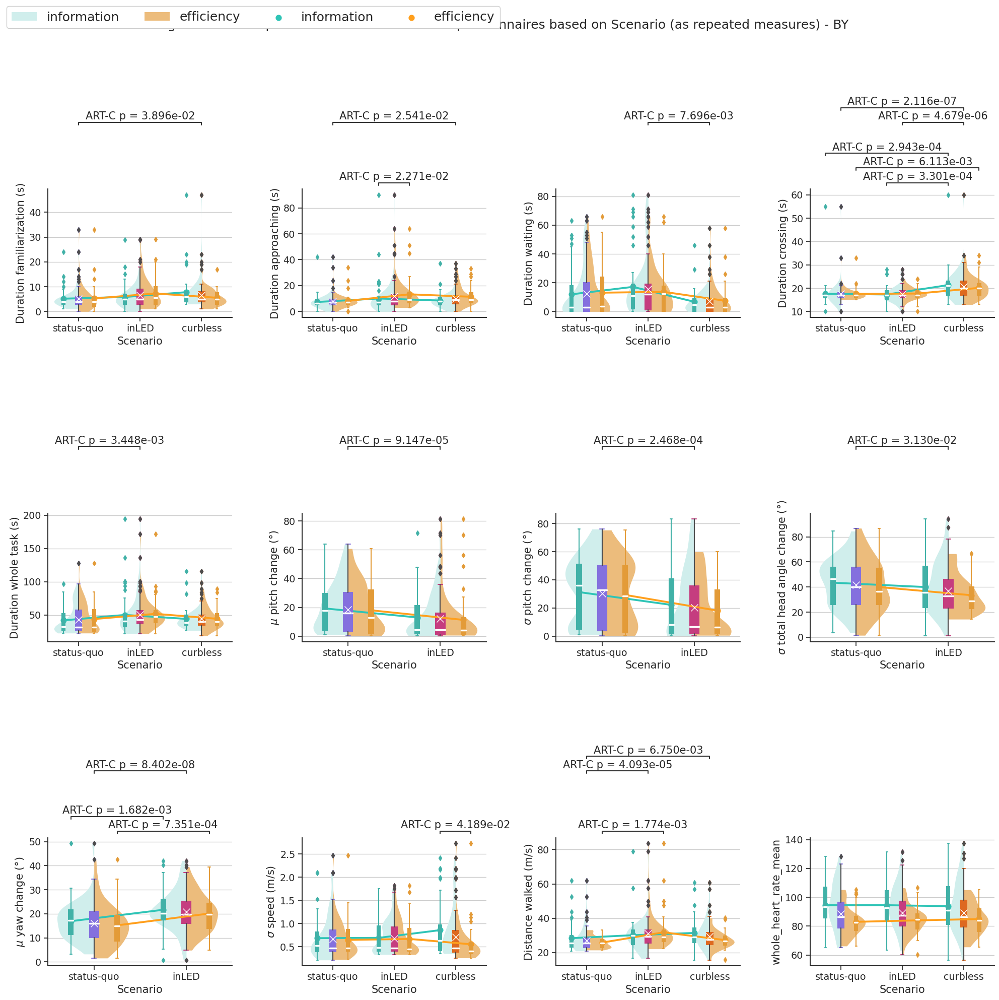

In [1596]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(20, 20), sharey=False, sharex=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in structured questionnaires based on Scenario (as repeated measures) - {}".format(p_adj))

cols_of_interest = sorted(list_ART_significant_phisiological)

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
    
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    ####### generic one ###########
    # pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
    #        ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
    #        ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    # annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    
    ######### custom one ART-C ##########
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments_sce[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax2, pairs=custom_pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax2, pairs=custom_pairs,
                   data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
    ######################################

    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        pairs=[("A", "B")]
        order=["A", "B"]
    else:
        pairs=[("A", "B"), ("B", "C"), ("A", "C")]
        order=["A", "B", "C"]
    
    ####### generic one ###########
    # pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # # annotator.apply_and_annotate()
    # annotator.apply_test().annotate(line_offset_to_group=0.4)
    ################################
    
    ######### custom one ART-C ##########
    

    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_scenarios[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="Scenario", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate(line_offset_to_group=0.5))
        # plt.show()
    ######################################
    

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
    
    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    if len(labels)==3: labels = ["status-quo", "inLED", "curbless"]
    else: labels = ["status-quo", "inLED"]

    ax[i].set_xticklabels(labels)
    # ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # or_label = ax[i].yaxis.get_label()
        # ax[i].set_ylabel("information treatment")
    relabel(ax[i], col_name)
        

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', fontsize="large", ncols=4, framealpha=1)
plt.tight_layout()
plt.show()

# test: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel.

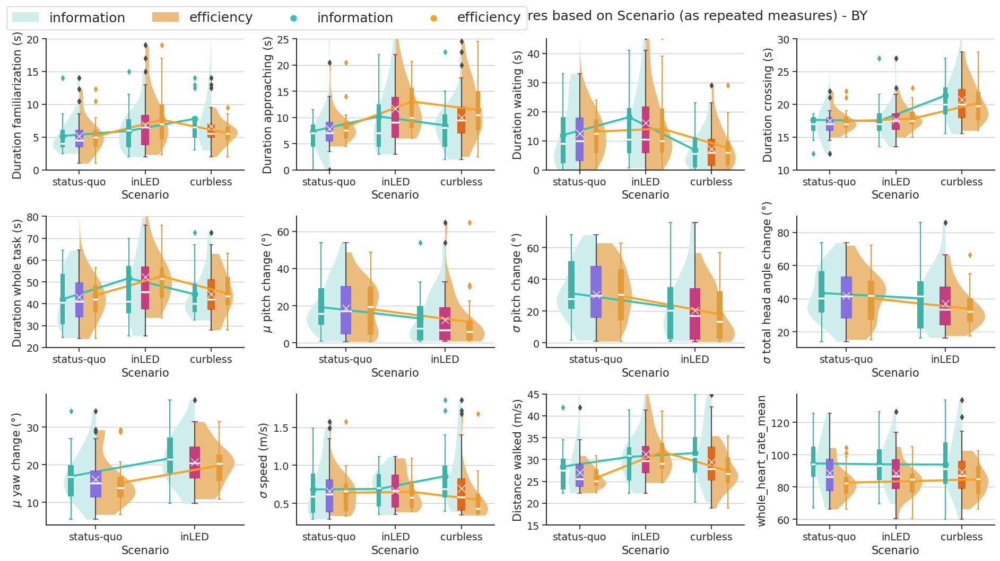

In [980]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(19, 10.75), sharey=False, sharex=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in structured questionnaires based on Scenario (as repeated measures) - {}".format(p_adj))

cols_of_interest = sorted(list_ART_significant_phisiological)

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc_02
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
    
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    ####### generic one ###########
    # pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
    #        ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
    #        ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    # annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    
#     ######### custom one ART-C ##########
    
#     if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
#         col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
#         col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
#         col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
#         col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
#         col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
#         col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
#         col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
#         order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
#         pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
#            ('Aefficiency', 'Befficiency'),
#            ('Ainformation', 'Binformation')]
    
#     else:
#         order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
#         pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
#            ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
#            ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

#     new_pairs=[]
#     map_pairs = dict()
#     for pair in pairs:
#         newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
#         new_pairs.append(newpair)
#         map_pairs[newpair] = pair
    
#     value = dict_results_treatments_sce[col_name]
#     # print(col_name)
#     # display(value["model_anova"])
#     df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
#     # display(df_contrasts)
    
#     test_short_name = 'ART-C'
#     custom_pairs = []
#     custom_pvalues = []
    
#     for index, row in df_contrasts.iterrows(): 
#         # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
#         custom_pairs.append(map_pairs[row["contrast"]])
#         custom_pvalues.append(row["p.value"])
#     print("pairs:", custom_pairs)
#     print("pvalues:", custom_pvalues)
#     if len(custom_pairs)>0:
#         annot = Annotator(ax2, pairs=custom_pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
#         annot.new_plot(ax=ax2, pairs=custom_pairs,
#                    data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order)
#         (annot
#          .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
#          .set_pvalues(pvalues=custom_pvalues)
#          .annotate())
#         # plt.show()
#     ######################################

    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        pairs=[("A", "B")]
        order=["A", "B"]
    else:
        pairs=[("A", "B"), ("B", "C"), ("A", "C")]
        order=["A", "B", "C"]
    
    ####### generic one ###########
    # pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # # annotator.apply_and_annotate()
    # annotator.apply_test().annotate(line_offset_to_group=0.4)
    ################################
    
#     ######### custom one ART-C ##########
    

#     new_pairs=[]
#     map_pairs = dict()
#     for pair in pairs:
#         newpair = "{} - {}".format(pair[0], pair[1])
#         new_pairs.append(newpair)
#         map_pairs[newpair] = pair
    
#     value = dict_results_scenarios[col_name]
#     # print(col_name)
#     # display(value["model_anova"])
#     df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
#     # display(df_contrasts)
    
#     test_short_name = 'ART-C'
#     custom_pairs = []
#     custom_pvalues = []
    
#     for index, row in df_contrasts.iterrows(): 
#         # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
#         custom_pairs.append(map_pairs[row["contrast"]])
#         custom_pvalues.append(row["p.value"])
#     print("pairs:", custom_pairs)
#     print("pvalues:", custom_pvalues)
#     if len(custom_pairs)>0:
#         annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
#         annot.new_plot(ax=ax[i], pairs=custom_pairs,
#                    data=temp_chosen_df, x="Scenario", y=col_name, order=order)
#         (annot
#          .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
#          .set_pvalues(pvalues=custom_pvalues)
#          .annotate(line_offset_to_group=0.5))
#         # plt.show()
#     ######################################
    
    # set custom Y axis lim
    if col_name=="duration_sub1": 
        ax[i].set_ylim(0, 20000)
        ax2.set_ylim(0, 20000)
    elif col_name=="duration_sub2": 
        ax[i].set_ylim(0, 25000)
        ax2.set_ylim(0, 25000)
    elif col_name=="duration_sub3": 
        ax[i].set_ylim(0, 45000)
        ax2.set_ylim(0, 45000)
    elif col_name=="duration_sub4": 
        ax[i].set_ylim(10000, 30000)
        ax2.set_ylim(10000, 30000)
    elif col_name=="duration_whole": 
        ax[i].set_ylim(20000, 80000)
        ax2.set_ylim(20000, 80000)
    elif col_name=="whole_distance_walked": 
        ax[i].set_ylim(15, 45)
        ax2.set_ylim(15, 45)

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
    
    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    if len(labels)==3: labels = ["status-quo", "inLED", "curbless"]
    else: labels = ["status-quo", "inLED"]

    ax[i].set_xticklabels(labels)
    # ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # or_label = ax[i].yaxis.get_label()
        # ax[i].set_ylabel("information treatment")
    relabel(ax[i], col_name)

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', fontsize="large", ncols=4, framealpha=1)
plt.tight_layout()
plt.show()

# test: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel.

**whole_displacement_mean**, **duration_whole** and **duration_sub1** are misspecified.

so, no random effects

In [825]:
cols_of_interest = ["whole_displacement_mean", "duration_whole", "duration_sub1"]# + dv_repeated_cat

significant_metrics_art_anova_treatments_sce_bis = []
dict_results_treatments_sce_bis = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)

    art_result = computer_kw(metric, 
                 fixed_effects="treatment__scenario_f",
                 random_effects="",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_sce_bis)
    dict_results_treatments_sce_bis[metric] = art_result


 processing ART Anova for whole_displacement_mean

	Kruskal-Wallis rank sum test

data:  whole_displacement_mean by treatment__scenario_f
Kruskal-Wallis chi-squared = 6.3118, df = 5, p-value = 0.277


	Pairwise comparisons using Wilcoxon rank sum exact test 

data:  data$whole_displacement_mean and data$treatment__scenario_f 

             efficiencyA efficiencyB efficiencyC informationA informationB
efficiencyB  1           -           -           -            -           
efficiencyC  1           1           -           -            -           
informationA 1           1           1           -            -           
informationB 1           1           1           1            -           
informationC 1           1           1           1            1           

P value adjustment method: BY 

 processing ART Anova for duration_whole

	Kruskal-Wallis rank sum test

data:  duration_whole by treatment__scenario_f
Kruskal-Wallis chi-squared = 14.527, df = 5, p-value = 0.01259


	P

In [609]:
pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
new_pairs=[]
map_pairs = dict()
for pair in pairs:
    newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
    new_pairs.append(newpair)
    map_pairs[newpair] = pair

display(new_pairs)
    
for key in significant_metrics_art_anova_treatments_sce_bis:
    value = dict_results_treatments_sce_bis[key]
    print(key)
    display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    for index, row in df_contrasts.iterrows(): 
        print("Performing ART-C test:",
          map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)

['A,efficiency - A,information',
 'B,efficiency - B,information',
 'C,efficiency - C,information',
 'A,efficiency - B,efficiency',
 'B,efficiency - C,efficiency',
 'A,efficiency - C,efficiency',
 'A,information - B,information',
 'B,information - C,information',
 'A,information - C,information']

duration_whole


,Term,Df,Df.res,Sum Sq,Sum Sq.res,F value,Pr(>F)
Scenario_f,Scenario_f,2.0,260.0,68506.307284,1.489248e+06,5.980080,0.002890
treatment_group_f,treatment_group_f,1.0,260.0,9411.527051,1.524665e+06,1.604940,0.206338
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,2.0,260.0,10365.641777,1.531339e+06,0.879971,0.416027


,contrast,estimate,SE,df,t.ratio,p.value
2,"A,efficiency - B,efficiency",-48.025568,15.754743,260.0,-3.048325,0.019039


Performing ART-C test: ('Aefficiency', 'Befficiency') estimate=-4.80e+01 p-value=1.90e-02
pairs: [('Aefficiency', 'Befficiency')]
pvalues: [0.019039160824485736]
duration_sub1


,Term,Df,Df.res,Sum Sq,Sum Sq.res,F value,Pr(>F)
Scenario_f,Scenario_f,2.0,260.0,46093.877167,1.483869e+06,4.038230,0.018746
treatment_group_f,treatment_group_f,1.0,260.0,191.110883,1.532754e+06,0.032418,0.857254
Scenario_f:treatment_group_f,Scenario_f:treatment_group_f,2.0,260.0,21825.886293,1.537732e+06,1.845163,0.160063


,contrast,estimate,SE,df,t.ratio,p.value
2,"A,efficiency - B,efficiency",-35.061553,15.771751,260.0,-2.223060,0.135359
9,"A,information - C,information",-40.285714,16.490101,260.0,-2.443024,0.114231


Performing ART-C test: ('Aefficiency', 'Befficiency') estimate=-3.51e+01 p-value=1.35e-01
Performing ART-C test: ('Ainformation', 'Cinformation') estimate=-4.03e+01 p-value=1.14e-01
pairs: [('Aefficiency', 'Befficiency'), ('Ainformation', 'Cinformation')]
pvalues: [0.13535908729408438, 0.11423053234790584]


In [306]:
cols_of_interest = dv_repeated_num# + dv_repeated_cat

significant_metrics_art_anova_ = []
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    if metric.endswith("whole") or metric.startswith("whole"):
    
    #     metric = cols_of_interest[i]
    #     # print(metric)

        # selecting the right dataset
        # if metric in dv_repeated_cat or metric in dv_repeated_num:
        chosen_df = data_repeated
        # else:
        #     chosen_df = data_unique
    #     #check and transform if needed for skewness
    #     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
        # drop bad C scenario data
        temp_chosen_df = filter_for_missing_c_scenario_angles(data_IdScCon, metric)

        art_result = computer_art_r(metric, 
                     fixed_effects="treatment_group_f",
                     random_effects="(1|Participant_ID)",
                     data=temp_chosen_df, 
                     list_significant_metrics=significant_metrics_art_anova_)
 

R[write to console]: boundary (singular) fit: see help('isSingular')




 processing ART Anova for duration_whole
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(duration_whole)

                         F Df Df.res  Pr(>F)  
1 treatment_group_f 1.4362  1 40.728 0.23769  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



p_val 
 0.23768649701735675
	 duration_whole not significant

 processing ART Anova for whole_heart_rate_mean
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_heart_rate_mean)

                         F Df Df.res   Pr(>F)  
1 treatment_group_f 7.1283  1 40.996 0.010826 *
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
p_val 
 0.0108262240323113
	 whole_heart_rate_mean IS SIGNIFICANT

 processing ART Anova for whole_heart_rate_std
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_heart_rate_std)

                           F Df Df.res  Pr(>F)  
1 treatment_group_f 0.043073  1  40.88 0.83662  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



p_val 
 0.8366174660331795
	 whole_heart_rate_std not significant

 processing ART Anova for whole_displacement_mean
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_displacement_mean)

                         F Df Df.res   Pr(>F)  
1 treatment_group_f 3.3058  1 40.728 0.076395 .
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: boundary (singular) fit: see help('isSingular')



p_val 
 0.07639533219166553
	 whole_displacement_mean not significant

 processing ART Anova for whole_displacement_std
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_displacement_std)

                         F Df Df.res Pr(>F)  
1 treatment_group_f 3.6102  1 40.846 0.0645 .
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
p_val 
 0.06449964504781978
	 whole_displacement_std not significant

 processing ART Anova for whole_angle_change_mean
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_angle_change_mean)

                         F Df Df.res  Pr(>F)  
1 treatment_group_f 1.7468  1 40.951 0.19362  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
p_val 
 0.193621684

### running for **HR adv responses** HF/LF ratio (data disagregated): $Y_{phisiologic}$ ~ $G + (1|id)$

In [1597]:
display(dv_HR_adv)
# display(dv_repeated_num)

['whole_HR_LF_HF_ratio',
 'sub1_HR_LF_HF_ratio',
 'sub2_HR_LF_HF_ratio',
 'sub3_HR_LF_HF_ratio',
 'sub4_HR_LF_HF_ratio']

In [1598]:
def relabel(ax, col_name):
    if col_name=="sub2_HR_LF_HF_ratio":
        ax.set_ylabel("HR LF/HF ratio approaching")
    elif col_name=="sub3_HR_LF_HF_ratio":
        ax.set_ylabel("HR LF/HF ratio waiting")
    
    return None
    
        

In [1599]:
# data.head(4)
# data[["Participant_ID","whole_HR_delta_mean"]]
# data[data["Participant_ID"]==6]
data.iloc[10:15]

,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_success,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_success,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_success,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,Black Screen,Config_recoded,Configuration,Day,EndDate,Participant ID,Participant_ID,Reached Curb,ResponseId,Scenario,Session Nr,Start,StartDate,Started Crossing,Started Walking,Successful?,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_active_delta_neg,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_avg_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_sss_std_delta,a_success,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,age,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_active_delta_neg,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_avg_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_sss_std_delta,b_success,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,baseline_HRV,baseline_HR_raw_RRintervals,baseline_HR_raw_timeseries,baseline_HR_raw_zeroTimestamps,baseline_heart_rate_len,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_heart_rate_timeseries,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_active_delta_neg,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_avg_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_sss_std_delta,c_success,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,city_live,city_raised,country_live,country_raised,country_raised_CH,driving_license,duration,duration_sub1,duration_sub2,duration_sub3,duration_sub4,duration_whole,experience_vr,experience_vr_recoded,experiments,experiments_recoded,fav,fav_cat,fav_duration,fav_recoded,gender,km_drive,km_drive_recoded,km_drive_recoded_num,m_walk,neighborhood,neighborhood_recoded,old_index_01,old_index_02,own_car,pref_transport,real_order_clean,real_order_raw,scenario__config,scenario__config_recoded,study,sub1_HRV,sub1_HRV_delta,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HR_delta_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_timeseries,su

#### $Y$~$treatment+(1|Participant\_ID)$

In [1674]:
cols_of_interest = dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data#.dropna(subset="experience_vr_recoded")
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="treatment_group_f*m_walk_f",
                 random_effects="(1|Participant_ID)",
                 p_adj="BH",
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for whole_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_HR_LF_HF_ratio)

                                      F Df Df.res  Pr(>F)  
1 treatment_group_f          1.53647793  1 39.707 0.22242  
2 m_walk_f                   0.00027282  1 41.556 0.98690  
3 treatment_group_f:m_walk_f         NA  0  0.000      NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate   SE   df t.ratio p.value
 efficiency,yes - information,no      9.35 38.1 41.6   0.245  0.8912
 efficiency,yes - information,yes    14.60 11.4 39.7   1.279  0.6252
 information,no - information,yes     5.25 38.2 41.5   0.138  0.8912

Degrees-of-freedom method: kenward-roger 
P value adjustment: BH method for 3 tests 


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient



				 whole_HR_LF_HF_ratio not significant

 processing ART Anova for sub1_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub1_HR_LF_HF_ratio)

                                   F Df Df.res  Pr(>F)  
1 treatment_group_f          1.05181  1 39.472 0.31134  
2 m_walk_f                   0.26191  1 42.812 0.61144  
3 treatment_group_f:m_walk_f      NA  0  0.000      NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



 contrast                         estimate    SE   df t.ratio p.value
 efficiency,yes - information,no     -18.1 32.16 42.9  -0.561  0.7425
 efficiency,yes - information,yes     -7.4  9.57 39.5  -0.773  0.7425
 information,no - information,yes     10.7 32.21 42.8   0.331  0.7425

Degrees-of-freedom method: kenward-roger 
P value adjustment: BH method for 3 tests 


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')



				 sub1_HR_LF_HF_ratio not significant

 processing ART Anova for sub2_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub2_HR_LF_HF_ratio)

                                   F Df Df.res  Pr(>F)  
1 treatment_group_f          5.46711  1 39.804 0.02449 *
2 m_walk_f                   0.82987  1 40.867 0.36765  
3 treatment_group_f:m_walk_f      NA  0  0.000      NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate   SE   df t.ratio p.value
 efficiency,yes - information,no      54.2 42.1 41.0   1.289  0.3069
 efficiency,yes - information,yes     27.2 12.6 39.8   2.149  0.1132
 information,no - information,yes    -27.1 42.1 41.0  -0.642  0.5244

Degrees-of-freedom method: kenward-roger 
P value adjustment: BH method for 3 tests 


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient



				 sub2_HR_LF_HF_ratio IS SIGNIFICANT

 processing ART Anova for sub3_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub3_HR_LF_HF_ratio)

                                  F Df Df.res  Pr(>F)  
1 treatment_group_f          2.7746  1 39.472 0.10369  
2 m_walk_f                   1.5652  1 42.812 0.21769  
3 treatment_group_f:m_walk_f     NA  0  0.000      NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


R[write to console]: boundary (singular) fit: see help('isSingular')



 contrast                         estimate    SE   df t.ratio p.value
 efficiency,yes - information,no      36.2 32.06 42.9   1.129  0.3978
 efficiency,yes - information,yes     12.2  9.54 39.5   1.274  0.3978
 information,no - information,yes    -24.0 32.11 42.8  -0.749  0.4582

Degrees-of-freedom method: kenward-roger 
P value adjustment: BH method for 3 tests 


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: boundary (singular) fit: see help('isSingular')



				 sub3_HR_LF_HF_ratio not significant

 processing ART Anova for sub4_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub4_HR_LF_HF_ratio)

                                   F Df Df.res   Pr(>F)  
1 treatment_group_f          3.01055  1 39.680 0.090486 .
2 m_walk_f                   0.45861  1 41.749 0.502012  
3 treatment_group_f:m_walk_f      NA  0  0.000       NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate   SE   df t.ratio p.value
 efficiency,yes - information,no      37.0 37.0 41.7   1.001  0.4836
 efficiency,yes - information,yes     18.8 11.1 39.7   1.695  0.2938
 information,no - information,yes    -18.3 37.0 41.7  -0.493  0.6245

Degrees-of-freedom method: kenward-roger 
P value adjustment: BH method for 3 tests 


R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient

R[write to console]: fixed-effect model matrix is rank deficient so dropping 1 column / coefficient



				 sub4_HR_LF_HF_ratio not significant


##### plot

sub2_HR_LF_HF_ratio


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,28.409697,12.388288,40.816867,2.293271,0.027056


pairs: [('efficiency', 'information')]
pvalues: [0.02705613041041781]
information vs. efficiency: Custom statistical test, P_val:2.706e-02


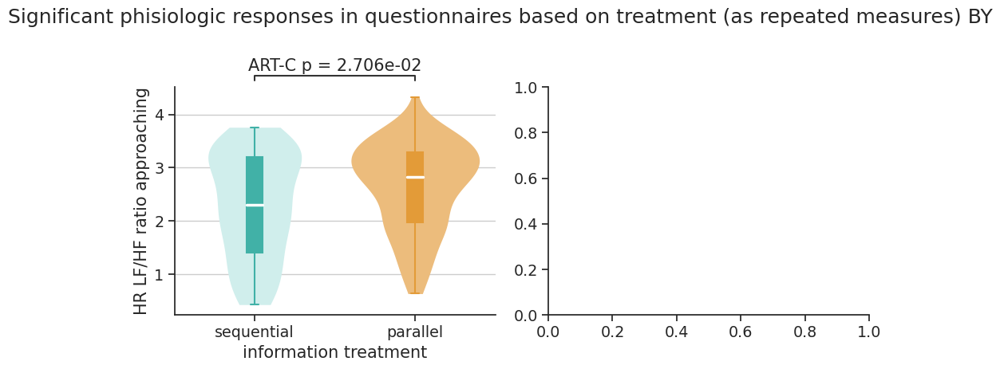

In [1627]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4.75), sharey=False) # figsize=(6.665, 5.75)
ax = ax.flatten()
plt.suptitle("Significant phisiologic responses in questionnaires based on treatment (as repeated measures) {}".format(p_adj))

cols_of_interest = significant_metrics_art_anova_treatments
#["whole_heart_rate_mean", "whole_HR_delta_mean", "baseline_heart_rate_mean",
 #                   "whole_heart_rate_std", "whole_HR_delta_std", "baseline_heart_rate_std",
  #                  "baseline_heart_rate_len", "duration_sub2"]#significant_metrics_art_anova_treatments

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)


for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data#[data["baseline_heart_rate_len"]>150]
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ####### generic one ###########
    # pairs=[("information", "efficiency")]
    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    # annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    ######### custom one ART-C ##########
    pairs=[("efficiency", "information")]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments[col_name]
    print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"], hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"])
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
        
    ###############

    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["sequential", "parallel"]

    ax[i].set_xticklabels(labels)
    ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # ax[i].set_ylabel("information treatment")
    relabel(ax[i], col_name)
    
    sns.despine(trim=False)
plt.tight_layout()
plt.show()

In [1634]:
cols_of_interest = ["sub1_HR_LF_HF_ratio", "sub3_HR_LF_HF_ratio"]#dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_kw(metric, 
                 fixed_effects="treatment_group_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for sub1_HR_LF_HF_ratio


R[write to console]: Error in kruskal.test.formula(formula = sub1_HR_LF_HF_ratio ~ treatment_group_f *  : 
  'formula' should be of the form response ~ group

R[write to console]: In addition: 
R[write to console]: There were 12 warnings (use warnings() to see them)
R[write to console]: 



RRuntimeError: Error in kruskal.test.formula(formula = sub1_HR_LF_HF_ratio ~ treatment_group_f *  : 
  'formula' should be of the form response ~ group


#### $Y$~$Scenario+(1|Participant\_ID)$

In [1661]:
data[(data["own_car"]=="no") & ((data["Scenario"]=="A") | (data["Scenario"]=="C"))].describe()

,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,Black Screen,Day,Participant ID,Participant_ID,Reached Curb,Session Nr,Start,Started Crossing,Started Walking,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_active_delta_neg,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_avg_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_sss_std_delta,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,age,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_active_delta_neg,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_avg_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_sss_std_delta,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,baseline_HRV,baseline_heart_rate_len,baseline_heart_rate_mean,baseline_heart_rate_std,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_active_delta_neg,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_avg_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_sss_std_delta,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,country_raised_CH,duration,duration_sub1,duration_sub2,duration_sub3,duration_sub4,duration_whole,experience_vr_recoded,experiments_recoded,fav_cat,fav_duration,km_drive_recoded_num,old_index_01,old_index_02,real_order_clean,real_order_raw,sub1_HRV,sub1_HRV_delta,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_a_change_mean,sub1_a_change_std,sub1_angle_change_mean,sub1_angle_change_std,sub1_b_change_mean,sub1_b_change_std,sub1_c_change_mean,sub1_c_change_std,sub1_displacement_mean,sub1_displacement_std,sub1_distance_walked,sub1_heart_rate_mean,sub1_heart_rate_std,sub2_HRV,sub2_HRV_delta,sub2_HR_delta_mean,sub2_HR_delta_std,sub2_a_change_mean,sub2_a_change_std,sub2_angle_change_mean,sub2_angle_change_std,sub2_b_change_mean,sub2_b_change_std,sub2_c_change_mean,sub2_c_change_std,sub2_displacement_mean,sub2_displacement_std,sub2_distance_walked,sub2_heart_rate_mean,sub2_heart_rate_std

In [1675]:
cols_of_interest = dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_scenarios = []
dict_results_scenarios = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data#.dropna(subset="experience_vr_recoded")
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*m_walk_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios)
    dict_results_scenarios[metric] = art_result


 processing ART Anova for whole_HR_LF_HF_ratio
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_HR_LF_HF_ratio)

                            F Df  Df.res  Pr(>F)  
1 Scenario_f          0.16307  2 219.264 0.84964  
2 m_walk_f            0.01931  1  42.614 0.89013  
3 Scenario_f:m_walk_f 0.11403  2 219.267 0.89228  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast      estimate   SE  df t.ratio p.value
 A,no - A,yes     7.543 57.7 168   0.131  1.0000
 A,no - B,no     16.500 74.2 219   0.222  1.0000
 A,no - B,yes    -0.657 57.7 168  -0.011  1.0000
 A,no - C,no     11.000 74.2 219   0.148  1.0000
 A,no - C,yes    14.444 57.7 168   0.250  1.0000
 A,yes - B,no     8.957 57.7 168   0.155  1.0000
 A,yes - B,yes   -8.201 11.2 221  -0.733  1.0000
 A,yes - C,no     3.457 57.7 168   0.060  1.0000
 A,yes - C,yes    6.901 11.5 219

R[write to console]: boundary (singular) fit: see help('isSingular')



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub3_HR_LF_HF_ratio)

                            F Df  Df.res  Pr(>F)  
1 Scenario_f          0.19781  2 219.506 0.82067  
2 m_walk_f            0.63527  1  43.687 0.42974  
3 Scenario_f:m_walk_f 2.12867  2 219.441 0.12145  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast      estimate   SE  df t.ratio p.value
 A,no - A,yes    -82.73 54.7 213  -1.513  1.0000
 A,no - B,no    -134.50 76.1 219  -1.768  1.0000
 A,no - B,yes    -91.74 54.6 213  -1.679  1.0000
 A,no - C,no     -16.50 76.1 219  -0.217  1.0000
 A,no - C,yes    -66.25 54.7 213  -1.211  1.0000
 A,yes - B,no    -51.77 54.7 213  -0.946  1.0000
 A,yes - B,yes    -9.01 11.5 223  -0.786  1.0000
 A,yes - C,no     66.23 54.7 213   1.211  1.0000
 A,yes - C,yes    16.48 11.8 220   1.400  1.0000
 B,no - B,yes     42.76 54.6 213

R[write to console]: boundary (singular) fit: see help('isSingular')



				 sub3_HR_LF_HF_ratio not significant

 processing ART Anova for sub4_HR_LF_HF_ratio
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub4_HR_LF_HF_ratio)

                            F Df  Df.res  Pr(>F)  
1 Scenario_f          0.26583  2 219.275 0.76682  
2 m_walk_f            0.39708  1  42.738 0.53195  
3 Scenario_f:m_walk_f 0.15138  2 219.288 0.85961  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast      estimate   SE  df t.ratio p.value
 A,no - A,yes     -3.50 57.1 171  -0.061  1.0000
 A,no - B,no      24.00 73.8 219   0.325  1.0000
 A,no - B,yes     -1.44 57.1 170  -0.025  1.0000
 A,no - C,no      73.00 73.8 219   0.989  1.0000
 A,no - C,yes     18.64 57.1 171   0.326  1.0000
 A,yes - B,no     27.50 57.1 171   0.482  1.0000
 A,yes - B,yes     2.06 11.1 221   0.185  1.0000
 A,yes - C,no     76.50 57.1 171   1.339  

#### $Y$~$treatment*Scenario+(1|Participant\_ID)$

In [1676]:
cols_of_interest = dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments_sce = []
dict_results_treatments_sce = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data#.dropna(subset="experience_vr_recoded")
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*treatment_group_f*m_walk_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_sce)
    dict_results_treatments_sce[metric] = art_result


 processing ART Anova for whole_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_HR_LF_HF_ratio)

                                              F Df  Df.res  Pr(>F)  
1 Scenario_f                            0.15202  2 217.296 0.85906  
2 treatment_group_f                     1.25257  1  39.829 0.26977  
3 m_walk_f                              0.04067  1  41.510 0.84116  
4 Scenario_f:treatment_group_f          1.07864  2 218.540 0.34186  
5 Scenario_f:m_walk_f                   0.14620  2 217.282 0.86407  
6 treatment_group_f:m_walk_f                 NA  0   0.000      NA  
7 Scenario_f:treatment_group_f:m_walk_f      NA  0   0.000      NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate   SE  df t.ratio p.value
 A,efficiency,yes - A,information,no     -9.222 58.1 165  -0.159  1.0000
 A,efficiency,yes - A,infor

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



				 whole_HR_LF_HF_ratio not significant

 processing ART Anova for sub1_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub1_HR_LF_HF_ratio)

                                              F Df  Df.res  Pr(>F)  
1 Scenario_f                            0.56630  2 217.510 0.56846  
2 treatment_group_f                     0.26568  1  39.723 0.60910  
3 m_walk_f                              0.11347  1  42.501 0.73788  
4 Scenario_f:treatment_group_f          0.62677  2 219.228 0.53527  
5 Scenario_f:m_walk_f                   1.78288  2 217.459 0.17060  
6 treatment_group_f:m_walk_f                 NA  0   0.000      NA  
7 Scenario_f:treatment_group_f:m_walk_f      NA  0   0.000      NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate   SE  df t.ratio p.value
 A,efficiency,yes - A,information,no     -49.86 55.4 206  -0.900  1.0000
 A,efficiency,yes - A,inform

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



				 sub1_HR_LF_HF_ratio not significant

 processing ART Anova for sub2_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub2_HR_LF_HF_ratio)

                                              F Df  Df.res   Pr(>F)  
1 Scenario_f                            0.61049  2 217.155 0.544017  
2 treatment_group_f                     4.29166  1  39.899 0.044808 *
3 m_walk_f                              1.31026  1  40.803 0.259018  
4 Scenario_f:treatment_group_f          0.26077  2 217.918 0.770700  
5 Scenario_f:m_walk_f                   1.52469  2 217.151 0.220009  
6 treatment_group_f:m_walk_f                 NA  0   0.000       NA  
7 Scenario_f:treatment_group_f:m_walk_f      NA  0   0.000       NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate   SE  df t.ratio p.value
 A,efficiency,yes - A,information,no     101.99 58.6 132   1.740  1.0000
 A,efficiency,yes - 

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



				 sub2_HR_LF_HF_ratio IS SIGNIFICANT

 processing ART Anova for sub3_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub3_HR_LF_HF_ratio)

                                              F Df  Df.res   Pr(>F)  
1 Scenario_f                            0.53381  2 217.518 0.587133  
2 treatment_group_f                     3.03107  1  39.710 0.089428 .
3 m_walk_f                              0.97948  1  42.538 0.327924  
4 Scenario_f:treatment_group_f          0.53832  2 219.445 0.584494  
5 Scenario_f:m_walk_f                   1.25627  2 217.465 0.286772  
6 treatment_group_f:m_walk_f                 NA  0   0.000       NA  
7 Scenario_f:treatment_group_f:m_walk_f      NA  0   0.000       NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate   SE  df t.ratio p.value
 A,efficiency,yes - A,information,no      80.49 55.2 210   1.459  1.0000
 A,efficiency,yes - 

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



				 sub3_HR_LF_HF_ratio not significant

 processing ART Anova for sub4_HR_LF_HF_ratio


R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(sub4_HR_LF_HF_ratio)

                                              F Df  Df.res   Pr(>F)  
1 Scenario_f                            0.24204  2 217.325 0.785237  
2 treatment_group_f                     2.86734  1  39.805 0.098207 .
3 m_walk_f                              0.41174  1  41.806 0.524588  
4 Scenario_f:treatment_group_f          1.77133  2 218.722 0.172538  
5 Scenario_f:m_walk_f                   0.21120  2 217.338 0.809781  
6 treatment_group_f:m_walk_f                 NA  0   0.000       NA  
7 Scenario_f:treatment_group_f:m_walk_f      NA  0   0.000       NA  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                              estimate   SE  df t.ratio p.value
 A,efficiency,yes - A,information,no     0.1335 57.0 170   0.002  1.0000
 A,efficiency,yes - 

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients

R[write to console]: fixed-effect model matrix is rank deficient so dropping 3 columns / coefficients



				 sub4_HR_LF_HF_ratio not significant


##### plot

In [1604]:
order = sorted(list(set(data.scenario__treatment)))
order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
print(order)
list(itertools.combinations(order, 2))

['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']


[('Ainformation', 'Aefficiency'),
 ('Ainformation', 'Binformation'),
 ('Ainformation', 'Befficiency'),
 ('Ainformation', 'Cinformation'),
 ('Ainformation', 'Cefficiency'),
 ('Aefficiency', 'Binformation'),
 ('Aefficiency', 'Befficiency'),
 ('Aefficiency', 'Cinformation'),
 ('Aefficiency', 'Cefficiency'),
 ('Binformation', 'Befficiency'),
 ('Binformation', 'Cinformation'),
 ('Binformation', 'Cefficiency'),
 ('Befficiency', 'Cinformation'),
 ('Befficiency', 'Cefficiency'),
 ('Cinformation', 'Cefficiency')]

In [1605]:
# print(len(list_ART_significant_phisiological))
# print(list_ART_significant_phisiological)
# list_ART_significant_phisiological.remove("whole_c_change_mean")
# print(len(list_ART_significant_phisiological))
# print(list_ART_significant_phisiological)
significant_HR_adv_metric = list(set(significant_metrics_art_anova_treatments + significant_metrics_art_anova_treatments_sce + significant_metrics_art_anova_treatments_sce))
print(significant_HR_adv_metric)

['sub3_HR_LF_HF_ratio', 'sub2_HR_LF_HF_ratio']


pairs: [('Aefficiency', 'Cefficiency')]
pvalues: [0.12049321754026432]
pairs: [('A', 'B'), ('A', 'C')]
pvalues: [0.09999163544254935, 0.019023246202428085]
A vs. C: Custom statistical test, P_val:1.902e-02
pairs: []
pvalues: []
pairs: [('B', 'C')]
pvalues: [0.08975751084621221]


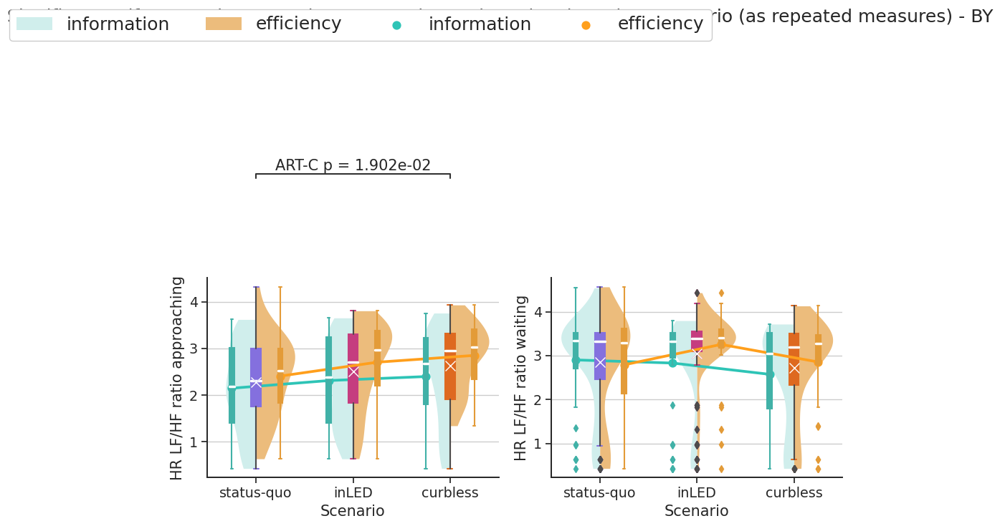

In [1606]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 7.5), sharey=False, sharex=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in structured questionnaires based on Scenario (as repeated measures) - {}".format(p_adj))

cols_of_interest = sorted(significant_HR_adv_metric)

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
    
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    ####### generic one ###########
    # pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
    #        ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
    #        ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    # annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    
    ######### custom one ART-C ##########
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments_sce[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.05) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax2, pairs=custom_pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax2, pairs=custom_pairs,
                   data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
    ######################################

    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        pairs=[("A", "B")]
        order=["A", "B"]
    else:
        pairs=[("A", "B"), ("B", "C"), ("A", "C")]
        order=["A", "B", "C"]
    
    ####### generic one ###########
    # pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # # annotator.apply_and_annotate()
    # annotator.apply_test().annotate(line_offset_to_group=0.4)
    ################################
    
    ######### custom one ART-C ##########
    

    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_scenarios[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="Scenario", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate(line_offset_to_group=0.5))
        # plt.show()
    ######################################
    

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
    
    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    if len(labels)==3: labels = ["status-quo", "inLED", "curbless"]
    else: labels = ["status-quo", "inLED"]

    ax[i].set_xticklabels(labels)
    # ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # or_label = ax[i].yaxis.get_label()
        # ax[i].set_ylabel("information treatment")
    relabel(ax[i], col_name)
        

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', fontsize="large", ncols=4, framealpha=1)
plt.tight_layout()
plt.show()

# test: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel.

In [1581]:
cols_of_interest = ["sub3_HR_LF_HF_ratio"]#dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_kw(metric, 
                 fixed_effects="scenario__treatment_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for sub3_HR_LF_HF_ratio

	Kruskal-Wallis rank sum test

data:  sub3_HR_LF_HF_ratio by scenario__treatment_f
Kruskal-Wallis chi-squared = 8.8733, df = 5, p-value = 0.1142


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$sub3_HR_LF_HF_ratio and data$scenario__treatment_f 

             Aefficiency Ainformation Befficiency Binformation Cefficiency
Ainformation 1.00        -            -           -            -          
Befficiency  1.00        1.00         -           -            -          
Binformation 1.00        1.00         1.00        -            -          
Cefficiency  1.00        1.00         1.00        1.00         -          
Cinformation 1.00        1.00         0.16        1.00         1.00       

P value adjustment method: BY 


### running for **HR adv responses** HF/LF ratio (data_IdSc configuration dissolved): $Y_{phisiologic}$ ~ $G + (1|id)$

In [1607]:
display(dv_HR_adv)
# display(dv_repeated_num)

['whole_HR_LF_HF_ratio',
 'sub1_HR_LF_HF_ratio',
 'sub2_HR_LF_HF_ratio',
 'sub3_HR_LF_HF_ratio',
 'sub4_HR_LF_HF_ratio']

In [1615]:
def relabel(ax, col_name):
    if col_name=="sub2_HR_LF_HF_ratio":
        ax.set_ylabel("HR LF/HF ratio approaching")
    elif col_name=="sub3_HR_LF_HF_ratio":
        ax.set_ylabel("HR LF/HF ratio waiting")
    elif col_name=="whole_HR_LF_HF_ratio":
        ax.set_ylabel("HR LF/HF ratio whole task")

    return None
    
        

In [1609]:
# data.head(4)
# data[["Participant_ID","whole_HR_delta_mean"]]
# data[data["Participant_ID"]==6]
data.iloc[10:15]

,00_sss_active,00_sss_alert,00_sss_angry,00_sss_annoyed,00_sss_depressed,00_sss_disatisfied,00_sss_duration,00_sss_grouchy,00_sss_impatient,00_sss_irritated,00_sss_sad,01_attractiveness,01_attractiveness_duration,01_safe_to_cars,01_safe_to_pedestrians,01_safeness_duration,01_sss_active,01_sss_alert,01_sss_angry,01_sss_annoyed,01_sss_depressed,01_sss_disatisfied,01_sss_duration,01_sss_grouchy,01_sss_impatient,01_sss_irritated,01_sss_sad,01_success,01_will_Cross_night,01_will_cross_with_kid,01_willingness_duration,02_attractiveness,02_attractiveness_duration,02_safe_to_cars,02_safe_to_pedestrians,02_safeness_duration,02_sss_active,02_sss_alert,02_sss_angry,02_sss_annoyed,02_sss_depressed,02_sss_disatisfied,02_sss_duration,02_sss_grouchy,02_sss_impatient,02_sss_irritated,02_sss_sad,02_success,02_will_Cross_night,02_will_cross_with_kid,02_willingness_duration,03_attractiveness,03_attractiveness_duration,03_safe_to_cars,03_safe_to_pedestrians,03_safeness_duration,03_sss_active,03_sss_alert,03_sss_angry,03_sss_annoyed,03_sss_depressed,03_sss_disatisfied,03_sss_duration,03_sss_grouchy,03_sss_impatient,03_sss_irritated,03_sss_sad,03_success,03_will_Cross_night,03_will_cross_with_kid,03_willingness_duration,Black Screen,Config_recoded,Configuration,Day,EndDate,Participant ID,Participant_ID,Reached Curb,ResponseId,Scenario,Session Nr,Start,StartDate,Started Crossing,Started Walking,Successful?,a_attractiveness,a_attractiveness_duration,a_safe_to_cars,a_safe_to_pedestrians,a_safeness_duration,a_sss_active,a_sss_active_delta,a_sss_active_delta_neg,a_sss_alert,a_sss_alert_delta,a_sss_angry,a_sss_angry_delta,a_sss_annoyed,a_sss_annoyed_delta,a_sss_avg_delta,a_sss_depressed,a_sss_depressed_delta,a_sss_disatisfied,a_sss_disatisfied_delta,a_sss_duration,a_sss_grouchy,a_sss_grouchy_delta,a_sss_impatient,a_sss_impatient_delta,a_sss_irritated,a_sss_irritated_delta,a_sss_sad,a_sss_sad_delta,a_sss_std_delta,a_success,a_will_Cross_night,a_will_cross_with_kid,a_willingness_duration,age,b_attractiveness,b_attractiveness_duration,b_safe_to_cars,b_safe_to_pedestrians,b_safeness_duration,b_sss_active,b_sss_active_delta,b_sss_active_delta_neg,b_sss_alert,b_sss_alert_delta,b_sss_angry,b_sss_angry_delta,b_sss_annoyed,b_sss_annoyed_delta,b_sss_avg_delta,b_sss_depressed,b_sss_depressed_delta,b_sss_disatisfied,b_sss_disatisfied_delta,b_sss_duration,b_sss_grouchy,b_sss_grouchy_delta,b_sss_impatient,b_sss_impatient_delta,b_sss_irritated,b_sss_irritated_delta,b_sss_sad,b_sss_sad_delta,b_sss_std_delta,b_success,b_will_Cross_night,b_will_cross_with_kid,b_willingness_duration,baseline_HRV,baseline_HR_raw_RRintervals,baseline_HR_raw_timeseries,baseline_HR_raw_zeroTimestamps,baseline_heart_rate_len,baseline_heart_rate_mean,baseline_heart_rate_std,baseline_heart_rate_timeseries,c_attractiveness,c_attractiveness_duration,c_safe_to_cars,c_safe_to_pedestrians,c_safeness_duration,c_sss_active,c_sss_active_delta,c_sss_active_delta_neg,c_sss_alert,c_sss_alert_delta,c_sss_angry,c_sss_angry_delta,c_sss_annoyed,c_sss_annoyed_delta,c_sss_avg_delta,c_sss_depressed,c_sss_depressed_delta,c_sss_disatisfied,c_sss_disatisfied_delta,c_sss_duration,c_sss_grouchy,c_sss_grouchy_delta,c_sss_impatient,c_sss_impatient_delta,c_sss_irritated,c_sss_irritated_delta,c_sss_sad,c_sss_sad_delta,c_sss_std_delta,c_success,c_will_Cross_night,c_will_cross_with_kid,c_willingness_duration,city_live,city_raised,country_live,country_raised,country_raised_CH,driving_license,duration,duration_sub1,duration_sub2,duration_sub3,duration_sub4,duration_whole,experience_vr,experience_vr_recoded,experiments,experiments_recoded,fav,fav_cat,fav_duration,fav_recoded,gender,km_drive,km_drive_recoded,km_drive_recoded_num,m_walk,neighborhood,neighborhood_recoded,old_index_01,old_index_02,own_car,pref_transport,real_order_clean,real_order_raw,scenario__config,scenario__config_recoded,study,sub1_HRV,sub1_HRV_delta,sub1_HR_delta_mean,sub1_HR_delta_std,sub1_HR_delta_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_timeseries,su

#### $Y$~$treatment+(1|Participant\_ID)$

In [1671]:
cols_of_interest = dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc#.dropna(subset="experience_vr_recoded")#[data_IdSc["whole_HR_LF_HF_ratio"]<7]
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="treatment_group_f*driving_license_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for whole_HR_LF_HF_ratio
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_HR_LF_HF_ratio)

                                             F Df Df.res   Pr(>F)  
1 treatment_group_f                   4.285905  1     39 0.045097 *
2 driving_license_f                   0.259885  1     39 0.613072  
3 treatment_group_f:driving_license_f 0.027259  1     39 0.869715  
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast                         estimate    SE df t.ratio p.value
 efficiency,no - efficiency,yes      19.65 13.38 39   1.468  0.5516
 efficiency,no - information,no      38.85 14.55 39   2.670  0.1616
 efficiency,no - information,yes     30.97 13.98 39   2.216  0.2397
 efficiency,yes - information,no     19.20  9.88 39   1.943  0.2905
 efficiency,yes - information,yes    11.32  9.02 39   1.255  0.63

##### plot

whole_HR_LF_HF_ratio


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,18.273449,7.44921,41.0,2.453072,0.018506


pairs: [('efficiency', 'information')]
pvalues: [0.018505588194494223]
information vs. efficiency: Custom statistical test, P_val:1.851e-02
sub2_HR_LF_HF_ratio


,contrast,estimate,SE,df,t.ratio,p.value
1,efficiency - information,16.256854,7.048103,41.0,2.306557,0.026208


pairs: [('efficiency', 'information')]
pvalues: [0.026207912291611943]
information vs. efficiency: Custom statistical test, P_val:2.621e-02


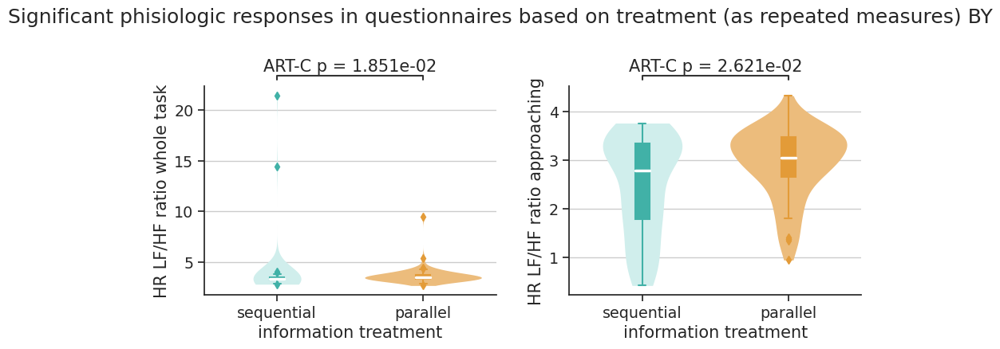

In [1632]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9.5, 4.5), sharey=False) # figsize=(6.665, 5.75)
ax = ax.flatten()
plt.suptitle("Significant phisiologic responses in questionnaires based on treatment (as repeated measures) {}".format(p_adj))

cols_of_interest = significant_metrics_art_anova_treatments
#["whole_heart_rate_mean", "whole_HR_delta_mean", "baseline_heart_rate_mean",
 #                   "whole_heart_rate_std", "whole_HR_delta_std", "baseline_heart_rate_std",
  #                  "baseline_heart_rate_len", "duration_sub2"]#significant_metrics_art_anova_treatments

palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)


for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data_IdSc#[data_IdSc["whole_HR_LF_HF_ratio"]<7]#[data["baseline_heart_rate_len"]>150]
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    
    sns.violinplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) #tc.tol_cset('pale')
    sns.boxplot(data=temp_chosen_df, x="treatment_group", y=col_name, ax=ax[i], palette=palette_treatments_sat, width=0.10)#, #tc.tol_cset('light')
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ####### generic one ###########
    # pairs=[("information", "efficiency")]
    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="treatment_group", y=col_name, hide_non_significant=True)
    # annotator.configure(test='Kruskal', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    ######### custom one ART-C ##########
    pairs=[("efficiency", "information")]
    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments[col_name]
    print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"], hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="treatment_group", y=col_name, order=["information", "efficiency"])
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
        
    ###############
    
    # # set custom Y axis lim
    # if col_name=="whole_HR_LF_HF_ratio": 
    #     ax[i].set_ylim(0, 7.5)

    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    labels = ["sequential", "parallel"]

    ax[i].set_xticklabels(labels)
    ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # ax[i].set_ylabel("information treatment")
    relabel(ax[i], col_name)
    
    sns.despine(trim=False)
plt.tight_layout()
plt.show()

In [1540]:
cols_of_interest = ["sub1_HR_LF_HF_ratio", "sub3_HR_LF_HF_ratio"]#dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_kw(metric, 
                 fixed_effects="treatment_group_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for sub1_HR_LF_HF_ratio

	Kruskal-Wallis rank sum test

data:  sub1_HR_LF_HF_ratio by treatment_group_f
Kruskal-Wallis chi-squared = 0.66506, df = 1, p-value = 0.4148


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$sub1_HR_LF_HF_ratio and data$treatment_group_f 

            efficiency
information 0.42      

P value adjustment method: BY 

 processing ART Anova for sub3_HR_LF_HF_ratio

	Kruskal-Wallis rank sum test

data:  sub3_HR_LF_HF_ratio by treatment_group_f
Kruskal-Wallis chi-squared = 1.9705, df = 1, p-value = 0.1604


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$sub3_HR_LF_HF_ratio and data$treatment_group_f 

            efficiency
information 0.16      

P value adjustment method: BY 


#### $Y$~$Scenario+(1|Participant\_ID)$

In [1672]:
cols_of_interest = dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_scenarios = []
dict_results_scenarios = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc#.dropna(subset="experience_vr_recoded")#[data_IdSc["whole_HR_LF_HF_ratio"]<7]
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*driving_license_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_scenarios)
    dict_results_scenarios[metric] = art_result


 processing ART Anova for whole_HR_LF_HF_ratio
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_HR_LF_HF_ratio)

                                    F Df Df.res   Pr(>F)  
1 Scenario_f                   2.0017  2     82 0.141660  
2 driving_license_f            4.5466  1     41 0.039021 *
3 Scenario_f:driving_license_f 2.8354  2     82 0.064464 .
---
Signif. codes:   0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 
 contrast      estimate    SE  df t.ratio p.value
 A,no - A,yes      1.44 12.55 112   0.115  1.0000
 A,no - B,no      13.77 13.12  82   1.049  1.0000
 A,no - B,yes     -1.73 12.55 112  -0.138  1.0000
 A,no - C,no       2.54 13.12  82   0.193  1.0000
 A,no - C,yes      8.44 12.55 112   0.672  1.0000
 A,yes - B,no     12.33 12.55 112   0.983  1.0000
 A,yes - B,yes    -3.17  8.64  82  -0.367  1.0000
 A,yes - C,no      1.10 12.55 112   0.088

#### $Y$~$treatment*Scenario+(1|Participant\_ID)$

In [1673]:
cols_of_interest = dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments_sce = []
dict_results_treatments_sce = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data_IdSc#.dropna(subset="experience_vr_recoded")#[data_IdSc["whole_HR_LF_HF_ratio"]<7]
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_art_r(metric, 
                 fixed_effects="Scenario_f*treatment_group_f*driving_license_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments_sce)
    dict_results_treatments_sce[metric] = art_result


 processing ART Anova for whole_HR_LF_HF_ratio
Analysis of Variance of Aligned Rank Transformed Data

Table Type: Analysis of Deviance Table (Type III Wald F tests with Kenward-Roger df) 
Model: Mixed Effects (lmer)
Response: art(whole_HR_LF_HF_ratio)

                                                       F Df Df.res     Pr(>F)
1 Scenario_f                                     14.0314  2     78 6.2333e-06
2 treatment_group_f                               3.3797  1     39  0.0736280
3 driving_license_f                              12.1608  1     39  0.0012243
4 Scenario_f:treatment_group_f                   11.3088  2     78 4.8685e-05
5 Scenario_f:driving_license_f                   11.8032  2     78 3.3249e-05
6 treatment_group_f:driving_license_f            22.9860  1     39 2.3911e-05
7 Scenario_f:treatment_group_f:driving_license_f 12.7902  2     78 1.5699e-05
                                                    
1 Scenario_f                                     ***
2 treatment_grou

##### plot

In [1604]:
order = sorted(list(set(data.scenario__treatment)))
order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
print(order)
list(itertools.combinations(order, 2))

['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']


[('Ainformation', 'Aefficiency'),
 ('Ainformation', 'Binformation'),
 ('Ainformation', 'Befficiency'),
 ('Ainformation', 'Cinformation'),
 ('Ainformation', 'Cefficiency'),
 ('Aefficiency', 'Binformation'),
 ('Aefficiency', 'Befficiency'),
 ('Aefficiency', 'Cinformation'),
 ('Aefficiency', 'Cefficiency'),
 ('Binformation', 'Befficiency'),
 ('Binformation', 'Cinformation'),
 ('Binformation', 'Cefficiency'),
 ('Befficiency', 'Cinformation'),
 ('Befficiency', 'Cefficiency'),
 ('Cinformation', 'Cefficiency')]

In [1621]:
# print(len(list_ART_significant_phisiological))
# print(list_ART_significant_phisiological)
# list_ART_significant_phisiological.remove("whole_c_change_mean")
# print(len(list_ART_significant_phisiological))
# print(list_ART_significant_phisiological)
significant_HR_adv_metric = list(set(significant_metrics_art_anova_treatments + significant_metrics_art_anova_treatments_sce + significant_metrics_art_anova_treatments_sce))
print(significant_HR_adv_metric)

['sub1_HR_LF_HF_ratio', 'sub3_HR_LF_HF_ratio', 'sub2_HR_LF_HF_ratio', 'whole_HR_LF_HF_ratio']


pairs: []
pvalues: []
pairs: [('A', 'B')]
pvalues: [0.07366697636320081]
pairs: []
pvalues: []
pairs: []
pvalues: []
pairs: []
pvalues: []
pairs: [('B', 'C')]
pvalues: [0.054871237834518076]
pairs: []
pvalues: []
pairs: []
pvalues: []


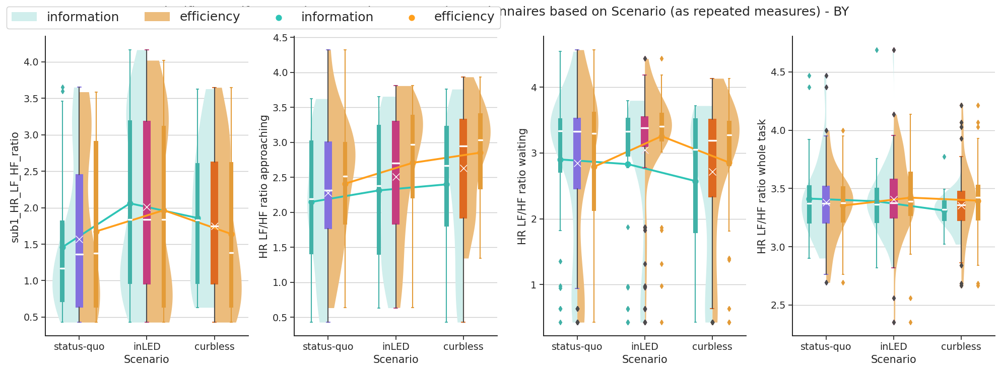

In [1623]:
sns.set(font_scale=1.25)
sns.set_style("ticks")

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 7.5), sharey=False, sharex=False)
ax = ax.flatten()
plt.suptitle("Significant self-reported answers in structured questionnaires based on Scenario (as repeated measures) - {}".format(p_adj))

cols_of_interest = sorted(significant_HR_adv_metric)

## palettes
palette_scenarios = ibm_01_d#["#A800F5", "#0014F5", "#0CCDF5"]
palette_treatments_sat = ["#2ec4b6", "#ff9f1c"] #["#B9F505", "#F57F18"]
palette_treatments_pale = ["#cbf3f0", "#ffbf69"]#["#E8F5B4", "#F5CFAE"]

def numfmt(x, pos):
    s = f'{x/1000:,.0f}' #<----
    return s

yfmt = tkr.FuncFormatter(numfmt)

for i in range(len(cols_of_interest)):
    
    col_name = cols_of_interest[i]
    ax[i].yaxis.grid(True)
    
    if col_name.endswith("trans"): col_name=col_name[:-6]
    
    # selecting the right dataset
    chosen_df = data
    
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, col_name)
    
    ######### Separated violin plots ##########
    
    ###### CUSTOMIZATION #####
    
    boxprops = dict(alpha=0.5, zorder=2, linestyle='-', linewidth=0, color="w", facecolor='w')
    flierprops = dict(marker='o', markerfacecolor='black', markersize=5, markeredgecolor='none', zorder=2, alpha=0.75)
    medianprops = dict(linewidth=3, color='w', zorder=2)
    meanlineprops = dict(linewidth=3, color='w', marker='x', markeredgecolor='w', markerfacecolor='w', zorder=2)
    meanprops= dict(marker='x', markerfacecolor='white', markersize=10, markeredgecolor='white', zorder=10)
    whiskerprops=dict(color="w", zorder=2, alpha=0.5)
    capprops=dict(zorder=2, color="w", alpha=0.5)
    
    # secondary axis (higher z)
    # main axis (ax[i]) represents 3 scenarios (A, B, C)
    # secondary axis (ax2) represents 6 scenariosXtreatment groups
    ax2=ax[i].twiny()
    
    # splitted violin plots in primary axis
    sns.violinplot(data=temp_chosen_df, x="Scenario", hue="treatment_group", split=True, y=col_name, ax=ax[i], cut=0, palette=palette_treatments_pale, linewidth=0, inner=None) 
    #tc.tol_cset('pale') palette=["#cbf3f0", "#ffbf69"] (pale orange/green)
    
    # single separated violin plots
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]
    
    # sns.violinplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax[i], cut=0, palette=["#cbf3f0", "#ffbf69"]*3, linewidth=0, inner=None, order=order) #tc.tol_cset('pale') #ibm_01
    bp2 = sns.boxplot(data=temp_chosen_df, x="scenario__treatment", y=col_name, ax=ax2, palette=palette_treatments_sat*3, width=0.10, order=order)
    #, #tc.tol_cset('light') #ibm_02 palette=["#2ec4b6", "#ff9f1c"]*3 (sat green/orange*3)
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
   
    box_patches = [patch for patch in ax2.patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax2.lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    
    ##############
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.10, meanprops=meanprops)#, #tc.tol_cset('light') #palette=ibm_01_d
               # boxprops=boxprops, medianprops=medianprops, meanprops=meanlineprops, whiskerprops=whiskerprops, capprops=capprops, flierprops=dict())
    
    box_patches = [patch for patch in ax[i].patches if type(patch) == matplotlib.patches.PathPatch]
    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax[i].artists
    num_patches = len(box_patches)
    # print(len(ax[i].lines), num_patches)
    lines_per_boxplot = len(ax[i].lines) // num_patches
    # print(len(ax[i].lines))
    for i_i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        # col = (col[0]+0.1, col[1]+0.1, col[2]+0.1)
        # print(col)
        patch.set_edgecolor(col)
        patch.set(zorder=2)

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for j in range(len(ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)])):
            line = ax[i].lines[(i_i * lines_per_boxplot): ((i_i + 1) * lines_per_boxplot)][j]
            # print(i, i_i, line.get_data())
            if j!=4:
                line.set_color(col)
                line.set_mfc(col)  # facecolor of fliers
                line.set_mec(col)  # edgecolor of fliers
            else:
                line.set_color("w")
                line.set_linewidth(2.5)
    
    ##############
    
    
    
    
    
    # pointplots in main axis with means
    sns.pointplot(data=temp_chosen_df, x='Scenario', y=col_name, hue="treatment_group", estimator=np.mean,
                  dodge=0.5, palette=palette_treatments_sat, capsize=.1, ci=None, ax=ax[i], lw=0) # errobar=("pi",0.5) palette=["#2ec4b6", "#ff9f1c"] (sat green/orange)
    
    # overall mean per scenario
    sns.boxplot(data=temp_chosen_df, x="Scenario", y=col_name, showmeans=True,
                ax=ax[i], palette=palette_scenarios, width=0.0, meanprops=meanprops) #palette=ibm_01_d
    
    # sns.pointplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               dodge=False, palette=["#2ec4b6", "#ff9f1c"], capsize=.1, ax=ax[i], scale=0.25, order=order, join=True)
    # sns.lineplot(data=temp_chosen_df, x='scenario__treatment', y=cols_of_interest[i], hue="treatment_group", estimator=np.median,
    #               palette=["#2ec4b6", "#ff9f1c"], ax=ax[i], sort=False)
    
    ####### generic one ###########
    # pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
    #        ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
    #        ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    # annotator = Annotator(ax2, pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # annotator.apply_and_annotate()
    ################################
    
    
    ######### custom one ART-C ##########
    
    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'),
           ('Aefficiency', 'Befficiency'),
           ('Ainformation', 'Binformation')]
    
    else:
        order = ['Ainformation', 'Aefficiency', 'Binformation', 'Befficiency', 'Cinformation', 'Cefficiency']
        pairs= [('Aefficiency', 'Ainformation'), ('Befficiency', 'Binformation'), ('Cefficiency', 'Cinformation'),
           ('Aefficiency', 'Befficiency'), ('Befficiency', 'Cefficiency'), ('Aefficiency', 'Cefficiency'),
           ('Ainformation', 'Binformation'), ('Binformation', 'Cinformation'), ('Ainformation', 'Cinformation')]

    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{},{} - {},{}".format(pair[0][0], pair[0][1:], pair[1][0], pair[1][1:])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_treatments_sce[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax2, pairs=custom_pairs, data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax2, pairs=custom_pairs,
                   data=temp_chosen_df, x="scenario__treatment", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate())
        # plt.show()
    ######################################

    if (col_name.endswith("_angle_change_mean") or col_name.endswith("_angle_change_std") or 
        col_name.endswith("_angle_change_mean_trans") or col_name.endswith("_angle_change_std_trans") or
        col_name.endswith("_a_change_mean") or col_name.endswith("_a_change_std") or
        col_name.endswith("_a_change_mean_trans") or col_name.endswith("_a_change_std_trans") or
        col_name.endswith("_b_change_mean") or col_name.endswith("_b_change_std") or
        col_name.endswith("_b_change_mean_trans") or col_name.endswith("_b_change_std_trans") or
        col_name.endswith("_c_change_mean") or col_name.endswith("_c_change_std") or
        col_name.endswith("_c_change_mean_trans") or col_name.endswith("_c_change_std_trans")):
        pairs=[("A", "B")]
        order=["A", "B"]
    else:
        pairs=[("A", "B"), ("B", "C"), ("A", "C")]
        order=["A", "B", "C"]
    
    ####### generic one ###########
    # pairs=[("A", "B"), ("B", "C"), ("A", "C")]

    # annotator = Annotator(ax[i], pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
    # annotator.configure(test='Mann-Whitney', text_format='full', loc='outside', comparisons_correction="Holm-Bonferroni")
    # # annotator.apply_and_annotate()
    # annotator.apply_test().annotate(line_offset_to_group=0.4)
    ################################
    
    ######### custom one ART-C ##########
    

    new_pairs=[]
    map_pairs = dict()
    for pair in pairs:
        newpair = "{} - {}".format(pair[0], pair[1])
        new_pairs.append(newpair)
        map_pairs[newpair] = pair
    
    value = dict_results_scenarios[col_name]
    # print(col_name)
    # display(value["model_anova"])
    df_contrasts = value["posthoc"][(value["posthoc"]["p.value"]<0.15) & (value["posthoc"]["contrast"].isin(new_pairs))]
    # display(df_contrasts)
    
    test_short_name = 'ART-C'
    custom_pairs = []
    custom_pvalues = []
    
    for index, row in df_contrasts.iterrows(): 
        # print("Performing ART-C test:",map_pairs[row["contrast"]], "estimate={:.2e} p-value={:.2e}".format(row["estimate"], row["p.value"]))
        custom_pairs.append(map_pairs[row["contrast"]])
        custom_pvalues.append(row["p.value"])
    print("pairs:", custom_pairs)
    print("pvalues:", custom_pvalues)
    if len(custom_pairs)>0:
        annot = Annotator(ax[i], pairs=custom_pairs, data=temp_chosen_df, x="Scenario", y=col_name, order=order, hide_non_significant=True)
        annot.new_plot(ax=ax[i], pairs=custom_pairs,
                   data=temp_chosen_df, x="Scenario", y=col_name, order=order)
        (annot
         .configure(test=None, test_short_name="ART-C", text_format="full", loc="outside")
         .set_pvalues(pvalues=custom_pvalues)
         .annotate(line_offset_to_group=0.5))
        # plt.show()
    ######################################
    

    # hide secondary x axis
    # ax2.set_xticks([])
    ax2_axis = ax2.axes.get_xaxis()
    ax2_axis.set_visible(False)
    ax2.tick_params(top=False)  # remove the ticks

    sns.despine(trim=False)
    # remove individual legend
    ax[i].get_legend().remove()
    # ax_2[i].get_legend().remove()
    
    # update labels
    labels = [item.get_text() for item in ax[i].get_xticklabels()]
    if len(labels)==3: labels = ["status-quo", "inLED", "curbless"]
    else: labels = ["status-quo", "inLED"]

    ax[i].set_xticklabels(labels)
    # ax[i].set_xlabel("information treatment")
    
    if col_name.startswith("duration"): 
        ax[i].yaxis.set_major_formatter(yfmt)
        # or_label = ax[i].yaxis.get_label()
        # ax[i].set_ylabel("information treatment")
    relabel(ax[i], col_name)
        

# create global legend
handles, labels = ax[i].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', fontsize="large", ncols=4, framealpha=1)
plt.tight_layout()
plt.show()

# test: t-test_ind, t-test_welch, t-test_paired, Mann-Whitney, Mann-Whitney-gt, Mann-Whitney-ls, Levene, Wilcoxon, Kruskal, Brunner-Munzel.

In [1581]:
cols_of_interest = ["sub3_HR_LF_HF_ratio"]#dv_HR_adv#["whole_HR_LF_HF_ratio"]
# cols_of_interest = dv_repeated_HR_num

significant_metrics_art_anova_treatments = []
dict_results_treatments = dict()
for i in range(len(cols_of_interest)):
  
    metric = cols_of_interest[i]
    
    # if metric.endswith("whole") or metric.startswith("whole"):
    
#     metric = cols_of_interest[i]
#     # print(metric)

    # selecting the right dataset
    # if metric in dv_repeated_cat or metric in dv_repeated_num:
    chosen_df = data
    # else:
    #     chosen_df = data_unique
#     #check and transform if needed for skewness
#     metric, txt = check_and_transform_for_skewness(chosen_df, metric)
    # drop bad C scenario data
    temp_chosen_df = filter_for_missing_c_scenario_angles(chosen_df, metric)
    
    art_result = computer_kw(metric, 
                 fixed_effects="scenario__treatment_f",
                 random_effects="(1|Participant_ID)",
                 p_adj=p_adj,
                 data=temp_chosen_df, 
                 list_significant_metrics=significant_metrics_art_anova_treatments)
    dict_results_treatments[metric] = art_result


 processing ART Anova for sub3_HR_LF_HF_ratio

	Kruskal-Wallis rank sum test

data:  sub3_HR_LF_HF_ratio by scenario__treatment_f
Kruskal-Wallis chi-squared = 8.8733, df = 5, p-value = 0.1142


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$sub3_HR_LF_HF_ratio and data$scenario__treatment_f 

             Aefficiency Ainformation Befficiency Binformation Cefficiency
Ainformation 1.00        -            -           -            -          
Befficiency  1.00        1.00         -           -            -          
Binformation 1.00        1.00         1.00        -            -          
Cefficiency  1.00        1.00         1.00        1.00         -          
Cinformation 1.00        1.00         0.16        1.00         1.00       

P value adjustment method: BY 


# HR frew analysis

In [928]:
data[dv_HR_raw].head(10)

,baseline_HR_raw_timeseries,baseline_HR_raw_RRintervals,baseline_HR_raw_zeroTimestamps,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps,sub1_HR_raw_timeseries,sub1_HR_raw_RRintervals,sub1_HR_raw_zeroTimestamps,sub2_HR_raw_timeseries,sub2_HR_raw_RRintervals,sub2_HR_raw_zeroTimestamps,sub3_HR_raw_timeseries,sub3_HR_raw_RRintervals,sub3_HR_raw_zeroTimestamps,sub4_HR_raw_timeseries,sub4_HR_raw_RRintervals,sub4_HR_raw_zeroTimestamps
0,[],[],[],"[84.0, 88.0, 91.0, 94.0, 91.0, 88.0, 85.0, 91....","[-4.0, 4.0, 3.0, 3.0, -3.0, -3.0, -3.0, 6.0, -...","[411000.0, 420000.0, 422000.0, 428000.0, 43100...","[84.0, 88.0, 91.0, 94.0, 91.0, 88.0]","[-4.0, 4.0, 3.0, 3.0, -3.0, -3.0]","[411000.0, 420000.0, 422000.0, 428000.0, 43100...","[85.0, 91.0, 88.0, 85.0, 82.0, 79.0, 82.0, 86.0]","[-3.0, 6.0, -3.0, -3.0, -3.0, -3.0, 3.0, 4.0]","[443000.0, 448000.0, 457000.0, 459000.0, 46300...",[83.0],[-3.0],[485000.0],"[87.0, 91.0]","[4.0, 4.0]","[498000.0, 500000.0]"
1,[],[],[],"[85.0, 82.0, 82.0, 85.0, 88.0, 92.0, 89.0, 86....","[-3.0, -3.0, 0.0, 3.0, 3.0, 4.0, -3.0, -3.0, 3...","[521000.0, 522000.0, 523000.0, 524000.0, 52600...",[85.0],[-3.0],[521000.0],"[82.0, 82.0, 85.0, 88.0, 92.0, 89.0]","[-3.0, 0.0, 3.0, 3.0, 4.0, -3.0]","[522000.0, 523000.0, 524000.0, 526000.0, 52800...",[],[],[],"[86.0, 89.0, 92.0, 89.0]","[-3.0, 3.0, 3.0, -3.0]","[533000.0, 537000.0, 539000.0, 543000.0]"
2,[],[],[],"[80.0, 89.0, 93.0, 97.0, 93.0, 85.0, 81.0, 78....","[3.0, 9.0, 4.0, 4.0, -4.0, -8.0, -4.0, -3.0, 3.0]","[691000.0, 696000.0, 697000.0, 699000.0, 71100...","[80.0, 89.0, 93.0, 97.0, 93.0]","[3.0, 9.0, 4.0, 4.0, -4.0]","[691000.0, 696000.0, 697000.0, 699000.0, 71100...","[85.0, 81.0, 78.0]","[-8.0, -4.0, -3.0]","[719000.0, 721000.0, 723000.0]",[],[],[],[81.0],[3.0],[727000.0]
3,[],[],[],"[80.0, 83.0, 86.0, 83.0, 80.0, 83.0, 80.0, 77.0]","[-4.0, 3.0, 3.0, -3.0, -3.0, 3.0, -3.0, -3.0]","[755000.0, 758000.0, 760000.0, 765000.0, 76800...",[],[],[],"[80.0, 83.0, 86.0]","[-4.0, 3.0, 3.0]","[755000.0, 758000.0, 760000.0]",[],[],[],"[83.0, 80.0, 83.0, 80.0, 77.0]","[-3.0, -3.0, 3.0, -3.0, -3.0]","[765000.0, 768000.0, 771000.0, 775000.0, 77700..."
4,[],[],[],"[92.0, 97.0, 100.0, 95.0, 92.0, 87.0, 84.0, 81...","[6.0, 5.0, 3.0, -5.0, -3.0, -5.0, -3.0, -3.0, ...","[888000.0, 890000.0, 892000.0, 895000.0, 89600...","[92.0, 97.0, 100.0, 95.0, 92.0, 87.0, 84.0, 81...","[6.0, 5.0, 3.0, -5.0, -3.0, -5.0, -3.0, -3.0, ...","[888000.0, 890000.0, 892000.0, 895000.0, 89600...",[77.0],[-4.0],[911000.0],[],[],[],"[74.0, 77.0]","[-3.0, 3.0]","[926000.0, 929000.0]"
5,[],[],[],[80.0],[-3.0],[957000.0],[],[],[],[],[],[],[],[],[],[80.0],[-3.0],[957000.0]
6,[],[],[],"[85, 81, 77, 74, 74, 80, 83, 86, 83, 86, 89, 8...","[-5.0, -4.0, -4.0, -3.0, 0.0, 6.0, 3.0, 3.0, -...","[368000.0, 370000.0, 371000.0, 372000.0, 37300...","[85, 81, 77, 74, 74, 80, 83, 86, 83, 86, 89, 85]","[-5.0, -4.0, -4.0, -3.0, 0.0, 6.0, 3.0, 3.0, -...","[368000.0, 370000.0, 371000.0, 372000.0, 37300...","[89, 92, 88, 81, 78]","[4.0, 3.0, -4.0, -7.0, -3.0]","[400000.0, 401000.0, 404000.0, 406000.0, 40700...","[81, 89, 92, 95]","[3.0, 8.0, 3.0, 3.0]","[410000.0, 412000.0, 413000.0, 414000.0]","[91, 88, 85, 81, 78, 82, 85, 90, 93, 90, 84, 7...","[-4.0, -3.0, -3.0, -4.0, -3.0, 4.0, 3.0, 5.0, ...","[417000.0, 418000.0, 419000.0, 420000.0, 42200..."
7,[],[],[],"[88, 82, 85, 88, 84, 81]","[-3.0, -6.0, 3.0, 3.0, -4.0, -3.0]","[462000.0, 464000.0, 469000.0, 472000.0, 47600...",[88],[-3.0],[462000.0],[82],[-6.0],[464000.0],[],[],[],"[85, 88, 84, 81]","[3.0, 3.0, -4.0, -3.0]","[469000.0, 472000.0, 476000.0, 478000.0]"
8,[],[],[],"[83, 86, 83, 80, 83]","[-4.0, 3.0, -3.0, -3.0, 3.0]","[501000.0, 508000.0, 510000.0, 519000.0, 52200...",[],[],[],[83],[-4.0],[501000.0],"[86, 83]","[3.0, -3.0]","[508000.0, 510000.0]","[80, 83]","[-3.0, 3.0]","[519000.0, 522000.0]"
9,[],[],[],"[80, 84, 81, 78, 81, 86, 83, 88, 93, 89, 89, 8...","[3.0, 4.0, -3.0, -3.0, 3.0, 5.0, -3.0, 5.0, 5....","[656000.0, 658000.0, 661000.0, 662000.0, 6

In [927]:
for index,row in data.unique.iterrows():
    print(len(row.baseline_heart_rate_timeseries))

410
410
410
410
410
410
366
366
366
366
366
366
366
219
219
219
219
219
219
219
200
200
200
200
200
200
234
234
234
234
234
234
250
250
250
250
250
250
261
261
261
261
261
261
293
293
293
293
293
293
293
320
320
320
320
320
320
245
245
245
245
245
245
245
162
162
162
162
162
162
28
28
28
28
28
28
331
331
331
331
331
331
331
338
338
338
338
338
338
17
17
17
17
17
17
257
257
257
257
257
257
276
276
276
276
276
276
276
235
235
235
235
235
235
235
221
221
221
221
221
221
341
341
341
341
341
341
302
302
302
302
302
302
191
191
191
191
191
191
6
6
6
6
6
6
373
373
373
373
373
373
217
217
217
217
217
217
358
358
358
358
358
358
242
242
242
242
242
242
252
252
252
252
252
252
68
68
68
294
294
294
294
294
294
294
66
66
66
66
66
66
230
230
230
230
230
230
244
244
244
244
244
244
216
216
216
216
216
216
199
199
199
199
199
199
199
261
261
261
261
261
261
261
215
215
215
215
215
215
258
258
258
258
258
258
166
166
166
166
166
166
452
452
452
452
452
452
167
167
167
167
167
167
167
194
194
194
194
1

In [965]:
whole_HR_raw = ["whole_HR_raw_timeseries", "whole_HR_raw_RRintervals", "whole_HR_raw_zeroTimestamps"]
data_HR_freq_analysis = data[iv_grouping + iv_treatments +["baseline_heart_rate_timeseries", "baseline_HRV", "treatment__scenario","whole_heart_rate_timeseries", "whole_HRV", "whole_HR_delta_timeseries", "duration_whole"] + whole_HR_raw]

In [966]:
data_HR_freq_analysis.to_csv("../processed_data/data_HR_freq_analysis.csv", sep="|")

In [967]:
data_HR_freq_analysis.to_pickle("../processed_data/data_HR_freq_analysis.pkl")

In [968]:
data_HR_freq_analysis.head(10)

,Participant_ID,old_index_02,real_order_clean,real_order_raw,treatment_group,Scenario,Configuration,Config_recoded,baseline_heart_rate_timeseries,baseline_HRV,treatment__scenario,whole_heart_rate_timeseries,whole_HRV,whole_HR_delta_timeseries,duration_whole,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps
0,1,0,0,0,information,A,RH,aRH,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationA,"[84.07194281334176, 84.0, 83.94966173222761, 8...",4.057934,"[-1.9595558095429766, -2.0314986228847403, -2....",96977,"[84.0, 88.0, 91.0, 94.0, 91.0, 88.0, 85.0, 91....","[-4.0, 4.0, 3.0, 3.0, -3.0, -3.0, -3.0, 6.0, -...","[411000.0, 420000.0, 422000.0, 428000.0, 43100..."
1,1,1,2,1,information,A,EV,pEV,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationA,"[90.1606085572717, 89.32448552490898, 87.66453...",2.722837,"[4.12910993438696, 3.2929869020242393, 1.63303...",32015,"[85.0, 82.0, 82.0, 85.0, 88.0, 92.0, 89.0, 86....","[-3.0, -3.0, 0.0, 3.0, 3.0, 4.0, -3.0, -3.0, 3...","[521000.0, 522000.0, 523000.0, 524000.0, 52600..."
2,1,2,10,2,information,B,RH,aRH,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationB,"[77.52587130229857, 77.77647650573256, 78.0853...",6.747817,"[-8.505627320586171, -8.25502211715218, -7.946...",56978,"[80.0, 89.0, 93.0, 97.0, 93.0, 85.0, 81.0, 78....","[3.0, 9.0, 4.0, 4.0, -4.0, -8.0, -4.0, -3.0, 3.0]","[691000.0, 696000.0, 697000.0, 699000.0, 71100..."
3,1,3,12,3,information,B,EV,pEV,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationB,"[79.54889941989036, 80.0, 80.68749195056465, 8...",2.738299,"[-6.482599202994379, -6.03149862288474, -5.344...",24969,"[80.0, 83.0, 86.0, 83.0, 80.0, 83.0, 80.0, 77.0]","[-4.0, 3.0, 3.0, -3.0, -3.0, 3.0, -3.0, -3.0]","[755000.0, 758000.0, 760000.0, 765000.0, 76800..."
4,1,4,20,4,information,C,RH,aRH,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationC,"[92.0, 94.64999021082622, 97.0, 99.02409779138...",9.160112,"[5.96850137711526, 8.618491587941477, 10.96850...",41994,"[92.0, 97.0, 100.0, 95.0, 92.0, 87.0, 84.0, 81...","[6.0, 5.0, 3.0, -5.0, -3.0, -5.0, -3.0, -3.0, ...","[888000.0, 890000.0, 892000.0, 895000.0, 89600..."
5,1,5,22,5,information,C,EV,pEV,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationC,"[83.84010090103631, 84.4836586906729, 84.94174...",5.760787,"[-2.191397721848432, -1.5478399322118435, -1.0...",29994,[80.0],[-3.0],[957000.0]
6,2,0,0,0,efficiency,A,RH,aRH,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyA,"[88.21580196239165, 86.59138095195577, 85.0, 8...",5.189758,"[2.145793572301585, 0.5213725618657037, -1.070...",82000,"[85, 81, 77, 74, 74, 80, 83, 86, 83, 86, 89, 8...","[-5.0, -4.0, -4.0, -3.0, 0.0, 6.0, 3.0, 3.0, -...","[368000.0, 370000.0, 371000.0, 372000.0, 37300..."
7,2,1,1,1,efficiency,A,RH,aRH,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyA,"[92.75187221590888, 91.2117123918662, 88.0, 84...",4.114812,"[6.681863825818809, 5.141704001776134, 1.92999...",25000,"[88, 82, 85, 88, 84, 81]","[-3.0, -6.0, 3.0, 3.0, -4.0, -3.0]","[462000.0, 464000.0, 469000.0, 472000.0, 47600..."
8,2,2,2,2,efficiency,A,EV,pEV,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyA,"[86.10681632777113, 85.16031238712219, 84.2508...",2.597361,"[0.036807937681061276, -0.9096960029678769, -1...",32000,"[83, 86, 83, 80, 83]","[-4.0, 3.0, -3.0, -3.0, 3.0]","[501000.0, 508000.0, 510000.0, 519000.0, 52200..."
9,2,3,10,3,efficiency,B,RH,aRH,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyB,"[77.766194881523, 80.0, 82.35850437777167, 84....",5.087168,"[-8.30381350856706, -6.0700083900900665, -3.71...",42000,"[80, 84, 81, 78, 81, 86, 83, 88, 93, 89, 89, 8...","[3.0, 4.0, -3.0, -3.0, 3.0, 5.0, -3.0, 5.0, 5....","[656000.0, 658000.0, 661000.0, 662000.0, 66600..."


In [941]:
df_test_HR = pd.read_csv("../processed_data/data_HR_freq_analysis.csv", sep="|")

In [969]:
df_test_HR = pd.read_pickle("../processed_data/data_HR_freq_analysis.pkl")

In [970]:
df_test_HR.head(10)

,Participant_ID,old_index_02,real_order_clean,real_order_raw,treatment_group,Scenario,Configuration,Config_recoded,baseline_heart_rate_timeseries,baseline_HRV,treatment__scenario,whole_heart_rate_timeseries,whole_HRV,whole_HR_delta_timeseries,duration_whole,whole_HR_raw_timeseries,whole_HR_raw_RRintervals,whole_HR_raw_zeroTimestamps
0,1,0,0,0,information,A,RH,aRH,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationA,"[84.07194281334176, 84.0, 83.94966173222761, 8...",4.057934,"[-1.9595558095429766, -2.0314986228847403, -2....",96977,"[84.0, 88.0, 91.0, 94.0, 91.0, 88.0, 85.0, 91....","[-4.0, 4.0, 3.0, 3.0, -3.0, -3.0, -3.0, 6.0, -...","[411000.0, 420000.0, 422000.0, 428000.0, 43100..."
1,1,1,2,1,information,A,EV,pEV,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationA,"[90.1606085572717, 89.32448552490898, 87.66453...",2.722837,"[4.12910993438696, 3.2929869020242393, 1.63303...",32015,"[85.0, 82.0, 82.0, 85.0, 88.0, 92.0, 89.0, 86....","[-3.0, -3.0, 0.0, 3.0, 3.0, 4.0, -3.0, -3.0, 3...","[521000.0, 522000.0, 523000.0, 524000.0, 52600..."
2,1,2,10,2,information,B,RH,aRH,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationB,"[77.52587130229857, 77.77647650573256, 78.0853...",6.747817,"[-8.505627320586171, -8.25502211715218, -7.946...",56978,"[80.0, 89.0, 93.0, 97.0, 93.0, 85.0, 81.0, 78....","[3.0, 9.0, 4.0, 4.0, -4.0, -8.0, -4.0, -3.0, 3.0]","[691000.0, 696000.0, 697000.0, 699000.0, 71100..."
3,1,3,12,3,information,B,EV,pEV,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationB,"[79.54889941989036, 80.0, 80.68749195056465, 8...",2.738299,"[-6.482599202994379, -6.03149862288474, -5.344...",24969,"[80.0, 83.0, 86.0, 83.0, 80.0, 83.0, 80.0, 77.0]","[-4.0, 3.0, 3.0, -3.0, -3.0, 3.0, -3.0, -3.0]","[755000.0, 758000.0, 760000.0, 765000.0, 76800..."
4,1,4,20,4,information,C,RH,aRH,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationC,"[92.0, 94.64999021082622, 97.0, 99.02409779138...",9.160112,"[5.96850137711526, 8.618491587941477, 10.96850...",41994,"[92.0, 97.0, 100.0, 95.0, 92.0, 87.0, 84.0, 81...","[6.0, 5.0, 3.0, -5.0, -3.0, -5.0, -3.0, -3.0, ...","[888000.0, 890000.0, 892000.0, 895000.0, 89600..."
5,1,5,22,5,information,C,EV,pEV,"[87.0, 82.0, 79.63793853918517, 79.0, 79.29091...",4.110243,informationC,"[83.84010090103631, 84.4836586906729, 84.94174...",5.760787,"[-2.191397721848432, -1.5478399322118435, -1.0...",29994,[80.0],[-3.0],[957000.0]
6,2,0,0,0,efficiency,A,RH,aRH,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyA,"[88.21580196239165, 86.59138095195577, 85.0, 8...",5.189758,"[2.145793572301585, 0.5213725618657037, -1.070...",82000,"[85, 81, 77, 74, 74, 80, 83, 86, 83, 86, 89, 8...","[-5.0, -4.0, -4.0, -3.0, 0.0, 6.0, 3.0, 3.0, -...","[368000.0, 370000.0, 371000.0, 372000.0, 37300..."
7,2,1,1,1,efficiency,A,RH,aRH,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyA,"[92.75187221590888, 91.2117123918662, 88.0, 84...",4.114812,"[6.681863825818809, 5.141704001776134, 1.92999...",25000,"[88, 82, 85, 88, 84, 81]","[-3.0, -6.0, 3.0, 3.0, -4.0, -3.0]","[462000.0, 464000.0, 469000.0, 472000.0, 47600..."
8,2,2,2,2,efficiency,A,EV,pEV,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyA,"[86.10681632777113, 85.16031238712219, 84.2508...",2.597361,"[0.036807937681061276, -0.9096960029678769, -1...",32000,"[83, 86, 83, 80, 83]","[-4.0, 3.0, -3.0, -3.0, 3.0]","[501000.0, 508000.0, 510000.0, 519000.0, 52200..."
9,2,3,10,3,efficiency,B,RH,aRH,"[81.0, 81.0, 79.37108594249385, 78.0, 78.31788...",5.843740,efficiencyB,"[77.766194881523, 80.0, 82.35850437777167, 84....",5.087168,"[-8.30381350856706, -6.0700083900900665, -3.71...",42000,"[80, 84, 81, 78, 81, 86, 83, 88, 93, 89, 89, 8...","[3.0, 4.0, -3.0, -3.0, 3.0, 5.0, -3.0, 5.0, 5....","[656000.0, 658000.0, 661000.0, 662000.0, 66600..."


# create html
with nbconvert

In [152]:
!pwd

/mnt/c/Users/jaargota/Documents/202202-Spring 2022/20220413-VR_experiment_Marc_Michael/repos/street-crossing-analysis/scripts


In [69]:
!jupyter nbconvert jasv_generate_summary_sessions_v0.65.ipynb --no-input --to html --TagRemovePreprocessor.remove_cell_tags='{"hide_code"}'

[NbConvertApp] Converting notebook jasv_generate_summary_sessions_v0.65.ipynb to html
[NbConvertApp] Writing 5798181 bytes to jasv_generate_summary_sessions_v0.65.html
